 .
 
<span style="font-size:30pt;font-family:Advent">Carbon Metalenses - Reloaded</span>

.

In [2]:
import meep as mp
%pylab inline
import h5py
import re
import os
from matplotlib.colors import ListedColormap
import pickle
from scipy.interpolate import interp1d
from scipy.optimize import curve_fit
# import seaborn as sns
from scipy.special import jn
import uuid
from tabulate import tabulate
import subprocess
#import multiprocessing as mp

Populating the interactive namespace from numpy and matplotlib


In [3]:
playground_dir = '/Users/juan/Temp/playground'
s4dir = '/Users/juan/Google Drive/Zia Lab/CEM/S4/S4'

# Aperture 10 um, NA = 0.1

## Mask design

### S4 bootstrap

In [201]:
def focal_length(na, aperture):
    return aperture/2 * np.sqrt(1/na**2-1)

In [202]:
def expand_sim_params(sim_params):
    sim_params['field_height'] = sim_params['post_height']
    sim_params['half_cell_width'] = sim_params['cell_width'] / 2.
    sim_params['excitation_frequency'] = 1. / sim_params['wavelength']
    sim_params['radius'] = sim_params['post_width'] / 2.
    sim_params['a1x'] = sim_params['cell_width']
    sim_params['a2x'] = sim_params['cell_width'] * 0.5
    sim_params['a2y'] = sim_params['cell_width'] * np.sqrt(3.)*0.5
    return sim_params

def post_phase(sim_params):
    
    '''Given the simulation parameters, 
    returns the electric field array(Exr, Eyr, Ezr, Exi, Eyi, Ezi) at (x_coord, y_coord, field_height)'''

    lua = '''
    S = S4.NewSimulation()
    -- specifying all lengths in microns.
    S:SetLattice({{{a1x},0}}, {{{a2x},{a2y}}}) -- 2D hexagonal lattice. {{1, 0}}, {{1/2, sqrt(3)/2}}
    S:SetNumG({num_G})

    S:AddMaterial('vacuum', {{1,0}})
    S:AddMaterial('substrate', {{{epsilon}, 0}}) 


    S:AddLayer(
        'bottom',    -- name
        0,           -- thickness
        'substrate') -- background material (semi-infinite)

    S:AddLayer(
       'forest',       -- name of the layer
       {post_height}, -- height of the layer
       'vacuum')       -- material of the layer

    S:AddLayer(
        'top',    -- new layer name
        0,        -- thickness
        'vacuum') -- background material (semi-infinite)

    -- patterning vacuum layer with cylindrical posts
    S:SetLayerPatternCircle(
        'forest', -- layer to pattern
        'substrate', -- material inside circle
        {{0,0}}, -- center of circle
        {radius} -- radius of cylinder
        ) 

    S:SetExcitationPlanewave(
        {{0,0}},  -- incidence angles (spherical coordinates: phi in [0,180], theta in [0,360])
        {{{s_amp},0}},  -- s-polarization amplitude and phase (in degrees)
        {{{p_amp},0}})  -- p-polarization amplitude and phase

    S:SetFrequency({excitation_frequency})

    print(S:GetEField({{{x_coord},{y_coord},{field_height}}}))
        '''.format(**sim_params)
    script_loc = (s4dir+'luascript-%s.lua') % str(uuid.uuid4())
    s4command = '"'+s4dir+'/S4-1.1.1-osx" "%s"' % (script_loc)
    lua_file = open(script_loc,'w')
    lua_file.write(lua)
    lua_file.close()
    result = subprocess.check_output(s4command,shell=True)
    !{'rm "%s"' % script_loc}
    return np.array([float(x) for x in result.decode().split('\t')])


In [203]:
def function_topper(x,y):
    clean_x = []
    clean_y = []
    # first determine if the top function will be increasing or decreasing
    if y[1] > y[0]:
        sign = 1
    elif y[1] < y[0]:
        sign = -1
    else:
        print('undetermined sign')
    yp_current = y[0]
    clean_x = [x[0]]
    clean_y = [y[0]]
    for index in range(len(x)-1):
        xp = x[index]
        yp = y[index]
        next_xp = x[index+1]
        next_yp = y[index+1]
        if sign == 1:
            if (next_yp > yp) and next_yp > max(clean_y):
                clean_x.append(xp)
                clean_y.append(yp)
        if sign == -1:
            if (next_yp < yp) and next_yp < min(clean_y):
                clean_x.append(xp)
                clean_y.append(yp)
    return np.array(clean_x), np.array(clean_y)

In [6]:
# p_pol
simulation_parameters = {
                        'wavelength': 0.532,
                        'post_width': 0.075,
                        'post_height': 1.5,
                        'cell_width': 0.25,
                        'epsilon': 5.8418,
                        'num_G' : 70,
                        'x_coord': 0,
                        'y_coord': 0,
                        'p_amp':1.,
                        's_amp':0.,
                        }
simulation_parameters = expand_sim_params(simulation_parameters)
min_width = 0.075
max_width = 0.15
post_widths = np.linspace(min_width,max_width,10)

phases = []
simulation_parameters['field_height'] = simulation_parameters['post_height']
for p_width in post_widths:
    simulation_parameters['post_width'] = p_width
    simulation_parameters = expand_sim_params(simulation_parameters)
    results = post_phase(simulation_parameters)
    Exr = results[0]
    Eyr = results[1]
    Ezr = results[2]
    Exi = results[3]
    Eyi = results[4]
    Ezi = results[5] 
    phases.append(np.arctan2(Exi, Exr)) # use for P pol
phases = np.array(phases)
phases = np.unwrap(phases)
phases = phases - phases[0]
p_phases = np.copy(phases)

# s_pol
simulation_parameters = {
                        'wavelength': 0.532,
                        'post_width': 0.075,
                        'post_height': 1.5,
                        'cell_width': 0.25,
                        'epsilon': 5.8418,
                        'num_G' : 70,
                        'x_coord': 0,
                        'y_coord': 0,
                        'p_amp':0.,
                        's_amp':1.,
                        }
simulation_parameters = expand_sim_params(simulation_parameters)

phases = []
simulation_parameters['field_height'] = simulation_parameters['post_height']
for p_width in post_widths:
    simulation_parameters['post_width'] = p_width
    simulation_parameters = expand_sim_params(simulation_parameters)
    results = post_phase(simulation_parameters)
    Exr = results[0]
    Eyr = results[1]
    Ezr = results[2]
    Exi = results[3]
    Eyi = results[4]
    Ezi = results[5]
    # compute the projection of the transverse field components along the direction of the incident polarization
    Ei = Exi * simulation_parameters['p_amp'] + Eyi * simulation_parameters['s_amp'] 
    Er = Exr * simulation_parameters['p_amp'] + Eyr * simulation_parameters['s_amp'] 
    phases.append(np.arctan2(Ei, Er))
phases = np.array(phases)
phases = np.unwrap(phases)
phases = phases - phases[0]
s_phases = np.copy(phases)

In [7]:
'max post width = %.2f um' % (np.sqrt(7)/4. * simulation_parameters['cell_width'])

'max post width = 0.17 um'

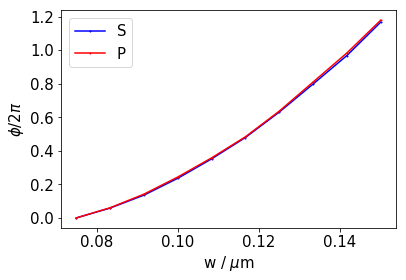

In [8]:
plt.rcParams.update({'font.size': 15})
plt.figure()
plt.plot(post_widths,s_phases/(2*np.pi),'ob-',ms=1.,label='S')
plt.plot(post_widths,p_phases/(2*np.pi),'or-',ms=1.,label='P')
plt.legend()
plt.xlabel('w / $\mu$m')
plt.ylabel('$\phi / 2 \pi $')
plt.show()

In [9]:
phases = np.copy(p_phases)

In [133]:
# carbon-phases-1549918555.pkl -> hexagonal lattice of 250 nm in width
# pickle.dump({'post_widths':post_widths,'phases': phases, 'simulation_parameters': simulation_parameters},
#             open('carbon-phases-1549918555.pkl','wb'))

### Find the field on a plane

In [259]:

simulation_parameters = {
                        'wavelength': 0.532,
                        'post_width': 0.05,
                        'post_height': 1.5,
                        'cell_width': 0.25,
                        'epsilon': 5.8418,
                        'num_G' : 70,
                        'x_coord': 0,
                        'y_coord': 0,
                        'p_amp':1.,
                        's_amp':0.,
                        }
simulation_parameters = expand_sim_params(simulation_parameters)

simulation_parameters['field_height'] = simulation_parameters['post_height']*3/4

x_coords = np.linspace(0,0.25,40)
y_coords = np.linspace(0,np.sqrt(3)*0.25,60)
s4_field = []
counter = 0
for y in y_coords:
    row = []
    print(counter, end=', ')
    counter += 1
    for x in x_coords:
        simulation_parameters['x_coord'] = x
        simulation_parameters['y_coord'] = y
        results = post_phase(simulation_parameters)
        Exr = results[0]
        Eyr = results[1]
        Ezr = results[2]
        Exi = results[3]
        Eyi = results[4]
        Ezi = results[5] 
        row.append(Exr**2+Eyr**2+Ezr**2+Exi**2+Eyi**2+Ezi**2)
    s4_field.append(row)

0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 

In [260]:
s4_field = np.array(s4_field)

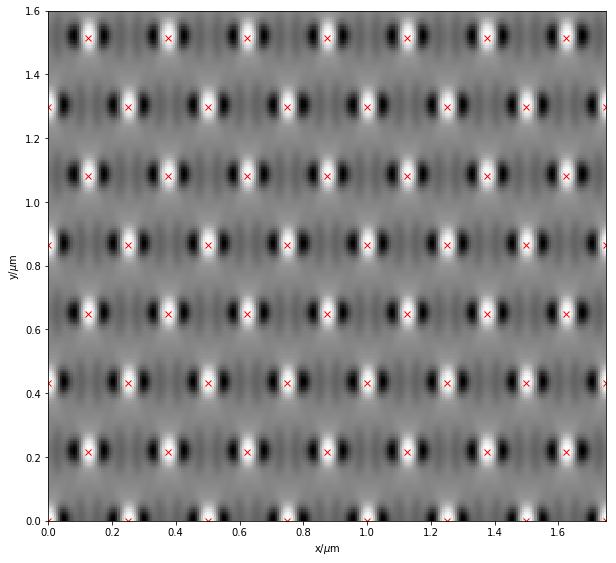

In [279]:
plt.figure(figsize=(10,10))
plt.imshow(np.tile(s4_field[:,:-1][:-1,:],(4,7)),origin='lower',
          extent=[0,7*0.25,0,4*np.sqrt(3)*0.25],cmap='binary')
plt.plot(metalens_params['axis_positions'][:,0],
         metalens_params['axis_positions'][:,1],'ro',marker='x')
plt.xlim(0,1.75)
plt.ylim(0,1.6)
plt.xlabel('x/$\mu$m')
plt.ylabel('y/$\mu$m')
plt.show()

### Find lattice vectors inside a circle

In [10]:
width = 0.25 #
aperture = 5 # full aperture
a1 = width*np.array([1,0])
a2 = width*np.array([0.5,0.5*np.sqrt(3)])
m_min = int(np.floor(-(aperture/(np.sqrt(3)*width))))
m_max = int(np.ceil((aperture/(np.sqrt(3)*width))))
# n_min = int(np.floor(-(2*aperture)/(3*width)))
# n_max = int(np.ceil((2*aperture)/(3*width)))
lattice_points = []
for n in range(m_min,m_max+1):
    for m in range(m_min,m_max+1):
        vec = n*a1 + m*a2
        if sum(vec**2)<=aperture**2/4.:
            lattice_points.append(vec)
lattice_points = np.array(lattice_points)
print("total lattice points = %d" % len(lattice_points))

total lattice points = 367


/Users/juan/anaconda3/envs/meep/lib/python3.6/site-packages/matplotlib/figure.py:98: MatplotlibDeprecationWarning: 
Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  "Adding an axes using the same arguments as a previous axes "


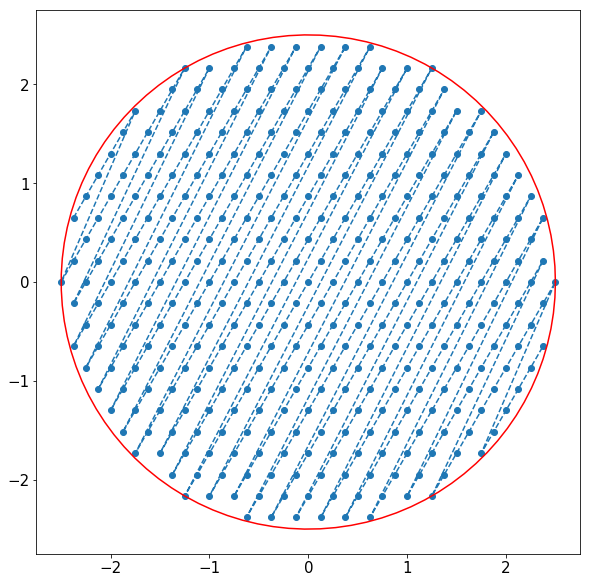

In [11]:
plt.figure(figsize=(10,10))
plt.plot(lattice_points[:,0],lattice_points[:,1],'o--')
plt.plot(aperture/2*np.cos(np.linspace(0,2*np.pi,100)),
        aperture/2*np.sin(np.linspace(0,2*np.pi,100)),'r')
plt.axes().set_aspect('equal')
plt.show()

In [14]:
def lattice_within(aperture, width):
    a1 = width*np.array([1,0])
    a2 = width*np.array([0.5,0.5*np.sqrt(3)])
    m_min = int(np.floor(-(aperture/(np.sqrt(3)*width))))
    m_max = int(np.ceil((aperture/(np.sqrt(3)*width))))
    lattice_points = []
    for n in range(m_min,m_max+1):
        for m in range(m_min,m_max+1):
            vec = n*a1 + m*a2
            if sum(vec**2)<=aperture**2/4.:
                lattice_points.append(vec)
    lattice_points = np.array(lattice_points)
    return lattice_points

### make the geometry for meep

In [15]:
post_widths = pickle.load(open('/Users/juan/Google Drive/Zia Lab/CEM/MEEP/carbon-phases-1549918555.pkl','rb'))['post_widths']
phases = pickle.load(open('/Users/juan/Google Drive/Zia Lab/CEM/MEEP/carbon-phases-1549918555.pkl','rb'))['phases']
simulation_parameters = pickle.load(open('/Users/juan/Google Drive/Zia Lab/CEM/MEEP/carbon-phases-1549918555.pkl','rb'))['simulation_parameters']

In [16]:
def make_2D_metalens_geometry(metalens_params):
    # first design the mask based on the given widths and corresponding phases
    widths = metalens_params['widths']
    phases = metalens_params['phases']
    wavelength = metalens_params['wavelength']
    good_widths = (widths >= metalens_params['min_width'])
    widths = widths[good_widths]
    phases = phases[good_widths]
    aperture = metalens_params['aperture']
    f = metalens_params['f']
    # compute the required phases based on the wavelength, focal length and number of unit cells
    if (max(phases)-min(phases)) < 2*np.pi:
        print((max(phases)-min(phases)))
        return "not a full phase coverage"
    x, y = function_topper(widths, phases)
    axis_positions = lattice_within(metalens_params['aperture'], metalens_params['unit cell size'])
    required_phases = -2*np.pi/wavelength*(np.sqrt(axis_positions[:,0]**2+axis_positions[:,1]**2+f**2)-f)
    required_phases = required_phases - min(required_phases)
    required_phases = required_phases % (2*np.pi)
    required_widths = np.interp(required_phases, y, x)
    # create the posts
    hairline = [mp.Cylinder(radius=w/2.,
                    height = metalens_params['post_height'],
                    center = mp.Vector3(position[0],
                                        position[1],
                                        (-metalens_params['H']/2
                                                  +metalens_params['sub_thickness']
                                                  +metalens_params['post_height']/2)),
                    axis = mp.Vector3(0, 0 , 1),
                    material = mp.Medium(epsilon = metalens_params['epsilon'])) for w, position in zip(required_widths, axis_positions)]
    # create the substrate
    substrate = [mp.Block(size = mp.Vector3(aperture,
                                            aperture,
                                            metalens_params['sub_thickness']),
                        center = mp.Vector3(0,
                                            0,
                                            -metalens_params['H']/2+metalens_params['sub_thickness']/2),
                        material = mp.Medium(epsilon = metalens_params['epsilon']))]
    metalens_params['required_phases'] = required_phases
    metalens_params['required_widths'] = required_widths
    metalens_params['axis_positions'] = axis_positions
    return metalens_params, substrate + hairline

In [17]:
metalens_params = {'post_height':1.5,
                  'NA':0.1,
                  'aperture': 10,
                  'sub_thickness': 5,
                  'air_space': 4,
                  'unit cell size': 0.25,
                  'epsilon': 5.8418,
                  'phases': phases,
                  'widths': post_widths,
                  'wavelength': 0.532,
                  'min_width': 0.05,
                  'pml width': 1,
                  'resolution': 30}

def aux_params(metalens_params):
    metalens_params['num of unit cells'] = int(metalens_params['aperture'] / metalens_params['unit cell size'])
    if metalens_params['num of unit cells'] % 2:
        pass
    else:
        metalens_params['num of unit cells'] += -1
    
    metalens_params['f'] = focal_length(metalens_params['NA'],metalens_params['aperture'])
    metalens_params['fcen'] = 1/metalens_params['wavelength']
    metalens_params['n'] = np.sqrt(metalens_params['epsilon'])
    
    metalens_params['H'] = metalens_params['sub_thickness'] + metalens_params['post_height'] + metalens_params['air_space'] # height of the simulation cell
    metalens_params['top_of_posts_coordinate'] = (-metalens_params['H']/2
                                        + metalens_params['sub_thickness']
                                        + metalens_params['post_height'])
    
    metalens_params['source_offset'] = (-metalens_params['H']/2
                                        + metalens_params['sub_thickness'] 
                                        - 3*metalens_params['wavelength'])
    metalens_params['near2far_offset'] = (-metalens_params['H']/2
                                          + metalens_params['sub_thickness'] 
                                          + metalens_params['post_height'] 
                                          + 3*metalens_params['wavelength'])
        
    metalens_params['f#'] = metalens_params['f'] / metalens_params['aperture']
    metalens_params['source width'] = 2. / metalens_params['fcen']
    metalens_params['simulation time'] = (metalens_params['source width'] 
                                          + metalens_params['n'] * metalens_params['sub_thickness'] / metalens_params['wavelength'] 
                                          + (metalens_params['H'] - metalens_params['sub_thickness']) / metalens_params['wavelength'])
    metalens_params['f#'] = metalens_params['aperture']/metalens_params['f']
    
    return metalens_params

metalens_params = aux_params(metalens_params)

# def run_checks(metalens_params):
#     for geometrical_feature in ['source_offset', 'near2far_offset']:
#         if metalens_params[geometrical_feature] > metalens_params['H']/2 - metalens_params['pml width']:
#             print(geometrical_feature," is out of bounds.")
#         if metalens_params[geometrical_feature] < -metalens_params['H']/2 + metalens_params['pml width']:
#             print(geometrical_feature," is out of bounds.")
#     else:
#         print("All checks passed.")
metalens_params, geometry = make_2D_metalens_geometry(metalens_params)

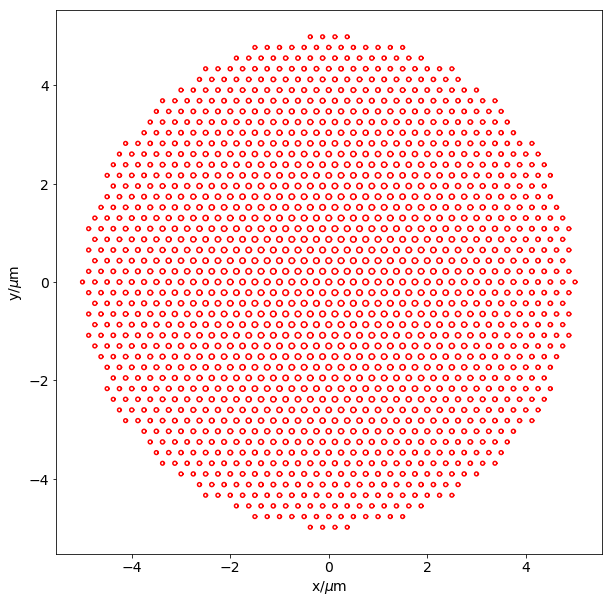

In [309]:
plt.rcParams.update({'font.size': 14})
plt.figure(figsize=(10,10))
angles = np.linspace(0,2*np.pi,50)
for width, center in zip(metalens_params['required_widths'],metalens_params['axis_positions']):
    radius = width/2
    plt.plot(radius*np.cos(angles) + center[0],
            radius*np.sin(angles) + center[1],'-',c='red')
plt.axes().set_aspect('equal')
plt.xlabel('x/$\mu$m')
plt.ylabel('y/$\mu$m')
plt.show()

In [ ]:
cell = mp.Vector3(metalens_params['aperture']+2*metalens_params['pml width'],
                  metalens_params['aperture']+2*metalens_params['pml width'],
                  metalens_params['H'])

pml_layers = [mp.PML(metalens_params['pml width'])]

sources = [mp.Source(src=mp.ContinuousSource(wavelength=metalens_params['wavelength'],
                                             width = metalens_params['source width']),
                    component=mp.Ex,
                    center=mp.Vector3(0,0,metalens_params['source_offset']),
                    size=mp.Vector3(metalens_params['aperture'],
                                    metalens_params['aperture'],
                                    0))]

sim = mp.Simulation(cell_size=cell,
                   boundary_layers=pml_layers,
                   geometry=geometry,
                   force_complex_fields = True,
                   sources=sources,
                   resolution=metalens_params['resolution'])

nearfield = sim.add_near2far(
   metalens_params['fcen'] , 0, 1,
   mp.Near2FarRegion(center=mp.Vector3(0, 0, metalens_params['near2far_offset']), 
                     size=mp.Vector3(metalens_params['aperture'],
                                    metalens_params['aperture'],
                                    0), weight=1.0))
sim.init_sim()
sim.run(until=1*metalens_params['simulation time'])

-----------
Initializing structure...
Meep: using complex fields.
Meep progress: 0.016666666666666666/34.1183382394385 = 0.0% done in 183.1s, 374558.2s to go
Meep progress: 0.03333333333333333/34.1183382394385 = 0.1% done in 187.6s, 191804.1s to go
Meep progress: 0.05/34.1183382394385 = 0.1% done in 192.0s, 130854.1s to go
Meep progress: 0.06666666666666667/34.1183382394385 = 0.2% done in 196.6s, 100396.3s to go
Meep progress: 0.08333333333333333/34.1183382394385 = 0.2% done in 201.0s, 82093.3s to go
Meep progress: 0.1/34.1183382394385 = 0.3% done in 205.6s, 69940.4s to go
Meep progress: 0.11666666666666667/34.1183382394385 = 0.3% done in 210.2s, 61255.1s to go
Meep progress: 0.13333333333333333/34.1183382394385 = 0.4% done in 214.8s, 54741.8s to go
Meep progress: 0.15/34.1183382394385 = 0.4% done in 219.3s, 49665.7s to go
Meep progress: 0.16666666666666666/34.1183382394385 = 0.5% done in 223.8s, 45589.7s to go
Meep progress: 0.18333333333333332/34.1183382394385 = 0.5% done in 228.4s, 

In [ ]:
!ding 1 "MEEP is made!"

In [ ]:
eps = sim.get_array(component=mp.Dielectric).transpose()
ez = sim.get_array(component=mp.Ez).transpose()
e2 = np.abs(ez)**2

In [ ]:
plt.figure(figsize=(10,20))
plt.imshow(eps[:,:,e2.shape[-1]//2],
           origin='lower',
          extent=[-metalens_params['aperture']/2-metalens_params['pml width'],
                  metalens_params['aperture']/2+metalens_params['pml width'],
                 -metalens_params['H']/2,metalens_params['H']/2])
plt.plot([-metalens_params['aperture']/2,metalens_params['aperture']/2],
        [metalens_params['source_offset']]*2,'g--',label='source')
plt.plot([-metalens_params['aperture']/2,metalens_params['aperture']/2],
        [-metalens_params['H']/2+metalens_params['sub_thickness']]*2,'w--',label='substrate interface')
plt.plot([-metalens_params['aperture']/2,metalens_params['aperture']/2],
        [metalens_params['top_of_posts_coordinate']]*2,'r--',label='top of posts')
plt.plot([-metalens_params['aperture']/2,metalens_params['aperture']/2],
        [metalens_params['near2far_offset']]*2,'b--',label='near 2 far')
plt.legend()
plt.xlabel('x/um')
plt.ylabel('z/um')
plt.savefig('/Users/juan/Google Drive/Zia Lab/Log/Graphs/3DMeep-posts.png',dpi=300)
plt.show()

In [ ]:
# pickle.dump({'eps': eps, 'ez' : ez, 'simulation_parameters': simulation_parameters},open('carbon-metalens-NA0p5-aperture-100um-complex-resolution-50-pitch-250nm.pkl','wb'))

In [ ]:
# pickle.dump({'eps': eps, 'ez' : ez, 'simulation_parameters': simulation_parameters},open('carbon-metalens-NA0p5-aperture-100um-complex-resolution-50-pitch-250nm.pkl','wb'))

In [ ]:
e2.shape

In [ ]:
plt.figure(figsize=(10,20))
plt.imshow(e2[:,:,e2.shape[-1]//2],
           origin='lower',
          extent=[-metalens_params['aperture']/2,metalens_params['aperture']/2,
                 -metalens_params['H']/2,metalens_params['H']/2])
plt.plot([-metalens_params['aperture']/2,metalens_params['aperture']/2],
        [metalens_params['source_offset']]*2,'g--',label='source')
plt.plot([-metalens_params['aperture']/2,metalens_params['aperture']/2],
        [-metalens_params['H']/2+metalens_params['sub_thickness']]*2,'w--',label='substrate interface')
plt.plot([-metalens_params['aperture']/2,metalens_params['aperture']/2],
        [metalens_params['top_of_posts_coordinate']]*2,'r--',label='top of posts')
plt.plot([-metalens_params['aperture']/2,metalens_params['aperture']/2],
        [metalens_params['near2far_offset']]*2,'b--',label='near 2 far')
# plt.legend()
plt.xlabel('x/um')
plt.ylabel('z/um')
plt.savefig('/Users/juan/Google Drive/Zia Lab/Log/Graphs/3DMeep-E2-xz.png',dpi=300)
plt.show()

In [ ]:
desired_z=metalens_params['top_of_posts_coordinate']
desired_index = int(np.interp(desired_z,
          np.linspace(-metalens_params['H']/2,metalens_params['H']/2,e2.shape[0]),
          np.array(list(range(e2.shape[0])))
         ))

In [ ]:
plt.figure(figsize=(10,10))
plt.imshow(e2[desired_index,:,:],
           origin='lower',
           extent=[-metalens_params['aperture']/2-metalens_params['pml width'],
                   metalens_params['aperture']/2+metalens_params['pml width'],
                  -metalens_params['aperture']/2-metalens_params['pml width'],
                   metalens_params['aperture']/2+metalens_params['pml width']])
plt.plot(metalens_params['aperture']/2*np.cos(np.linspace(0,2*np.pi,100)),
        metalens_params['aperture']/2*np.sin(np.linspace(0,2*np.pi,100)),'w--')
angles = np.linspace(0,2*np.pi,50)
for width, center in zip(metalens_params['required_widths'],metalens_params['axis_positions']):
    radius = width/2
    plt.plot(radius*np.cos(angles) + center[0],
            radius*np.sin(angles) + center[1],'-',c='w',lw=0.2)
plt.xlim(-metalens_params['aperture']/2-metalens_params['pml width'],
         metalens_params['aperture']/2+metalens_params['pml width'])
plt.ylim(-metalens_params['aperture']/2-metalens_params['pml width'],
         metalens_params['aperture']/2+metalens_params['pml width'])
plt.xlabel('x/um')
plt.ylabel('y/um')
plt.savefig('/Users/juan/Google Drive/Zia Lab/Log/Graphs/3DMeep-E2.png',dpi=300)
plt.show()

In [ ]:
print(tabulate([k, metalens_params[k]] for k in metalens_params if (type(metalens_params[k]) != list) and type(metalens_params[k]) != numpy.ndarray))

In [ ]:
num_farfield_points = 100
axis_values = np.linspace(0,metalens_params['f']*1.2, num_farfield_points)
faraway = np.array([sum(np.abs(np.array(sim.get_farfield(nearfield, mp.Vector3(0,0,z))))[:3]**2) for z in axis_values])

In [ ]:
plt.figure(figsize=(10,2.5))
plt.plot(axis_values, faraway/max(faraway))
plt.xlabel('z / $\mu$m')
plt.ylabel('$\propto|E|^2$')
plt.plot([metalens_params['f']]*2,
        [0,1],label='focal_plane')
plt.ylim(0,1.02)
plt.xlim(0,metalens_params['f']*1.2)
plt.show()

In [111]:
ez = pickle.load(open('/Users/juan/Google Drive/Zia Lab/CEM/MEEP/3d/carbon-dictionary-1549918555.pkl','rb'))['ez']

In [112]:
metalens_params = pickle.load(open('/Users/juan/Google Drive/Zia Lab/CEM/MEEP/3d/carbon-dictionary-1549918555.pkl','rb'))['metalens_params']

In [113]:
e2 = np.abs(ez)**2

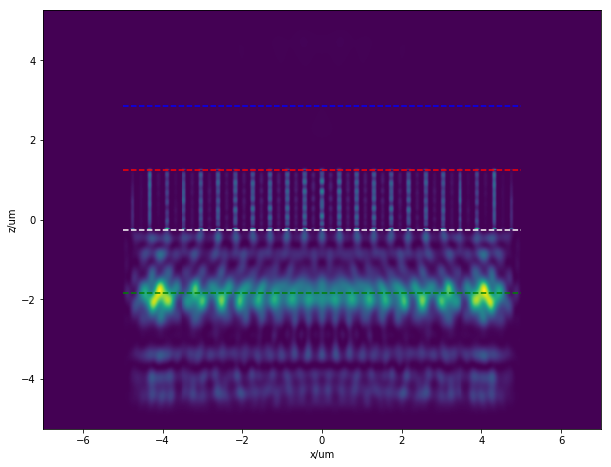

In [117]:
plt.figure(figsize=(10,20))
plt.imshow(e2[:,:,e2.shape[-1]//2],
           origin='lower',
          extent=[-metalens_params['aperture']/2-2*metalens_params['pml width'],
                  metalens_params['aperture']/2+2*metalens_params['pml width'],
                 -metalens_params['H']/2,
                  metalens_params['H']/2])
plt.plot([-metalens_params['aperture']/2,metalens_params['aperture']/2],
        [metalens_params['source_offset']]*2,'g--',label='source')
plt.plot([-metalens_params['aperture']/2,metalens_params['aperture']/2],
        [-metalens_params['H']/2+metalens_params['sub_thickness']]*2,'w--',label='substrate interface')
plt.plot([-metalens_params['aperture']/2,metalens_params['aperture']/2],
        [metalens_params['top_of_posts_coordinate']]*2,'r--',label='top of posts')
plt.plot([-metalens_params['aperture']/2,metalens_params['aperture']/2],
        [metalens_params['near2far_offset']]*2,'b--',label='near 2 far')
# plt.legend()
plt.xlabel('x/um')
plt.ylabel('z/um')
#plt.savefig('/Users/juan/Google Drive/Zia Lab/Log/Graphs/3DMeep-E2-xz.png',dpi=300)
plt.show()

In [118]:
desired_z=metalens_params['top_of_posts_coordinate']
desired_index = int(np.interp(desired_z,
          np.linspace(-metalens_params['H']/2,metalens_params['H']/2,e2.shape[0]),
          np.array(list(range(e2.shape[0])))
         ))

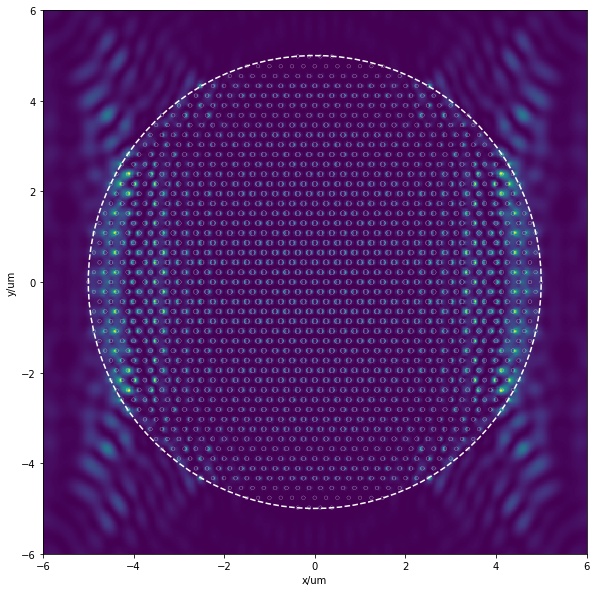

In [119]:
plt.figure(figsize=(10,10))
plt.imshow(e2[desired_index-2,:,:],
           origin='lower',
           extent=[-metalens_params['aperture']/2-2*metalens_params['pml width'],
                   metalens_params['aperture']/2+2*metalens_params['pml width'],
                  -metalens_params['aperture']/2-2*metalens_params['pml width'],
                   metalens_params['aperture']/2+2*metalens_params['pml width']])
plt.plot(metalens_params['aperture']/2*np.cos(np.linspace(0,2*np.pi,100)),
        metalens_params['aperture']/2*np.sin(np.linspace(0,2*np.pi,100)),'w--')
angles = np.linspace(0,2*np.pi,50)
for width, center in zip(metalens_params['required_widths'],metalens_params['axis_positions']):
    radius = width/2
    plt.plot(radius*np.cos(angles) + center[0],
            radius*np.sin(angles) + center[1],'-',c='w',lw=0.2)
plt.xlim(-metalens_params['aperture']/2-metalens_params['pml width'],
         metalens_params['aperture']/2+metalens_params['pml width'])
plt.ylim(-metalens_params['aperture']/2-metalens_params['pml width'],
         metalens_params['aperture']/2+metalens_params['pml width'])
plt.xlabel('x/um')
plt.ylabel('y/um')
#plt.savefig('/Users/juan/Google Drive/Zia Lab/Log/Graphs/3DMeep-E2.png',dpi=300)
plt.show()

In [120]:
for i in range(e2.shape[0]):
# for i in range(2):
    print(i,end=', ')
#     if i == 1:
#         break
    plt.figure(figsize=(10,10))
    plt.imshow(e2[i,:,:],
               origin='lower',
               extent=[-metalens_params['aperture']/2-2*metalens_params['pml width'],
                       metalens_params['aperture']/2+2*metalens_params['pml width'],
                      -metalens_params['aperture']/2-2*metalens_params['pml width'],
                       metalens_params['aperture']/2+2*metalens_params['pml width']])
    plt.xlim(-metalens_params['aperture']/2-2*metalens_params['pml width'],
             metalens_params['aperture']/2+2*metalens_params['pml width'])
    plt.ylim(-metalens_params['aperture']/2-2*metalens_params['pml width'],
             metalens_params['aperture']/2+2*metalens_params['pml width'])
    plt.xlabel('x/$\mu$m')
    plt.ylabel('y/$\mu$m')
    plt.savefig('/Users/juan/Google Drive/Zia Lab/CEM/MEEP/3d/slice-%d.png'%i,dpi=300)
    plt.close()

0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 

In [121]:
desired_indices = np.interp(np.array(list(range(e2.shape[0]))),
          np.linspace(-metalens_params['H']/2,metalens_params['H']/2,e2.shape[0]),
          np.array(list(range(e2.shape[0])))
         )

In [122]:
for i in range(e2.shape[0]):
    print(i,end=', ')
    thisz = np.linspace(-metalens_params['H']/2,metalens_params['H']/2,e2.shape[0])[i]
#     if i==10:
#         break
    plt.figure(figsize=(10,10))
    plt.imshow(np.log(e2[:,:,e2.shape[-1]//2]),
              origin='lower',
              extent=[-metalens_params['aperture']/2-2*metalens_params['pml width'],
                      metalens_params['aperture']/2+2*metalens_params['pml width'],
                     -metalens_params['H']/2,metalens_params['H']/2])

    # plt.plot([-metalens_params['aperture']/2,metalens_params['aperture']/2],
    #         [-metalens_params['H']/2+metalens_params['sub_thickness']]*2,'w--',
    #          lw=0.5)
    plt.plot([-metalens_params['aperture']/2-2*metalens_params['pml width'],
             metalens_params['aperture']/2+2*metalens_params['pml width']],
            [thisz]*2,
            'w--')
    plt.text(0,4.2,'z = %.2f $\mu$m' % thisz,ha='center',fontsize=20)
    plt.axis('off')
    plt.savefig('/Users/juan/Google Drive/Zia Lab/CEM/MEEP/3d/navigator-%d.png'%i,dpi=300)
    plt.close()

0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 

In [75]:
!ding 1 "done with figs"

In [123]:
for i in range(e2.shape[0]):
    print(i,end=', ')
    os.system('cd 3d; convert +append navigator-%d.png slice-%d.png theaterh-%d.png' % (i,i,i))
    os.system('cd 3d; convert -append navigator-%d.png slice-%d.png theaterv-%d.png' % (i,i,i))

0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 

In [124]:
!ffmpeg -framerate 30 -i ./3d/theaterh-%01 d.png -c:v libx264 -profile:v high -vb 20M -pix_fmt yuv420p ./3d/3dmeeph.mp4
!ffmpeg -framerate 30 -i ./3d/theaterv-%01d.png -c:v libx264 -profile:v high -vb 20M -pix_fmt yuv420p ./3d/3dmeepv.mp4

ffmpeg version 4.0.2 Copyright (c) 2000-2018 the FFmpeg developers
  built with Apple LLVM version 9.1.0 (clang-902.0.39.2)
  configuration: --prefix=/usr/local/Cellar/ffmpeg/4.0.2 --enable-shared --enable-pthreads --enable-version3 --enable-hardcoded-tables --enable-avresample --cc=clang --host-cflags= --host-ldflags= --enable-gpl --enable-libmp3lame --enable-libx264 --enable-libxvid --enable-opencl --enable-videotoolbox --disable-lzma
  libavutil      56. 14.100 / 56. 14.100
  libavcodec     58. 18.100 / 58. 18.100
  libavformat    58. 12.100 / 58. 12.100
  libavdevice    58.  3.100 / 58.  3.100
  libavfilter     7. 16.100 /  7. 16.100
  libavresample   4.  0.  0 /  4.  0.  0
  libswscale      5.  1.100 /  5.  1.100
  libswresample   3.  1.100 /  3.  1.100
  libpostproc    55.  1.100 / 55.  1.100
Input #0, image2, from './3d/theaterh-%01d.png':
  Duration: 00:00:14.00, start: 0.000000, bitrate: N/A
    Stream #0:0: Video: png, rgba(pc), 6000x3000 [SAR 11811:11811 DAR 2:1], 30 fps, 30

In [125]:
!ding 1 "movie made"

### Varying resolution simulations run with p-MEEP

In [129]:
[f for f in os.listdir('/Users/juan/Google Drive/Zia Lab/CEM/MEEP/3d') if f[-3:]=='pkl']

['carbon-efield-1549918555.pkl',
 'carbon-dictionary-1550182871.pkl',
 'carbon-dictionary-1550182079.pkl',
 'carbon-efield-1550182315.pkl',
 'carbon-efield-1550181751.pkl',
 'carbon-efield-1550184979.pkl',
 'carbon-dictionary-1550182384.pkl',
 'carbon-dictionary-1549918555.pkl',
 'carbon-efield-1549918555-resolution30.pkl',
 'carbon-efield-1550181559.pkl',
 'carbon-efield-1550182871.pkl',
 'carbon-efield-1550182079.pkl',
 'carbon-efield-1549918555-resolution40.pkl',
 'carbon-dictionary-1550182315.pkl',
 'carbon-dictionary-1550184979.pkl',
 'carbon-efield-1550182384.pkl',
 'carbon-dictionary-1550181751.pkl']

In [146]:
pkls=['1550184979','1550182871','1550182384','1550182315']
faraway_many_resolutions = []
many_dictionaries = []
for pkl in pkls:
    pick = pickle.load(open('/Users/juan/Google Drive/Zia Lab/CEM/MEEP/3d/carbon-dictionary-%s.pkl' % pkl,'rb'))
    faraway_many_resolutions.append(pick['farfield'])
    many_dictionaries.append(pick['metalens_params'])
axis_values = pick['axis_values']
del(pick)

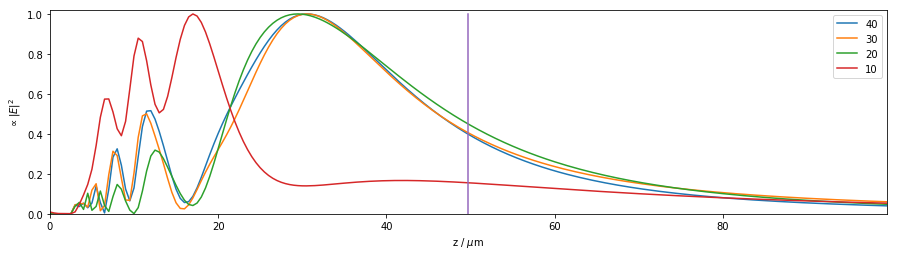

In [148]:
plt.figure(figsize=(1.5*10,1.5*2.5))
for far, dic in zip(faraway_many_resolutions, many_dictionaries):
    plt.plot(axis_values,far/max(far),label=dic['resolution'])
plt.xlabel('z / $\mu$m')
plt.ylabel('$\propto|E|^2$')
plt.legend()
plt.plot([metalens_params['f']]*2,
        [0,1],label='focal_plane')
plt.ylim(0,1.02)
plt.xlim(0,metalens_params['f']*2)
plt.show()

In [151]:
for dic in many_dictionaries:
    #print(tabulate([k, dic[k]] for k in metalens_params if (type(dic[k]) != list) and type(dic[k]) != np.ndarray))
    print(dic['resolution'],dic['sim_time'])

40 5867
30 2045
20 451
10 39


### Check the phase profile

In [152]:
metalens_params['required_widths']

array([0.07516192, 0.07548577, 0.07548577, ..., 0.07548577, 0.07548577,
       0.07516192])

In [157]:
metalens_params['axis_positions'][2]

array([-4.25      ,  2.59807621])

In [198]:
diameter_positions = []
diameter_phases = []
diameter_widths = []
for i in range(len(metalens_params['axis_positions'])):
    if (metalens_params['axis_positions'][i][1]) == 0:
        diameter_positions.append(metalens_params['axis_positions'][i][0])
        diameter_phases.append(metalens_params['required_phases'][i])
        diameter_widths.append(metalens_params['required_widths'][i])
diameter_positions = np.array(diameter_positions)
diameter_phases = np.array(diameter_phases)
diameter_widths = np.array(diameter_widths)

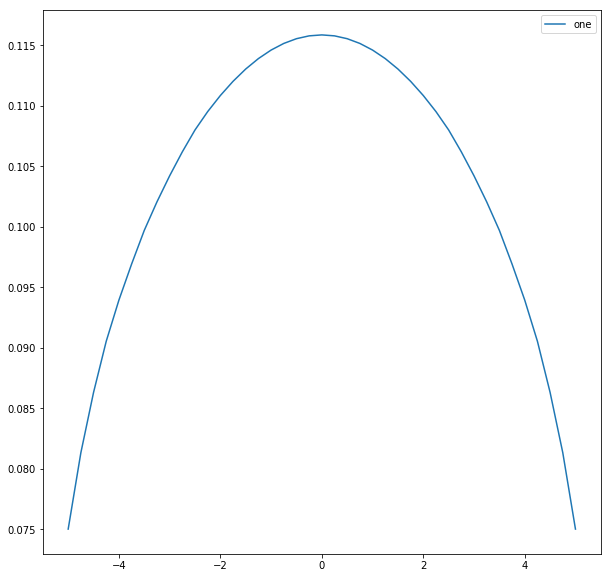

In [199]:
plt.figure(figsize=(10,10))
plt.plot(diameter_positions,diameter_widths, label='one')
# plt.plot(diameter_positions,-2*np.pi/metalens_params['wavelength']*
#          (np.sqrt(diameter_positions**2+metalens_params['f']**2)-metalens_params['f'])+0.94*np.pi,
#         label='two')
plt.legend()
plt.show()

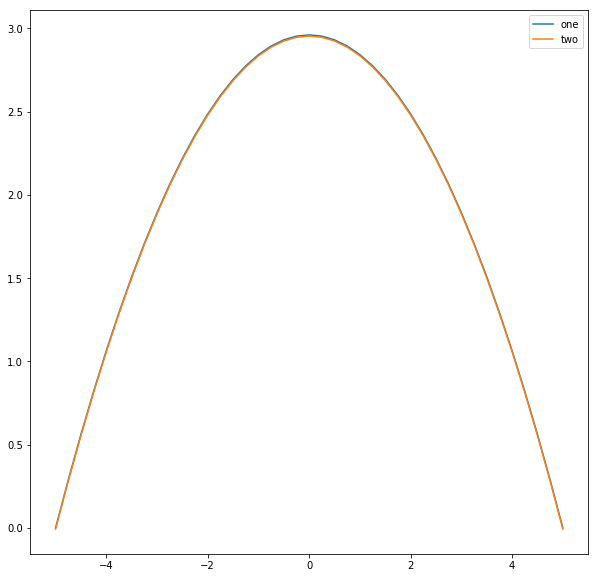

In [196]:
plt.figure(figsize=(10,10))
plt.plot(diameter_positions, diameter_phases, label='one')
plt.plot(diameter_positions,-2*np.pi/metalens_params['wavelength']*
         (np.sqrt(diameter_positions**2+metalens_params['f']**2)-metalens_params['f'])+0.94*np.pi,
        label='two')
plt.legend()
plt.show()

In [281]:
max(metalens_params['required_widths'])

0.1158529571484974

## MEEP Simulation

## Optimization

# Old Stuff

## Longer Focal Length Plano-Convex

In [2]:
from scipy.interpolate import interp1d
from scipy.optimize import curve_fit

In [3]:
def aux_params(lens_params):
    lens_params['fcen'] = 1/lens_params['wavelength']
    lens_params['n'] = np.sqrt(lens_params['epsilon'])
    lens_params['R'] = (lens_params['n']-1) * lens_params['f']
    lens_params['sag'] = lens_params['R'] - np.sqrt(lens_params['R']**2-(lens_params['W']/2)**2)
    lens_params['H'] = 7*lens_params['sag']
    lens_params['sim_time'] = 2*lens_params['H']/lens_params['wavelength']
    lens_params['source_offset'] = 2 * lens_params['wavelength']
    lens_params['near2far_offset'] = lens_params['sag'] + lens_params['source_offset']
    lens_params['beta'] = np.arctan(lens_params['W']/2/lens_params['R'])
    lens_params['f#'] = lens_params['f'] / lens_params['W']
    return lens_params

def print_meta(lens_params):
    for k in lens_params:
        print(k,'=',lens_params[k])

In [4]:
def plano_convex(lens_params, run = True):
    global sim, nearfield
    geometry = [mp.Cylinder(radius = lens_params['R'],
                            center = mp.Vector3(0,-lens_params['R']+lens_params['sag']),
                            material = mp.Medium(epsilon=lens_params['epsilon']))]
    pml_layers = [mp.PML(lens_params['pml_thickness'])]

    cell = mp.Vector3(lens_params['W'], lens_params['H'], 0)

    symmetries = [mp.Mirror(mp.X)]

    sources = [mp.Source(src=mp.ContinuousSource(wavelength=lens_params['wavelength'],
                                                width = lens_params['source_width']),
                        component=mp.Ez,
                        center=mp.Vector3(0,-lens_params['source_offset']),
                        size=mp.Vector3(lens_params['W'] - 3*lens_params['pml_thickness'],0))]

    sim = mp.Simulation(cell_size=cell,
                       boundary_layers=pml_layers,
                       geometry=geometry,
                       sources=sources,
                       resolution=lens_params['resolution'],
                       symmetries=symmetries,
                       force_complex_fields=True)
    nearfield = sim.add_near2far(
       lens_params['fcen'], 0, 1,
       mp.Near2FarRegion(center=mp.Vector3(0, lens_params['near2far_offset']), 
                         size=mp.Vector3(lens_params['W']-2*lens_params['pml_thickness']), 
                         weight=1.0))
    if run:
        sim.run(until = lens_params['sim_time'])

In [5]:
lens_params = {'W': 400,
               'epsilon': 2.3104,
               'pml_thickness': 1,
               'wavelength': 0.532,
               'f': 30000.,
               'source_width': 2,
               'resolution': 50}
lens_params = aux_params(lens_params)
plano_convex(lens_params)

-----------
Initializing structure...
Meep: using complex fields.
Meep progress: 0.15/33.73957809598275 = 0.4% done in 4.1s, 926.7s to go
Meep progress: 0.43/33.73957809598275 = 1.3% done in 8.1s, 631.3s to go
Meep progress: 0.71/33.73957809598275 = 2.1% done in 12.2s, 566.3s to go
Meep progress: 0.99/33.73957809598275 = 2.9% done in 16.3s, 539.5s to go
Meep progress: 1.27/33.73957809598275 = 3.8% done in 20.4s, 521.4s to go
Meep progress: 1.55/33.73957809598275 = 4.6% done in 24.5s, 508.0s to go
Meep progress: 1.83/33.73957809598275 = 5.4% done in 28.5s, 497.1s to go
Meep progress: 2.11/33.73957809598275 = 6.3% done in 32.6s, 488.1s to go
Meep progress: 2.39/33.73957809598275 = 7.1% done in 36.7s, 481.1s to go
Meep progress: 2.66/33.73957809598275 = 7.9% done in 40.7s, 475.2s to go
Meep progress: 2.94/33.73957809598275 = 8.7% done in 44.8s, 468.9s to go
Meep progress: 3.22/33.73957809598275 = 9.5% done in 48.8s, 462.6s to go
Meep progress: 3.5/33.73957809598275 = 10.4% done in 52.9s, 

Meep progress: 29.75/33.73957809598275 = 88.2% done in 435.8s, 58.4s to go
Meep progress: 30.03/33.73957809598275 = 89.0% done in 439.9s, 54.3s to go
Meep progress: 30.310000000000002/33.73957809598275 = 89.8% done in 444.1s, 50.2s to go
Meep progress: 30.580000000000002/33.73957809598275 = 90.6% done in 448.1s, 46.3s to go
Meep progress: 30.86/33.73957809598275 = 91.5% done in 452.2s, 42.2s to go
Meep progress: 31.14/33.73957809598275 = 92.3% done in 456.2s, 38.1s to go
Meep progress: 31.42/33.73957809598275 = 93.1% done in 460.3s, 34.0s to go
Meep progress: 31.7/33.73957809598275 = 94.0% done in 464.3s, 29.9s to go
Meep progress: 31.970000000000002/33.73957809598275 = 94.8% done in 468.3s, 25.9s to go
Meep progress: 32.25/33.73957809598275 = 95.6% done in 472.4s, 21.8s to go
Meep progress: 32.53/33.73957809598275 = 96.4% done in 476.5s, 17.7s to go
Meep progress: 32.81/33.73957809598275 = 97.2% done in 480.6s, 13.6s to go
Meep progress: 33.09/33.73957809598275 = 98.1% done in 484.7s,

In [14]:
ez = np.transpose(sim.get_array(component=mp.Ez))
hy = np.transpose(sim.get_array(component=mp.Hy))
eps = np.transpose(sim.get_array(component=mp.Dielectric))

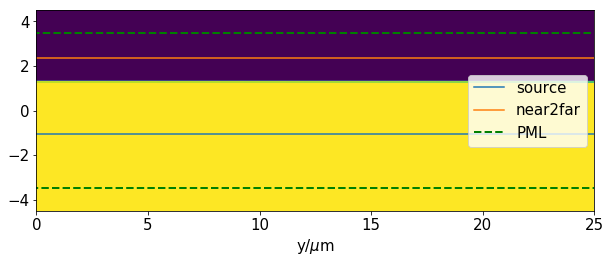

In [15]:
plt.figure(figsize=(10,10))
plt.imshow(eps,extent=[-lens_params['W']/2,lens_params['W']/2,-lens_params['H']/2,lens_params['H']/2],origin='lower')
plt.plot([-lens_params['W']/2,lens_params['W']/2],[-lens_params['source_offset'],-lens_params['source_offset']],label='source')
plt.plot([-lens_params['W']/2,lens_params['W']/2],[lens_params['near2far_offset'],lens_params['near2far_offset']],label='near2far')
plt.plot([-lens_params['W']/2+lens_params['pml_thickness'],lens_params['W']/2-lens_params['pml_thickness'],lens_params['W']/2-lens_params['pml_thickness'],-lens_params['W']/2+lens_params['pml_thickness'],-lens_params['W']/2+lens_params['pml_thickness']],
         [-lens_params['H']/2+lens_params['pml_thickness'],-lens_params['H']/2+lens_params['pml_thickness'],lens_params['H']/2-lens_params['pml_thickness'],lens_params['H']/2-lens_params['pml_thickness'],-lens_params['H']/2+lens_params['pml_thickness']],
         'g--',lw=2,label='PML')
plt.xlim(0,25)
plt.xlabel('x/$\mu$m')
plt.xlabel('y/$\mu$m')
plt.legend()
plt.show()

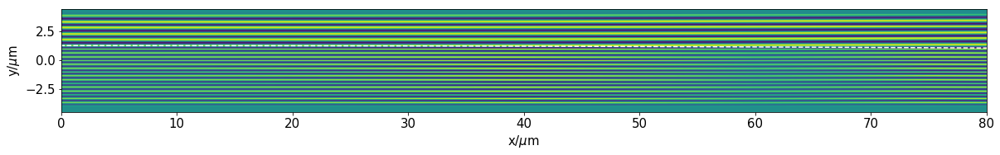

In [16]:
plt.rcParams.update({'font.size': 15})
angles = np.linspace(np.pi/2-lens_params['beta'],np.pi/2+lens_params['beta'],100)
plt.figure(figsize=(20,20))
plt.imshow(np.real(ez),extent=[-lens_params['W']/2,
                               lens_params['W']/2,
                               -lens_params['H']/2,
                               lens_params['H']/2],
           origin='lower')
plt.plot(lens_params['R']*np.cos(angles),
         lens_params['R']*np.sin(angles)-lens_params['R']+lens_params['sag'],'w--')
plt.xlim(-lens_params['W']/2,lens_params['W']/2)
plt.ylim(-lens_params['H']/2,lens_params['H']/2)
plt.xlabel('x/$\mu$m')
plt.ylabel('y/$\mu$m')
plt.xlim(0,80)
# plt.ylim(0,80)
# plt.xlim(0,200)
#plt.tight_layout()
plt.show()

In [17]:
lens_params['H']*lens_params['resolution']

134.6209166029712

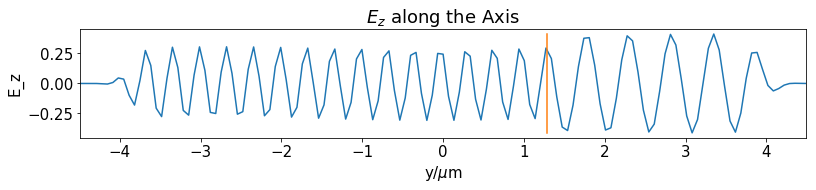

In [18]:
axial_slice = np.real(ez)[:,int(ez.shape[1]/2)]
plt.figure(figsize=(13,2))
plt.plot(np.linspace(-lens_params['H']/2,lens_params['H']/2,ez.shape[0]),axial_slice)
plt.plot([lens_params['sag'],lens_params['sag']],[np.min(axial_slice),np.max(axial_slice)])
plt.xlim(-lens_params['H']/2,lens_params['H']/2)
plt.xlabel('y/$\mu$m')
plt.ylabel('E_z')
plt.title('$E_z$ along the Axis')
plt.show()

In [68]:
axial_extent_in_um = 2*lens_params['f']
num_farfield_points = 300
axis_values = np.linspace(0,axial_extent_in_um, num_farfield_points)
lateral_values = np.linspace(-lens_params['W']/2,lens_params['W']/2,num_farfield_points)
ax_faraway = np.array([sum(np.abs(np.array(sim.get_farfield(nearfield, mp.Vector3(0,y))))[:3]**2) for y in axis_values])
max_axial = axis_values[np.argmax(ax_faraway)]
lat_faraway = np.array([sum(np.abs(np.array(sim.get_farfield(nearfield, mp.Vector3(x,max_axial))))[:3]**2) for x in lateral_values])

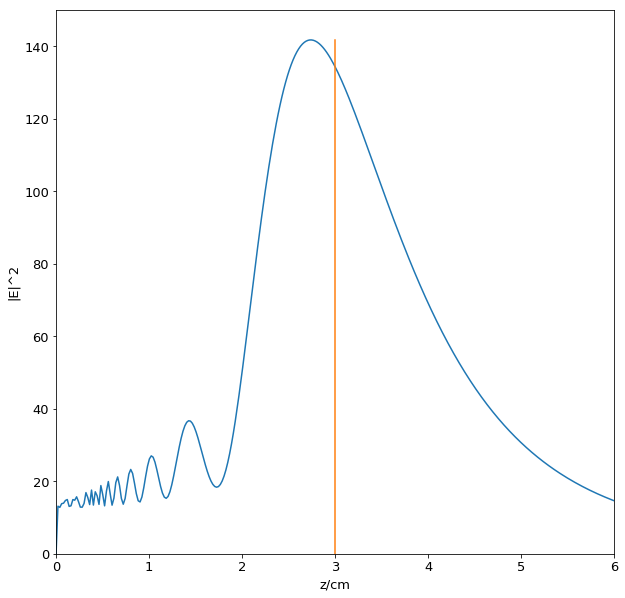

In [78]:
plt.rcParams.update({'font.size': 13})
plt.figure(figsize=(10,10))
plt.plot(axis_values/1e4,ax_faraway,'-')
plt.plot([lens_params['f']/1e4]*2,[0,max(ax_faraway)])
plt.xlabel('z/cm')
plt.ylabel('|E|^2')
plt.ylim(0,150)
plt.xlim(0,6)
plt.show()

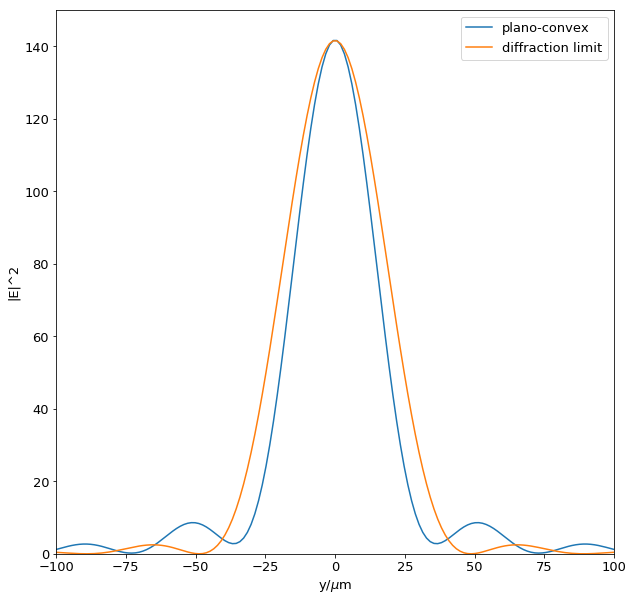

In [77]:
bessel_x = np.pi/lens_params['wavelength']/lens_params['f#']*lateral_values
bess = max(lat_faraway)*(2*jn(1,bessel_x)/bessel_x)**2
plt.rcParams.update({'font.size': 13})
plt.figure(figsize=(10,10))
plt.plot(lateral_values,lat_faraway,'-', label='plano-convex')
plt.plot(lateral_values, bess, label='diffraction limit')
plt.legend()
plt.xlim(-100,100)
plt.ylim(0,150)
plt.xlabel('y/$\mu$m')
plt.ylabel('|E|^2')
plt.show()

In [107]:
faraway_collection = {}
resolutions = [20,30,40,50];
for res in resolutions:
    print(res)
    !{'pushover %d' % res}
    lens_params = {'W': 400,
                   'epsilon': 2.3104,
                   'pml_thickness': 1,
                   'wavelength': 0.532,
                   'f': 30000.,
                   'source_width': 2,
                   'resolution': res}
    lens_params = aux_params(lens_params)
    plano_convex(lens_params)
    ez = np.transpose(sim.get_array(component=mp.Ez))
    hy = np.transpose(sim.get_array(component=mp.Hy))
    hx = np.transpose(sim.get_array(component=mp.Hx))
    eps = np.transpose(sim.get_array(component=mp.Dielectric))
    axial_extent_in_um = 2*lens_params['f']
    num_farfield_points = 300
    axial_values = np.linspace(0,axial_extent_in_um, num_farfield_points)
    lateral_values = np.linspace(-lens_params['W']/2,lens_params['W']/2,num_farfield_points)
    axial_faraway = np.array([sum(np.abs(np.array(sim.get_farfield(nearfield, mp.Vector3(0,z))))[:3]**2) for z in axial_values])
    max_axial = axial_values[np.argmax(axial_faraway)]
    lateral_faraway = np.array([sum(np.abs(np.array(sim.get_farfield(nearfield, mp.Vector3(x,max_axial))))[:3]**2) for x in lateral_values])
    faraway_collection[res] = {'ez': ez,
                              'hy': hy,
                              'hx': hx,
                              'lateral_values':lateral_values,
                              'axis_values': axial_values,
                              'lateral_faraway': lateral_faraway,
                              'axial_faraway': axial_faraway}

20
-----------
Initializing structure...
Meep: using complex fields.
Meep progress: 3.075/33.73957809598275 = 9.1% done in 4.0s, 40.1s to go
Meep progress: 6.825/33.73957809598275 = 20.2% done in 8.0s, 31.7s to go
Meep progress: 10.55/33.73957809598275 = 31.3% done in 12.0s, 26.5s to go
Meep progress: 14.3/33.73957809598275 = 42.4% done in 16.0s, 21.8s to go
Meep progress: 18.05/33.73957809598275 = 53.5% done in 20.1s, 17.4s to go
Meep progress: 21.700000000000003/33.73957809598275 = 64.3% done in 24.1s, 13.4s to go
Meep progress: 25.375/33.73957809598275 = 75.2% done in 28.1s, 9.3s to go
Meep progress: 29.150000000000002/33.73957809598275 = 86.4% done in 32.1s, 5.1s to go
Meep progress: 32.925000000000004/33.73957809598275 = 97.6% done in 36.1s, 0.9s to go
run 0 finished at t = 33.75 (1350 timesteps)
30
-----------
Initializing structure...
Meep: using complex fields.
Meep progress: 0.8666666666666667/33.73957809598275 = 2.6% done in 4.0s, 153.1s to go
Meep progress: 2.033333333333333

Meep progress: 31.8125/33.73957809598275 = 94.3% done in 247.1s, 15.0s to go
Meep progress: 32.3375/33.73957809598275 = 95.8% done in 251.1s, 10.9s to go
Meep progress: 32.875/33.73957809598275 = 97.4% done in 255.2s, 6.7s to go
Meep progress: 33.4/33.73957809598275 = 99.0% done in 259.2s, 2.6s to go
run 0 finished at t = 33.75 (2700 timesteps)
50
-----------
Initializing structure...
Meep: using complex fields.
Meep progress: 0.15/33.73957809598275 = 0.4% done in 4.1s, 925.1s to go
Meep progress: 0.42/33.73957809598275 = 1.2% done in 8.2s, 648.9s to go
Meep progress: 0.7000000000000001/33.73957809598275 = 2.1% done in 12.2s, 577.1s to go
Meep progress: 0.98/33.73957809598275 = 2.9% done in 16.2s, 543.1s to go
Meep progress: 1.26/33.73957809598275 = 3.7% done in 20.3s, 522.5s to go
Meep progress: 1.54/33.73957809598275 = 4.6% done in 24.4s, 509.4s to go
Meep progress: 1.82/33.73957809598275 = 5.4% done in 28.4s, 498.0s to go
Meep progress: 2.1/33.73957809598275 = 6.2% done in 32.4s, 48

Meep progress: 28.6/33.73957809598275 = 84.8% done in 416.6s, 74.9s to go
Meep progress: 28.88/33.73957809598275 = 85.6% done in 420.7s, 70.8s to go
Meep progress: 29.16/33.73957809598275 = 86.4% done in 424.7s, 66.7s to go
Meep progress: 29.44/33.73957809598275 = 87.3% done in 428.8s, 62.6s to go
Meep progress: 29.72/33.73957809598275 = 88.1% done in 432.9s, 58.5s to go
Meep progress: 30.0/33.73957809598275 = 88.9% done in 437.0s, 54.5s to go
Meep progress: 30.28/33.73957809598275 = 89.7% done in 441.0s, 50.4s to go
Meep progress: 30.560000000000002/33.73957809598275 = 90.6% done in 445.1s, 46.3s to go
Meep progress: 30.84/33.73957809598275 = 91.4% done in 449.1s, 42.2s to go
Meep progress: 31.12/33.73957809598275 = 92.2% done in 453.1s, 38.1s to go
Meep progress: 31.400000000000002/33.73957809598275 = 93.1% done in 457.1s, 34.1s to go
Meep progress: 31.67/33.73957809598275 = 93.9% done in 461.1s, 30.1s to go
Meep progress: 31.95/33.73957809598275 = 94.7% done in 465.2s, 26.1s to go
M

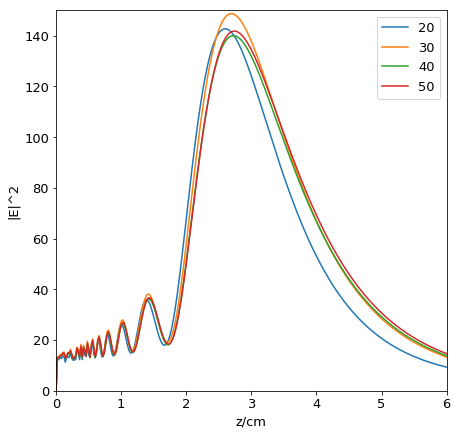

In [118]:
plt.rcParams.update({'font.size': 13})
plt.figure(figsize=(7,7))
for res in faraway_collection.keys():
    faraway=faraway_collection[res]
    plt.plot(faraway['axis_values']/1e4,faraway['axial_faraway'],'-',label=str(res))
    #plt.plot([lens_params['f']/1e4]*2,[0,max(faraway['axial_faraway'])])
    plt.xlabel('z/cm')
    plt.ylabel('|E|^2')
plt.xlim(0,6)
plt.ylim(0,150)
plt.legend()
plt.show()

In [ ]:
plt.rcParams.update({'font.size': 13})
plt.figure(figsize=(15,5))
for res in faraway_collection.keys():
    faraway=faraway_collection[res]
    plt.plot(faraway['axis_values']/1e4,faraway['axial_faraway'],'-',label=str(res))
    plt.plot([lens_params['f']/1e4]*2,[0,max(faraway['axial_faraway'])])
    plt.xlabel('z/cm')
    plt.ylabel('|E|^2')
plt.xlim(0,6)
plt.ylim(0,150)
plt.legend()
plt.show()

In [ ]:
maxima_location = []
for res in faraway_collection:
    faraway = faraway_collection[res]
    maxima_location.append([res, faraway['axis_values'][np.argmax(faraway['axial_faraway'])]])
maxima_location = np.array(maxima_location)
plt.figure()
plt.plot(1/maxima_location[:,0],maxima_location[:,1]/1e4,'o')
plt.xlabel('resolutuion / $\mu$m')
plt.ylabel('focal maximum/cm')
plt.show()

In [ ]:
plt.rcParams.update({'font.size': 13})
plt.figure(figsize=(15,5))
for res in faraway_collection.keys():
    faraway=faraway_collection[res]
    plt.plot(faraway['lateral_values'],faraway['lateral_faraway'],'-',label=str(res))
    plt.xlabel('x/$\mu$m')
    plt.ylabel('|E|^2')
plt.xlim(-100,100)
plt.ylim(0,140)
plt.legend()
plt.show()

** CONCLUSION: resolution of 50 seems adequate **

### Determine where the field is more tightly focused

In [ ]:
lens_params = {'W': 400,
               'epsilon': 2.3104,
               'pml_thickness': 1,
               'wavelength': 0.532,
               'f': 30000.,
               'source_width': 2,
               'resolution': 50}
lens_params = aux_params(lens_params)
plano_convex(lens_params)

In [81]:
axial_extent_in_um = 2*lens_params['f']
num_axial_points = 20
num_lateral_points = 31
num_lateral_points = int((num_lateral_points + 1)/2)
axis_values = np.linspace(25000,32000, num_axial_points)
lateral_values = np.linspace(0,lens_params['W']/4,num_lateral_points)
field_of_e = []
for index, z in enumerate(axis_values):
    print('%.2f %%' % (index/len(axis_values) * 100),end=', ')
    lateral_values = np.linspace(0,lens_params['W']/4,num_lateral_points)
    lateral_values = list(lateral_values)
    lat_faraway = [sum(np.abs(np.array(sim.get_farfield(nearfield, mp.Vector3(x,z))))[:3]**2) for x in lateral_values]
    lat_faraway = lat_faraway[-1:0:-1] + lat_faraway
    lateral_values = [-x for x in lateral_values[-1:0:-1]] + lateral_values 
    field_of_e.append(lat_faraway)
field_of_e = np.array(field_of_e)

0.00 %, 5.00 %, 10.00 %, 15.00 %, 20.00 %, 25.00 %, 30.00 %, 35.00 %, 40.00 %, 45.00 %, 50.00 %, 55.00 %, 60.00 %, 65.00 %, 70.00 %, 75.00 %, 80.00 %, 85.00 %, 90.00 %, 95.00 %, 

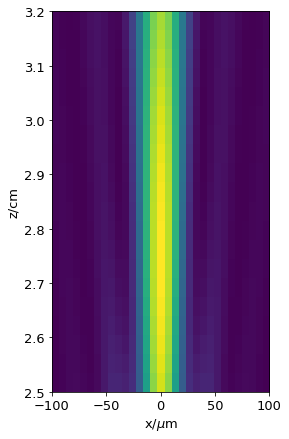

In [92]:
plt.rcParams.update({'font.size': 13})
plt.figure(figsize=(7,7))
plt.imshow(field_of_e,origin='lower',
          extent=[-lens_params['W']/4,lens_params['W']/4,
                 min(axis_values)/1e4,max(axis_values)/1e4],
          aspect=0.05*1e4)
plt.xlabel('x/$\mu$m')
plt.ylabel('z/cm')
plt.show()

In [57]:
# calculate standard deviations
devs = []
max_lateral = []
for index, ax in enumerate(axis_values):
    devs.append(np.sqrt(sum(field_of_e[index]*np.array(lateral_values)**2)/sum(field_of_e[index])))
    max_lateral.append(max(field_of_e[index]))

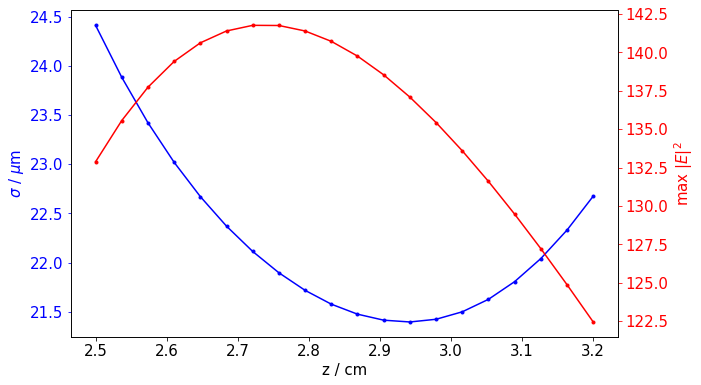

In [104]:
plt.rcParams.update({'font.size': 15})
fig, ax1 = plt.subplots(figsize=(5*2,2*2.8))
t = np.arange(0.01, 10.0, 0.01)
s1 = np.exp(t)
ax1.plot(axis_values /  1e4, devs, 'b.-')
ax1.set_xlabel('z / cm')
# Make the y-axis label, ticks and tick labels match the line color.
ax1.set_ylabel('$\sigma$ / $\mu$m', color='b')
ax1.tick_params('y', colors='b')

ax2 = ax1.twinx()
s2 = np.sin(2 * np.pi * t)
ax2.plot(axis_values /  1e4, max_lateral, 'r.-')
ax2.set_ylabel('max $|E|^2$', color='r')
ax2.tick_params('y', colors='r')

fig.tight_layout()
plt.show()

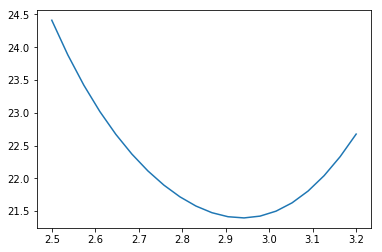

In [58]:
plt.figure()
plt.plot(axis_values /  1e4, devs)
#plt.plot(axis_values /  1e4, max_lateral)
plt.show()

### Running plano-convex with gaussian source and acquire wavelength dependent data

In [207]:
def aux_params(lens_params):
    lens_params['f_low'] = 1/lens_params['wavelength_high']
    lens_params['f_high'] = 1/lens_params['wavelength_low']
    lens_params['df'] = lens_params['f_high'] - lens_params['f_low']
    lens_params['fcen'] = (lens_params['f_low'] + lens_params['f_high']) / 2.
    lens_params['n'] = np.sqrt(lens_params['epsilon'])
    lens_params['R'] = (lens_params['n']-1) * lens_params['f']
    lens_params['sag'] = lens_params['R'] - np.sqrt(lens_params['R']**2-(lens_params['W']/2)**2)
    lens_params['H'] = 7*lens_params['sag']
    lens_params['sim_time'] = 4/lens_params['wavelength_low']
    lens_params['source_offset'] = 2 * lens_params['wavelength_low']
    lens_params['near2far_offset'] = lens_params['sag'] + lens_params['source_offset']
    lens_params['beta'] = np.arctan(lens_params['W']/2/lens_params['R'])
    lens_params['f#'] = lens_params['f'] / lens_params['W']
    lens_params['frequencies'] = np.linspace(lens_params['f_low'],lens_params['f_high'],lens_params['num_f'])
    return lens_params

def print_meta(lens_params):
    for k in lens_params:
        print(k,'=',lens_params[k])

In [213]:
def plano_convex_packet(lens_params, run = True):
    global sim, nearfield
    geometry = [mp.Cylinder(radius = lens_params['R'],
                            center = mp.Vector3(0,-lens_params['R']+lens_params['sag']),
                            material = mp.Medium(epsilon=lens_params['epsilon']))]
    pml_layers = [mp.PML(lens_params['pml_thickness'])]

    cell = mp.Vector3(lens_params['W'], lens_params['H'], 0)

    symmetries = [mp.Mirror(mp.X)]

    sources = [mp.Source(src=mp.GaussianSource(lens_params['fcen'],
                                               fwidth=lens_params['df']),
                        component=mp.Ez,
                        center=mp.Vector3(0,-lens_params['source_offset']),
                        size=mp.Vector3(lens_params['W'] - 3*lens_params['pml_thickness'],0))]

    sim = mp.Simulation(cell_size=cell,
                       boundary_layers=pml_layers,
                       geometry=geometry,
                       sources=sources,
                       resolution=lens_params['resolution'],
                       symmetries=symmetries,
                       force_complex_fields=True)
    nearfield = sim.add_near2far(
       lens_params['fcen'], lens_params['df'], lens_params['num_f'],
       mp.Near2FarRegion(center=mp.Vector3(0, lens_params['near2far_offset']), 
                         size=mp.Vector3(lens_params['W']-2*lens_params['pml_thickness']), 
                         weight=1.0))
    if run:
        sim.run(until_after_sources = mp.stop_when_fields_decayed(
            lens_params['sim_time'],
            mp.Ez,
            mp.Vector3(0,lens_params['H']/4),
            1e-3))

In [214]:
lens_params = {'W': 400,
               'epsilon': 2.3104,
               'pml_thickness': 1,
               'wavelength_high': 0.600,
               'wavelength_low': 0.400,
               'f': 30000.,
               'source_width': 2,
               'resolution': 40,
              'num_f': 10}
lens_params = aux_params(lens_params)
plano_convex_packet(lens_params)

-----------
Initializing structure...
Meep: using complex fields.
field decay(t = 10.012500000000001): 0.15647734802337898 / 0.15647734802337898 = 1.0
field decay(t = 20.012500000000003): 0.16134807168888954 / 0.16134807168888954 = 1.0
field decay(t = 30.025000000000002): 1.631008989389881e-12 / 0.16134807168888954 = 1.0108636392846291e-11
run 0 finished at t = 30.025000000000002 (2402 timesteps)


In [245]:
num_farfield_points = 200
axis_values = np.linspace(20000,35000, num_farfield_points)
ax_faraway = np.array([np.abs(np.array(sim.get_farfield(nearfield, mp.Vector3(0,y))))**2 for y in axis_values])

In [246]:
chromatic_faraway = []
for index, freq in enumerate(lens_params['frequencies']):
    chromatic_faraway.append([sum(np.abs(ax_f[6*index:6*index + 6:1])) for ax_f in ax_faraway])

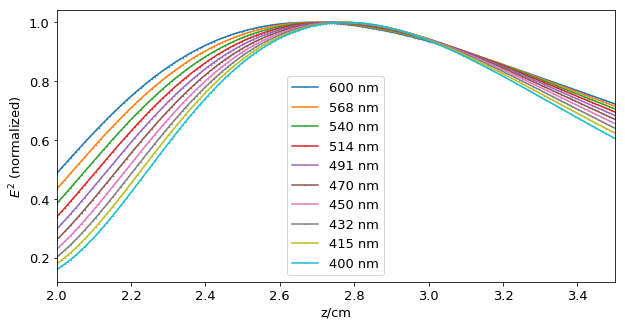

In [252]:
plt.figure(figsize=(10,5))
for index, freq in enumerate(lens_params['frequencies']):
    plt.plot(axis_values/1e4, chromatic_faraway[index]/max( chromatic_faraway[index]), 
             'o-',ms=0.5,
             label="%.0f nm" % (1000/freq))
plt.legend()
plt.xlabel('z/cm')
plt.xlim(2.,3.5)
plt.ylabel('$E^2$ (normalized)')
plt.show()

In [270]:
from scipy.interpolate import interp1d

In [271]:
finer_axis = np.linspace(min(axis_values),max(axis_values),2*axis_values.shape[0])
wavelength_maxima = [finer_axis[np.argmax(interp1d(axis_values,chrom,kind='cubic')(finer_axis))] for chrom in chromatic_faraway]

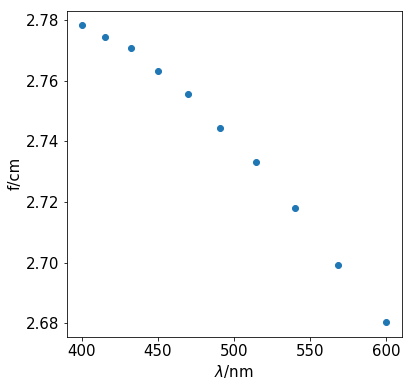

In [275]:
plt.rcParams.update({'font.size': 15})
plt.figure(figsize=(6,6))
plt.plot(1000/lens_params['frequencies'], np.array(wavelength_maxima)/1e4,'o')
plt.xlabel('$\lambda$/nm')
plt.ylabel('f/cm')
plt.show()

## Redesign of mask using phases from S4 (single resolution)

In [561]:
phases =  pickle.load(open('/Users/juan/Google Drive/Zia Lab/CEM/S4/phases.pkl','rb'))

In [562]:
def function_topper(x,y):
    clean_x = []
    clean_y = []
    # first determine if the top function will be increasing or decreasing
    if y[1] > y[0]:
        sign = 1
    elif y[1] < y[0]:
        sign = -1
    else:
        print('undetermined sign')
    yp_current = y[0]
    clean_x = [x[0]]
    clean_y = [y[0]]
    for index in range(len(x)-1):
        xp = x[index]
        yp = y[index]
        next_xp = x[index+1]
        next_yp = y[index+1]
        if sign == 1:
            if (next_yp > yp) and next_yp > max(clean_y):
                clean_x.append(xp)
                clean_y.append(yp)
        if sign == -1:
            if (next_yp < yp) and next_yp < min(clean_y):
                clean_x.append(xp)
                clean_y.append(yp)
    return np.array(clean_x), np.array(clean_y)

In [563]:
# returns a list with the meep geometries
def make_metalens_geometry(metalens_params):
    # first design the mask based on the given widths and corresponding phases
    widths = metalens_params['widths']
    phases = metalens_params['phases']
    wavelength = metalens_params['wavelength']
    good_widths = (widths > metalens_params['min width'])
    widths = widths[good_widths]
    phases = phases[good_widths]
    phases = phases - min(phases)
    aperture = metalens_params['aperture']
    aperture = metalens_params['aperture']
    f = metalens_params['focal length']
    # compute the required phases based on the wavelength, focal length and number of unit cells
    if (max(phases)-min(phases)) < 2*np.pi:
        print((max(phases)-min(phases)))
        return "not a full phase coverage"
    x, y = function_topper(widths, phases)
    axis_positions = np.linspace(-metalens_params['unit cell size']*(metalens_params['num of unit cells']-1)/2,
                                 metalens_params['unit cell size']*(metalens_params['num of unit cells']-1)/2,
                                metalens_params['num of unit cells'])
    required_phases = (-2*np.pi/wavelength*(np.sqrt(axis_positions**2+f**2)-f+0.01))%(2*np.pi)
    #required_phases = required_phases - min(required_phases)
    required_phases = required_phases 
    required_widths = np.interp(required_phases, y, x)
#     return axis_positions, required_widths
    hairline = [mp.Block(size=mp.Vector3(w, metalens_params['height of fins']),
                    center = mp.Vector3(position,metalens_params['height of fins']/2.),
                    material = mp.Medium(epsilon = metalens_params['epsilon posts'])) for w, position in zip(required_widths, axis_positions)]
    substrate = [mp.Block(size = mp.Vector3(aperture,metalens_params['substrate thickness']),
                        center = mp.Vector3(0,-metalens_params['substrate thickness']/2),
                        material = mp.Medium(epsilon = metalens_params['epsilon substrate']))]
    return (metalens_params, 
            substrate + hairline,
            required_phases,
            required_widths,
            axis_positions)

In [564]:
metalens_params = {'height of fins':1.5,
                  'focal length':30000,
                  'unit cell size': 1,
                  'num of unit cells': 401,
                  'epsilon substrate':2.13159,
                  'epsilon posts':2.3104,
                  'phases': phases['phases'],
                  'widths': phases['post_widths'],
                  'wavelength': 0.532,
                  'min width': 0.05,
                  'substrate thickness': 5,
                  'source width': 2,
                  'pml width': 1,
                  'resolution': 50}
metalens_params['source depth'] = metalens_params['substrate thickness']/2
metalens_params['simulation height'] = metalens_params['substrate thickness']*2
metalens_params['simulation time'] = 2* (metalens_params['substrate thickness']*2 / metalens_params['wavelength'])
metalens_params['frequency'] = 1./metalens_params['wavelength']
metalens_params['near2far_offset'] = metalens_params['height of fins'] * 2
metalens_params['aperture'] = metalens_params['unit cell size'] * (metalens_params['num of unit cells']+4)
metalens_params['NA'] = np.sin(np.arctan(metalens_params['aperture']/2/metalens_params['focal length']))
metalens_params['f#'] = metalens_params['focal length'] / metalens_params['aperture']

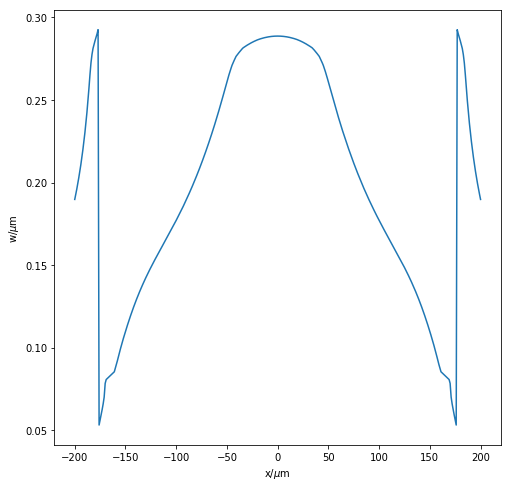

In [565]:
plt.figure(figsize=(8,8))
plt.plot(make_metalens_geometry(metalens_params)[4],make_metalens_geometry(metalens_params)[3])
plt.xlabel('x/$\mu$m')
plt.ylabel('w/$\mu$m')
plt.show()

In [566]:
metalens_params, geometry, _, _, _ = make_metalens_geometry(metalens_params)

In [567]:
cell = mp.Vector3(metalens_params['aperture'],
                  metalens_params['substrate thickness']*2)

pml_layers = [mp.PML(metalens_params['pml width'])]

sources = [mp.Source(src=mp.ContinuousSource(wavelength=metalens_params['wavelength'],
                                             width = metalens_params['source width']),
                    component=mp.Ez,
                    center=mp.Vector3(0,-metalens_params['source depth']),
                    size=mp.Vector3(metalens_params['aperture'] - 2*metalens_params['pml width'],0))]

symmetries = [mp.Mirror(mp.X)]

sim = mp.Simulation(cell_size=cell,
                   boundary_layers=pml_layers,
                   geometry=geometry,
                   sources=sources,
                   resolution=metalens_params['resolution'],
                   force_complex_fields=True)

nearfield = sim.add_near2far(
   metalens_params['frequency'] , 0, 1,
   mp.Near2FarRegion(center=mp.Vector3(0, metalens_params['near2far_offset']), 
                     size=mp.Vector3(metalens_params['aperture']), weight=1.0))
sim.init_sim()
sim.run(until=metalens_params['simulation time'])

-----------
Initializing structure...
Meep: using complex fields.
Meep progress: 0.01/37.59398496240601 = 0.0% done in 4.6s, 17147.8s to go
Meep progress: 0.15/37.59398496240601 = 0.4% done in 8.8s, 2208.5s to go
Meep progress: 0.29/37.59398496240601 = 0.8% done in 13.2s, 1692.9s to go
Meep progress: 0.42/37.59398496240601 = 1.1% done in 17.2s, 1526.6s to go
Meep progress: 0.55/37.59398496240601 = 1.5% done in 21.3s, 1436.3s to go
Meep progress: 0.68/37.59398496240601 = 1.8% done in 25.4s, 1376.2s to go
Meep progress: 0.8200000000000001/37.59398496240601 = 2.2% done in 29.6s, 1328.1s to go
Meep progress: 0.96/37.59398496240601 = 2.6% done in 33.9s, 1292.8s to go
Meep progress: 1.09/37.59398496240601 = 2.9% done in 38.0s, 1273.3s to go
Meep progress: 1.23/37.59398496240601 = 3.3% done in 42.3s, 1250.4s to go
Meep progress: 1.37/37.59398496240601 = 3.6% done in 46.6s, 1231.0s to go
Meep progress: 1.51/37.59398496240601 = 4.0% done in 50.8s, 1214.0s to go
Meep progress: 1.6500000000000001

Meep progress: 14.52/37.59398496240601 = 38.6% done in 449.6s, 714.5s to go
Meep progress: 14.66/37.59398496240601 = 39.0% done in 453.8s, 710.0s to go
Meep progress: 14.8/37.59398496240601 = 39.4% done in 458.1s, 705.5s to go
Meep progress: 14.94/37.59398496240601 = 39.7% done in 462.4s, 701.1s to go
Meep progress: 15.07/37.59398496240601 = 40.1% done in 466.4s, 697.1s to go
Meep progress: 15.21/37.59398496240601 = 40.5% done in 470.7s, 692.6s to go
Meep progress: 15.35/37.59398496240601 = 40.8% done in 474.9s, 688.1s to go
Meep progress: 15.49/37.59398496240601 = 41.2% done in 479.1s, 683.6s to go
Meep progress: 15.63/37.59398496240601 = 41.6% done in 483.3s, 679.2s to go
Meep progress: 15.77/37.59398496240601 = 41.9% done in 487.6s, 674.8s to go
Meep progress: 15.9/37.59398496240601 = 42.3% done in 491.6s, 670.8s to go
Meep progress: 16.04/37.59398496240601 = 42.7% done in 495.9s, 666.3s to go
Meep progress: 16.18/37.59398496240601 = 43.0% done in 500.1s, 661.9s to go
Meep progress:

Meep progress: 29.23/37.59398496240601 = 77.8% done in 896.1s, 256.4s to go
Meep progress: 29.37/37.59398496240601 = 78.1% done in 900.3s, 252.1s to go
Meep progress: 29.51/37.59398496240601 = 78.5% done in 904.6s, 247.8s to go
Meep progress: 29.650000000000002/37.59398496240601 = 78.9% done in 908.8s, 243.5s to go
Meep progress: 29.79/37.59398496240601 = 79.2% done in 913.1s, 239.2s to go
Meep progress: 29.93/37.59398496240601 = 79.6% done in 917.3s, 234.9s to go
Meep progress: 30.07/37.59398496240601 = 80.0% done in 921.5s, 230.6s to go
Meep progress: 30.21/37.59398496240601 = 80.4% done in 925.7s, 226.3s to go
Meep progress: 30.35/37.59398496240601 = 80.7% done in 930.0s, 222.0s to go
Meep progress: 30.490000000000002/37.59398496240601 = 81.1% done in 934.2s, 217.7s to go
Meep progress: 30.63/37.59398496240601 = 81.5% done in 938.4s, 213.3s to go
Meep progress: 30.76/37.59398496240601 = 81.8% done in 942.5s, 209.4s to go
Meep progress: 30.900000000000002/37.59398496240601 = 82.2% do

In [568]:
eps = sim.get_array(component=mp.Dielectric).transpose()
ez = sim.get_array(component=mp.Ez).transpose()

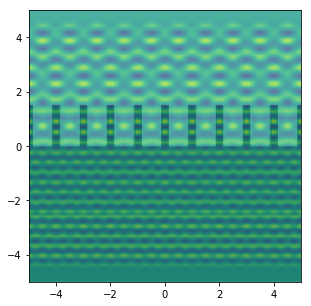

In [589]:
plt.figure(figsize=(20,5))
plt.imshow(np.real(ez),extent=[-metalens_params['aperture']/2,
                       metalens_params['aperture']/2,
                      -metalens_params['simulation height']/2,
                      metalens_params['simulation height']/2],
          origin='lower')
plt.imshow(eps,extent=[-metalens_params['aperture']/2,
                       metalens_params['aperture']/2,
                      -metalens_params['simulation height']/2,
                      metalens_params['simulation height']/2],
          origin='lower',
          cmap='binary',
          alpha=0.2)
plt.xlim(-5,5)
plt.show()

In [570]:
num_farfield_points = 120
axis_values = np.linspace(0,metalens_params['focal length']*4, num_farfield_points)
faraway = np.array([sum(np.abs(np.array(sim.get_farfield(nearfield, mp.Vector3(0,y))))[:3]**2) for y in axis_values])
axis_values *= 1e-4

In [440]:
# faraway_dictionary = {}
# faraway_dictionary[metalens_params['resolution']] = {'axis_values': axis_values, 'faraway':faraway}

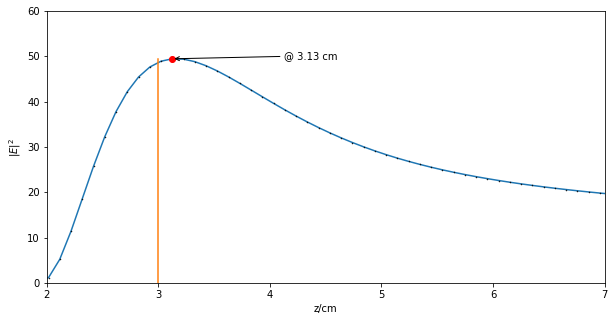

In [571]:
plt.figure(figsize=(10,5))
plt.plot(axis_values, faraway)
plt.plot(axis_values, faraway, 'ko',ms=0.5)
plt.xlabel('z/cm')
plt.ylabel('$|E|^2$')
plt.plot([metalens_params['focal length']/1e4]*2,[min(faraway),max(faraway)])
plt.ylim(0,60)
plt.xlim(2,7)
plt.plot([axis_values[np.argmax(faraway)]],[max(faraway)],'ro')
plt.annotate('@ %.2f cm' % axis_values[np.argmax(faraway)],(axis_values[np.argmax(faraway)],max(faraway)),
             xytext=(axis_values[np.argmax(faraway)]+1,max(faraway)),
            arrowprops=dict(arrowstyle="->",
                            connectionstyle="arc3"))
plt.show()

In [572]:
!ding


/Users/juan/Scripts/ding.wav:

 File Size: 120k      Bit Rate: 256k
  Encoding: Signed PCM    
  Channels: 1 @ 16-bit   
Samplerate: 16000Hz      
Replaygain: off         
  Duration: 00:00:03.76  

In:100%  00:00:03.76 [00:00:00.00] Out:180k  [      |      ]        Clip:360  
play WARN rate: rate clipped 186 samples; decrease volume?
play WARN sox: `coreaudio' output clipped 174 samples; decrease volume?
Done.


In [573]:
num_farfield_points = 120
lateral_values = np.linspace(-200,200, num_farfield_points)
lateral_faraway = np.array([sum(np.abs(np.array(sim.get_farfield(nearfield, mp.Vector3(x,axis_values[np.argmax(faraway)]*1e4))))[:3]**2) for x in lateral_values])

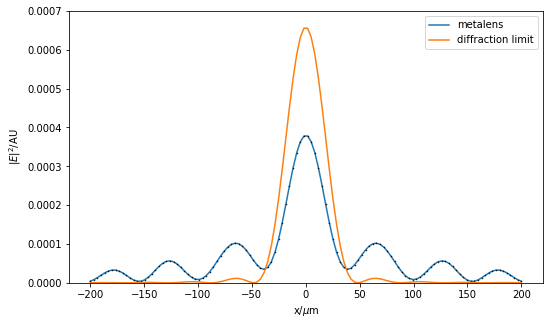

In [574]:
plt.figure(figsize=(8.5,5))
#sigma = 0.42 * metalens_params['wavelength'] * metalens_params['f#']
bess = max(lateral_faraway)*(2*jn(1,bessel_x)/bessel_x)**2
plt.plot(lateral_values, lateral_faraway / sum(lateral_faraway)/len(lateral_faraway),label='metalens')
plt.plot(lateral_values, lateral_faraway / sum(lateral_faraway)/len(lateral_faraway), 'ko',ms=0.5)
bessel_x = np.pi/metalens_params['wavelength']/metalens_params['f#']*lateral_values
plt.plot(lateral_values, bess/sum(bess)/len(bess) ,label='diffraction limit')
plt.xlabel('x/$\mu$m')
plt.ylabel('$|E|^2$/AU')
plt.legend()
plt.ylim(0,0.0007)
plt.show()

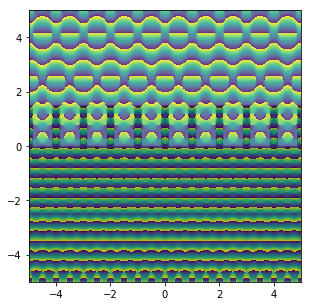

In [575]:
plt.figure(figsize=(20,5))
plt.imshow(np.angle(ez),extent=[-metalens_params['aperture']/2,
                       metalens_params['aperture']/2,
                      -metalens_params['simulation height']/2,
                      metalens_params['simulation height']/2],
          origin='lower')
plt.imshow(eps,extent=[-metalens_params['aperture']/2,
                       metalens_params['aperture']/2,
                      -metalens_params['simulation height']/2,
                      metalens_params['simulation height']/2],
          origin='lower',
          cmap='binary',
          alpha=0.2)
plt.xlim(-5,5)
plt.show()

In [576]:
phases = np.angle(ez)
mags= np.abs(ez)

In [577]:
def find_closest_index(search_array, search_value):
    return np.argmin(np.abs(search_array-search_value))

In [578]:
metalens_params['simulation height']

10

In [579]:
devs = []
zs = np.linspace(0,5,100)
for z in zs:
    magic_index = find_closest_index(v_slice,z)
    devs.append(np.std(phases[magic_index]))
devs= np.array(devs)

In [580]:
zs[zs>1]

array([1.01010101, 1.06060606, 1.11111111, 1.16161616, 1.21212121,
       1.26262626, 1.31313131, 1.36363636, 1.41414141, 1.46464646,
       1.51515152, 1.56565657, 1.61616162, 1.66666667, 1.71717172,
       1.76767677, 1.81818182, 1.86868687, 1.91919192, 1.96969697,
       2.02020202, 2.07070707, 2.12121212, 2.17171717, 2.22222222,
       2.27272727, 2.32323232, 2.37373737, 2.42424242, 2.47474747,
       2.52525253, 2.57575758, 2.62626263, 2.67676768, 2.72727273,
       2.77777778, 2.82828283, 2.87878788, 2.92929293, 2.97979798,
       3.03030303, 3.08080808, 3.13131313, 3.18181818, 3.23232323,
       3.28282828, 3.33333333, 3.38383838, 3.43434343, 3.48484848,
       3.53535354, 3.58585859, 3.63636364, 3.68686869, 3.73737374,
       3.78787879, 3.83838384, 3.88888889, 3.93939394, 3.98989899,
       4.04040404, 4.09090909, 4.14141414, 4.19191919, 4.24242424,
       4.29292929, 4.34343434, 4.39393939, 4.44444444, 4.49494949,
       4.54545455, 4.5959596 , 4.64646465, 4.6969697 , 4.74747

In [581]:
zs>1

array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True])

In [582]:
devs

array([0.21850209, 0.25960537, 0.54894629, 1.64475247, 0.79896839,
       0.23929042, 0.2104836 , 0.23422397, 0.30975117, 0.30025335,
       0.27333615, 0.28830891, 0.21340699, 0.23331968, 0.34180998,
       1.82229061, 0.8610815 , 0.22169268, 0.22716151, 0.23536825,
       0.2899642 , 0.29944591, 0.3105919 , 0.26829659, 0.2331365 ,
       0.24600987, 0.34758288, 0.98302317, 1.28850018, 0.27121285,
       0.22068454, 0.21956955, 0.28376101, 0.33865262, 0.24419327,
       0.23286564, 0.28021163, 0.2949306 , 0.31715525, 1.23059279,
       1.80620264, 0.23818833, 0.19979168, 0.21980708, 0.29241163,
       0.30127222, 0.28558622, 0.28172768, 0.24921677, 0.2618501 ,
       0.35863249, 2.4516553 , 1.48292167, 0.22478834, 0.23132095,
       0.24131267, 0.27126586, 0.33456331, 0.29913881, 0.22637236,
       0.2386821 , 0.30303178, 0.34161592, 2.46584301, 2.13735655,
       0.24119276, 0.21885293, 0.25716174, 0.32607335, 0.45539359,
       0.47424646, 0.4998885 , 0.52552088, 0.72595692, 0.91364

In [583]:
devs[zs>1]

array([0.2899642 , 0.29944591, 0.3105919 , 0.26829659, 0.2331365 ,
       0.24600987, 0.34758288, 0.98302317, 1.28850018, 0.27121285,
       0.22068454, 0.21956955, 0.28376101, 0.33865262, 0.24419327,
       0.23286564, 0.28021163, 0.2949306 , 0.31715525, 1.23059279,
       1.80620264, 0.23818833, 0.19979168, 0.21980708, 0.29241163,
       0.30127222, 0.28558622, 0.28172768, 0.24921677, 0.2618501 ,
       0.35863249, 2.4516553 , 1.48292167, 0.22478834, 0.23132095,
       0.24131267, 0.27126586, 0.33456331, 0.29913881, 0.22637236,
       0.2386821 , 0.30303178, 0.34161592, 2.46584301, 2.13735655,
       0.24119276, 0.21885293, 0.25716174, 0.32607335, 0.45539359,
       0.47424646, 0.4998885 , 0.52552088, 0.72595692, 0.91364769,
       1.39365758, 1.72171177, 2.29324557, 2.35353968, 2.39014079,
       2.39029983, 2.18558479, 1.8472145 , 1.39771012, 1.25384921,
       1.30517288, 1.35632158, 1.49209087, 1.56286881, 1.65139554,
       1.66120519, 1.6735686 , 1.6138332 , 1.42801935, 1.34531

In [584]:
zs[zs>1][np.argsort(devs[zs>1])]

array([2.12121212, 3.33333333, 1.56565657, 2.17171717, 1.51515152,
       2.67676768, 2.97979798, 2.72727273, 1.76767677, 1.21212121,
       2.07070707, 3.03030303, 3.28282828, 2.77777778, 1.71717172,
       1.26262626, 2.42424242, 3.38383838, 2.47474747, 1.16161616,
       1.46464646, 2.82828283, 1.81818182, 2.37373737, 1.61616162,
       2.32323232, 1.01010101, 2.22222222, 1.86868687, 2.92929293,
       1.06060606, 2.27272727, 3.08080808, 1.11111111, 1.91919192,
       3.43434343, 2.87878788, 1.66666667, 3.13131313, 1.31313131,
       2.52525253, 3.48484848, 3.53535354, 3.58585859, 3.63636364,
       3.68686869, 3.73737374, 1.36363636, 1.96969697, 4.24242424,
       4.84848485, 1.41414141, 4.7979798 , 4.29292929, 4.8989899 ,
       4.74747475, 4.34343434, 3.78787879, 4.19191919, 4.6969697 ,
       4.94949495, 2.62626263, 4.39393939, 4.44444444, 4.64646465,
       4.49494949, 4.54545455, 4.5959596 , 3.83838384, 2.02020202,
       5.        , 4.14141414, 3.23232323, 4.09090909, 3.88888

In [510]:
zs[zs>1]([np.argsort(devs[zs>1])])

TypeError: only integer scalar arrays can be converted to a scalar index

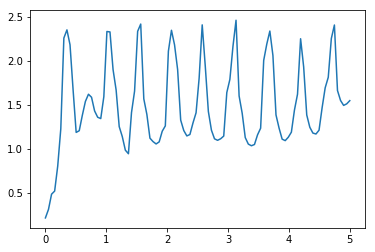

In [507]:
plt.figure()
plt.plot(zs,devs)
plt.show()

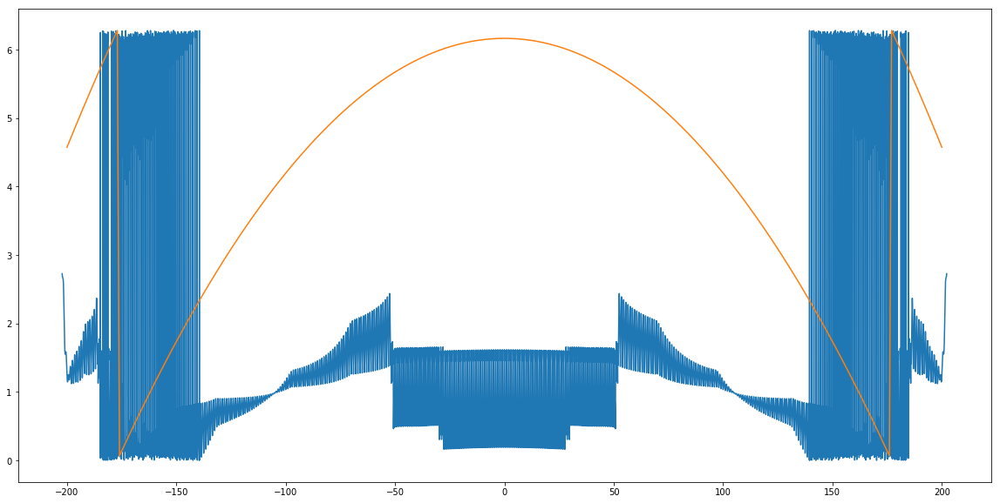

In [585]:
h_slice = np.linspace(-metalens_params['aperture']/2,metalens_params['aperture']/2,phases.shape[1])
v_slice = np.linspace(-metalens_params['simulation height']/2,metalens_params['simulation height']/2,phases.shape[0])
num_windows = 30
magic_index = find_closest_index(v_slice,3.0)
plt.figure(figsize=(20,10))
plt.plot(np.convolve(h_slice, np.ones((num_windows,))/num_windows, mode='valid'),
         np.convolve(phases[magic_index], np.ones((num_windows,))/num_windows, mode='valid')%(2*np.pi))
#plt.plot(h_slice,mags[magic_index])
plt.plot(make_metalens_geometry(metalens_params)[4],make_metalens_geometry(metalens_params)[2]%(2*np.pi))
#plt.xlim(-40,40)
plt.show()

In [586]:
re = np.real(np.cumsum(np.exp(1j*phases[magic_index])))
im = np.imag(np.cumsum(np.exp(1j*phases[magic_index])))

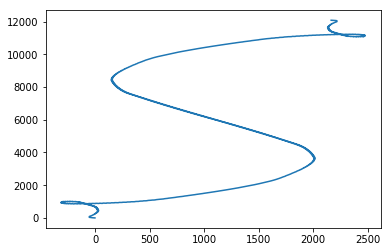

In [587]:
plt.figure()
plt.plot(re,im)
plt.show()

## Redesign of mask using phases from S4 (exploring several resolutions)

In [2]:
np.linspace(-1,1,3)

array([-1.,  0.,  1.])

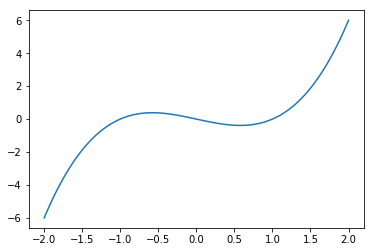

In [3]:
x = np.linspace(-2,2,100)
y = x**3-x
plt.figure()
plt.plot(x,y)
plt.show()

In [4]:
phases =  pickle.load(open('/Users/juan/Google Drive/Zia Lab/CEM/S4/phases.pkl','rb'))

In [112]:
def function_topper(x,y):
    clean_x = []
    clean_y = []
    # first determine if the top function will be increasing or decreasing
    if y[1] > y[0]:
        sign = 1
    elif y[1] < y[0]:
        sign = -1
    else:
        print('undetermined sign')
    yp_current = y[0]
    clean_x = [x[0]]
    clean_y = [y[0]]
    for index in range(len(x)-1):
        xp = x[index]
        yp = y[index]
        next_xp = x[index+1]
        next_yp = y[index+1]
        if sign == 1:
            if (next_yp > yp) and next_yp > max(clean_y):
                clean_x.append(xp)
                clean_y.append(yp)
        if sign == -1:
            if (next_yp < yp) and next_yp < min(clean_y):
                clean_x.append(xp)
                clean_y.append(yp)
    return np.array(clean_x), np.array(clean_y)

In [113]:
# returns a list with the meep geometries
def make_metalens_geometry(metalens_params):
    # first design the mask based on the given widths and corresponding phases
    widths = metalens_params['widths']
    phases = metalens_params['phases']
    wavelength = metalens_params['wavelength']
    good_widths = (widths > metalens_params['min width'])
    widths = widths[good_widths]
    phases = phases[good_widths]
    phases = phases - min(phases)
    aperture = metalens_params['aperture']
    aperture = metalens_params['aperture']
    f = metalens_params['focal length']
    # compute the required phases based on the wavelength, focal length and number of unit cells
    if (max(phases)-min(phases)) < 2*np.pi:
        print((max(phases)-min(phases)))
        return "not a full phase coverage"
    x, y = function_topper(widths, phases)
    axis_positions = np.linspace(-metalens_params['unit cell size']*(metalens_params['num of unit cells']-1)/2,
                                 metalens_params['unit cell size']*(metalens_params['num of unit cells']-1)/2,
                                metalens_params['num of unit cells'])
    required_phases = -2*np.pi/wavelength*(np.sqrt(axis_positions**2+f**2)-f)
    required_phases = required_phases - min(required_phases)
    required_phases = required_phases 
    required_widths = np.interp(required_phases, y, x)
#     return axis_positions, required_widths
    hairline = [mp.Block(size=mp.Vector3(w, metalens_params['height of fins']),
                    center = mp.Vector3(position,metalens_params['height of fins']/2.),
                    material = mp.Medium(epsilon = metalens_params['epsilon posts'])) for w, position in zip(required_widths, axis_positions)]
    substrate = [mp.Block(size = mp.Vector3(aperture,metalens_params['substrate thickness']),
                        center = mp.Vector3(0,-metalens_params['substrate thickness']/2),
                        material = mp.Medium(epsilon = metalens_params['epsilon substrate']))]
    return metalens_params, substrate + hairline

In [8]:
# plt.figure(figsize=(10,5))
# plt.plot(make_metalens_geometry(metalens_params)[0],make_metalens_geometry(metalens_params)[1]%(2*np.pi))
# plt.plot(*make_metalens_geometry(metalens_params),'ko',ms=0.5)
# plt.xlabel('x/$\mu$m')
# plt.ylabel('w/$\mu$m')
# plt.show()

In [322]:
Sx = sim.get_array(component=mp.Sx)

In [323]:
Sx.shape

(32400, 1600)

In [48]:
metalens_params = {'height of fins':1.5,
                  'focal length':30000,
                  'unit cell size': 1,
                  'num of unit cells': 401,
                  'epsilon substrate':2.13159,
                  'epsilon posts':2.3104,
                  'phases': phases['phases'],
                  'widths': phases['post_widths'],
                  'wavelength': 0.532,
                  'min width': 0.05,
                  'substrate thickness': 10,
                  'source width': 2,
                  'pml width': 1,
                  'resolution': 20}
metalens_params['source depth'] = metalens_params['substrate thickness']/2
metalens_params['simulation height'] = metalens_params['substrate thickness']*2
metalens_params['simulation time'] = 2* (metalens_params['substrate thickness']*2 / metalens_params['wavelength'])
metalens_params['frequency'] = 1./metalens_params['wavelength']
metalens_params['near2far_offset'] = metalens_params['height of fins'] * 2
metalens_params['aperture'] = metalens_params['unit cell size'] * (metalens_params['num of unit cells']+4)
metalens_params['NA'] = np.sin(np.arctan(metalens_params['aperture']/2/metalens_params['focal length']))
metalens_params['f#'] = metalens_params['focal length'] / metalens_params['aperture']

metalens_params, geometry = make_metalens_geometry(metalens_params)
cell = mp.Vector3(metalens_params['aperture'],
                  metalens_params['substrate thickness']*2)

pml_layers = [mp.PML(metalens_params['pml width'])]

sources = [mp.Source(src=mp.ContinuousSource(wavelength=metalens_params['wavelength'],
                                             width = metalens_params['source width']),
                    component=mp.Ez,
                    center=mp.Vector3(0,-metalens_params['source depth']),
                    size=mp.Vector3(metalens_params['aperture'] - 2*metalens_params['pml width'],0))]

sim = mp.Simulation(cell_size=cell,
                   boundary_layers=pml_layers,
                   geometry=geometry,
                   sources=sources,
                   resolution=metalens_params['resolution'])

nearfield = sim.add_near2far(
   metalens_params['frequency'] , 0, 1,
   mp.Near2FarRegion(center=mp.Vector3(0, metalens_params['near2far_offset']), 
                     size=mp.Vector3(metalens_params['aperture']), weight=1.0))
sim.init_sim()
sim.run(until=metalens_params['simulation time'])

-----------
Initializing structure...
Meep progress: 1.625/75.18796992481202 = 2.2% done in 4.0s, 183.3s to go
Meep progress: 3.7750000000000004/75.18796992481202 = 5.0% done in 8.1s, 153.0s to go
Meep progress: 6.0/75.18796992481202 = 8.0% done in 12.1s, 139.9s to go
Meep progress: 8.200000000000001/75.18796992481202 = 10.9% done in 16.1s, 131.8s to go
Meep progress: 10.4/75.18796992481202 = 13.8% done in 20.1s, 125.4s to go
Meep progress: 12.600000000000001/75.18796992481202 = 16.8% done in 24.1s, 119.9s to go
Meep progress: 14.825000000000001/75.18796992481202 = 19.7% done in 28.2s, 114.7s to go
Meep progress: 17.05/75.18796992481202 = 22.7% done in 32.2s, 109.8s to go
Meep progress: 19.225/75.18796992481202 = 25.6% done in 36.2s, 105.5s to go
Meep progress: 21.425/75.18796992481202 = 28.5% done in 40.3s, 101.0s to go
Meep progress: 23.575000000000003/75.18796992481202 = 31.4% done in 44.3s, 96.9s to go
Meep progress: 25.775000000000002/75.18796992481202 = 34.3% done in 48.3s, 92.6s

In [49]:
eps = sim.get_array(component=mp.Dielectric).transpose()
ez = sim.get_array(component=mp.Ez).transpose()

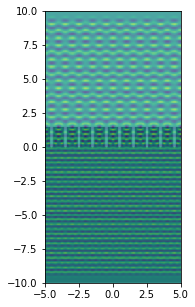

In [50]:
plt.figure(figsize=(20,5))
plt.imshow(ez,extent=[-metalens_params['aperture']/2,
                       metalens_params['aperture']/2,
                      -metalens_params['simulation height']/2,
                      metalens_params['simulation height']/2],
          origin='lower')
plt.imshow(eps,extent=[-metalens_params['aperture']/2,
                       metalens_params['aperture']/2,
                      -metalens_params['simulation height']/2,
                      metalens_params['simulation height']/2],
          origin='lower',
          cmap='binary',
          alpha=0.2)
plt.xlim(-5,5)
plt.show()

In [51]:
num_farfield_points = 120
axis_values = np.linspace(0,metalens_params['focal length']*4, num_farfield_points)
faraway = np.array([sum(np.abs(np.array(sim.get_farfield(nearfield, mp.Vector3(0,y))))[:3]**2) for y in axis_values])
axis_values *= 1e-4

In [104]:
faraway_dictionary = {}
faraway_dictionary[metalens_params['resolution']] = {'axis_values': axis_values, 'faraway':faraway}

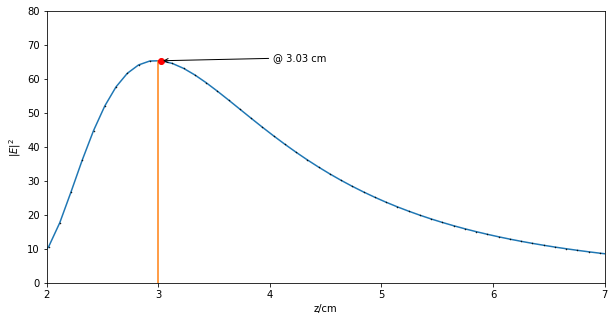

In [52]:
plt.figure(figsize=(10,5))
plt.plot(axis_values, faraway)
plt.plot(axis_values, faraway, 'ko',ms=0.5)
plt.xlabel('z/cm')
plt.ylabel('$|E|^2$')
plt.plot([metalens_params['focal length']/1e4]*2,[min(faraway),max(faraway)])
plt.ylim(0,80)
plt.xlim(2,7)
plt.plot([axis_values[np.argmax(faraway)]],[max(faraway)],'ro')
plt.annotate('@ %.2f cm' % axis_values[np.argmax(faraway)],(axis_values[np.argmax(faraway)],max(faraway)),
             xytext=(axis_values[np.argmax(faraway)]+1,max(faraway)),
            arrowprops=dict(arrowstyle="->",
                            connectionstyle="arc3"))
plt.show()

In [85]:
num_farfield_points = 120
lateral_values = np.linspace(-200,200, num_farfield_points)
lateral_faraway = np.array([sum(np.abs(np.array(sim.get_farfield(nearfield, mp.Vector3(x,axis_values[np.argmax(faraway)]*1e4))))[:3]**2) for x in lateral_values])

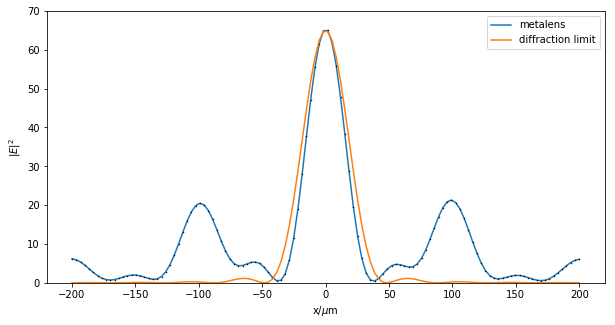

In [102]:
plt.figure(figsize=(10,5))
sigma = 0.42 * metalens_params['wavelength'] * metalens_params['f#']
plt.plot(lateral_values, lateral_faraway,label='metalens')
plt.plot(lateral_values, lateral_faraway, 'ko',ms=0.5)
bessel_x = np.pi/metalens_params['wavelength']/metalens_params['f#']*lateral_values
plt.plot(lateral_values, max(lateral_faraway)*(2*jn(1,bessel_x)/bessel_x)**2,label='diffraction limit')
plt.xlabel('x/$\mu$m')
plt.ylabel('$|E|^2$')
plt.legend()
plt.ylim(0,70)
plt.show()

In [106]:
import time

In [107]:
time.time()

1542753657.569342

In [128]:
times.append(time.time())
#faraway_dictionary = {}
for res in [70,80]:
    print(res, end=', ')
    metalens_params = {'height of fins':1.5,
                      'focal length':30000,
                      'unit cell size': 1,
                      'num of unit cells': 401,
                      'epsilon substrate':2.13159,
                      'epsilon posts':2.3104,
                      'phases': phases['phases'],
                      'widths': phases['post_widths'],
                      'wavelength': 0.532,
                      'min width': 0.05,
                      'substrate thickness': 10,
                      'source width': 2,
                      'pml width': 1,
                      'resolution': res}
    metalens_params['source depth'] = metalens_params['substrate thickness']/2
    metalens_params['simulation height'] = metalens_params['substrate thickness']*2
    metalens_params['simulation time'] = 2* (metalens_params['substrate thickness']*2 / metalens_params['wavelength'])
    metalens_params['frequency'] = 1./metalens_params['wavelength']
    metalens_params['aperture'] = metalens_params['unit cell size'] * (metalens_params['num of unit cells']+4)
    metalens_params['near2far_offset'] = metalens_params['height of fins'] * 2
    metalens_params['NA'] = np.sin(np.arctan(metalens_params['aperture']/2/metalens_params['focal length']))
    metalens_params['f#'] = metalens_params['focal length'] / metalens_params['aperture']

    metalens_params, geometry = make_metalens_geometry(metalens_params)
    cell = mp.Vector3(metalens_params['aperture'],
                      metalens_params['substrate thickness']*2)

    pml_layers = [mp.PML(metalens_params['pml width'])]

    sources = [mp.Source(src=mp.ContinuousSource(wavelength=metalens_params['wavelength'],
                                                 width = metalens_params['source width']),
                        component=mp.Ez,
                        center=mp.Vector3(0,-metalens_params['source depth']),
                        size=mp.Vector3(metalens_params['aperture'] - 2*metalens_params['pml width'],0))]

    sim = mp.Simulation(cell_size=cell,
                       boundary_layers=pml_layers,
                       geometry=geometry,
                       sources=sources,
                       resolution=metalens_params['resolution'])

    nearfield = sim.add_near2far(
       metalens_params['frequency'] , 0, 1,
       mp.Near2FarRegion(center=mp.Vector3(0, metalens_params['near2far_offset']), 
                         size=mp.Vector3(metalens_params['aperture']), weight=1.0))
    sim.init_sim()
    sim.run(until=metalens_params['simulation time'])

    num_farfield_points = 120
    axis_values = np.linspace(0,metalens_params['focal length']*4, num_farfield_points)
    faraway = np.array([sum(np.abs(np.array(sim.get_farfield(nearfield, mp.Vector3(0,y))))[:3]**2) for y in axis_values])

    
    lateral_values = np.linspace(-200,200, num_farfield_points)
    lateral_faraway = np.array([sum(np.abs(np.array(sim.get_farfield(nearfield, mp.Vector3(x,axis_values[np.argmax(faraway)]))))[:3]**2) for x in lateral_values])
    
    faraway_dictionary[metalens_params['resolution']] = {'axis_values': axis_values, 'faraway':faraway,
                                                        'lateral_values': lateral_values, 'lateral_faraway': lateral_faraway}
    times.append(time.time())

70, -----------
Initializing structure...
Meep progress: 0.007142857142857143/75.18796992481202 = 0.0% done in 6.1s, 64583.3s to go
Meep progress: 0.07142857142857142/75.18796992481202 = 0.1% done in 10.6s, 11178.0s to go
Meep progress: 0.12857142857142856/75.18796992481202 = 0.2% done in 14.7s, 8578.1s to go
Meep progress: 0.18571428571428572/75.18796992481202 = 0.2% done in 18.7s, 7556.1s to go
Meep progress: 0.24285714285714285/75.18796992481202 = 0.3% done in 22.7s, 7013.2s to go
Meep progress: 0.3/75.18796992481202 = 0.4% done in 26.8s, 6698.5s to go
Meep progress: 0.36428571428571427/75.18796992481202 = 0.5% done in 31.3s, 6434.4s to go
Meep progress: 0.42857142857142855/75.18796992481202 = 0.6% done in 35.8s, 6249.0s to go
Meep progress: 0.4857142857142857/75.18796992481202 = 0.6% done in 39.8s, 6127.0s to go
Meep progress: 0.5428571428571428/75.18796992481202 = 0.7% done in 43.9s, 6030.8s to go
Meep progress: 0.6/75.18796992481202 = 0.8% done in 47.9s, 5949.7s to go
Meep progre

Meep progress: 5.514285714285714/75.18796992481202 = 7.3% done in 410.4s, 5185.5s to go
Meep progress: 5.571428571428571/75.18796992481202 = 7.4% done in 414.8s, 5182.6s to go
Meep progress: 5.628571428571428/75.18796992481202 = 7.5% done in 419.1s, 5179.5s to go
Meep progress: 5.685714285714286/75.18796992481202 = 7.6% done in 423.5s, 5176.5s to go
Meep progress: 5.742857142857143/75.18796992481202 = 7.6% done in 427.9s, 5173.7s to go
Meep progress: 5.8/75.18796992481202 = 7.7% done in 432.2s, 5170.7s to go
Meep progress: 5.857142857142857/75.18796992481202 = 7.8% done in 436.6s, 5168.6s to go
Meep progress: 5.914285714285714/75.18796992481202 = 7.9% done in 441.2s, 5167.2s to go
Meep progress: 5.9714285714285715/75.18796992481202 = 7.9% done in 445.5s, 5164.4s to go
Meep progress: 6.0285714285714285/75.18796992481202 = 8.0% done in 449.9s, 5161.3s to go
Meep progress: 6.085714285714285/75.18796992481202 = 8.1% done in 454.3s, 5158.1s to go
Meep progress: 6.142857142857142/75.18796992

Meep progress: 10.735714285714286/75.18796992481202 = 14.3% done in 823.5s, 4943.8s to go
Meep progress: 10.792857142857143/75.18796992481202 = 14.4% done in 827.5s, 4937.3s to go
Meep progress: 10.85/75.18796992481202 = 14.4% done in 831.6s, 4931.4s to go
Meep progress: 10.907142857142857/75.18796992481202 = 14.5% done in 835.7s, 4924.9s to go
Meep progress: 10.964285714285714/75.18796992481202 = 14.6% done in 839.7s, 4918.7s to go
Meep progress: 11.02142857142857/75.18796992481202 = 14.7% done in 843.7s, 4912.1s to go
Meep progress: 11.085714285714285/75.18796992481202 = 14.7% done in 848.2s, 4904.7s to go
Meep progress: 11.15/75.18796992481202 = 14.8% done in 852.7s, 4897.4s to go
Meep progress: 11.207142857142857/75.18796992481202 = 14.9% done in 856.9s, 4891.7s to go
Meep progress: 11.264285714285714/75.18796992481202 = 15.0% done in 860.9s, 4885.5s to go
Meep progress: 11.321428571428571/75.18796992481202 = 15.1% done in 864.9s, 4879.2s to go
Meep progress: 11.385714285714286/75.

Meep progress: 16.257142857142856/75.18796992481202 = 21.6% done in 1212.7s, 4395.9s to go
Meep progress: 16.314285714285713/75.18796992481202 = 21.7% done in 1216.7s, 4390.9s to go
Meep progress: 16.37142857142857/75.18796992481202 = 21.8% done in 1220.8s, 4386.0s to go
Meep progress: 16.428571428571427/75.18796992481202 = 21.8% done in 1224.9s, 4381.0s to go
Meep progress: 16.485714285714284/75.18796992481202 = 21.9% done in 1228.9s, 4375.9s to go
Meep progress: 16.55/75.18796992481202 = 22.0% done in 1233.4s, 4370.0s to go
Meep progress: 16.614285714285714/75.18796992481202 = 22.1% done in 1237.9s, 4364.1s to go
Meep progress: 16.67142857142857/75.18796992481202 = 22.2% done in 1241.9s, 4359.0s to go
Meep progress: 16.728571428571428/75.18796992481202 = 22.2% done in 1246.0s, 4354.2s to go
Meep progress: 16.785714285714285/75.18796992481202 = 22.3% done in 1250.1s, 4349.3s to go
Meep progress: 16.84285714285714/75.18796992481202 = 22.4% done in 1254.1s, 4344.3s to go
Meep progress: 

Meep progress: 21.835714285714285/75.18796992481202 = 29.0% done in 1605.7s, 3923.2s to go
Meep progress: 21.892857142857142/75.18796992481202 = 29.1% done in 1609.7s, 3918.5s to go
Meep progress: 21.95/75.18796992481202 = 29.2% done in 1613.8s, 3914.0s to go
Meep progress: 22.007142857142856/75.18796992481202 = 29.3% done in 1617.8s, 3909.5s to go
Meep progress: 22.07142857142857/75.18796992481202 = 29.4% done in 1622.3s, 3904.2s to go
Meep progress: 22.135714285714286/75.18796992481202 = 29.4% done in 1626.8s, 3898.9s to go
Meep progress: 22.2/75.18796992481202 = 29.5% done in 1631.3s, 3893.6s to go
Meep progress: 22.264285714285712/75.18796992481202 = 29.6% done in 1635.8s, 3888.4s to go
Meep progress: 22.32142857142857/75.18796992481202 = 29.7% done in 1639.9s, 3884.0s to go
Meep progress: 22.378571428571426/75.18796992481202 = 29.8% done in 1644.0s, 3879.5s to go
Meep progress: 22.442857142857143/75.18796992481202 = 29.8% done in 1648.5s, 3874.2s to go
Meep progress: 22.5/75.18796

Meep progress: 27.485714285714284/75.18796992481202 = 36.6% done in 2004.0s, 3478.0s to go
Meep progress: 27.54285714285714/75.18796992481202 = 36.6% done in 2008.0s, 3473.6s to go
Meep progress: 27.599999999999998/75.18796992481202 = 36.7% done in 2012.0s, 3469.1s to go
Meep progress: 27.657142857142855/75.18796992481202 = 36.8% done in 2016.0s, 3464.7s to go
Meep progress: 27.72142857142857/75.18796992481202 = 36.9% done in 2020.5s, 3459.7s to go
Meep progress: 27.77857142857143/75.18796992481202 = 36.9% done in 2024.6s, 3455.4s to go
Meep progress: 27.835714285714285/75.18796992481202 = 37.0% done in 2028.6s, 3451.0s to go
Meep progress: 27.892857142857142/75.18796992481202 = 37.1% done in 2032.7s, 3446.7s to go
Meep progress: 27.95/75.18796992481202 = 37.2% done in 2036.7s, 3442.2s to go
Meep progress: 28.014285714285712/75.18796992481202 = 37.3% done in 2041.2s, 3437.2s to go
Meep progress: 28.07142857142857/75.18796992481202 = 37.3% done in 2045.2s, 3432.8s to go
Meep progress: 2

Meep progress: 33.028571428571425/75.18796992481202 = 43.9% done in 2394.3s, 3056.2s to go
Meep progress: 33.08571428571428/75.18796992481202 = 44.0% done in 2398.4s, 3052.1s to go
Meep progress: 33.14285714285714/75.18796992481202 = 44.1% done in 2402.4s, 3047.7s to go
Meep progress: 33.207142857142856/75.18796992481202 = 44.2% done in 2406.9s, 3042.9s to go
Meep progress: 33.27142857142857/75.18796992481202 = 44.3% done in 2411.4s, 3038.0s to go
Meep progress: 33.32857142857143/75.18796992481202 = 44.3% done in 2415.4s, 3033.7s to go
Meep progress: 33.39285714285714/75.18796992481202 = 44.4% done in 2419.9s, 3028.8s to go
Meep progress: 33.449999999999996/75.18796992481202 = 44.5% done in 2424.0s, 3024.6s to go
Meep progress: 33.50714285714285/75.18796992481202 = 44.6% done in 2428.0s, 3020.3s to go
Meep progress: 33.56428571428572/75.18796992481202 = 44.6% done in 2432.0s, 3015.9s to go
Meep progress: 33.628571428571426/75.18796992481202 = 44.7% done in 2436.5s, 3011.1s to go
Meep p

Meep progress: 38.542857142857144/75.18796992481202 = 51.3% done in 2782.8s, 2645.8s to go
Meep progress: 38.6/75.18796992481202 = 51.3% done in 2786.8s, 2641.6s to go
Meep progress: 38.65714285714286/75.18796992481202 = 51.4% done in 2790.8s, 2637.3s to go
Meep progress: 38.72142857142857/75.18796992481202 = 51.5% done in 2795.3s, 2632.5s to go
Meep progress: 38.785714285714285/75.18796992481202 = 51.6% done in 2799.8s, 2627.8s to go
Meep progress: 38.84285714285714/75.18796992481202 = 51.7% done in 2803.8s, 2623.5s to go
Meep progress: 38.9/75.18796992481202 = 51.7% done in 2807.8s, 2619.3s to go
Meep progress: 38.957142857142856/75.18796992481202 = 51.8% done in 2811.9s, 2615.1s to go
Meep progress: 39.01428571428571/75.18796992481202 = 51.9% done in 2816.0s, 2611.0s to go
Meep progress: 39.07857142857143/75.18796992481202 = 52.0% done in 2820.5s, 2606.2s to go
Meep progress: 39.135714285714286/75.18796992481202 = 52.1% done in 2824.5s, 2602.0s to go
Meep progress: 39.19999999999999

Meep progress: 44.128571428571426/75.18796992481202 = 58.7% done in 3175.9s, 2235.3s to go
Meep progress: 44.18571428571428/75.18796992481202 = 58.8% done in 3179.9s, 2231.2s to go
Meep progress: 44.25/75.18796992481202 = 58.9% done in 3184.4s, 2226.4s to go
Meep progress: 44.30714285714286/75.18796992481202 = 58.9% done in 3188.4s, 2222.3s to go
Meep progress: 44.37142857142857/75.18796992481202 = 59.0% done in 3192.9s, 2217.5s to go
Meep progress: 44.42857142857143/75.18796992481202 = 59.1% done in 3196.9s, 2213.3s to go
Meep progress: 44.48571428571429/75.18796992481202 = 59.2% done in 3201.0s, 2209.2s to go
Meep progress: 44.542857142857144/75.18796992481202 = 59.2% done in 3205.0s, 2205.0s to go
Meep progress: 44.6/75.18796992481202 = 59.3% done in 3209.1s, 2200.9s to go
Meep progress: 44.66428571428571/75.18796992481202 = 59.4% done in 3213.6s, 2196.2s to go
Meep progress: 44.72142857142857/75.18796992481202 = 59.5% done in 3217.6s, 2192.0s to go
Meep progress: 44.778571428571425

Meep progress: 49.707142857142856/75.18796992481202 = 66.1% done in 3568.6s, 1829.3s to go
Meep progress: 49.76428571428571/75.18796992481202 = 66.2% done in 3572.6s, 1825.2s to go
Meep progress: 49.82857142857143/75.18796992481202 = 66.3% done in 3577.1s, 1820.5s to go
Meep progress: 49.89285714285714/75.18796992481202 = 66.4% done in 3581.6s, 1815.8s to go
Meep progress: 49.949999999999996/75.18796992481202 = 66.4% done in 3585.6s, 1811.7s to go
Meep progress: 50.01428571428571/75.18796992481202 = 66.5% done in 3590.1s, 1807.0s to go
Meep progress: 50.07857142857143/75.18796992481202 = 66.6% done in 3594.6s, 1802.3s to go
Meep progress: 50.135714285714286/75.18796992481202 = 66.7% done in 3598.7s, 1798.2s to go
Meep progress: 50.19285714285714/75.18796992481202 = 66.8% done in 3602.7s, 1794.1s to go
Meep progress: 50.25714285714285/75.18796992481202 = 66.8% done in 3607.2s, 1789.4s to go
Meep progress: 50.32142857142857/75.18796992481202 = 66.9% done in 3611.7s, 1784.8s to go
Meep pr

Meep progress: 55.25/75.18796992481202 = 73.5% done in 3958.7s, 1428.6s to go
Meep progress: 55.30714285714286/75.18796992481202 = 73.6% done in 3962.7s, 1424.4s to go
Meep progress: 55.37142857142857/75.18796992481202 = 73.6% done in 3967.2s, 1419.8s to go
Meep progress: 55.42857142857142/75.18796992481202 = 73.7% done in 3971.2s, 1415.7s to go
Meep progress: 55.49285714285714/75.18796992481202 = 73.8% done in 3975.7s, 1411.0s to go
Meep progress: 55.55/75.18796992481202 = 73.9% done in 3979.7s, 1406.9s to go
Meep progress: 55.614285714285714/75.18796992481202 = 74.0% done in 3984.2s, 1402.2s to go
Meep progress: 55.67142857142857/75.18796992481202 = 74.0% done in 3988.2s, 1398.1s to go
Meep progress: 55.72857142857143/75.18796992481202 = 74.1% done in 3992.3s, 1394.1s to go
Meep progress: 55.785714285714285/75.18796992481202 = 74.2% done in 3996.4s, 1389.9s to go
Meep progress: 55.85/75.18796992481202 = 74.3% done in 4000.9s, 1385.3s to go
Meep progress: 55.90714285714286/75.18796992

Meep progress: 60.81428571428571/75.18796992481202 = 80.9% done in 4350.7s, 1028.3s to go
Meep progress: 60.87142857142857/75.18796992481202 = 81.0% done in 4354.8s, 1024.2s to go
Meep progress: 60.93571428571428/75.18796992481202 = 81.0% done in 4359.3s, 1019.6s to go
Meep progress: 61.0/75.18796992481202 = 81.1% done in 4363.8s, 1015.0s to go
Meep progress: 61.05714285714286/75.18796992481202 = 81.2% done in 4367.8s, 1010.9s to go
Meep progress: 61.114285714285714/75.18796992481202 = 81.3% done in 4371.9s, 1006.8s to go
Meep progress: 61.17142857142857/75.18796992481202 = 81.4% done in 4375.9s, 1002.7s to go
Meep progress: 61.22857142857143/75.18796992481202 = 81.4% done in 4379.9s, 998.6s to go
Meep progress: 61.292857142857144/75.18796992481202 = 81.5% done in 4384.4s, 993.9s to go
Meep progress: 61.357142857142854/75.18796992481202 = 81.6% done in 4388.9s, 989.3s to go
Meep progress: 61.42142857142857/75.18796992481202 = 81.7% done in 4393.4s, 984.7s to go
Meep progress: 61.478571

Meep progress: 66.40714285714286/75.18796992481202 = 88.3% done in 4745.9s, 627.5s to go
Meep progress: 66.47142857142858/75.18796992481202 = 88.4% done in 4750.4s, 622.9s to go
Meep progress: 66.52857142857142/75.18796992481202 = 88.5% done in 4754.5s, 618.8s to go
Meep progress: 66.58571428571429/75.18796992481202 = 88.6% done in 4758.5s, 614.8s to go
Meep progress: 66.64285714285714/75.18796992481202 = 88.6% done in 4762.6s, 610.7s to go
Meep progress: 66.7/75.18796992481202 = 88.7% done in 4766.6s, 606.6s to go
Meep progress: 66.75714285714285/75.18796992481202 = 88.8% done in 4770.6s, 602.5s to go
Meep progress: 66.81428571428572/75.18796992481202 = 88.9% done in 4774.7s, 598.4s to go
Meep progress: 66.87857142857143/75.18796992481202 = 88.9% done in 4779.3s, 593.8s to go
Meep progress: 66.93571428571428/75.18796992481202 = 89.0% done in 4783.3s, 589.7s to go
Meep progress: 66.99285714285715/75.18796992481202 = 89.1% done in 4787.3s, 585.6s to go
Meep progress: 67.05/75.1879699248

Meep progress: 71.91428571428571/75.18796992481202 = 95.6% done in 5134.3s, 233.7s to go
Meep progress: 71.97142857142858/75.18796992481202 = 95.7% done in 5138.3s, 229.6s to go
Meep progress: 72.02857142857142/75.18796992481202 = 95.8% done in 5142.3s, 225.6s to go
Meep progress: 72.09285714285714/75.18796992481202 = 95.9% done in 5146.8s, 221.0s to go
Meep progress: 72.14999999999999/75.18796992481202 = 96.0% done in 5150.8s, 216.9s to go
Meep progress: 72.20714285714286/75.18796992481202 = 96.0% done in 5154.8s, 212.8s to go
Meep progress: 72.2642857142857/75.18796992481202 = 96.1% done in 5158.8s, 208.7s to go
Meep progress: 72.32142857142857/75.18796992481202 = 96.2% done in 5162.8s, 204.6s to go
Meep progress: 72.37857142857142/75.18796992481202 = 96.3% done in 5166.9s, 200.6s to go
Meep progress: 72.43571428571428/75.18796992481202 = 96.3% done in 5171.0s, 196.5s to go
Meep progress: 72.49285714285715/75.18796992481202 = 96.4% done in 5175.0s, 192.4s to go
Meep progress: 72.5571

Meep progress: 1.675/75.18796992481202 = 2.2% done in 182.3s, 8000.3s to go
Meep progress: 1.71875/75.18796992481202 = 2.3% done in 186.9s, 7989.3s to go
Meep progress: 1.7625000000000002/75.18796992481202 = 2.3% done in 191.4s, 7975.0s to go
Meep progress: 1.8062500000000001/75.18796992481202 = 2.4% done in 196.0s, 7961.6s to go
Meep progress: 1.85/75.18796992481202 = 2.5% done in 200.6s, 7953.2s to go
Meep progress: 1.89375/75.18796992481202 = 2.5% done in 205.2s, 7943.5s to go
Meep progress: 1.9375/75.18796992481202 = 2.6% done in 209.8s, 7931.7s to go
Meep progress: 1.9812500000000002/75.18796992481202 = 2.6% done in 214.4s, 7920.9s to go
Meep progress: 2.025/75.18796992481202 = 2.7% done in 218.9s, 7909.1s to go
Meep progress: 2.06875/75.18796992481202 = 2.8% done in 223.5s, 7899.9s to go
Meep progress: 2.10625/75.18796992481202 = 2.8% done in 227.6s, 7897.8s to go
Meep progress: 2.1437500000000003/75.18796992481202 = 2.9% done in 231.9s, 7900.6s to go
Meep progress: 2.18125/75.18

Meep progress: 5.55625/75.18796992481202 = 7.4% done in 623.9s, 7818.3s to go
Meep progress: 5.59375/75.18796992481202 = 7.4% done in 628.1s, 7814.3s to go
Meep progress: 5.6312500000000005/75.18796992481202 = 7.5% done in 632.3s, 7810.1s to go
Meep progress: 5.66875/75.18796992481202 = 7.5% done in 636.7s, 7807.6s to go
Meep progress: 5.706250000000001/75.18796992481202 = 7.6% done in 640.9s, 7804.1s to go
Meep progress: 5.74375/75.18796992481202 = 7.6% done in 645.1s, 7799.9s to go
Meep progress: 5.78125/75.18796992481202 = 7.7% done in 649.3s, 7795.7s to go
Meep progress: 5.8187500000000005/75.18796992481202 = 7.7% done in 653.6s, 7791.5s to go
Meep progress: 5.85625/75.18796992481202 = 7.8% done in 657.8s, 7787.4s to go
Meep progress: 5.893750000000001/75.18796992481202 = 7.8% done in 662.0s, 7783.8s to go
Meep progress: 5.93125/75.18796992481202 = 7.9% done in 666.3s, 7780.3s to go
Meep progress: 5.96875/75.18796992481202 = 7.9% done in 670.7s, 7777.6s to go
Meep progress: 6.00625

Meep progress: 9.38125/75.18796992481202 = 12.5% done in 1061.1s, 7443.0s to go
Meep progress: 9.418750000000001/75.18796992481202 = 12.5% done in 1065.3s, 7439.1s to go
Meep progress: 9.45625/75.18796992481202 = 12.6% done in 1069.6s, 7435.2s to go
Meep progress: 9.49375/75.18796992481202 = 12.6% done in 1073.9s, 7431.3s to go
Meep progress: 9.53125/75.18796992481202 = 12.7% done in 1078.2s, 7427.6s to go
Meep progress: 9.56875/75.18796992481202 = 12.7% done in 1082.6s, 7424.0s to go
Meep progress: 9.606250000000001/75.18796992481202 = 12.8% done in 1086.9s, 7420.0s to go
Meep progress: 9.64375/75.18796992481202 = 12.8% done in 1091.2s, 7416.2s to go
Meep progress: 9.68125/75.18796992481202 = 12.9% done in 1095.5s, 7412.3s to go
Meep progress: 9.71875/75.18796992481202 = 12.9% done in 1099.8s, 7408.4s to go
Meep progress: 9.756250000000001/75.18796992481202 = 13.0% done in 1104.0s, 7404.4s to go
Meep progress: 9.793750000000001/75.18796992481202 = 13.0% done in 1108.4s, 7400.6s to go


Meep progress: 13.25/75.18796992481202 = 17.6% done in 1493.1s, 6979.5s to go
Meep progress: 13.293750000000001/75.18796992481202 = 17.7% done in 1497.6s, 6972.7s to go
Meep progress: 13.3375/75.18796992481202 = 17.7% done in 1502.1s, 6965.9s to go
Meep progress: 13.381250000000001/75.18796992481202 = 17.8% done in 1506.6s, 6959.1s to go
Meep progress: 13.418750000000001/75.18796992481202 = 17.8% done in 1510.7s, 6953.9s to go
Meep progress: 13.4625/75.18796992481202 = 17.9% done in 1515.2s, 6947.2s to go
Meep progress: 13.506250000000001/75.18796992481202 = 18.0% done in 1519.8s, 6940.6s to go
Meep progress: 13.55/75.18796992481202 = 18.0% done in 1524.3s, 6934.0s to go
Meep progress: 13.59375/75.18796992481202 = 18.1% done in 1528.8s, 6927.3s to go
Meep progress: 13.637500000000001/75.18796992481202 = 18.1% done in 1533.3s, 6920.5s to go
Meep progress: 13.68125/75.18796992481202 = 18.2% done in 1537.9s, 6913.7s to go
Meep progress: 13.71875/75.18796992481202 = 18.2% done in 1541.9s, 

Meep progress: 17.462500000000002/75.18796992481202 = 23.2% done in 1931.8s, 6386.1s to go
Meep progress: 17.50625/75.18796992481202 = 23.3% done in 1936.4s, 6380.3s to go
Meep progress: 17.55/75.18796992481202 = 23.3% done in 1940.9s, 6374.5s to go
Meep progress: 17.59375/75.18796992481202 = 23.4% done in 1945.5s, 6368.6s to go
Meep progress: 17.6375/75.18796992481202 = 23.5% done in 1950.0s, 6362.7s to go
Meep progress: 17.681250000000002/75.18796992481202 = 23.5% done in 1954.5s, 6356.8s to go
Meep progress: 17.725/75.18796992481202 = 23.6% done in 1959.0s, 6351.0s to go
Meep progress: 17.7625/75.18796992481202 = 23.6% done in 1963.0s, 6346.4s to go
Meep progress: 17.806250000000002/75.18796992481202 = 23.7% done in 1967.6s, 6340.7s to go
Meep progress: 17.85/75.18796992481202 = 23.7% done in 1972.1s, 6334.9s to go
Meep progress: 17.89375/75.18796992481202 = 23.8% done in 1976.7s, 6329.1s to go
Meep progress: 17.9375/75.18796992481202 = 23.9% done in 1981.2s, 6323.3s to go
Meep prog

Meep progress: 21.725/75.18796992481202 = 28.9% done in 2375.4s, 5845.5s to go
Meep progress: 21.76875/75.18796992481202 = 29.0% done in 2379.9s, 5840.1s to go
Meep progress: 21.806250000000002/75.18796992481202 = 29.0% done in 2383.9s, 5835.8s to go
Meep progress: 21.85/75.18796992481202 = 29.1% done in 2388.5s, 5830.5s to go
Meep progress: 21.89375/75.18796992481202 = 29.1% done in 2393.0s, 5825.1s to go
Meep progress: 21.9375/75.18796992481202 = 29.2% done in 2397.5s, 5819.7s to go
Meep progress: 21.981250000000003/75.18796992481202 = 29.2% done in 2402.1s, 5814.3s to go
Meep progress: 22.025000000000002/75.18796992481202 = 29.3% done in 2406.6s, 5808.9s to go
Meep progress: 22.06875/75.18796992481202 = 29.4% done in 2411.1s, 5803.5s to go
Meep progress: 22.106250000000003/75.18796992481202 = 29.4% done in 2415.2s, 5799.3s to go
Meep progress: 22.150000000000002/75.18796992481202 = 29.5% done in 2419.7s, 5794.0s to go
Meep progress: 22.19375/75.18796992481202 = 29.5% done in 2424.2s

Meep progress: 25.95625/75.18796992481202 = 34.5% done in 2816.1s, 5341.4s to go
Meep progress: 26.0/75.18796992481202 = 34.6% done in 2820.6s, 5336.2s to go
Meep progress: 26.043750000000003/75.18796992481202 = 34.6% done in 2825.1s, 5331.0s to go
Meep progress: 26.087500000000002/75.18796992481202 = 34.7% done in 2829.7s, 5325.9s to go
Meep progress: 26.13125/75.18796992481202 = 34.8% done in 2834.3s, 5320.9s to go
Meep progress: 26.175/75.18796992481202 = 34.8% done in 2838.9s, 5315.8s to go
Meep progress: 26.21875/75.18796992481202 = 34.9% done in 2843.4s, 5310.7s to go
Meep progress: 26.262500000000003/75.18796992481202 = 34.9% done in 2848.0s, 5305.6s to go
Meep progress: 26.306250000000002/75.18796992481202 = 35.0% done in 2852.5s, 5300.4s to go
Meep progress: 26.35/75.18796992481202 = 35.0% done in 2857.0s, 5295.2s to go
Meep progress: 26.39375/75.18796992481202 = 35.1% done in 2861.5s, 5290.1s to go
Meep progress: 26.4375/75.18796992481202 = 35.2% done in 2866.2s, 5285.2s to g

Meep progress: 30.225/75.18796992481202 = 40.2% done in 3260.5s, 4850.4s to go
Meep progress: 30.26875/75.18796992481202 = 40.3% done in 3265.1s, 4845.4s to go
Meep progress: 30.3125/75.18796992481202 = 40.3% done in 3269.6s, 4840.5s to go
Meep progress: 30.356250000000003/75.18796992481202 = 40.4% done in 3274.2s, 4835.5s to go
Meep progress: 30.400000000000002/75.18796992481202 = 40.4% done in 3278.7s, 4830.5s to go
Meep progress: 30.44375/75.18796992481202 = 40.5% done in 3283.2s, 4825.4s to go
Meep progress: 30.4875/75.18796992481202 = 40.5% done in 3287.7s, 4820.5s to go
Meep progress: 30.53125/75.18796992481202 = 40.6% done in 3292.3s, 4815.5s to go
Meep progress: 30.575000000000003/75.18796992481202 = 40.7% done in 3296.8s, 4810.4s to go
Meep progress: 30.618750000000002/75.18796992481202 = 40.7% done in 3301.3s, 4805.4s to go
Meep progress: 30.6625/75.18796992481202 = 40.8% done in 3305.8s, 4800.4s to go
Meep progress: 30.700000000000003/75.18796992481202 = 40.8% done in 3309.8

Meep progress: 34.487500000000004/75.18796992481202 = 45.9% done in 3704.0s, 4371.3s to go
Meep progress: 34.525/75.18796992481202 = 45.9% done in 3708.0s, 4367.2s to go
Meep progress: 34.56875/75.18796992481202 = 46.0% done in 3712.6s, 4362.4s to go
Meep progress: 34.612500000000004/75.18796992481202 = 46.0% done in 3717.1s, 4357.4s to go
Meep progress: 34.65625/75.18796992481202 = 46.1% done in 3721.6s, 4352.5s to go
Meep progress: 34.7/75.18796992481202 = 46.2% done in 3726.1s, 4347.6s to go
Meep progress: 34.74375/75.18796992481202 = 46.2% done in 3730.6s, 4342.7s to go
Meep progress: 34.7875/75.18796992481202 = 46.3% done in 3735.2s, 4337.8s to go
Meep progress: 34.831250000000004/75.18796992481202 = 46.3% done in 3739.7s, 4333.0s to go
Meep progress: 34.86875/75.18796992481202 = 46.4% done in 3743.8s, 4329.0s to go
Meep progress: 34.9125/75.18796992481202 = 46.4% done in 3748.3s, 4324.1s to go
Meep progress: 34.956250000000004/75.18796992481202 = 46.5% done in 3752.8s, 4319.2s to

Meep progress: 38.7875/75.18796992481202 = 51.6% done in 4151.1s, 3895.7s to go
Meep progress: 38.831250000000004/75.18796992481202 = 51.6% done in 4155.6s, 3890.8s to go
Meep progress: 38.868750000000006/75.18796992481202 = 51.7% done in 4159.7s, 3886.8s to go
Meep progress: 38.9125/75.18796992481202 = 51.8% done in 4164.3s, 3882.1s to go
Meep progress: 38.956250000000004/75.18796992481202 = 51.8% done in 4168.8s, 3877.2s to go
Meep progress: 39.0/75.18796992481202 = 51.9% done in 4173.3s, 3872.4s to go
Meep progress: 39.04375/75.18796992481202 = 51.9% done in 4177.8s, 3867.6s to go
Meep progress: 39.087500000000006/75.18796992481202 = 52.0% done in 4182.3s, 3862.7s to go
Meep progress: 39.13125/75.18796992481202 = 52.0% done in 4186.8s, 3857.9s to go
Meep progress: 39.175000000000004/75.18796992481202 = 52.1% done in 4191.4s, 3853.1s to go
Meep progress: 39.212500000000006/75.18796992481202 = 52.2% done in 4195.4s, 3849.1s to go
Meep progress: 39.25625/75.18796992481202 = 52.2% done 

Meep progress: 47.118750000000006/75.18796992481202 = 62.7% done in 5017.8s, 2989.2s to go
Meep progress: 47.1625/75.18796992481202 = 62.7% done in 5022.3s, 2984.4s to go
Meep progress: 47.206250000000004/75.18796992481202 = 62.8% done in 5026.8s, 2979.7s to go
Meep progress: 47.25/75.18796992481202 = 62.8% done in 5031.4s, 2975.0s to go
Meep progress: 47.29375/75.18796992481202 = 62.9% done in 5036.0s, 2970.3s to go
Meep progress: 47.337500000000006/75.18796992481202 = 63.0% done in 5040.6s, 2965.6s to go
Meep progress: 47.38125/75.18796992481202 = 63.0% done in 5045.1s, 2960.8s to go
Meep progress: 47.425000000000004/75.18796992481202 = 63.1% done in 5049.6s, 2956.1s to go
Meep progress: 47.46875/75.18796992481202 = 63.1% done in 5054.1s, 2951.3s to go
Meep progress: 47.5125/75.18796992481202 = 63.2% done in 5058.6s, 2946.6s to go
Meep progress: 47.550000000000004/75.18796992481202 = 63.2% done in 5062.7s, 2942.6s to go
Meep progress: 47.59375/75.18796992481202 = 63.3% done in 5067.2

Meep progress: 51.375/75.18796992481202 = 68.3% done in 5460.2s, 2530.9s to go
Meep progress: 51.41875/75.18796992481202 = 68.4% done in 5464.7s, 2526.1s to go
Meep progress: 51.462500000000006/75.18796992481202 = 68.4% done in 5469.2s, 2521.4s to go
Meep progress: 51.50625/75.18796992481202 = 68.5% done in 5473.8s, 2516.8s to go
Meep progress: 51.550000000000004/75.18796992481202 = 68.6% done in 5478.4s, 2512.1s to go
Meep progress: 51.59375/75.18796992481202 = 68.6% done in 5482.9s, 2507.4s to go
Meep progress: 51.6375/75.18796992481202 = 68.7% done in 5487.5s, 2502.7s to go
Meep progress: 51.681250000000006/75.18796992481202 = 68.7% done in 5492.1s, 2498.0s to go
Meep progress: 51.725/75.18796992481202 = 68.8% done in 5496.7s, 2493.3s to go
Meep progress: 51.768750000000004/75.18796992481202 = 68.9% done in 5501.2s, 2488.6s to go
Meep progress: 51.8125/75.18796992481202 = 68.9% done in 5505.7s, 2483.9s to go
Meep progress: 51.85625/75.18796992481202 = 69.0% done in 5510.2s, 2479.2s 

Meep progress: 55.5375/75.18796992481202 = 73.9% done in 5894.4s, 2085.6s to go
Meep progress: 55.581250000000004/75.18796992481202 = 73.9% done in 5898.9s, 2080.9s to go
Meep progress: 55.625/75.18796992481202 = 74.0% done in 5903.5s, 2076.2s to go
Meep progress: 55.6625/75.18796992481202 = 74.0% done in 5907.5s, 2072.3s to go
Meep progress: 55.706250000000004/75.18796992481202 = 74.1% done in 5912.1s, 2067.6s to go
Meep progress: 55.75/75.18796992481202 = 74.1% done in 5916.6s, 2062.9s to go
Meep progress: 55.79375/75.18796992481202 = 74.2% done in 5921.1s, 2058.2s to go
Meep progress: 55.837500000000006/75.18796992481202 = 74.3% done in 5925.6s, 2053.5s to go
Meep progress: 55.88125/75.18796992481202 = 74.3% done in 5930.1s, 2048.8s to go
Meep progress: 55.925000000000004/75.18796992481202 = 74.4% done in 5934.7s, 2044.2s to go
Meep progress: 55.96875/75.18796992481202 = 74.4% done in 5939.3s, 2039.5s to go
Meep progress: 56.0125/75.18796992481202 = 74.5% done in 5943.8s, 2034.8s to

Meep progress: 59.775000000000006/75.18796992481202 = 79.5% done in 6335.2s, 1633.5s to go
Meep progress: 59.81875/75.18796992481202 = 79.6% done in 6339.7s, 1628.9s to go
Meep progress: 59.862500000000004/75.18796992481202 = 79.6% done in 6344.2s, 1624.2s to go
Meep progress: 59.90625/75.18796992481202 = 79.7% done in 6348.8s, 1619.5s to go
Meep progress: 59.95/75.18796992481202 = 79.7% done in 6353.3s, 1614.9s to go
Meep progress: 59.987500000000004/75.18796992481202 = 79.8% done in 6357.4s, 1610.9s to go
Meep progress: 60.03125/75.18796992481202 = 79.8% done in 6361.9s, 1606.3s to go
Meep progress: 60.075/75.18796992481202 = 79.9% done in 6366.4s, 1601.6s to go
Meep progress: 60.118750000000006/75.18796992481202 = 80.0% done in 6371.0s, 1596.9s to go
Meep progress: 60.1625/75.18796992481202 = 80.0% done in 6375.6s, 1592.3s to go
Meep progress: 60.206250000000004/75.18796992481202 = 80.1% done in 6380.2s, 1587.6s to go
Meep progress: 60.25/75.18796992481202 = 80.1% done in 6384.7s, 1

Meep progress: 64.04375/75.18796992481202 = 85.2% done in 6779.8s, 1179.8s to go
Meep progress: 64.0875/75.18796992481202 = 85.2% done in 6784.4s, 1175.1s to go
Meep progress: 64.13125000000001/75.18796992481202 = 85.3% done in 6788.9s, 1170.5s to go
Meep progress: 64.175/75.18796992481202 = 85.4% done in 6793.4s, 1165.8s to go
Meep progress: 64.21875/75.18796992481202 = 85.4% done in 6798.0s, 1161.2s to go
Meep progress: 64.2625/75.18796992481202 = 85.5% done in 6802.5s, 1156.5s to go
Meep progress: 64.30625/75.18796992481202 = 85.5% done in 6807.1s, 1151.9s to go
Meep progress: 64.35000000000001/75.18796992481202 = 85.6% done in 6811.7s, 1147.2s to go
Meep progress: 64.3875/75.18796992481202 = 85.6% done in 6815.7s, 1143.3s to go
Meep progress: 64.43125/75.18796992481202 = 85.7% done in 6820.2s, 1138.6s to go
Meep progress: 64.47500000000001/75.18796992481202 = 85.8% done in 6824.8s, 1134.0s to go
Meep progress: 64.51875/75.18796992481202 = 85.8% done in 6829.3s, 1129.3s to go
Meep p

Meep progress: 68.40625/75.18796992481202 = 91.0% done in 7234.5s, 717.2s to go
Meep progress: 68.45/75.18796992481202 = 91.0% done in 7239.1s, 712.6s to go
Meep progress: 68.49375/75.18796992481202 = 91.1% done in 7243.6s, 708.0s to go
Meep progress: 68.53750000000001/75.18796992481202 = 91.2% done in 7248.1s, 703.3s to go
Meep progress: 68.58125/75.18796992481202 = 91.2% done in 7252.7s, 698.7s to go
Meep progress: 68.625/75.18796992481202 = 91.3% done in 7257.2s, 694.0s to go
Meep progress: 68.66875/75.18796992481202 = 91.3% done in 7261.8s, 689.4s to go
Meep progress: 68.7125/75.18796992481202 = 91.4% done in 7266.3s, 684.8s to go
Meep progress: 68.75625000000001/75.18796992481202 = 91.4% done in 7270.9s, 680.2s to go
Meep progress: 68.8/75.18796992481202 = 91.5% done in 7275.5s, 675.5s to go
Meep progress: 68.84375/75.18796992481202 = 91.6% done in 7280.0s, 670.9s to go
Meep progress: 68.8875/75.18796992481202 = 91.6% done in 7284.6s, 666.3s to go
Meep progress: 68.93125/75.187969

Meep progress: 72.85625/75.18796992481202 = 96.9% done in 7699.1s, 246.4s to go
Meep progress: 72.9/75.18796992481202 = 97.0% done in 7703.7s, 241.8s to go
Meep progress: 72.94375000000001/75.18796992481202 = 97.0% done in 7708.3s, 237.2s to go
Meep progress: 72.9875/75.18796992481202 = 97.1% done in 7712.9s, 232.5s to go
Meep progress: 73.03125/75.18796992481202 = 97.1% done in 7717.5s, 227.9s to go
Meep progress: 73.075/75.18796992481202 = 97.2% done in 7722.0s, 223.3s to go
Meep progress: 73.11875/75.18796992481202 = 97.2% done in 7726.5s, 218.7s to go
Meep progress: 73.16250000000001/75.18796992481202 = 97.3% done in 7731.1s, 214.0s to go
Meep progress: 73.20625/75.18796992481202 = 97.4% done in 7735.6s, 209.4s to go
Meep progress: 73.25/75.18796992481202 = 97.4% done in 7740.2s, 204.8s to go
Meep progress: 73.28750000000001/75.18796992481202 = 97.5% done in 7744.2s, 200.8s to go
Meep progress: 73.33125/75.18796992481202 = 97.5% done in 7748.8s, 196.2s to go
Meep progress: 73.375/7

In [129]:
!ding


/Users/juan/Scripts/ding.wav:

 File Size: 120k      Bit Rate: 256k
  Encoding: Signed PCM    
  Channels: 1 @ 16-bit   
Samplerate: 16000Hz      
Replaygain: off         
  Duration: 00:00:03.76  

In:100%  00:00:03.76 [00:00:00.00] Out:180k  [      |      ]        Clip:360  
play WARN rate: rate clipped 186 samples; decrease volume?
play WARN sox: `coreaudio' output clipped 174 samples; decrease volume?
Done.


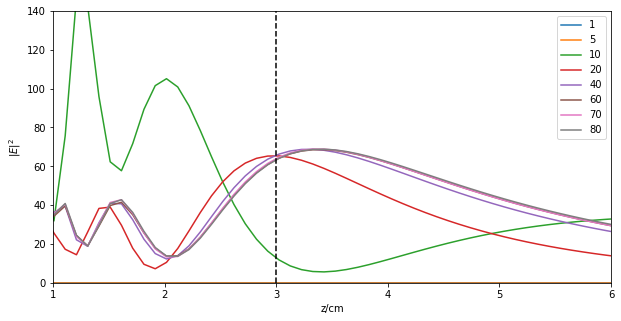

In [145]:
plt.figure(figsize=(10,5))
for res in faraway_dictionary.keys():
    plt.plot(faraway_dictionary[res]['axis_values']/1e4, faraway_dictionary[res]['faraway'],
            label=str(res))
plt.xlabel('z/cm')
plt.ylabel('$|E|^2$')
plt.plot([3,3],[0,140],'k--')
plt.legend()
plt.xlim(1,6)
plt.ylim(0,140)
plt.savefig('/Users/juan/Library/Mobile Documents/com~apple~CloudDocs/iCloudFiles/metalensagain-axis.png')
plt.show()

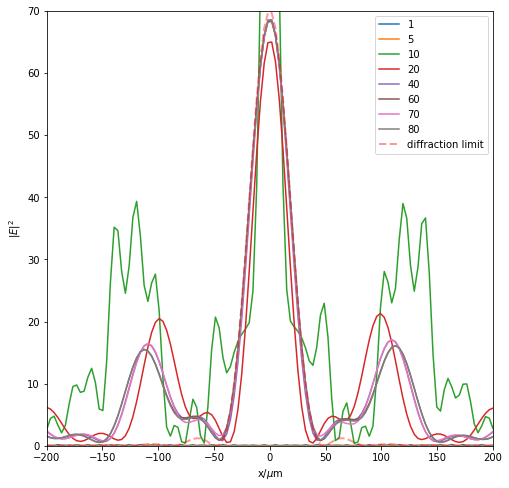

In [251]:
lateral_values = np.linspace(-200,200, num_farfield_points)
sigma = 0.42 * metalens_params['wavelength'] * metalens_params['f#']
bessel_x = np.pi/metalens_params['wavelength']/metalens_params['f#']*lateral_values

plt.figure(figsize=(8,8))
for res in faraway_dictionary.keys():
    plt.plot(faraway_dictionary[res]['lateral_values'], faraway_dictionary[res]['lateral_faraway'],
            label=str(res))
plt.plot(lateral_values, 70*(2*jn(1,bessel_x)/bessel_x)**2,'r--',label='diffraction limit',lw=2,alpha=0.4)
plt.xlabel('x/$\mu$m')
plt.ylabel('$|E|^2$')
plt.ylim(0,70)
plt.xlim(-200,200)
plt.legend()
#plt.savefig('/Users/juan/Library/Mobile Documents/com~apple~CloudDocs/iCloudFiles/metalensagain-lateral.png')
plt.show()

In [263]:
dir(geometry[1].center)

['__add__',
 '__array__',
 '__class__',
 '__delattr__',
 '__dict__',
 '__dir__',
 '__doc__',
 '__eq__',
 '__format__',
 '__ge__',
 '__getattribute__',
 '__getitem__',
 '__gt__',
 '__hash__',
 '__init__',
 '__init_subclass__',
 '__le__',
 '__lt__',
 '__module__',
 '__mul__',
 '__ne__',
 '__new__',
 '__reduce__',
 '__reduce_ex__',
 '__repr__',
 '__rmul__',
 '__setattr__',
 '__sizeof__',
 '__str__',
 '__sub__',
 '__subclasshook__',
 '__weakref__',
 'cdot',
 'close',
 'conj',
 'cross',
 'dot',
 'norm',
 'rotate',
 'rotate_lattice',
 'rotate_reciprocal',
 'scale',
 'unit',
 'x',
 'y',
 'z']

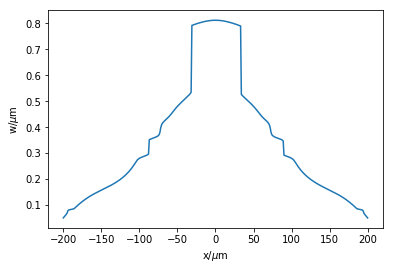

In [267]:
plt.figure(figsize=(6,4))
plt.plot([geo.center.x for geo in geometry[1:]],[geo.size.x for geo in geometry[1:]])
plt.xlabel('x/$\mu$m')
plt.ylabel('w/$\mu$m')
plt.show()

In [278]:
ez = sim.get_array(component=mp.Ez).transpose()
eps = sim.get_array(component=mp.Dielectric).transpose()

In [312]:
diff_eps = np.gradient(eps)
diff_eps = np.sqrt(diff_eps[0]**2+diff_eps[1]**2)
diff_eps[diff_eps == 0] = np.nan

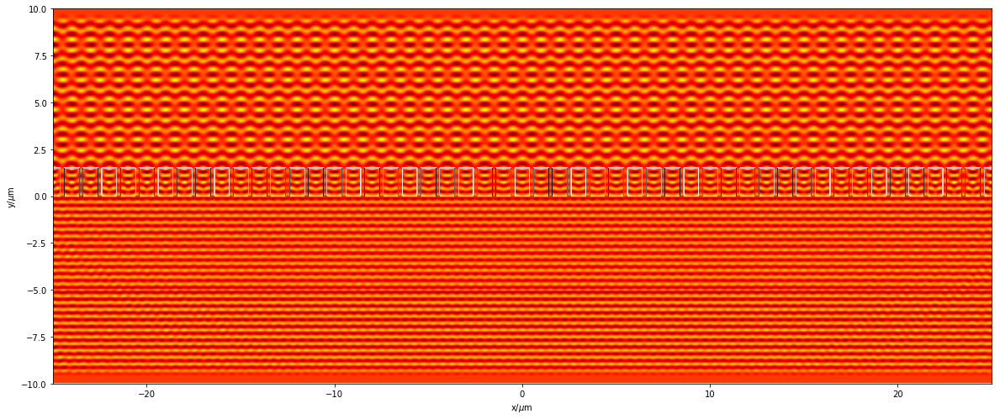

In [321]:
plt.figure(figsize=(20,10))
plt.imshow(ez,
           extent=[-metalens_params['aperture']/2,
                   metalens_params['aperture']/2,
                  -metalens_params['simulation height']/2,
                  metalens_params['simulation height'] /2],
          origin='lower',
          cmap='hot')
plt.imshow(diff_eps,
          extent=[-metalens_params['aperture']/2,
                   metalens_params['aperture']/2,
                  -metalens_params['simulation height']/2,
                  metalens_params['simulation height'] /2],
          origin='lower',
          cmap='binary')
plt.xlim(-25,25)
plt.xlabel('x/$\mu$m')
plt.ylabel('y/$\mu$m')
plt.show()

In [141]:
# save the nearfield computed with the highest resolution of 80
# sim.save_near2far('near2f-at-resolution-of-80',nearfield)

In [198]:
middle_axial_value = 34000
desired_resolution = 10 # in um
full_axial_width = 400
half_lateral_width = 200
num_lateral_points = int(half_lateral_width / desired_resolution)  # an odd number

if num_lateral_points % 2 == 0:
    num_lateral_points += 1

num_axial_points = int(full_axial_width / desired_resolution)

axis_values = np.linspace(middle_axial_value-full_axial_width/2,middle_axial_value + full_axial_width/2,num_axial_points)
lateral_values = np.linspace(0,half_lateral_width,num_lateral_points)
panel = []

for index, axial_value in enumerate(axis_values):
    print('%.1f %%' % (index/len(axis_values)*100), end = ', ')
    strip = [sum(np.abs(np.array(sim.get_farfield(nearfield, mp.Vector3(x,axial_value))))[:3]**2) for x in lateral_values]
    strip = strip[-1::-1][:-1] + strip
    panel.append(strip)
panel = np.array(panel)

0.0 %, 2.5 %, 5.0 %, 7.5 %, 10.0 %, 12.5 %, 15.0 %, 17.5 %, 20.0 %, 22.5 %, 25.0 %, 27.5 %, 30.0 %, 32.5 %, 35.0 %, 37.5 %, 40.0 %, 42.5 %, 45.0 %, 47.5 %, 50.0 %, 52.5 %, 55.0 %, 57.5 %, 60.0 %, 62.5 %, 65.0 %, 67.5 %, 70.0 %, 72.5 %, 75.0 %, 77.5 %, 80.0 %, 82.5 %, 85.0 %, 87.5 %, 90.0 %, 92.5 %, 95.0 %, 97.5 %, 

In [241]:
from scipy.interpolate import interp1d

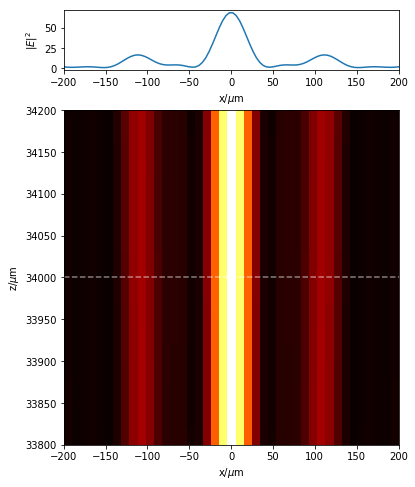

In [245]:
fig, axs = plt.subplots(nrows=2,ncols=1,figsize=(6,8),gridspec_kw = {'height_ratios':[0.18,1]})
lateral_slice = [-x for x in list(lateral_values)[-1::-1][:-1]]+list(lateral_values)
lateral_E2 = panel[int(panel.shape[0]/2)]
finer_slice = np.linspace(lateral_slice[0],lateral_slice[-1],100)
finer_interpol = interp1d(lateral_slice,lateral_E2, kind='cubic')
finer_E2 = finer_interpol(finer_slice)
axs[0].plot(finer_slice,finer_E2)
axs[0].set_xlim(-half_lateral_width,half_lateral_width)
axs[0].set_ylabel('$|E|^2$')
axs[0].set_xlabel('x/$\mu$m')
axs[1].imshow(panel,origin='lower',
          extent=[-half_lateral_width,
                  half_lateral_width,
                  middle_axial_value-full_axial_width/2,
                  middle_axial_value+full_axial_width/2],
          cmap='hot')
axs[1].plot([-half_lateral_width,half_lateral_width],[middle_axial_value]*2,
            'w--',
           alpha=0.5)
plt.xlabel('x/$\mu$m')
plt.ylabel('z/$\mu$m')

plt.show()

In [162]:
!ding


/Users/juan/Scripts/ding.wav:

 File Size: 120k      Bit Rate: 256k
  Encoding: Signed PCM    
  Channels: 1 @ 16-bit   
Samplerate: 16000Hz      
Replaygain: off         
  Duration: 00:00:03.76  

In:100%  00:00:03.76 [00:00:00.00] Out:180k  [      |      ]        Clip:360  
play WARN rate: rate clipped 186 samples; decrease volume?
play WARN sox: `coreaudio' output clipped 174 samples; decrease volume?
Done.


## First Design Step in MEEP  - polarization effects

In [204]:
def single_post_on_axis_field(W, H, h, w, n_p, n_s, p, d, wavelength, resolution, source_width):
    simulation_time = 3*H/wavelength + source_width

    geometry = [mp.Block(size = mp.Vector3(W,H/2),
                            center = mp.Vector3(0,-H/4),
                            material = mp.Medium(epsilon=n_s**2)),
               mp.Block(size = mp.Vector3(w,h),
                            center = mp.Vector3(0,h/2),
                            material = mp.Medium(epsilon=n_p**2))]
    pml_layers = [mp.PML(thickness=p,
                        direction=mp.Y,
                        side=mp.ALL)]

    k_point = mp.Vector3(0,0)

    cell = mp.Vector3(W, H, 0)

    sources = [mp.Source(src=mp.ContinuousSource(wavelength=wavelength,
                                                width = source_width),
                        component=mp.Ex,
                        center=mp.Vector3(0,-d),
                        size=mp.Vector3(W,0))]

    # symmetries = [mp.Mirror(mp.Y)]
    symmetries = []

    sim = mp.Simulation(cell_size = cell,
                       boundary_layers = pml_layers,
                       geometry = geometry,
                       sources = sources,
                       resolution = resolution,
                       force_complex_fields = True,
                       ensure_periodicity = True,
                       k_point = k_point,
                       symmetries=symmetries)
    sim.init_sim()
    sim.run(until=simulation_time)
    hz_on_axis = sim.get_array(center=mp.Vector3(), size=mp.Vector3(0,H), component=mp.Hz).transpose()
    hz_full_field = sim.get_array(center=mp.Vector3(), size=mp.Vector3(W,H), component=mp.Hz).transpose()
    axis_coordinates = np.linspace(-H/2,H/2,hz_on_axis.shape[0])
    #eps = sim.get_array(center=mp.Vector3(0,0), size=mp.Vector3(0,H), component=mp.Dielectric).transpose()
    return axis_coordinates, hz_on_axis, hz_full_field #, eps

In [205]:
simulation_parameters = {'W':1, # width of the simulation cell
    'H' : 18, # height of the simulation cell
    'h' : 1.5, # height of posts
    'w' : 0.5, # widht of posts
    'n_p' : 1.52,  # refractive index of posts
    'n_s' : 1.46, # refractive index of substrate
    'p' : 1, # thickness of PML
    'd' : 2, # depth of the source,
    'wavelength': 0.532,
    'resolution': 75,
    'source_width': 2}

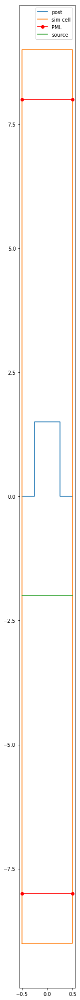

In [206]:
plt.figure(figsize=(2*simulation_parameters['W'],2*simulation_parameters['H']))
plt.plot([-simulation_parameters['W']/2,-simulation_parameters['w']/2,-simulation_parameters['w']/2,simulation_parameters['w']/2,simulation_parameters['w']/2,simulation_parameters['W']/2],
        [0,0,simulation_parameters['h'],simulation_parameters['h'],0,0],label='post')
plt.plot([-simulation_parameters['W']/2,simulation_parameters['W']/2,simulation_parameters['W']/2,-simulation_parameters['W']/2,-simulation_parameters['W']/2],
        [-simulation_parameters['H']/2,-simulation_parameters['H']/2,simulation_parameters['H']/2,simulation_parameters['H']/2,-simulation_parameters['H']/2],label='sim cell')
plt.plot([-simulation_parameters['W']/2,simulation_parameters['W']/2],
        [-simulation_parameters['H']/2+simulation_parameters['p'],-simulation_parameters['H']/2+simulation_parameters['p']],'or-',label='PML')
plt.plot([-simulation_parameters['W']/2,simulation_parameters['W']/2],
        [simulation_parameters['H']/2-simulation_parameters['p'],simulation_parameters['H']/2-simulation_parameters['p']],'or-')
plt.plot([-simulation_parameters['W']/2,simulation_parameters['W']/2],
        [-simulation_parameters['d'],-simulation_parameters['d']],label='source')
plt.legend()
plt.show()

In [180]:
ax, hz_axis, hz_full = single_post_on_axis_field(**simulation_parameters)

-----------
Initializing structure...
Meep: using complex fields.
Meep progress: 27.36/103.50375939849623 = 26.4% done in 4.0s, 11.1s to go
Meep progress: 55.18/103.50375939849623 = 53.3% done in 8.0s, 7.0s to go
Meep progress: 83.09/103.50375939849623 = 80.3% done in 12.0s, 2.9s to go
run 0 finished at t = 103.51 (10351 timesteps)


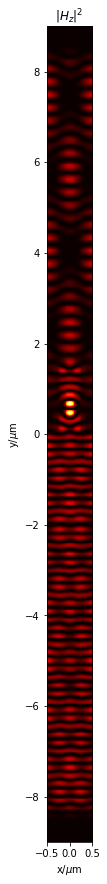

In [195]:
plt.figure(figsize=(10,15))
plt.imshow((np.imag(hz_full)**2),
           extent=[-simulation_parameters['W']/2,
                  simulation_parameters['W']/2,
                  -simulation_parameters['H']/2,
                  simulation_parameters['H']/2],
           origin='lower',
          cmap='hot')
plt.xlabel('x/$\mu$m')
plt.ylabel('y/$\mu$m')
plt.title('$|H_z|^2$')
plt.show()

In [207]:
post_widths = np.linspace(0,1,40)
phases = []
for index, pwee in enumerate(post_widths):
    print(index,end=', ')
    simulation_parameters['w'] = pwee
    ax, hz, _ = single_post_on_axis_field(**simulation_parameters)
    phases.append(np.interp(simulation_parameters['h'],ax,np.unwrap(np.angle(hz))))

0, -----------
Initializing structure...
Meep: using complex fields.
Meep progress: 8.133333333333335/103.50375939849623 = 7.9% done in 4.0s, 46.9s to go
Meep progress: 17.006666666666668/103.50375939849623 = 16.4% done in 8.0s, 40.7s to go
Meep progress: 25.886666666666667/103.50375939849623 = 25.0% done in 12.0s, 36.0s to go
Meep progress: 34.760000000000005/103.50375939849623 = 33.6% done in 16.0s, 31.7s to go
Meep progress: 43.220000000000006/103.50375939849623 = 41.8% done in 20.0s, 27.9s to go
Meep progress: 51.88/103.50375939849623 = 50.1% done in 24.0s, 23.9s to go
Meep progress: 61.00666666666667/103.50375939849623 = 58.9% done in 28.0s, 19.5s to go
Meep progress: 70.2/103.50375939849623 = 67.8% done in 32.0s, 15.2s to go
Meep progress: 79.30000000000001/103.50375939849623 = 76.6% done in 36.0s, 11.0s to go
Meep progress: 88.12666666666668/103.50375939849623 = 85.1% done in 40.0s, 7.0s to go
Meep progress: 97.24666666666667/103.50375939849623 = 94.0% done in 44.0s, 2.8s to go


Meep progress: 98.43333333333334/103.50375939849623 = 95.1% done in 44.0s, 2.3s to go
run 0 finished at t = 103.50666666666667 (15526 timesteps)
8, -----------
Initializing structure...
Meep: using complex fields.
Meep progress: 8.133333333333335/103.50375939849623 = 7.9% done in 4.0s, 46.9s to go
Meep progress: 16.906666666666666/103.50375939849623 = 16.3% done in 8.0s, 41.0s to go
Meep progress: 25.733333333333334/103.50375939849623 = 24.9% done in 12.0s, 36.3s to go
Meep progress: 34.38/103.50375939849623 = 33.2% done in 16.0s, 32.2s to go
Meep progress: 42.980000000000004/103.50375939849623 = 41.5% done in 20.0s, 28.2s to go
Meep progress: 51.620000000000005/103.50375939849623 = 49.9% done in 24.0s, 24.1s to go
Meep progress: 60.64/103.50375939849623 = 58.6% done in 28.0s, 19.8s to go
Meep progress: 69.76666666666667/103.50375939849623 = 67.4% done in 32.0s, 15.5s to go
Meep progress: 78.79333333333334/103.50375939849623 = 76.1% done in 36.0s, 11.3s to go
Meep progress: 87.36/103.5

Meep progress: 79.45333333333333/103.50375939849623 = 76.8% done in 36.0s, 10.9s to go
Meep progress: 87.74666666666667/103.50375939849623 = 84.8% done in 40.0s, 7.2s to go
Meep progress: 96.36666666666667/103.50375939849623 = 93.1% done in 44.0s, 3.3s to go
run 0 finished at t = 103.50666666666667 (15526 timesteps)
16, -----------
Initializing structure...
Meep: using complex fields.
Meep progress: 8.466666666666667/103.50375939849623 = 8.2% done in 4.0s, 44.9s to go
Meep progress: 17.58666666666667/103.50375939849623 = 17.0% done in 8.0s, 39.1s to go
Meep progress: 26.180000000000003/103.50375939849623 = 25.3% done in 12.0s, 35.5s to go
Meep progress: 34.75333333333334/103.50375939849623 = 33.6% done in 16.0s, 31.7s to go
Meep progress: 43.586666666666666/103.50375939849623 = 42.1% done in 20.0s, 27.5s to go
Meep progress: 52.7/103.50375939849623 = 50.9% done in 24.0s, 23.1s to go
Meep progress: 61.78666666666667/103.50375939849623 = 59.7% done in 28.0s, 18.9s to go
Meep progress: 70

Meep progress: 61.25333333333334/103.50375939849623 = 59.2% done in 28.0s, 19.3s to go
Meep progress: 70.10000000000001/103.50375939849623 = 67.7% done in 32.0s, 15.3s to go
Meep progress: 79.0/103.50375939849623 = 76.3% done in 36.0s, 11.2s to go
Meep progress: 87.56666666666668/103.50375939849623 = 84.6% done in 40.0s, 7.3s to go
Meep progress: 96.44000000000001/103.50375939849623 = 93.2% done in 44.0s, 3.2s to go
run 0 finished at t = 103.50666666666667 (15526 timesteps)
24, -----------
Initializing structure...
Meep: using complex fields.
Meep progress: 8.106666666666667/103.50375939849623 = 7.8% done in 4.0s, 47.1s to go
Meep progress: 17.213333333333335/103.50375939849623 = 16.6% done in 8.0s, 40.1s to go
Meep progress: 25.78/103.50375939849623 = 24.9% done in 12.0s, 36.2s to go
Meep progress: 34.56666666666667/103.50375939849623 = 33.4% done in 16.0s, 31.9s to go
Meep progress: 43.653333333333336/103.50375939849623 = 42.2% done in 20.0s, 27.4s to go
Meep progress: 52.43333333333

run 0 finished at t = 103.50666666666667 (15526 timesteps)
31, -----------
Initializing structure...
Meep: using complex fields.
Meep progress: 8.226666666666667/103.50375939849623 = 7.9% done in 4.0s, 46.3s to go
Meep progress: 16.593333333333334/103.50375939849623 = 16.0% done in 8.0s, 41.9s to go
Meep progress: 24.94/103.50375939849623 = 24.1% done in 12.0s, 37.8s to go
Meep progress: 33.440000000000005/103.50375939849623 = 32.3% done in 16.0s, 33.5s to go
Meep progress: 42.04666666666667/103.50375939849623 = 40.6% done in 20.0s, 29.2s to go
Meep progress: 50.873333333333335/103.50375939849623 = 49.2% done in 24.0s, 24.8s to go
Meep progress: 59.17333333333334/103.50375939849623 = 57.2% done in 28.0s, 21.0s to go
Meep progress: 68.0/103.50375939849623 = 65.7% done in 32.0s, 16.7s to go
Meep progress: 77.01333333333334/103.50375939849623 = 74.4% done in 36.0s, 12.4s to go
Meep progress: 85.40666666666667/103.50375939849623 = 82.5% done in 40.0s, 8.5s to go
Meep progress: 93.473333333

Meep progress: 43.053333333333335/103.50375939849623 = 41.6% done in 20.0s, 28.1s to go
Meep progress: 51.553333333333335/103.50375939849623 = 49.8% done in 24.0s, 24.2s to go
Meep progress: 60.44666666666667/103.50375939849623 = 58.4% done in 28.0s, 20.0s to go
Meep progress: 69.51333333333334/103.50375939849623 = 67.2% done in 32.0s, 15.7s to go
Meep progress: 78.56666666666668/103.50375939849623 = 75.9% done in 36.0s, 11.4s to go
Meep progress: 87.55333333333334/103.50375939849623 = 84.6% done in 40.0s, 7.3s to go
Meep progress: 96.07333333333334/103.50375939849623 = 92.8% done in 44.0s, 3.4s to go
run 0 finished at t = 103.50666666666667 (15526 timesteps)
39, -----------
Initializing structure...
Meep: using complex fields.
Meep progress: 8.133333333333335/103.50375939849623 = 7.9% done in 4.0s, 46.9s to go
Meep progress: 17.080000000000002/103.50375939849623 = 16.5% done in 8.0s, 40.5s to go
Meep progress: 25.860000000000003/103.50375939849623 = 25.0% done in 12.0s, 36.0s to go
Me

In [198]:
!ding


/Users/juan/Scripts/ding.wav:

 File Size: 120k      Bit Rate: 256k
  Encoding: Signed PCM    
  Channels: 1 @ 16-bit   
Samplerate: 16000Hz      
Replaygain: off         
  Duration: 00:00:03.76  

In:100%  00:00:03.76 [00:00:00.00] Out:180k  [      |      ]        Clip:360  
play WARN rate: rate clipped 186 samples; decrease volume?
play WARN sox: `coreaudio' output clipped 174 samples; decrease volume?
Done.


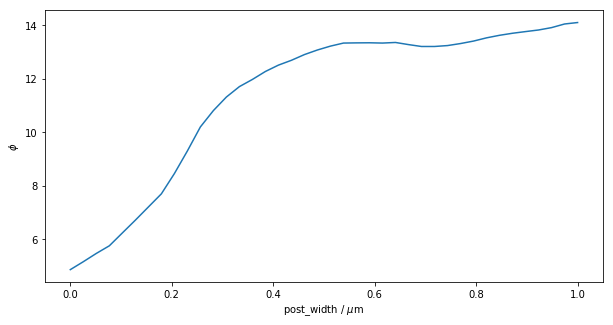

In [202]:
plt.figure(figsize=(10,5))
plt.plot(post_widths,np.unwrap(np.array(phases)%(2*np.pi)))
plt.xlabel('post_width / $\mu$m')
plt.ylabel('$\phi$')
plt.show()

In [203]:
pickle.dump({'post_widths': post_widths,
            'phases': np.unwrap(np.array(phases)%(2*np.pi))},
           open('phase_parallel_polarization.pkl','wb'))

## First Design Step in MEEP  - single (functional)

In [115]:
def single_post_on_axis_field(W, H, h, w, n_p, n_s, p, d, wavelength, resolution, source_width):
    simulation_time = 3*H/wavelength + source_width

    geometry = [mp.Block(size = mp.Vector3(W,H/2),
                            center = mp.Vector3(0,-H/4),
                            material = mp.Medium(epsilon=n_s**2)),
               mp.Block(size = mp.Vector3(w,h),
                            center = mp.Vector3(0,h/2),
                            material = mp.Medium(epsilon=n_p**2))]
    pml_layers = [mp.PML(thickness=p,
                        direction=mp.Y,
                        side=mp.ALL)]

    k_point = mp.Vector3(0,0)

    cell = mp.Vector3(W, H, 0)

    sources = [mp.Source(src=mp.ContinuousSource(wavelength=wavelength,
                                                width = source_width),
                        component=mp.Ez,
                        center=mp.Vector3(0,-d),
                        size=mp.Vector3(W,0))]

    # symmetries = [mp.Mirror(mp.Y)]
    symmetries = []

    sim = mp.Simulation(cell_size = cell,
                       boundary_layers = pml_layers,
                       geometry = geometry,
                       sources = sources,
                       resolution = resolution,
                       force_complex_fields = True,
                       ensure_periodicity = True,
                       k_point = k_point,
                       symmetries=symmetries)
    sim.init_sim()
    sim.run(until=simulation_time)
    ez_on_axis = sim.get_array(center=mp.Vector3(), size=mp.Vector3(0,H), component=mp.Ez).transpose()
    axis_coordinates = np.linspace(-H/2,H/2,ez_on_axis.shape[0])
    #eps = sim.get_array(center=mp.Vector3(0,0), size=mp.Vector3(0,H), component=mp.Dielectric).transpose()
    return axis_coordinates, ez_on_axis #, eps

In [137]:
simulation_parameters = {'W':1, # width of the simulation cell
    'H' : 18, # height of the simulation cell
    'h' : 1.5, # height of posts
    'w' : 0.5, # widht of posts
    'n_p' : 1.52,  # refractive index of posts
    'n_s' : 1.46, # refractive index of substrate
    'p' : 1, # thickness of PML
    'd' : 2, # depth of the source,
    'wavelength': 0.532,
    'resolution': 75,
    'source_width': 2}

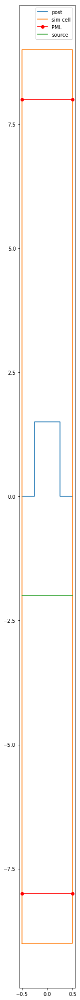

In [138]:
plt.figure(figsize=(2*simulation_parameters['W'],2*simulation_parameters['H']))
plt.plot([-simulation_parameters['W']/2,-simulation_parameters['w']/2,-simulation_parameters['w']/2,simulation_parameters['w']/2,simulation_parameters['w']/2,simulation_parameters['W']/2],
        [0,0,simulation_parameters['h'],simulation_parameters['h'],0,0],label='post')
plt.plot([-simulation_parameters['W']/2,simulation_parameters['W']/2,simulation_parameters['W']/2,-simulation_parameters['W']/2,-simulation_parameters['W']/2],
        [-simulation_parameters['H']/2,-simulation_parameters['H']/2,simulation_parameters['H']/2,simulation_parameters['H']/2,-simulation_parameters['H']/2],label='sim cell')
plt.plot([-simulation_parameters['W']/2,simulation_parameters['W']/2],
        [-simulation_parameters['H']/2+simulation_parameters['p'],-simulation_parameters['H']/2+simulation_parameters['p']],'or-',label='PML')
plt.plot([-simulation_parameters['W']/2,simulation_parameters['W']/2],
        [simulation_parameters['H']/2-simulation_parameters['p'],simulation_parameters['H']/2-simulation_parameters['p']],'or-')
plt.plot([-simulation_parameters['W']/2,simulation_parameters['W']/2],
        [-simulation_parameters['d'],-simulation_parameters['d']],label='source')
plt.legend()
plt.show()

In [139]:
ax, ez = single_post_on_axis_field(**simulation_parameters)

-----------
Initializing structure...
Meep: using complex fields.
Meep progress: 9.513333333333334/103.50375939849623 = 9.2% done in 4.0s, 39.5s to go
Meep progress: 19.8/103.50375939849623 = 19.1% done in 8.0s, 33.8s to go
Meep progress: 30.093333333333334/103.50375939849623 = 29.1% done in 12.0s, 29.3s to go
Meep progress: 40.61333333333334/103.50375939849623 = 39.2% done in 16.0s, 24.8s to go
Meep progress: 51.22666666666667/103.50375939849623 = 49.5% done in 20.0s, 20.4s to go
Meep progress: 61.6/103.50375939849623 = 59.5% done in 24.0s, 16.3s to go
Meep progress: 72.30666666666667/103.50375939849623 = 69.9% done in 28.0s, 12.1s to go
Meep progress: 83.18/103.50375939849623 = 80.4% done in 32.0s, 7.8s to go
Meep progress: 94.08666666666667/103.50375939849623 = 90.9% done in 36.0s, 3.6s to go
run 0 finished at t = 103.50666666666667 (15526 timesteps)


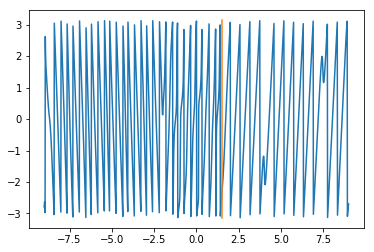

In [140]:
plt.figure()
plt.plot(ax, np.angle(ez))
plt.plot([simulation_parameters['h']]*2,[-np.pi,np.pi])
plt.show()

In [141]:
post_widths = np.linspace(0,1,40)
phases = []
for index, pwee in enumerate(post_widths):
    print(index,end=', ')
    simulation_parameters['w'] = pwee
    ax, ez = single_post_on_axis_field(**simulation_parameters)
    phases.append(np.interp(simulation_parameters['h'],ax,np.angle(ez)))

0, -----------
Initializing structure...
Meep: using complex fields.
Meep progress: 9.040000000000001/103.50375939849623 = 8.7% done in 4.0s, 41.8s to go
Meep progress: 19.30666666666667/103.50375939849623 = 18.7% done in 8.0s, 34.9s to go
Meep progress: 29.680000000000003/103.50375939849623 = 28.7% done in 12.0s, 29.9s to go
Meep progress: 40.31333333333333/103.50375939849623 = 38.9% done in 16.0s, 25.1s to go
Meep progress: 50.76666666666667/103.50375939849623 = 49.0% done in 20.0s, 20.8s to go
Meep progress: 61.080000000000005/103.50375939849623 = 59.0% done in 24.0s, 16.7s to go
Meep progress: 71.20666666666668/103.50375939849623 = 68.8% done in 28.0s, 12.7s to go
Meep progress: 81.76/103.50375939849623 = 79.0% done in 32.0s, 8.5s to go
Meep progress: 92.44666666666667/103.50375939849623 = 89.3% done in 36.0s, 4.3s to go
Meep progress: 102.75333333333334/103.50375939849623 = 99.3% done in 40.0s, 0.3s to go
run 0 finished at t = 103.50666666666667 (15526 timesteps)
1, -----------
In

Meep progress: 59.68666666666667/103.50375939849623 = 57.7% done in 24.0s, 17.6s to go
Meep progress: 69.60666666666667/103.50375939849623 = 67.3% done in 28.0s, 13.6s to go
Meep progress: 79.82000000000001/103.50375939849623 = 77.1% done in 32.0s, 9.5s to go
Meep progress: 89.87333333333333/103.50375939849623 = 86.8% done in 36.0s, 5.5s to go
Meep progress: 100.64/103.50375939849623 = 97.2% done in 40.0s, 1.1s to go
run 0 finished at t = 103.50666666666667 (15526 timesteps)
9, -----------
Initializing structure...
Meep: using complex fields.
Meep progress: 9.680000000000001/103.50375939849623 = 9.4% done in 4.0s, 38.8s to go
Meep progress: 19.900000000000002/103.50375939849623 = 19.2% done in 8.0s, 33.6s to go
Meep progress: 30.340000000000003/103.50375939849623 = 29.3% done in 12.0s, 28.9s to go
Meep progress: 40.93333333333334/103.50375939849623 = 39.5% done in 16.0s, 24.5s to go
Meep progress: 51.62666666666667/103.50375939849623 = 49.9% done in 20.0s, 20.1s to go
Meep progress: 62

Meep progress: 20.313333333333336/103.50375939849623 = 19.6% done in 8.0s, 32.8s to go
Meep progress: 30.506666666666668/103.50375939849623 = 29.5% done in 12.0s, 28.7s to go
Meep progress: 40.82666666666667/103.50375939849623 = 39.4% done in 16.0s, 24.6s to go
Meep progress: 51.36666666666667/103.50375939849623 = 49.6% done in 20.0s, 20.3s to go
Meep progress: 61.88666666666667/103.50375939849623 = 59.8% done in 24.0s, 16.1s to go
Meep progress: 72.34666666666668/103.50375939849623 = 69.9% done in 28.0s, 12.1s to go
Meep progress: 82.51333333333334/103.50375939849623 = 79.7% done in 32.0s, 8.1s to go
Meep progress: 92.81333333333333/103.50375939849623 = 89.7% done in 36.0s, 4.1s to go
Meep progress: 103.36000000000001/103.50375939849623 = 99.9% done in 40.0s, 0.1s to go
run 0 finished at t = 103.50666666666667 (15526 timesteps)
18, -----------
Initializing structure...
Meep: using complex fields.
Meep progress: 9.653333333333334/103.50375939849623 = 9.3% done in 4.0s, 38.9s to go
Meep

Meep progress: 95.54/103.50375939849623 = 92.3% done in 36.0s, 3.0s to go
run 0 finished at t = 103.50666666666667 (15526 timesteps)
26, -----------
Initializing structure...
Meep: using complex fields.
Meep progress: 9.733333333333334/103.50375939849623 = 9.4% done in 4.0s, 38.5s to go
Meep progress: 20.506666666666668/103.50375939849623 = 19.8% done in 8.0s, 32.4s to go
Meep progress: 31.366666666666667/103.50375939849623 = 30.3% done in 12.0s, 27.6s to go
Meep progress: 42.18/103.50375939849623 = 40.8% done in 16.0s, 23.3s to go
Meep progress: 52.46666666666667/103.50375939849623 = 50.7% done in 20.0s, 19.5s to go
Meep progress: 62.973333333333336/103.50375939849623 = 60.8% done in 24.0s, 15.5s to go
Meep progress: 73.77333333333334/103.50375939849623 = 71.3% done in 28.0s, 11.3s to go
Meep progress: 84.54/103.50375939849623 = 81.7% done in 32.0s, 7.2s to go
Meep progress: 95.39333333333335/103.50375939849623 = 92.2% done in 36.0s, 3.1s to go
run 0 finished at t = 103.50666666666667

Meep: using complex fields.
Meep progress: 9.733333333333334/103.50375939849623 = 9.4% done in 4.0s, 38.5s to go
Meep progress: 20.166666666666668/103.50375939849623 = 19.5% done in 8.0s, 33.1s to go
Meep progress: 30.206666666666667/103.50375939849623 = 29.2% done in 12.0s, 29.1s to go
Meep progress: 40.74/103.50375939849623 = 39.4% done in 16.0s, 24.7s to go
Meep progress: 51.45333333333333/103.50375939849623 = 49.7% done in 20.0s, 20.2s to go
Meep progress: 62.21333333333334/103.50375939849623 = 60.1% done in 24.0s, 15.9s to go
Meep progress: 72.62/103.50375939849623 = 70.2% done in 28.0s, 11.9s to go
Meep progress: 83.05333333333334/103.50375939849623 = 80.2% done in 32.0s, 7.9s to go
Meep progress: 93.66666666666667/103.50375939849623 = 90.5% done in 36.0s, 3.8s to go
run 0 finished at t = 103.50666666666667 (15526 timesteps)
36, -----------
Initializing structure...
Meep: using complex fields.
Meep progress: 10.006666666666668/103.50375939849623 = 9.7% done in 4.0s, 37.4s to go
M

In [142]:
!ding


/Users/juan/Scripts/ding.wav:

 File Size: 120k      Bit Rate: 256k
  Encoding: Signed PCM    
  Channels: 1 @ 16-bit   
Samplerate: 16000Hz      
Replaygain: off         
  Duration: 00:00:03.76  

In:100%  00:00:03.76 [00:00:00.00] Out:180k  [      |      ]        Clip:360  
play WARN rate: rate clipped 186 samples; decrease volume?
play WARN sox: `coreaudio' output clipped 174 samples; decrease volume?
Done.


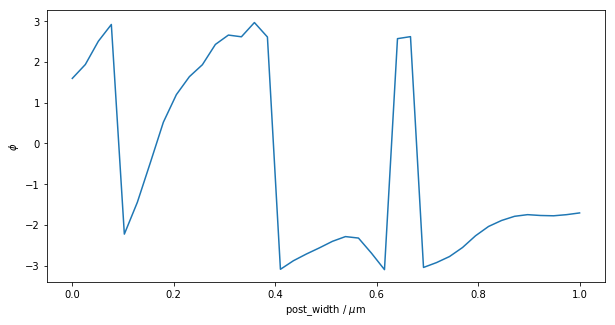

In [143]:
plt.figure(figsize=(10,5))
plt.plot(post_widths,phases)
plt.xlabel('post_width / $\mu$m')
plt.ylabel('$\phi$')
plt.show()

In [144]:
phases

[1.5941216139399683,
 1.9339143930798732,
 2.504459379296946,
 2.916514001252407,
 -2.226414422313751,
 -1.445723304375344,
 -0.4719101936103528,
 0.5188213712637897,
 1.1953889487947649,
 1.6357568724656009,
 1.9291855421354718,
 2.4269412689237644,
 2.656577164409228,
 2.6143053940869927,
 2.9639486395788834,
 2.6094539672709445,
 -3.0892615915539468,
 -2.8789256554842213,
 -2.71367347460861,
 -2.563036284079928,
 -2.403018667132244,
 -2.287019994283066,
 -2.3230226814903707,
 -2.6939800282364317,
 -3.0975743082382183,
 2.5686729269349478,
 2.6182431373463837,
 -3.043872800409353,
 -2.924902281347637,
 -2.776258238913525,
 -2.5550959872177996,
 -2.2669491950337064,
 -2.038573375026115,
 -1.8919325335031232,
 -1.7894152851073237,
 -1.7488206851264267,
 -1.7694210592658577,
 -1.7768309948468983,
 -1.7489759638305387,
 -1.7065135329700378]

## First Design Step in MEEP  - multi

In [156]:
def single_post(W,H,h,n_p,n_s,
                p,d,wavelength,
                resolution,
                source_width,
                w):
    simulation_time = 3*H/wavelength + source_width

    geometry = [mp.Block(size = mp.Vector3(W,H/2),
                            center = mp.Vector3(0,-H/4),
                            material = mp.Medium(epsilon=n_s**2)),
               mp.Block(size = mp.Vector3(w,h),
                            center = mp.Vector3(0,h/2),
                            material = mp.Medium(epsilon=n_p**2))]
    pml_layers = [mp.PML(thickness=p,
                        direction=mp.Y,
                        side=mp.ALL)]

    k_point = mp.Vector3(0,0)

    cell = mp.Vector3(W, H, 0)

    sources = [mp.Source(src=mp.ContinuousSource(wavelength=wavelength,
                                                width = source_width),
                        component=mp.Ez,
                        center=mp.Vector3(0,-d),
                        size=mp.Vector3(W,0))]

    #symmetries = [mp.Mirror(mp.X)]
    symmetries = []
    
    sim = mp.Simulation(cell_size = cell,
                       boundary_layers = pml_layers,
                       geometry = geometry,
                       sources = sources,
                       resolution = resolution,
                       force_complex_fields = True,
                       ensure_periodicity = True,
                       k_point = k_point,
                       symmetries=symmetries)
    sim.run(until=simulation_time)
    ez = sim.get_array(center=mp.Vector3(), size=cell, component=mp.Ez).transpose()
    return ez

In [157]:
simulation_parameters = {
    'W':1,
    'H':10,
    'h':1.5,
    'n_p': 1.52,
    'n_s': 1.46,
    'p': 1,
    'd': 2,
    'wavelength': 0.532,
    'resolution': 85,
    'source_width': 2,
    'w':1
}

In [158]:
post_widths = np.linspace(0.,1,40)
fields = []
for w in post_widths:
    print(w,end=', ')
    simulation_parameters['w'] = w
    fields.append(single_post(**simulation_parameters))
fields = np.array(fields)

0.0, -----------
Initializing structure...
Meep: using complex fields.
Meep progress: 11.458823529411765/58.39097744360902 = 19.6% done in 4.0s, 16.4s to go
Meep progress: 23.11764705882353/58.39097744360902 = 39.6% done in 8.0s, 12.2s to go
Meep progress: 35.205882352941174/58.39097744360902 = 60.3% done in 12.0s, 7.9s to go
Meep progress: 47.45882352941177/58.39097744360902 = 81.3% done in 16.0s, 3.7s to go
run 0 finished at t = 58.39411764705882 (9927 timesteps)
0.02564102564102564, -----------
Initializing structure...
Meep: using complex fields.
Meep progress: 12.029411764705882/58.39097744360902 = 20.6% done in 4.0s, 15.4s to go
Meep progress: 24.25294117647059/58.39097744360902 = 41.5% done in 8.0s, 11.3s to go
Meep progress: 35.858823529411765/58.39097744360902 = 61.4% done in 12.0s, 7.5s to go
Meep progress: 47.88235294117647/58.39097744360902 = 82.0% done in 16.0s, 3.5s to go
run 0 finished at t = 58.39411764705882 (9927 timesteps)
0.05128205128205128, -----------
Initializin

Meep progress: 11.423529411764706/58.39097744360902 = 19.6% done in 4.0s, 16.5s to go
Meep progress: 23.688235294117646/58.39097744360902 = 40.6% done in 8.0s, 11.7s to go
Meep progress: 36.0/58.39097744360902 = 61.7% done in 12.0s, 7.5s to go
Meep progress: 48.311764705882354/58.39097744360902 = 82.7% done in 16.0s, 3.3s to go
run 0 finished at t = 58.39411764705882 (9927 timesteps)
0.4615384615384615, -----------
Initializing structure...
Meep: using complex fields.
Meep progress: 12.229411764705882/58.39097744360902 = 20.9% done in 4.0s, 15.1s to go
Meep progress: 24.647058823529413/58.39097744360902 = 42.2% done in 8.0s, 11.0s to go
Meep progress: 36.45882352941177/58.39097744360902 = 62.4% done in 12.0s, 7.2s to go
Meep progress: 48.84705882352941/58.39097744360902 = 83.7% done in 16.0s, 3.1s to go
run 0 finished at t = 58.39411764705882 (9927 timesteps)
0.48717948717948717, -----------
Initializing structure...
Meep: using complex fields.
Meep progress: 12.029411764705882/58.3909

Meep progress: 23.776470588235295/58.39097744360902 = 40.7% done in 8.0s, 11.6s to go
Meep progress: 36.029411764705884/58.39097744360902 = 61.7% done in 12.0s, 7.4s to go
Meep progress: 48.22352941176471/58.39097744360902 = 82.6% done in 16.0s, 3.4s to go
run 0 finished at t = 58.39411764705882 (9927 timesteps)
0.8974358974358974, -----------
Initializing structure...
Meep: using complex fields.
Meep progress: 12.176470588235293/58.39097744360902 = 20.9% done in 4.0s, 15.2s to go
Meep progress: 24.2/58.39097744360902 = 41.4% done in 8.0s, 11.3s to go
Meep progress: 36.01176470588235/58.39097744360902 = 61.7% done in 12.0s, 7.5s to go
Meep progress: 47.94705882352941/58.39097744360902 = 82.1% done in 16.0s, 3.5s to go
run 0 finished at t = 58.39411764705882 (9927 timesteps)
0.923076923076923, -----------
Initializing structure...
Meep: using complex fields.
Meep progress: 12.047058823529412/58.39097744360902 = 20.6% done in 4.0s, 15.4s to go
Meep progress: 24.347058823529412/58.3909774

In [159]:
axis_values = np.linspace(-simulation_parameters['H']/2,
                          simulation_parameters['H']/2,
                          fields[0].shape[0])

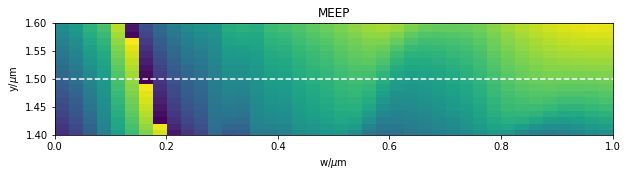

In [163]:
middle_index = int(fields[0].shape[1]/2)-1
all_phases =  [np.angle(f[:,middle_index]) for f in fields]
all_phases = np.array(all_phases)
plt.figure(figsize=(10,10))
plt.imshow((all_phases.transpose()-4.63)%(2*np.pi)-np.pi,extent=[min(post_widths),max(post_widths),
                                          -simulation_parameters['H']/2,simulation_parameters['H']/2],origin='lower',
          vmin=-np.pi,
          vmax=np.pi)
plt.plot([0,1],[1.5,1.5],'w--')
# for i in range(10):
#     plt.plot([0,1],[-2.1+i*simulation_parameters['wavelength']/simulation_parameters['n_s']]*2,'r')
plt.xlabel('w/$\mu$m')
plt.ylabel('y/$\mu$m')
plt.ylim(1.4,1.6)
plt.title('MEEP')
plt.show()

In [161]:
!ding


/Users/juan/Scripts/ding.wav:

 File Size: 120k      Bit Rate: 256k
  Encoding: Signed PCM    
  Channels: 1 @ 16-bit   
Samplerate: 16000Hz      
Replaygain: off         
  Duration: 00:00:03.76  

In:100%  00:00:03.76 [00:00:00.00] Out:180k  [      |      ]        Clip:360  
play WARN rate: rate clipped 186 samples; decrease volume?
play WARN sox: `coreaudio' output clipped 174 samples; decrease volume?
Done.


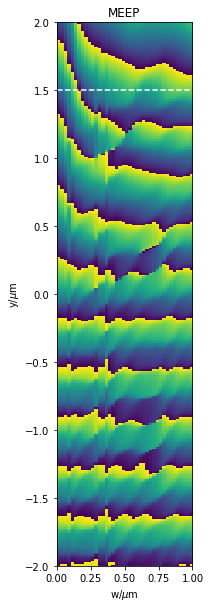

In [162]:
middle_index = int(fields[0].shape[1]/2)-1
all_phases =  [np.angle(f[:,middle_index]) for f in fields]
all_phases = np.array(all_phases)
plt.figure(figsize=(10,10))
plt.imshow((all_phases.transpose()-4.63)%(2*np.pi)-np.pi,extent=[min(post_widths),max(post_widths),
                                          -simulation_parameters['H']/2,simulation_parameters['H']/2],origin='lower',
          vmin=-np.pi,
          vmax=np.pi)
plt.plot([0,1],[1.5,1.5],'w--')
# for i in range(10):
#     plt.plot([0,1],[-2.1+i*simulation_parameters['wavelength']/simulation_parameters['n_s']]*2,'r')
plt.xlabel('w/$\mu$m')
plt.ylabel('y/$\mu$m')
plt.ylim(-2,2)
plt.title('MEEP')
plt.savefig('/Users/juan/Library/Mobile Documents/com~apple~CloudDocs/iCloudFiles/meee.png')
plt.show()

## First Design Step in MEEP  - single

In [267]:
W = 1 # width of the simulation cell
H = 18 # height of the simulation cell
h = 1.5 # height of posts
w = 0.5 # widht of posts
n_p = 1.52  # refractive index of posts
n_s = 1.46 # refractive index of substrate
p = 1 # thickness of PML
d = 2 # depth of the source
wavelength = 0.532
resolution = 40
source_width = 2

simulation_time = 3*H/wavelength + source_width

geometry = [mp.Block(size = mp.Vector3(W,H/2),
                        center = mp.Vector3(0,-H/4),
                        material = mp.Medium(epsilon=n_s**2)),
           mp.Block(size = mp.Vector3(w,h),
                        center = mp.Vector3(0,h/2),
                        material = mp.Medium(epsilon=n_p**2))]
pml_layers = [mp.PML(thickness=p,
                    direction=mp.Y,
                    side=mp.ALL)]

k_point = mp.Vector3(1,0)

cell = mp.Vector3(W, H, 0)

sources = [mp.Source(src=mp.ContinuousSource(wavelength=wavelength,
                                            width = source_width),
                    component=mp.Ez,
                    center=mp.Vector3(0,-d),
                    size=mp.Vector3(W,0))]

# symmetries = [mp.Mirror(mp.Y)]
symmetries = []

sim = mp.Simulation(cell_size = cell,
                   boundary_layers = pml_layers,
                   geometry = geometry,
                   sources = sources,
                   resolution = resolution,
                   force_complex_fields = True,
                   ensure_periodicity = True,
                   k_point = k_point,
                   symmetries=symmetries)
sim.init_sim()
sim.run(until=simulation_time)

-----------
Initializing structure...
Meep: using complex fields.
Meep progress: 61.525000000000006/103.50375939849623 = 59.4% done in 4.0s, 2.7s to go
run 0 finished at t = 103.5125 (8281 timesteps)


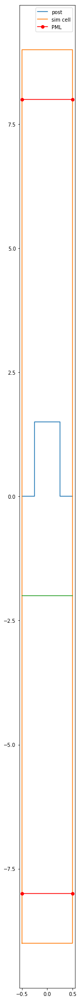

In [214]:
plt.figure(figsize=(2*W,2*H))
plt.plot([-W/2,-w/2,-w/2,w/2,w/2,W/2],
        [0,0,h,h,0,0],label='post')
plt.plot([-W/2,W/2,W/2,-W/2,-W/2],
        [-H/2,-H/2,H/2,H/2,-H/2],label='sim cell')
plt.plot([-W/2,W/2],
        [-H/2+p,-H/2+p],'or-',label='PML')
plt.plot([-W/2,W/2],
        [H/2-p,H/2-p],'or-')
plt.plot([-W/2,W/2],
        [-d,-d])
plt.legend()
plt.show()

In [215]:
eps = sim.get_array(center=mp.Vector3(), size=cell, component=mp.Dielectric).transpose()
ez = sim.get_array(center=mp.Vector3(), size=cell, component=mp.Ez).transpose()
num_reps=10
ez = np.tile(ez,num_reps)
eps = np.tile(eps,num_reps)
eps = (np.abs(eps - np.roll(eps,1)) + np.abs(eps - np.roll(eps,-1)) +  
        np.abs(eps - np.roll(eps,1,axis=0)) + np.abs(eps - np.roll(eps,-1,axis=0)) )
eps[eps==0] = np.nan

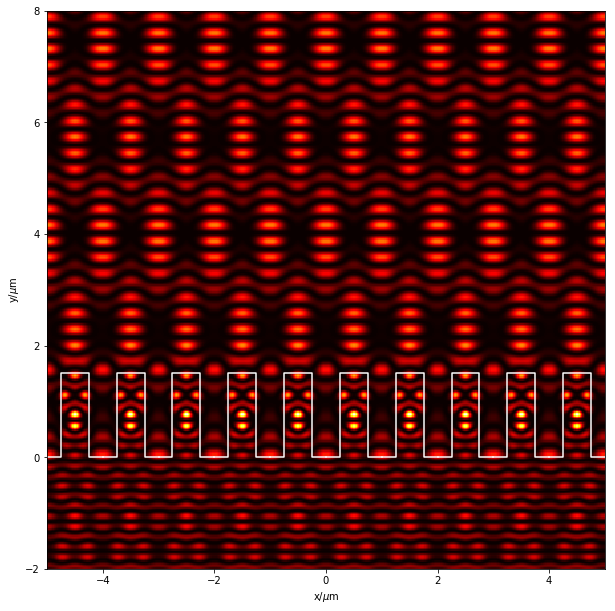

In [216]:
plt.figure(figsize=(W*num_reps,H))
plt.imshow(np.real(ez)**2,
          extent=[-W/2*num_reps,W/2*num_reps,-H/2,H/2],origin='lower',cmap='hot')
plt.ylim(-2,8)
pxs = np.array([-W/2,-w/2,-w/2,w/2,w/2,W/2])
pxs = pxs - W*(num_reps-1)/2
for i in range(num_reps):
    plt.plot(pxs,
            [0,0,h,h,0,0],'w',label='post')
    pxs = pxs + W
plt.xlabel('x/$\mu$m')
plt.ylabel('y/$\mu$m')
plt.show()

In [178]:
num_timesteps = 100
phis = np.linspace(0,2*np.pi,num_timesteps)
maxE2 = np.max(np.real(ez)**2)
for index, phi in enumerate(phis):
    if index == num_timesteps-1:
        break
    print(index,end=', ')
    E_complex_t = ez*np.exp(-1j*phi)
    plt.figure(figsize=(10,10))
    plt.imshow(np.real(E_complex_t)**2,
              extent=[-W/2*num_reps,W/2*num_reps,-H/2,H/2],origin='lower',cmap='hot',
              vmin=0,vmax=maxE2)
    plt.ylim(-2,8)
    pxs = np.array([-W/2,-w/2,-w/2,w/2,w/2,W/2])
    pxs = pxs - W*(num_reps-1)/2
    for i in range(num_reps):
        plt.plot(pxs,
                [0,0,h,h,0,0],'w',label='post')
        pxs = pxs + W
    plt.xlabel('x/$\mu$m')
    plt.ylabel('y/$\mu$m')
    plt.tight_layout()
    plt.savefig('MEEP-field-%d.png' % index, dpi=80)
    plt.close()

0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 

In [179]:
!rm MEEPfield.mp4
!ffmpeg -framerate 30 -i MEEP-field-%01d.png -c:v libx264 -profile:v high -vb 20M -pix_fmt yuv420p MEEPfield.mp4

rm: MEEPfield.mp4: No such file or directory
ffmpeg version 4.0.2 Copyright (c) 2000-2018 the FFmpeg developers
  built with Apple LLVM version 9.1.0 (clang-902.0.39.2)
  configuration: --prefix=/usr/local/Cellar/ffmpeg/4.0.2 --enable-shared --enable-pthreads --enable-version3 --enable-hardcoded-tables --enable-avresample --cc=clang --host-cflags= --host-ldflags= --enable-gpl --enable-libmp3lame --enable-libx264 --enable-libxvid --enable-opencl --enable-videotoolbox --disable-lzma
  libavutil      56. 14.100 / 56. 14.100
  libavcodec     58. 18.100 / 58. 18.100
  libavformat    58. 12.100 / 58. 12.100
  libavdevice    58.  3.100 / 58.  3.100
  libavfilter     7. 16.100 /  7. 16.100
  libavresample   4.  0.  0 /  4.  0.  0
  libswscale      5.  1.100 /  5.  1.100
  libswresample   3.  1.100 /  3.  1.100
  libpostproc    55.  1.100 / 55.  1.100
Input #0, image2, from 'MEEP-field-%01d.png':
  Duration: 00:00:03.30, start: 0.000000, bitrate: N/A
    Stream #0:0: Video: png, rgba(pc), 800x8

In [180]:
!rm MEEPfield-repeat.mp4
!rm list.txt
!for i in {1..5}; do printf "file '%s'\n" MEEPfield.mp4 >> list.txt; done

!ffmpeg -f concat -i list.txt -c copy MEEPfield-repeat.mp4

rm: MEEPfield-repeat.mp4: No such file or directory
rm: list.txt: No such file or directory
ffmpeg version 4.0.2 Copyright (c) 2000-2018 the FFmpeg developers
  built with Apple LLVM version 9.1.0 (clang-902.0.39.2)
  configuration: --prefix=/usr/local/Cellar/ffmpeg/4.0.2 --enable-shared --enable-pthreads --enable-version3 --enable-hardcoded-tables --enable-avresample --cc=clang --host-cflags= --host-ldflags= --enable-gpl --enable-libmp3lame --enable-libx264 --enable-libxvid --enable-opencl --enable-videotoolbox --disable-lzma
  libavutil      56. 14.100 / 56. 14.100
  libavcodec     58. 18.100 / 58. 18.100
  libavformat    58. 12.100 / 58. 12.100
  libavdevice    58.  3.100 / 58.  3.100
  libavfilter     7. 16.100 /  7. 16.100
  libavresample   4.  0.  0 /  4.  0.  0
  libswscale      5.  1.100 /  5.  1.100
  libswresample   3.  1.100 /  3.  1.100
  libpostproc    55.  1.100 / 55.  1.100
[mov,mp4,m4a,3gp,3g2,mj2 @ 0x7faa05003a00] Auto-inserting h264_mp4toannexb bitstream filter
Input 

## First Design Step in MEEP - tiled

In [264]:
w_cell = 1 #
W = 1 # width of the simulation cell
H = 18 # height of the simulation cell
h = 1.5 # height of posts
w = 0.5 # widht of posts
n_p = 1.52  # refractive index of posts
n_s = 1.46 # refractive index of substrate
p = 1 # thickness of PML
d = 2 # depth of the source
num_tiles = 11
W = W*num_tiles

wavelength = 0.532
resolution = 25
source_width = 2

simulation_time = 4*H/wavelength + source_width

geometry = [mp.Block(size = mp.Vector3(W,H/2),
                        center = mp.Vector3(0,-H/4),
                        material = mp.Medium(epsilon=n_s**2))]

geometry.extend([mp.Block(size = mp.Vector3(w,h),
                        center = mp.Vector3(x,h/2),
                        material = mp.Medium(epsilon=n_p**2)) for x in linspace(-W/2+w_cell/2,W/2-w_cell/2,num_tiles)])

pml_layers = [mp.PML(thickness=p,
                    direction=mp.Y,
                    side=mp.ALL)]

cell = mp.Vector3(W, H, 0)
k_point = mp.Vector3()
sources = [mp.Source(src=mp.ContinuousSource(wavelength=wavelength,
                                            width = source_width),
                    component=mp.Ez,
                    center=mp.Vector3(0,-d),
                    size=mp.Vector3(W,0))]

# symmetries = [mp.Mirror(mp.Y)]
symmetries = []

sim = mp.Simulation(cell_size = cell,
                   boundary_layers = pml_layers,
                   geometry = geometry,
                   sources = sources,
                   resolution = resolution,
                   force_complex_fields = True,
                   k_point = k_point)
sim.init_sim()
sim.run(until=simulation_time)

-----------
Initializing structure...
Meep: using complex fields.
Meep progress: 25.900000000000002/137.33834586466165 = 18.9% done in 4.0s, 17.2s to go
Meep progress: 51.18/137.33834586466165 = 37.3% done in 8.0s, 13.5s to go
Meep progress: 76.2/137.33834586466165 = 55.5% done in 12.0s, 9.6s to go
Meep progress: 101.88/137.33834586466165 = 74.2% done in 16.0s, 5.6s to go
Meep progress: 128.14000000000001/137.33834586466165 = 93.3% done in 20.0s, 1.4s to go
run 0 finished at t = 137.34 (6867 timesteps)


In [265]:
eps = sim.get_array(center=mp.Vector3(), size=cell, component=mp.Dielectric).transpose()
ez = sim.get_array(center=mp.Vector3(), size=cell, component=mp.Ez).transpose()
# num_reps=10
# ez = np.tile(ez,num_reps)
# eps = np.tile(eps,num_reps)
# eps = (np.abs(eps - np.roll(eps,1)) + np.abs(eps - np.roll(eps,-1)) +  
#         np.abs(eps - np.roll(eps,1,axis=0)) + np.abs(eps - np.roll(eps,-1,axis=0)) )
# eps[eps==0] = np.nan

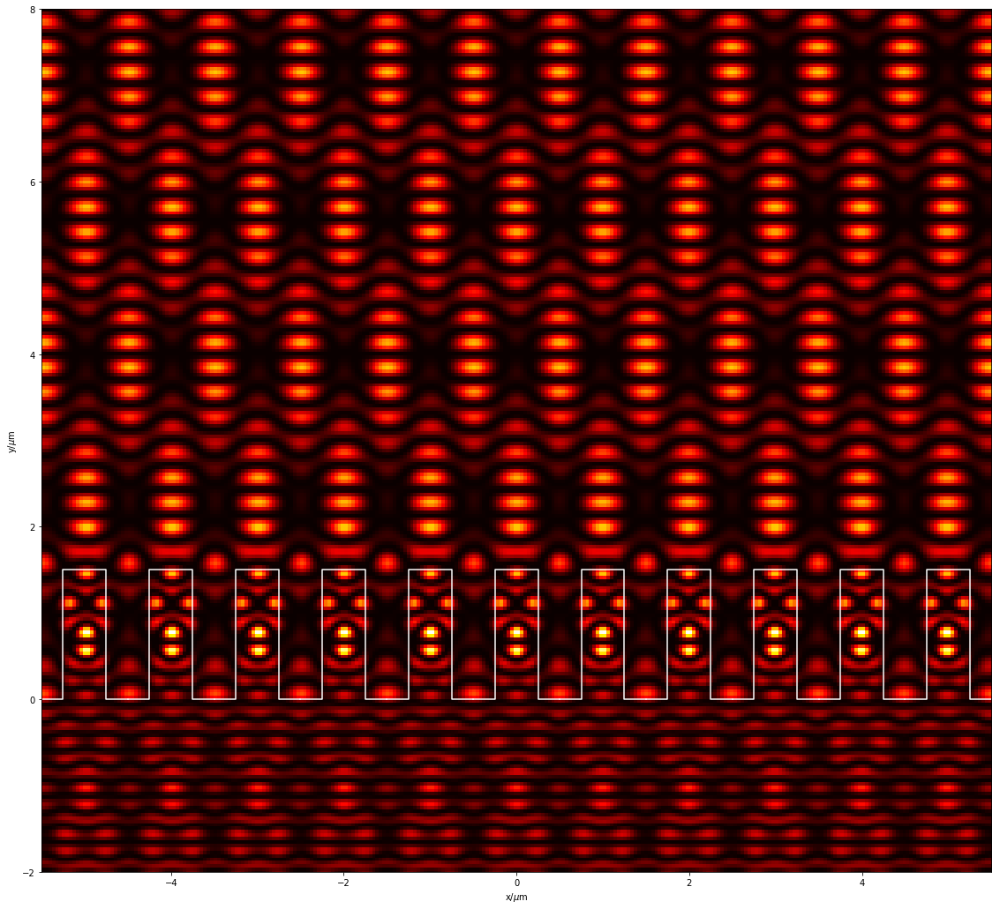

In [266]:
plt.figure(figsize=(W*num_reps,H))
plt.imshow(np.real(ez)**2,
          extent=[-W/2,W/2,-H/2,H/2],origin='lower',cmap='hot')
plt.ylim(-2,8)
pxs = np.array([-W/2/num_tiles,-w/2,-w/2,w/2,w/2,W/2/num_tiles])
pxs = pxs - W/num_tiles*(num_tiles-1)/2
for i in range(num_tiles):
    plt.plot(pxs,
            [0,0,h,h,0,0],'w',label='post')
    pxs = pxs + W/num_tiles
plt.xlabel('x/$\mu$m')
plt.ylabel('y/$\mu$m')
plt.show()

## Plano - Convex

### Plano Convex -  Saving and Loading Farfields

#### initial run

In [18]:
# simulation is run here, the nearfield object saved
# on the next section of the notebook, the simulation is 
# just initialized, not runed
# and the previously computed farfield is loaded

In [25]:
sag

41.742430504416006

In [19]:
W = 400

n = 1.5 #
epsilon = n**2
f = 1000 #
R = (n-1)*f

pml_thickness = 1
wavelength = 1
fcen = 1./wavelength
source_width = 2
resolution = 5
sag = R - np.sqrt(R**2-(W/2)**2)

H = 4 * sag

simulation_time = 2*H/wavelength

source_offset = 3 * wavelength
near2far_offset = sag + source_offset

print("Radius = %.1f um" % R)

geometry = [mp.Cylinder(radius = R,
                        center = mp.Vector3(0,-R+sag),
                        material = mp.Medium(epsilon=epsilon))]
pml_layers = [mp.PML(pml_thickness)]

cell = mp.Vector3(W, H, 0)
symmetries = [mp.Mirror(mp.X)]

sources = [mp.Source(src=mp.ContinuousSource(wavelength=wavelength,
                                            width = source_width),
                    component=mp.Ez,
                    center=mp.Vector3(0,-source_offset),
                    size=mp.Vector3(W - 3*pml_thickness,0))]

sim = mp.Simulation(cell_size=cell,
                   boundary_layers=pml_layers,
                   geometry=geometry,
                   sources=sources,
                   resolution=resolution,
                   symmetries=symmetries)
nearfield = sim.add_near2far(
   fcen, 0, 1,
   mp.Near2FarRegion(center=mp.Vector3(0, near2far_offset), size=mp.Vector3(300), weight=1.0))
#sim.load_near2far('near2f',nearfield)
sim.run(until = simulation_time)
                   #force_complex_fields=True)
# mp.Near2FarRegion(center=mp.Vector3(0, near2far_offset), size=mp.Vector3(W-2*pml_thickness), weight=1.0))

Radius = 500.0 um
-----------
Initializing structure...
Meep progress: 37.1/333.93944403532805 = 11.1% done in 4.0s, 32.0s to go
Meep progress: 76.3/333.93944403532805 = 22.8% done in 8.0s, 27.0s to go
Meep progress: 116.5/333.93944403532805 = 34.9% done in 12.0s, 22.4s to go
Meep progress: 155.70000000000002/333.93944403532805 = 46.6% done in 16.0s, 18.3s to go
Meep progress: 195.3/333.93944403532805 = 58.5% done in 20.0s, 14.2s to go
Meep progress: 235.20000000000002/333.93944403532805 = 70.4% done in 24.0s, 10.1s to go
Meep progress: 275.1/333.93944403532805 = 82.4% done in 28.0s, 6.0s to go
Meep progress: 315.0/333.93944403532805 = 94.3% done in 32.0s, 1.9s to go
run 0 finished at t = 334.0 (3340 timesteps)


In [23]:
print(nearfield.dfreq)

0.0


In [35]:
sim.save_near2far('near2f',nearfield)

In [19]:
ez = sim.get_array(component=mp.Ez)
hy = sim.get_array(component=mp.Hy)
eps = sim.get_array(component=mp.Dielectric)

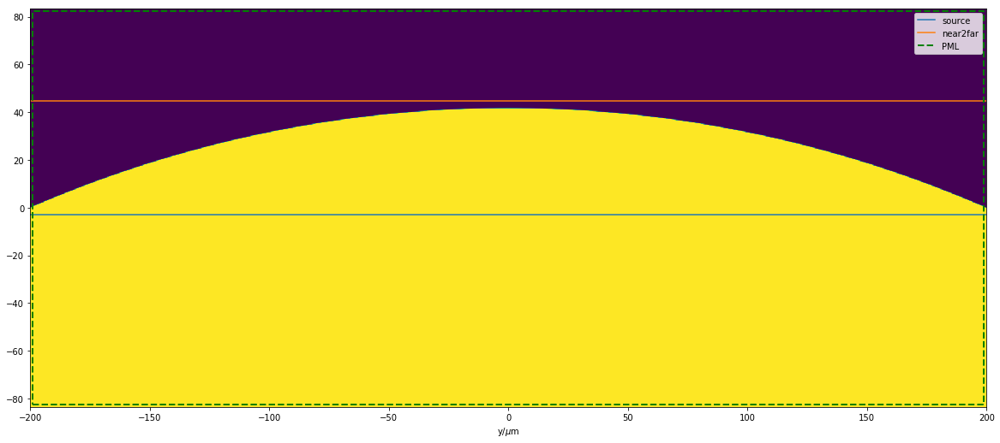

In [20]:
plt.figure(figsize=(20,20*W/H))
plt.imshow(np.transpose(eps),extent=[-W/2,W/2,-H/2,H/2],origin='lower')
plt.plot([-W/2,W/2],[-source_offset,-source_offset],label='source')
plt.plot([-W/2,W/2],[near2far_offset,near2far_offset],label='near2far')
plt.plot([-W/2+pml_thickness,W/2-pml_thickness,W/2-pml_thickness,-W/2+pml_thickness,-W/2+pml_thickness],
         [-H/2+pml_thickness,-H/2+pml_thickness,H/2-pml_thickness,H/2-pml_thickness,-H/2+pml_thickness],
         'g--',lw=2,label='PML')
plt.xlabel('x/$\mu$m')
plt.xlabel('y/$\mu$m')
plt.legend()
plt.show()

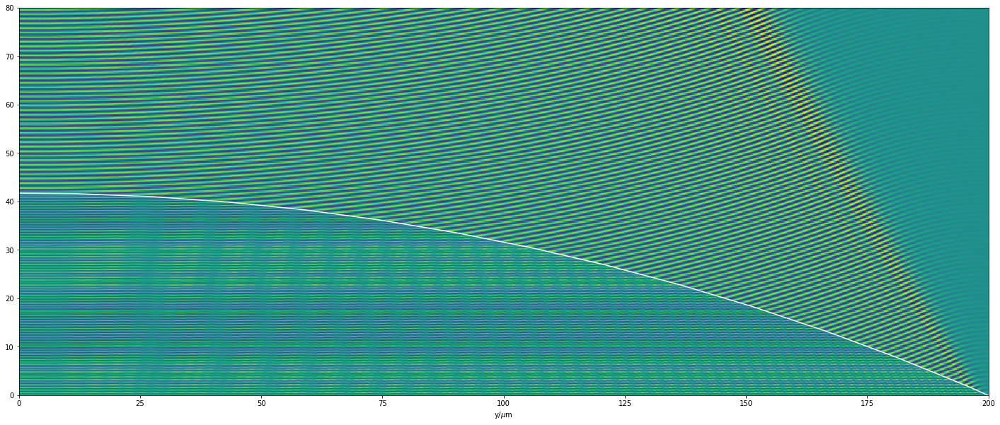

In [21]:
angles = np.linspace(0,2*np.pi,200)
plt.figure(figsize=(20,20*H/W))
plt.imshow(np.real(np.transpose(ez)),extent=[-W/2,W/2,-H/2,H/2],origin='lower')
plt.plot(R*np.cos(angles),R*np.sin(angles)-R+sag,'w')
plt.xlim(-W/2,W/2)
plt.ylim(-H/2,H/2)
plt.xlabel('x/$\mu$m')
plt.xlabel('y/$\mu$m')
plt.ylim(0,80)
plt.xlim(0,200)
plt.tight_layout()
#plt.savefig('plano-convex-even-higher-resolution.png',dpi=100,transparent=True)
plt.show()

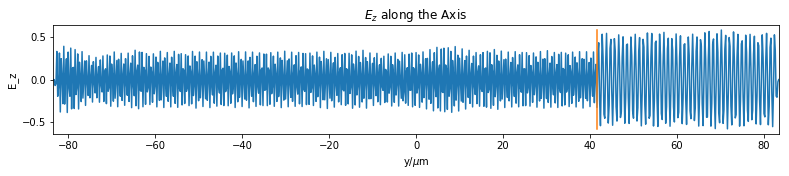

In [22]:
axial_slice = np.real(np.transpose(ez))[:,int(ez.shape[0]/2)]
plt.figure(figsize=(13,2))
plt.plot(np.linspace(-H/2,H/2,ez.shape[1]),axial_slice)
plt.plot([sag,sag],[np.min(axial_slice),np.max(axial_slice)])
plt.xlim(-H/2,H/2)
plt.xlabel('y/$\mu$m')
plt.ylabel('E_z')
plt.title('$E_z$ along the Axis')
plt.show()

In [33]:
num_farfield_points = 200
axis_values = np.linspace(500,1000, num_farfield_points)
faraway = np.array([sum(np.abs(np.array(sim.get_farfield(nearfield, mp.Vector3(0,y))))[:3]**2) for y in axis_values])

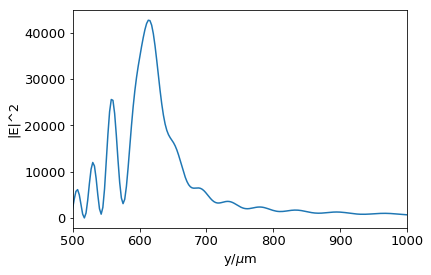

In [34]:
plt.rcParams.update({'font.size': 13})
plt.figure()
plt.plot(axis_values,faraway)
plt.xlabel('y/$\mu$m')
plt.ylabel('|E|^2')
plt.xlim(500,1000)
#plt.ylim(0,1.1*max(max(faraway),1.1*max(at_resolution_of_20['faraway'])))
plt.show()

#### dry run

In [3]:
# simulation is run here, the nearfield object saved
# on the next section of the notebook, the simulation is 
# just initialized, not runed
# and the previously computed farfield is loaded

In [ ]:
W = 400

n = 1.5 #
epsilon = n**2
f = 1000 #
R = (n-1)*f

pml_thickness = 1
wavelength = 1
fcen = 1./wavelength
source_width = 2
resolution = 5
sag = R - np.sqrt(R**2-(W/2)**2)

H = 4 * sag

simulation_time = 2*H/wavelength

source_offset = 3 * wavelength
near2far_offset = sag + source_offset

print("Radius = %.1f um" % R)

geometry = [mp.Cylinder(radius = R,
                        center = mp.Vector3(0,-R+sag),
                        material = mp.Medium(epsilon=epsilon))]
pml_layers = [mp.PML(pml_thickness)]

cell = mp.Vector3(W, H, 0)
symmetries = [mp.Mirror(mp.X)]

sources = [mp.Source(src=mp.ContinuousSource(wavelength=wavelength,
                                            width = source_width),
                    component=mp.Ez,
                    center=mp.Vector3(0,-source_offset),
                    size=mp.Vector3(W - 3*pml_thickness,0))]

sim = mp.Simulation(cell_size=cell,
                   boundary_layers=pml_layers,
                   geometry=geometry,
                   sources=sources,
                   resolution=resolution,
                   symmetries=symmetries)
nearfield = sim.add_near2far(
   fcen, 0, 1,
   mp.Near2FarRegion(center=mp.Vector3(0, near2far_offset), size=mp.Vector3(300), weight=1.0))

sim.load_near2far('neartoofar',nearfield)

#sim.run(until = simulation_time)
                   #force_complex_fields=True)
# mp.Near2FarRegion(center=mp.Vector3(0, near2far_offset), size=mp.Vector3(W-2*pml_thickness), weight=1.0))

In [5]:
ez = sim.get_array(component=mp.Ez)
hy = sim.get_array(component=mp.Hy)
eps = sim.get_array(component=mp.Dielectric)

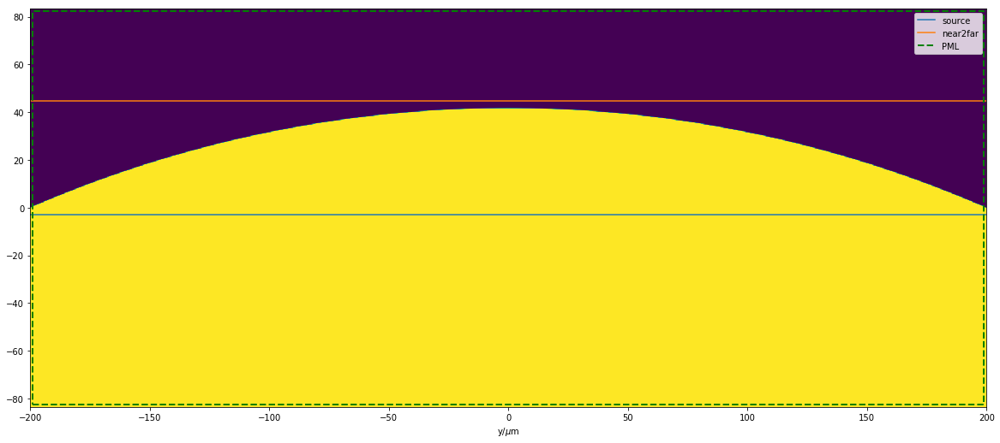

In [6]:
plt.figure(figsize=(20,20*W/H))
plt.imshow(np.transpose(eps),extent=[-W/2,W/2,-H/2,H/2],origin='lower')
plt.plot([-W/2,W/2],[-source_offset,-source_offset],label='source')
plt.plot([-W/2,W/2],[near2far_offset,near2far_offset],label='near2far')
plt.plot([-W/2+pml_thickness,W/2-pml_thickness,W/2-pml_thickness,-W/2+pml_thickness,-W/2+pml_thickness],
         [-H/2+pml_thickness,-H/2+pml_thickness,H/2-pml_thickness,H/2-pml_thickness,-H/2+pml_thickness],
         'g--',lw=2,label='PML')
plt.xlabel('x/$\mu$m')
plt.xlabel('y/$\mu$m')
plt.legend()
plt.show()

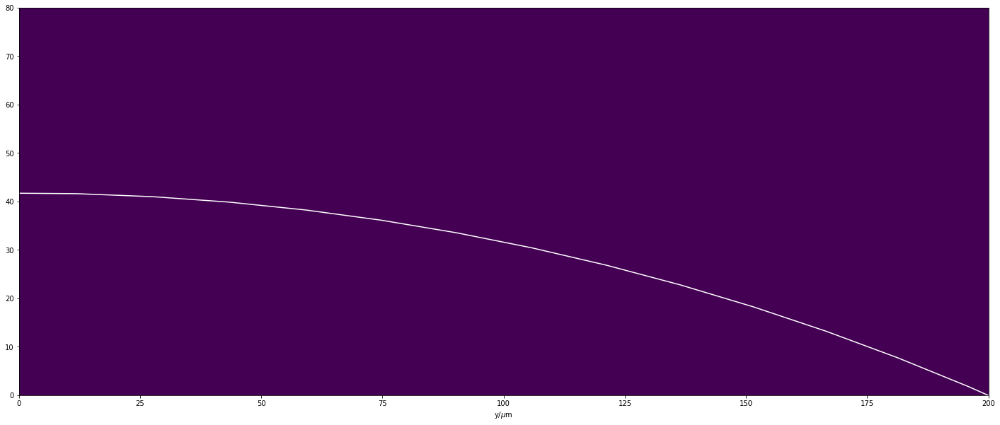

In [7]:
angles = np.linspace(0,2*np.pi,200)
plt.figure(figsize=(20,20*H/W))
plt.imshow(np.real(np.transpose(ez)),extent=[-W/2,W/2,-H/2,H/2],origin='lower')
plt.plot(R*np.cos(angles),R*np.sin(angles)-R+sag,'w')
plt.xlim(-W/2,W/2)
plt.ylim(-H/2,H/2)
plt.xlabel('x/$\mu$m')
plt.xlabel('y/$\mu$m')
plt.ylim(0,80)
plt.xlim(0,200)
plt.tight_layout()
#plt.savefig('plano-convex-even-higher-resolution.png',dpi=100,transparent=True)
plt.show()

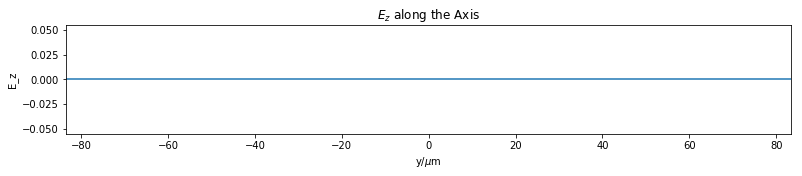

In [8]:
axial_slice = np.real(np.transpose(ez))[:,int(ez.shape[0]/2)]
plt.figure(figsize=(13,2))
plt.plot(np.linspace(-H/2,H/2,ez.shape[1]),axial_slice)
plt.plot([sag,sag],[np.min(axial_slice),np.max(axial_slice)])
plt.xlim(-H/2,H/2)
plt.xlabel('y/$\mu$m')
plt.ylabel('E_z')
plt.title('$E_z$ along the Axis')
plt.show()

In [9]:
num_farfield_points = 200
axis_values = np.linspace(500,1000, num_farfield_points)
faraway = np.array([sum(np.abs(np.array(sim.get_farfield(nearfield, mp.Vector3(0,y))))[:3]**2) for y in axis_values])

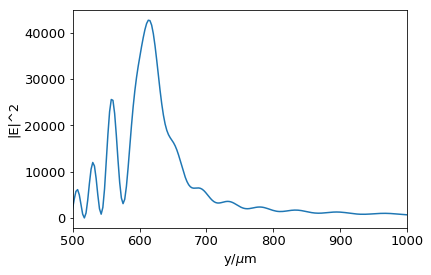

In [10]:
plt.rcParams.update({'font.size': 13})
plt.figure()
plt.plot(axis_values,faraway)
plt.xlabel('y/$\mu$m')
plt.ylabel('|E|^2')
plt.xlim(500,1000)
#plt.ylim(0,1.1*max(max(faraway),1.1*max(at_resolution_of_20['faraway'])))
plt.show()

#### Using parallel

In [13]:
import pickle

In [14]:
faraway = pickle.load(open('toofartest.pkl','rb'))

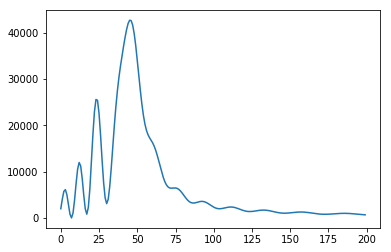

In [15]:
plt.figure()
plt.plot(faraway)
plt.show()

### Plano Convex -  Far Field Again, this time it worked

In [ ]:
from scipy.interpolate import interp1d
from scipy.optimize import curve_fit

In [67]:
W = 400

n = 1.5 #
epsilon = n**2
f = 1000 #
R = (n-1)*f

pml_thickness = 1
wavelength = 1
fcen = 1./wavelength
source_width = 2
resolution = 10
sag = R - np.sqrt(R**2-(W/2)**2)

H = 4 * sag

simulation_time = 2*H/wavelength

source_offset = 3 * wavelength
near2far_offset = sag + source_offset

print("Radius = %.1f um" % R)

geometry = [mp.Cylinder(radius = R,
                        center = mp.Vector3(0,-R+sag),
                        material = mp.Medium(epsilon=epsilon))]
pml_layers = [mp.PML(pml_thickness)]

cell = mp.Vector3(W, H, 0)
symmetries = [mp.Mirror(mp.X)]

sources = [mp.Source(src=mp.ContinuousSource(wavelength=wavelength,
                                            width = source_width),
                    component=mp.Ez,
                    center=mp.Vector3(0,-source_offset),
                    size=mp.Vector3(W - 3*pml_thickness,0))]

sim = mp.Simulation(cell_size=cell,
                   boundary_layers=pml_layers,
                   geometry=geometry,
                   sources=sources,
                   resolution=resolution,
                   symmetries=symmetries)
                   #force_complex_fields=True)
# mp.Near2FarRegion(center=mp.Vector3(0, near2far_offset), size=mp.Vector3(W-2*pml_thickness), weight=1.0))
nearfield = sim.add_near2far(
   fcen, 0, 1,
   mp.Near2FarRegion(center=mp.Vector3(0, near2far_offset), size=mp.Vector3(300), weight=1.0))

sim.run(until = simulation_time)

Radius = 500.0 um
-----------
Initializing structure...
Meep progress: 4.55/333.93944403532805 = 1.4% done in 4.0s, 290.4s to go
Meep progress: 9.8/333.93944403532805 = 2.9% done in 8.0s, 266.1s to go
Meep progress: 14.9/333.93944403532805 = 4.5% done in 12.1s, 258.3s to go
Meep progress: 19.75/333.93944403532805 = 5.9% done in 16.1s, 255.8s to go
Meep progress: 24.5/333.93944403532805 = 7.3% done in 20.1s, 254.0s to go
Meep progress: 29.05/333.93944403532805 = 8.7% done in 24.1s, 253.1s to go
Meep progress: 33.6/333.93944403532805 = 10.1% done in 28.1s, 251.5s to go
Meep progress: 38.0/333.93944403532805 = 11.4% done in 32.2s, 250.4s to go
Meep progress: 42.45/333.93944403532805 = 12.7% done in 36.2s, 248.3s to go
Meep progress: 46.85/333.93944403532805 = 14.0% done in 40.2s, 246.2s to go
Meep progress: 51.300000000000004/333.93944403532805 = 15.4% done in 44.2s, 243.4s to go
Meep progress: 55.800000000000004/333.93944403532805 = 16.7% done in 48.2s, 240.2s to go
Meep progress: 60.25/

In [68]:
!pushover.py "Done done done"

In [99]:
ez = sim.get_array(component=mp.Ez)
hy = sim.get_array(component=mp.Hy)
eps = sim.get_array(component=mp.Dielectric)

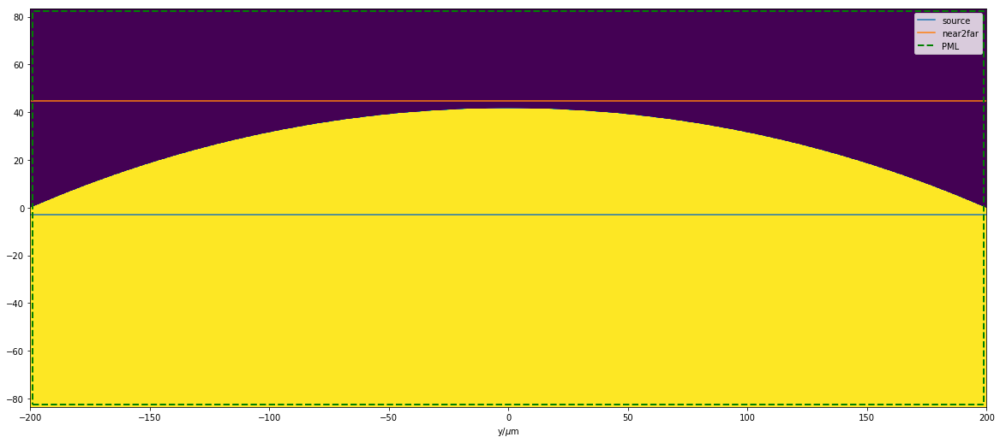

In [70]:
plt.figure(figsize=(20,20*W/H))
plt.imshow(np.transpose(eps),extent=[-W/2,W/2,-H/2,H/2],origin='lower')
plt.plot([-W/2,W/2],[-source_offset,-source_offset],label='source')
plt.plot([-W/2,W/2],[near2far_offset,near2far_offset],label='near2far')
plt.plot([-W/2+pml_thickness,W/2-pml_thickness,W/2-pml_thickness,-W/2+pml_thickness,-W/2+pml_thickness],
         [-H/2+pml_thickness,-H/2+pml_thickness,H/2-pml_thickness,H/2-pml_thickness,-H/2+pml_thickness],
         'g--',lw=2,label='PML')
plt.xlabel('x/$\mu$m')
plt.xlabel('y/$\mu$m')
plt.legend()
plt.show()

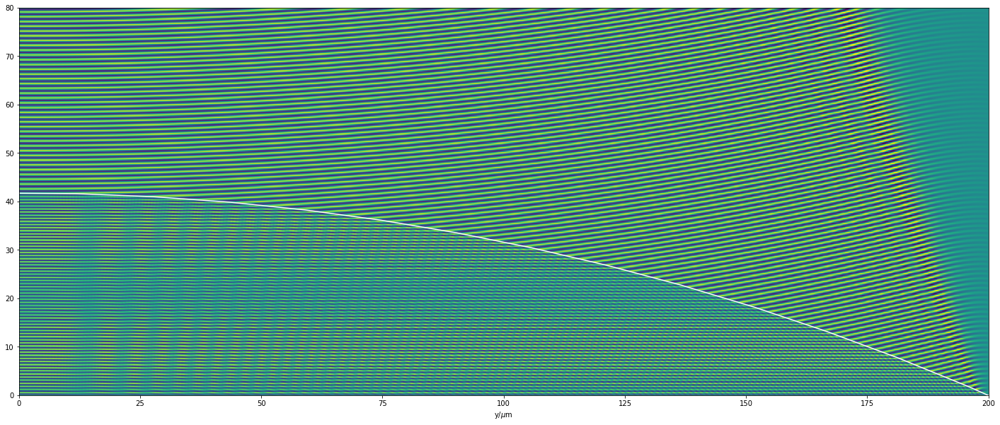

In [100]:
angles = np.linspace(0,2*np.pi,200)
plt.figure(figsize=(20,20*H/W))
plt.imshow(np.real(np.transpose(ez)),extent=[-W/2,W/2,-H/2,H/2],origin='lower')
plt.plot(R*np.cos(angles),R*np.sin(angles)-R+sag,'w')
plt.xlim(-W/2,W/2)
plt.ylim(-H/2,H/2)
plt.xlabel('x/$\mu$m')
plt.xlabel('y/$\mu$m')
plt.ylim(0,80)
plt.xlim(0,200)
plt.tight_layout()
#plt.savefig('plano-convex-even-higher-resolution.png',dpi=100,transparent=True)
plt.show()

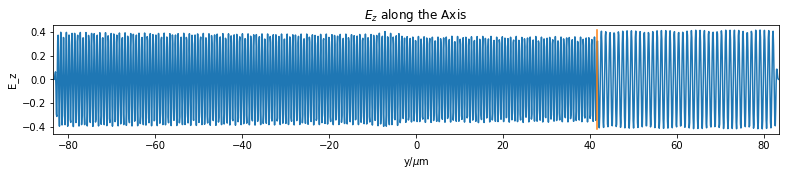

In [101]:
axial_slice = np.real(np.transpose(ez))[:,int(ez.shape[0]/2)]
plt.figure(figsize=(13,2))
plt.plot(np.linspace(-H/2,H/2,ez.shape[1]),axial_slice)
plt.plot([sag,sag],[np.min(axial_slice),np.max(axial_slice)])
plt.xlim(-H/2,H/2)
plt.xlabel('y/$\mu$m')
plt.ylabel('E_z')
plt.title('$E_z$ along the Axis')
plt.show()

In [102]:
axial_extent_in_um = 2*f 
num_farfield_points = 300
axis_values = np.linspace(0,axial_extent_in_um, num_farfield_points)
faraway = np.array([sum(np.abs(np.array(sim.get_farfield(nearfield, mp.Vector3(0,y))))[:3]**2) for y in axis_values])

In [167]:
pickle.dump({'axis_values': axis_values,'faraway': faraway}, open('/Volumes/bilbo/CEM/MEEP/faraway-resolution-10.pkl','wb'))

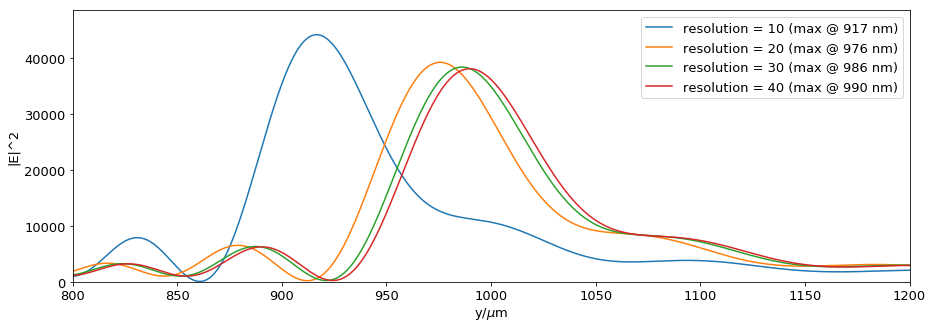

In [401]:
# resolution 20 took 3223 s at zialab-8
# resolution 30 took 10680 s at zialab-8
# resolution 40 took 25100 s at zialab-8
plt.rcParams.update({'font.size': 13})
many_resolutions = {res: pickle.load(open('/Volumes/bilbo/CEM/MEEP/faraway-resolution-%d.pkl' % res,'rb'))  for res in [10,20,30,40]}
finer_axial_values = np.linspace(800,1200,1000)
finer_many_resolutions = {}
for res in [10,20,30,40]:
    finer_many_resolutions[res] = {}
    finer_many_resolutions[res]['axis_values'] = finer_axial_values
    f = interp1d(many_resolutions[res]['axis_values'],many_resolutions[res]['faraway'],kind='cubic')
    finer_many_resolutions[res]['faraway'] = f(finer_axial_values)
fspots = {res: finer_many_resolutions[res]['axis_values'][np.argmax(finer_many_resolutions[res]['faraway'])]  for res in finer_many_resolutions}
plt.figure(figsize=(15,5))
#plt.plot([f,f],[0,1.1*max(many_resolutions[10]['faraway'])],'b--',alpha=0.1)
for res in finer_many_resolutions:
    plt.plot(finer_many_resolutions[res]['axis_values'],finer_many_resolutions[res]['faraway'],'-',label='resolution = %d (max @ %.0f nm)' % (res,fspots[res]))
plt.xlabel('y/$\mu$m')
plt.ylabel('|E|^2')
plt.xlim(800,1200)
plt.ylim(0,1.1*max(max(faraway),1.1*max(at_resolution_of_20['faraway'])))
plt.legend()
plt.show()

In [420]:
(lambda x,y: x+y)(1,2)

3

In [423]:
extrapolated = []
for index, x in enumerate(finer_axial_values):
    popt, _ = curve_fit(lambda x,a,b:a*x**2+b, [1/res for res in [20,30,40]], [finer_many_resolutions[res]['faraway'][index] for res in [20,30,40]])
    extrapolated.append(popt[1])

In [425]:
def square(x, a, b):
    return a * x**2 + b
popt, _ = curve_fit(square, [1/res for res in finer_many_resolutions], [fspots[res] for res in many_resolutions])

In [426]:
'extrapolated focal spot at = %.1f um' % popt[1]

'extrapolated focal spot at = 995.0 um'

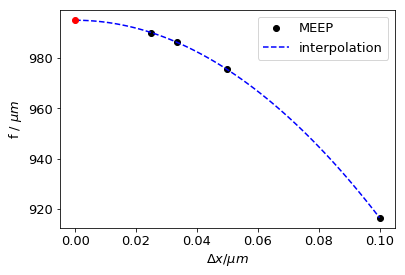

In [429]:
plt.figure()
x_values = np.linspace(0,0.1,100)
plt.plot([1/res for res in finer_many_resolutions],[fspots[res] for res in many_resolutions],'ko',label='MEEP')
plt.plot(x_values, square(x_values, *popt),'b--',label='interpolation')
plt.plot([0],[popt[1]],'ro')
plt.xlabel('$\Delta{x}/{\mu}m$')
plt.ylabel('f / $\mu{m}$')
plt.legend()
plt.show()

In [341]:
highest_resolution_e = h5py.File('/Volumes/bilbo/CEM/MEEP/plano_convex/plano_convex-e-000333.95.h5','r')
high_ez = highest_resolution_e['ez'][:]
highest_resolution_e.close()
highest_resolution_h = h5py.File('/Volumes/bilbo/CEM/MEEP/plano_convex/plano_convex-h-000333.95.h5','r')
high_hx = highest_resolution_h['hx'][:]
high_hy = highest_resolution_h['hy'][:]
highest_resolution_h.close()

In [343]:
high_sx = -np.multiply(high_ez,high_hy)
high_sy = np.multiply(high_ez,high_hx)

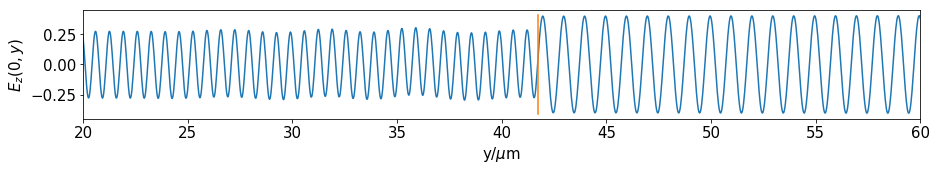

In [342]:
plt.rcParams.update({'font.size': 15})
axial_slice = np.real(np.transpose(high_ez))[:,int(high_ez.shape[0]/2)]
plt.figure(figsize=(15,2))
plt.plot(np.linspace(-H/2,H/2,high_ez.shape[1]),axial_slice)
plt.plot([sag,sag],[np.min(axial_slice),np.max(axial_slice)])
plt.xlim(20,60)
plt.xlabel('y/$\mu$m')
plt.ylabel('$E_z(0,y)$')
plt.show()

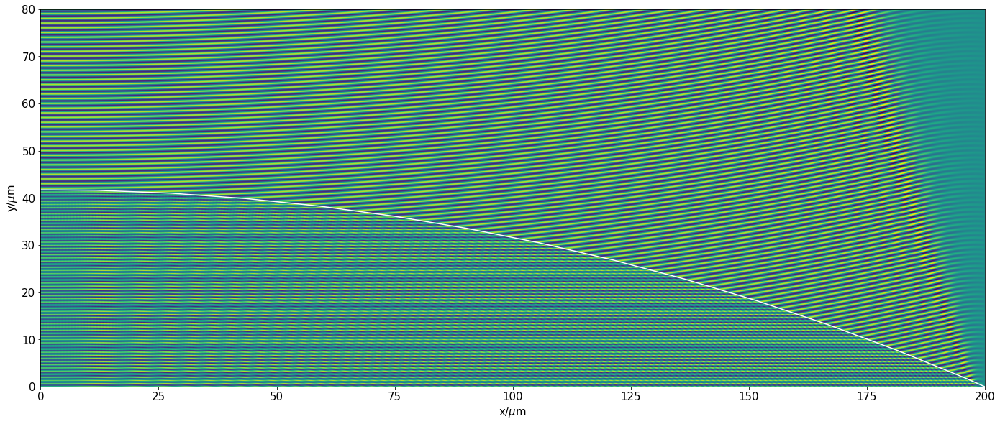

In [345]:
plt.rcParams.update({'font.size': 15})
angles = np.linspace(0,2*np.pi,200)
plt.figure(figsize=(20,20*H/W))
plt.imshow(np.real(np.transpose(high_ez)),extent=[-W/2,W/2,-H/2,H/2],origin='lower')
plt.plot(R*np.cos(angles),R*np.sin(angles)-R+sag,'w')
plt.xlim(-W/2,W/2)
plt.ylim(-H/2,H/2)
plt.xlabel('x/$\mu$m')
plt.ylabel('y/$\mu$m')
plt.ylim(0,80)
plt.xlim(0,200)
plt.tight_layout()
plt.savefig('plano-convex-best-resolution.png',dpi=100,transparent=True)
plt.show()

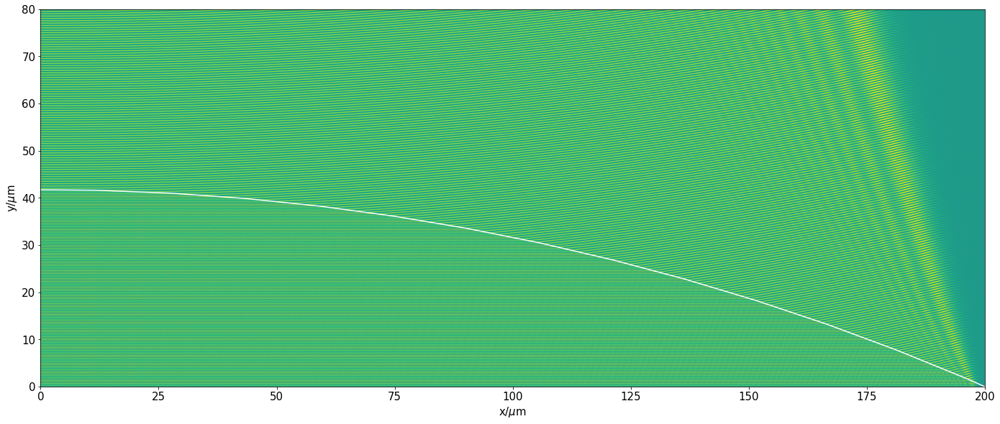

In [346]:
plt.rcParams.update({'font.size': 15})
angles = np.linspace(0,2*np.pi,200)
plt.figure(figsize=(20,20*H/W))
plt.imshow(np.real(np.transpose(high_sy)),extent=[-W/2,W/2,-H/2,H/2],origin='lower')
plt.plot(R*np.cos(angles),R*np.sin(angles)-R+sag,'w')
plt.xlim(-W/2,W/2)
plt.ylim(-H/2,H/2)
plt.xlabel('x/$\mu$m')
plt.ylabel('y/$\mu$m')
plt.ylim(0,80)
plt.xlim(0,200)
plt.tight_layout()
#plt.savefig('plano-convex-best-resolution.png',dpi=100,transparent=True)
plt.show()

In [347]:
straddle = 1
x = np.linspace(0,W/2,int(high_ez.shape[0]/2))[::straddle]
y = np.linspace(0,H/2,int(high_ez.shape[1]/2))[::straddle]

In [356]:
from scipy.signal import argrelextrema

In [381]:
maxima_args=argrelextrema(high_ez[8000], np.greater)
maxima_positions = np.linspace(-H/2,H/2,high_ez.shape[1])[maxima_args]
minima_args=argrelextrema(high_ez[8000], np.less)
minima_positions = np.linspace(-H/2,H/2,high_ez.shape[1])[minima_args]
zero_crossings = (maxima_positions + minima_positions)/2

(0, 30)

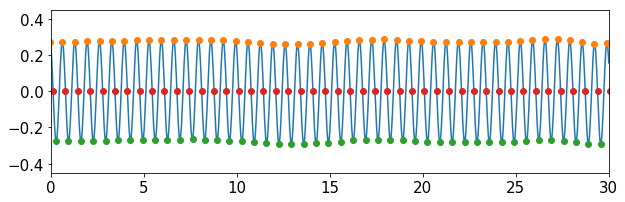

In [385]:
# find the position of maxima across the axis
plt.figure(figsize=(10,3))
plt.plot(np.linspace(-H/2,H/2,high_ez.shape[1]),high_ez[8000])
plt.plot(maxima_positions,high_ez[8000][maxima_args],'o')
plt.plot(minima_positions,high_ez[8000][minima_args],'o')
plt.plot(zero_crossings,[0]*len(zero_crossings),'o')
plt.xlim(0,30)

In [388]:
straddle = 20
x = np.linspace(0,W/2,int(high_ez.shape[0]/2))[::straddle]
y = np.linspace(0,H/2,int(high_ez.shape[1]/2))[::straddle]
quad_hx = high_hx[int(high_hx.shape[0]/2)::straddle,int(high_hx.shape[1]/2)+1::straddle]
quad_hy = high_hy[int(high_hy.shape[0]/2)::straddle,int(high_hy.shape[1]/2)+1::straddle]

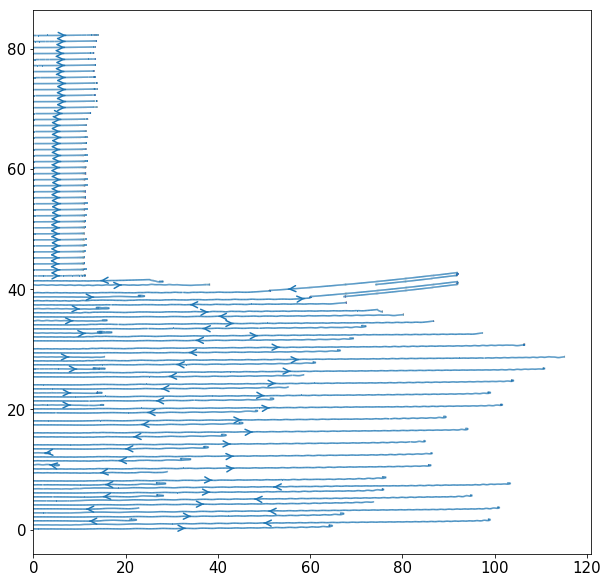

In [392]:
#X, Y = np.meshgrid(x,y)
plt.figure(figsize=(10,10))
plt.streamplot(x,y,np.transpose(quad_hx),np.transpose(quad_hy),arrowstyle='->', 
               arrowsize=1.5,
               density=40,
               start_points=[[0,y] for y in zero_crossings if y>=0 and y<82.8])
plt.show()

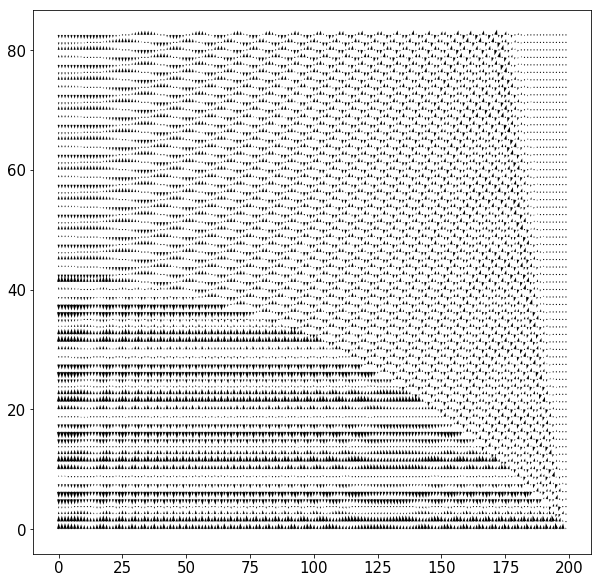

In [375]:
#X, Y = np.meshgrid(x,y)
plt.figure(figsize=(10,10))
plt.quiver(x,y,10000*np.transpose(quad_hy),10000*np.transpose(quad_hx))
plt.show()

In [393]:
!pwd

/Users/juan/Google Drive/Zia Lab/CEM/MEEP


In [397]:
saver=h5py.File('ez-hx-hy.h5','w')
saver.create_dataset('ez', data=high_ez)
saver.create_dataset('hx', data=high_hx)
saver.create_dataset('hy', data=high_hy)
saver.close()

In [400]:
H

166.96972201766403

In [727]:
high_res_plano_convex = h5py.File('high-resolution-plano-convex.h5','w')

In [728]:
high_res_plano_convex.create_dataset('ez', data = ez)

<HDF5 dataset "ez": shape (8000, 3339), type "<f8">

In [729]:
high_res_plano_convex.close()

In [ ]:
zero_crossings

In [302]:
!say "Hello"

### Plano Convex - Frequency Solver

In [96]:
W = 400

n = 1.5 #
epsilon = n**2
f = 1000 #
R = (n-1)*f

pml_thickness = 1
wavelength = 1
source_width = 1
resolution = 4
sag = R - np.sqrt(R**2-(W/2)**2)

H = 4 * sag

simulation_time = 2*H/wavelength

source_offset = 3 * wavelength
near2far_offset = sag + source_offset

print("Radius = %.1f um" % R)



geometry = [
           mp.Cylinder(radius = R,
                      center = mp.Vector3(0,-R+sag),
                      material = mp.Medium(epsilon=epsilon))]
pml_layers = [mp.PML(pml_thickness)]

cell = mp.Vector3(W, H, 0)

#symmetries = [mp.Mirror(mp.X)]
symmetries = []

sources = [mp.Source(src=mp.ContinuousSource(wavelength=wavelength,
                                            width = source_width),
                    component=mp.Ez,
                    center=mp.Vector3(0,-source_offset),
                    size=mp.Vector3(W - 4*pml_thickness,0))]

sim = mp.Simulation(cell_size=cell,
                    boundary_layers=pml_layers,
                    geometry=geometry,
                    sources=sources,
                    resolution=resolution,
                    force_complex_fields=True)

Radius = 500.0 um


In [97]:
sim.init_sim()

-----------
Initializing structure...
Meep: using complex fields.


In [ ]:
sim.solve_cw(maxiters=30000)

In [ ]:
cw

In [ ]:
!pushover.py "Done done done"

In [ ]:
!notify "Done"

In [ ]:
ez = sim.get_array(component=mp.Ez)
eps = sim.get_array(component=mp.Dielectric)

In [ ]:
plt.figure(figsize=(20,20*W/H))
plt.imshow(np.transpose(eps),extent=[-W/2,W/2,-H/2,H/2],origin='lower')
plt.plot([-(W - 2*pml_thickness)/2,(W - 2*pml_thickness)/2],[-source_offset,-source_offset],label='source')
plt.plot([-W/2+pml_thickness,W/2-pml_thickness,W/2-pml_thickness,-W/2+pml_thickness,-W/2+pml_thickness],
         [-H/2+pml_thickness,-H/2+pml_thickness,H/2-pml_thickness,H/2-pml_thickness,-H/2+pml_thickness],
         'g--',lw=2,label='PML')
plt.xlabel('x/$\mu$m')
plt.xlabel('y/$\mu$m')
plt.legend()
plt.show()

In [ ]:
angles = np.linspace(0,2*np.pi,200)
plt.figure(figsize=(20,20*H/W))
plt.imshow(np.real(np.transpose(ez)),extent=[-W/2,W/2,-H/2,H/2],origin='lower')
plt.plot(R*np.cos(angles),R*np.sin(angles)-R+sag,'w')
plt.xlim(-W/2,W/2)
plt.ylim(-H/2,H/2)
plt.xlabel('x/$\mu$m')
plt.xlabel('y/$\mu$m')
#plt.ylim(0,sag)
#plt.xlim(0,200)
plt.tight_layout()
#plt.savefig('plano-convex-even-higher-resolution.png',dpi=100,transparent=True)
plt.show()

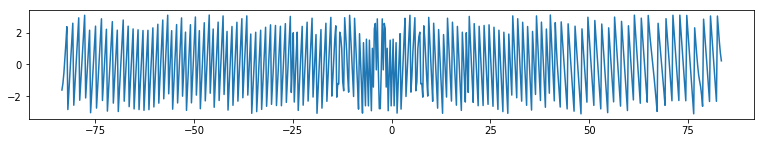

In [63]:
plt.figure(figsize=(13,2))
plt.plot(np.linspace(-H/2,H/2,668),np.angle(np.transpose(ez)[:,800]))
#plt.xlim(sag,H/2)
plt.show()

### Plano Convex - Concentric Circles Fit

In [85]:
W = 400

n = 1.5 #
epsilon = n**2
f = 1000 #
R = (n-1)*f

pml_thickness = 1
wavelength = 1
fcen = 1./wavelength
source_width = 2
resolution = 10
sag = R - np.sqrt(R**2-(W/2)**2)

H = 4 * sag

simulation_time = 2*H/wavelength

source_offset = 3 * wavelength
near2far_offset = sag + source_offset

print("Radius = %.1f um" % R)

geometry = [mp.Cylinder(radius = R,
                        center = mp.Vector3(0,-R+sag),
                        material = mp.Medium(epsilon=epsilon))]
pml_layers = [mp.PML(pml_thickness)]

cell = mp.Vector3(W, H, 0)
symmetries = [mp.Mirror(mp.X)]

sources = [mp.Source(src=mp.ContinuousSource(wavelength=wavelength,
                                            width = source_width),
                    component=mp.Ez,
                    center=mp.Vector3(0,-source_offset),
                    size=mp.Vector3(W - 2*pml_thickness,0))]

sim = mp.Simulation(cell_size=cell,
                   boundary_layers=pml_layers,
                   geometry=geometry,
                   sources=sources,
                   resolution=resolution,
                   symmetries=symmetries)
                   #force_complex_fields=True)
# mp.Near2FarRegion(center=mp.Vector3(0, near2far_offset), size=mp.Vector3(W-2*pml_thickness), weight=1.0))
nearfield = sim.add_near2far(
   fcen, 0, 1,
   mp.Near2FarRegion(center=mp.Vector3(0, near2far_offset), size=mp.Vector3(300), weight=1.0))

sim.run(until = simulation_time)

Radius = 500.0 um
-----------
Initializing structure...
Meep progress: 4.25/333.93944403532805 = 1.3% done in 4.0s, 310.8s to go
Meep progress: 9.35/333.93944403532805 = 2.8% done in 8.0s, 279.3s to go
Meep progress: 14.450000000000001/333.93944403532805 = 4.3% done in 12.1s, 266.6s to go
Meep progress: 19.450000000000003/333.93944403532805 = 5.8% done in 16.1s, 260.0s to go
Meep progress: 24.200000000000003/333.93944403532805 = 7.2% done in 20.1s, 257.1s to go
Meep progress: 28.85/333.93944403532805 = 8.6% done in 24.1s, 255.1s to go
Meep progress: 33.4/333.93944403532805 = 10.0% done in 28.1s, 253.0s to go
Meep progress: 37.95/333.93944403532805 = 11.4% done in 32.2s, 250.8s to go
Meep progress: 42.35/333.93944403532805 = 12.7% done in 36.2s, 249.2s to go
Meep progress: 46.85/333.93944403532805 = 14.0% done in 40.2s, 246.3s to go
Meep progress: 51.300000000000004/333.93944403532805 = 15.4% done in 44.2s, 243.5s to go
Meep progress: 55.800000000000004/333.93944403532805 = 16.7% done i

In [21]:
# no symmetry 74 s to run.
# with mirror symmetry 36 s

In [86]:
!pushover.py "Done done done"

In [87]:
ez = sim.get_array(component=mp.Ez)
eps = sim.get_array(component=mp.Dielectric)

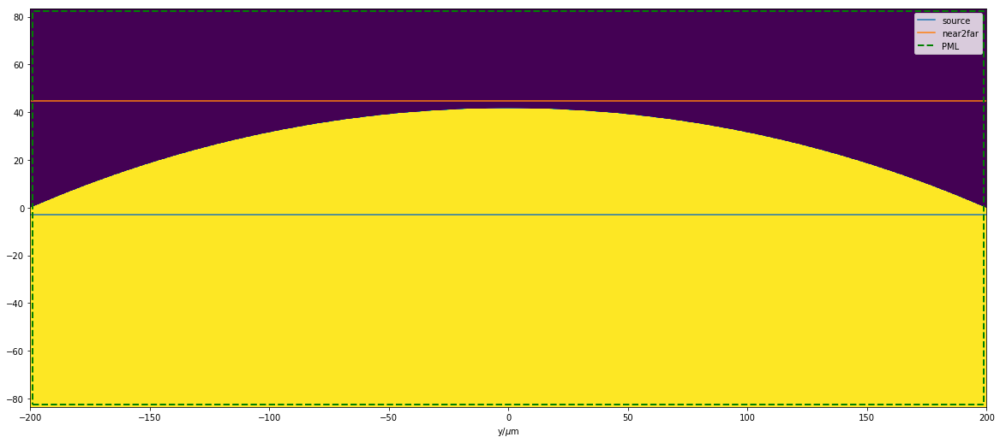

In [88]:
plt.figure(figsize=(20,20*W/H))
plt.imshow(np.transpose(eps),extent=[-W/2,W/2,-H/2,H/2],origin='lower')
plt.plot([-W/2,W/2],[-source_offset,-source_offset],label='source')
plt.plot([-W/2,W/2],[near2far_offset,near2far_offset],label='near2far')
plt.plot([-W/2+pml_thickness,W/2-pml_thickness,W/2-pml_thickness,-W/2+pml_thickness,-W/2+pml_thickness],
         [-H/2+pml_thickness,-H/2+pml_thickness,H/2-pml_thickness,H/2-pml_thickness,-H/2+pml_thickness],
         'g--',lw=2,label='PML')
plt.xlabel('x/$\mu$m')
plt.xlabel('y/$\mu$m')
plt.legend()
plt.show()

In [89]:
ez.shape

(4000, 1670)

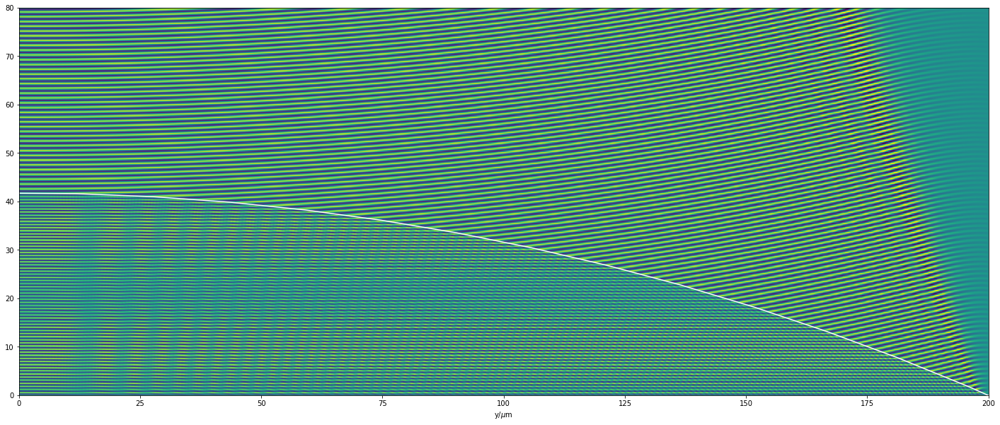

In [90]:
angles = np.linspace(0,2*np.pi,200)
plt.figure(figsize=(20,20*H/W))
plt.imshow(np.transpose(ez),extent=[-W/2,W/2,-H/2,H/2],origin='lower')
plt.plot(R*np.cos(angles),R*np.sin(angles)-R+sag,'w')
plt.xlim(-W/2,W/2)
plt.ylim(-H/2,H/2)
plt.xlabel('x/$\mu$m')
plt.xlabel('y/$\mu$m')
plt.ylim(0,80)
plt.xlim(0,200)
plt.tight_layout()
#plt.savefig('plano-convex-even-higher-resolution.png',dpi=100,transparent=True)
plt.show()

In [93]:
sliver= np.transpose(ez)[np.linspace(-H/2,H/2,ez.shape[1])>=sag][-1::-1,:].copy()
blank = sliver.copy()
blank[:] = 0

In [94]:
x = np.linspace(-W/2,W/2,sliver.shape[1])
y = np.linspace(0,H/2-sag,sliver.shape[0])
xv, yv = np.meshgrid(x, y)

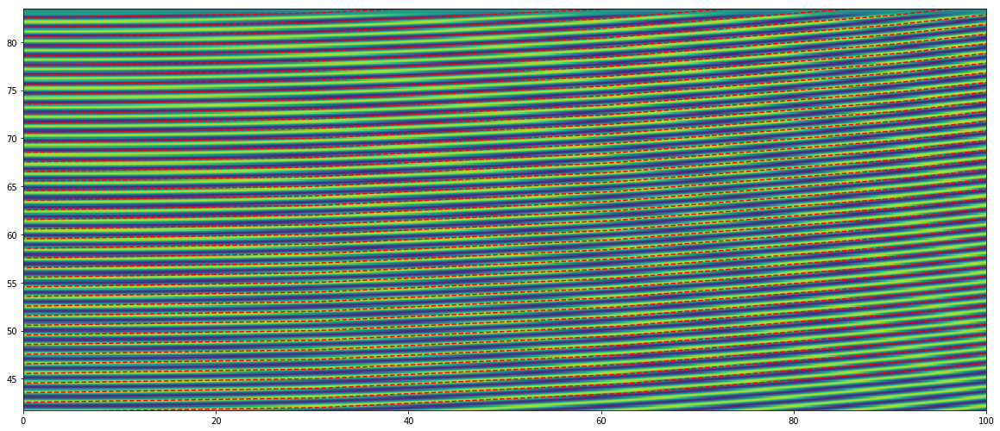

In [96]:
angles=np.linspace(0,2*np.pi,200)
plt.figure(figsize=(20,10))
plt.imshow(sliver,extent=[-W/2,W/2,sag,H/2])
for i in range(42):
    plt.plot((1000-i)*np.cos(angles+0.165),(1000-i)*np.sin(angles+0.165)+1000-0.2+sag,'r--')
plt.ylim(sag,H/2)
#plt.plot([0,W/2],[near2far_offset,near2far_offset],'y')
plt.xlim(0,100)
#plt.imshow(0.47*np.sin(2*np.pi*np.sqrt(xv**2+(yv+1000)**2)),alpha=0.5,extent=[-W/2,W/2,0,H/2-sag],cmap='binary')
plt.show()

In [727]:
high_res_plano_convex = h5py.File('high-resolution-plano-convex.h5','w')

In [728]:
high_res_plano_convex.create_dataset('ez', data = ez)

<HDF5 dataset "ez": shape (8000, 3339), type "<f8">

In [729]:
high_res_plano_convex.close()

In [732]:
!ls -lh | grep h5 | grep plano

-rw-r--r--     1 juan  staff   204M Nov  5 14:44 high-resolution-plano-convex.h5


In [714]:
np.transpose(ez).shape

(3339, 8000)

In [715]:
sag

41.742430504416006

In [716]:
np.argmin(np.abs(np.linspace(-W/2,W/2,4000)-150))

3499

In [717]:
H/2

83.48486100883201

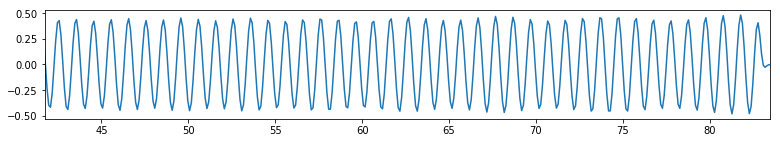

In [701]:
plt.figure(figsize=(13,2))
plt.plot(np.linspace(-H/2,H/2,1670),np.transpose(ez)[:,3499])
plt.xlim(sag,H/2)
plt.show()

In [706]:
good_x = np.linspace(-H/2,H/2,1670)[np.linspace(-H/2,H/2,1670)>=sag]
good_y = np.transpose(ez)[:,3499][np.linspace(-H/2,H/2,1670)>=sag]
np.savetxt('acut.csv',np.transpose(np.array([good_x,good_y])),delimiter=',')

In [91]:
axial_extent_in_um = 2*f 
num_farfield_points = 200
axis_values = np.linspace(0,axial_extent_in_um, num_farfield_points)
faraway = np.array([sum(np.abs(np.array(sim.get_farfield(nearfield, mp.Vector3(0,y))))[:3]**2) for y in axis_values])

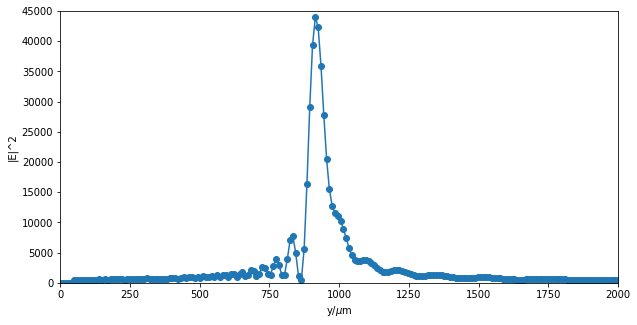

In [98]:
plt.figure(figsize=(10,5))
plt.plot(axis_values,faraway,'o-')
#plt.plot([f,f],[0,max(faraway)])
plt.xlabel('y/$\mu$m')
#plt.ylim(0.0001175,0.000124)
#plt.xlim(50,60)
plt.xlim(0,2*f)
plt.ylim(0,45000)
plt.ylabel('|E|^2')
plt.show()

In [720]:
axial_extent_in_um = 2*f 
num_farfield_lateral_points = 100
num_farfield_axial_points = 100
lateral_extent_in_um = W
farfaraway = []
axis_values_full = np.linspace(0,axial_extent_in_um,num_farfield_axial_points)
lateral_values_full = np.linspace(-lateral_extent_in_um/2,lateral_extent_in_um/2,num_farfield_lateral_points)
for index, y in enumerate(axis_values_full):
    print(index,end=',')
    faraway = np.array([sum(np.abs(np.array(sim.get_farfield(nearfield, mp.Vector3(x,y))))[:3]**2) for x in lateral_values_full])
    farfaraway.append(faraway)


0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,

In [721]:
farfaraway = np.array(farfaraway)
pickle.dump({'x_axis':axis_values_full,
             'y_axis':lateral_values_full,
             'E2':faraway},
            open('plano-convex-1-even-higher-resolution.pkl','wb'))

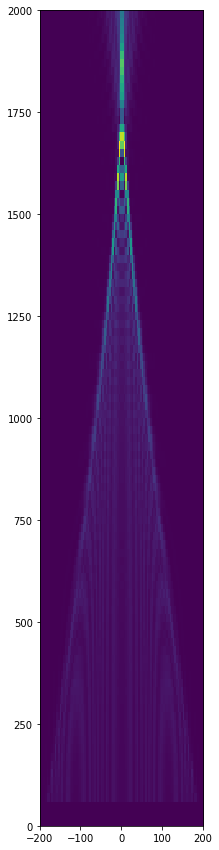

In [722]:
plt.figure(figsize=(8,15))
plt.imshow(farfaraway,
           extent=[-lateral_extent_in_um/2,lateral_extent_in_um/2,0,axial_extent_in_um],aspect=1,origin='lower')
plt.savefig('farfarfarfield-even-higher-res.png',dpi=100)
plt.show()

In [667]:
farfaraway = []
axis_values_full = np.linspace(1000,1200,400)
lateral_values_full = np.linspace(-100,100,400)
for index, y in enumerate(axis_values_full):
    print(index,end=',')
    faraway = np.array([sum(np.abs(np.array(sim.get_farfield(nearfield, mp.Vector3(x,y))))[:3]**2) for x in lateral_values_full])
    farfaraway.append(faraway)

0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,27

In [668]:
farfaraway = np.array(farfaraway)
pickle.dump({'x_axis':axis_values_full,
             'y_axis':lateral_values_full,
             'E2':faraway},
            open('plano-convex-2-higher-resolution.pkl','wb'))

In [669]:
axis_values_full[np.argmax(farfaraway[:,200])]

1199.498746867168

In [670]:
np.argmax(farfaraway[:,200])

398

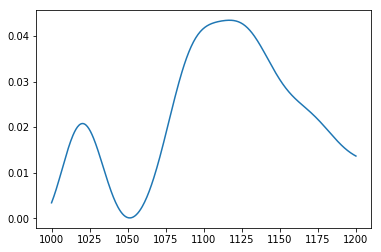

In [631]:
plt.figure()
plt.plot(axis_values_full,farfaraway[:,200])
plt.show()

In [657]:
num_aperture = W/2 / np.sqrt((W/2)**2+f**2)

In [658]:
num_aperture

0.19611613513818404

In [651]:
sigma=0.42*1*(f)/(W/2)

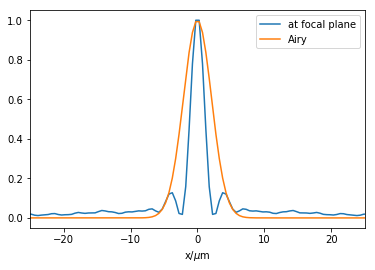

In [656]:
plt.figure()
plt.plot(lateral_values_full,farfaraway[233]/max(farfaraway[233]),label='at focal plane')
plt.plot(lateral_values_full,np.exp(-(lateral_values_full)**2/2/sigma**2),label='Airy')
plt.xlabel('x/$\mu$m')
plt.legend()
plt.xlim(-25,25)
plt.show()

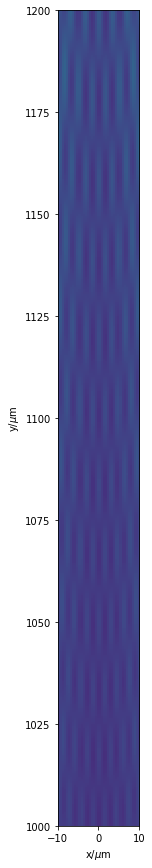

In [671]:
plt.figure(figsize=(8,15))
plt.imshow(farfaraway,extent=[-100,100,1000,1200],origin='lower')
plt.xlim(-10,10)
plt.xlabel('x/$\mu$m')
plt.ylabel('y/$\mu$m')
plt.savefig('farfield-plano-convex-at-higher-resolution.png',dpi=200)
plt.show()

In [672]:
!pushover.py "Look back."

## Simple dipole almost same as documentation example

In [39]:
import meep as mp
import math
import pickle

resolution = 50

sxy = 4
dpml = 1
cell = mp.Vector3(sxy+2*dpml,sxy+2*dpml,0)
pml_layers = [mp.PML(dpml)]

fcen = 1.0
df = 0.4
src_cmpt = mp.Ex

sources = [mp.Source(src=mp.GaussianSource(fcen,fwidth=df),
                     center=mp.Vector3(),
                     component=src_cmpt)]

if src_cmpt == mp.Ex:
    symmetries = [mp.Mirror(mp.Y)]
elif src_cmpt == mp.Ey:
    symmetries = [mp.Mirror(mp.X)]
elif src_cmpt == mp.Ez:
    symmetries = [mp.Mirror(mp.X), mp.Mirror(mp.Y)]

sim = mp.Simulation(cell_size=cell,
                    resolution=resolution,
                    sources=sources,
                    symmetries=symmetries,
                    boundary_layers=pml_layers)

nearfield = sim.add_near2far(fcen, 0, 1,
                             mp.Near2FarRegion(mp.Vector3(0,0.5*sxy), size=mp.Vector3(sxy)),
                             mp.Near2FarRegion(mp.Vector3(0,-0.5*sxy), size=mp.Vector3(sxy), weight=-1),
                             mp.Near2FarRegion(mp.Vector3(0.5*sxy), size=mp.Vector3(0,sxy)),
                             mp.Near2FarRegion(mp.Vector3(-0.5*sxy), size=mp.Vector3(0,sxy), weight=-1))

sim.run(until_after_sources=mp.stop_when_fields_decayed(50, src_cmpt, mp.Vector3(), 1e-8))

pickle.dump(sim,open('sim.pkl','wb'))

-----------
Initializing structure...
field decay(t = 50.01): 4938.6532805652805 / 4938.6532805652805 = 1.0
field decay(t = 100.01): 7.375043752817715e-11 / 4938.6532805652805 = 1.493330941420849e-14
run 0 finished at t = 100.01 (10001 timesteps)


In [40]:
num_points = 51
faraway = np.array([np.array([np.array(sim.get_farfield(nearfield, mp.Vector3(x,y))) for x in np.linspace(-100,100,num_points)]) for y in np.linspace(-100,100,num_points)]) 

In [41]:
E_field = {}
H_field = {}
for index,component in enumerate(["x","y","z"]):
    E_field[component] = np.conj(faraway[:,:,index])
    H_field[component] = faraway[:,:,index+3]
    
Px = np.real(np.multiply(E_field['y'],H_field['z'])-np.multiply(E_field['z'],H_field['y']))
Py = np.real(np.multiply(E_field['z'],H_field['x'])-np.multiply(E_field['x'],H_field['z']))
Pz = np.real(np.multiply(E_field['x'],H_field['y'])-np.multiply(E_field['y'],H_field['x']))
Pr = np.sqrt(np.square(Px)+np.square(Py)+np.square(Pz));

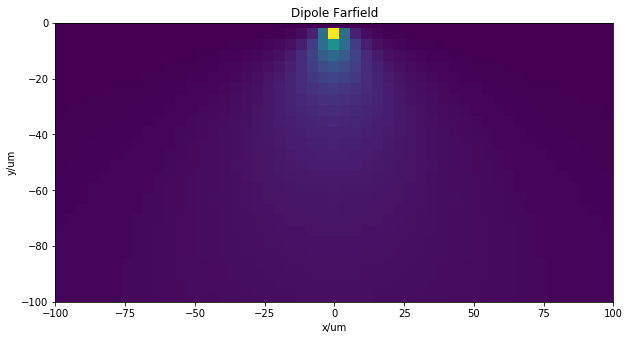

In [42]:
plt.figure(figsize=(10,10))
plt.imshow(Pr,extent=[-100,100,-100,100])
plt.xlabel('x/um')
plt.ylabel('y/um')
plt.title('Dipole Farfield')
plt.ylim(-100,0)
plt.show()

In [43]:
axis_slice = np.linspace(-100,100,num_points)[int((num_points-1)/2)+1:][1:]
radial_poynting_slice = Pr[int((num_points-1)/2)+1:,int((num_points-1)/2)][1:]

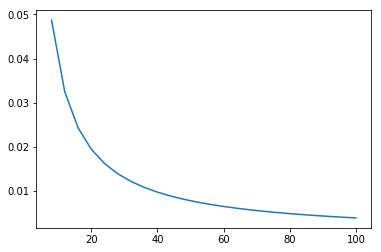

In [44]:
plt.figure()
plt.plot(axis_slice, radial_poynting_slice)
plt.show()

In [45]:
regression = numpy.polyfit(np.log(axis_slice),np.log(radial_poynting_slice),1)

In [46]:
fit = [[min(axis_slice),
 max(axis_slice)],[np.exp(regression[1]+np.log(min(axis_slice))*regression[0]),
                  np.exp(regression[1]+np.log(max(axis_slice))*regression[0])]]

In [47]:
print("Exponent = %.3f" % regression[0])

Exponent = -1.000


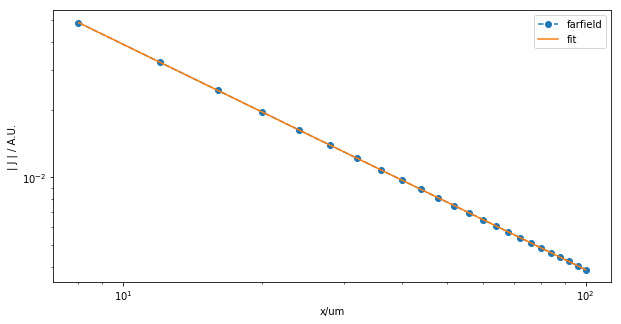

In [48]:
plt.figure(figsize=(10,5))
plt.loglog(axis_slice,
         radial_poynting_slice,'o--',label='farfield')
plt.plot(fit[0],fit[1],label='fit')
plt.xlabel('x/um')
plt.ylabel('| J | / A.U.')
plt.legend()
plt.show()

In [4]:
h = 100 # width of farfield region

sim.output_farfields(nearfield, 
                     "far_dipole", 
                     resolution=2,
                     center = mp.Vector3(0, 0),
                     size=mp.Vector3(h,h))

In [ ]:
# (h, resolution, time in seconds)
(100,1,78)
(100,2,313)

In [5]:
!ls -lh | grep far_dipole

-rw-r--r--     1 juan  staff   1.8M Nov  1 13:36 far_dipole.h5


In [8]:
far_dip = h5py.File('far_dipole.h5','r')

In [9]:
list(far_dip.keys())

['ex.i',
 'ex.r',
 'ey.i',
 'ey.r',
 'ez.i',
 'ez.r',
 'hx.i',
 'hx.r',
 'hy.i',
 'hy.r',
 'hz.i',
 'hz.r']

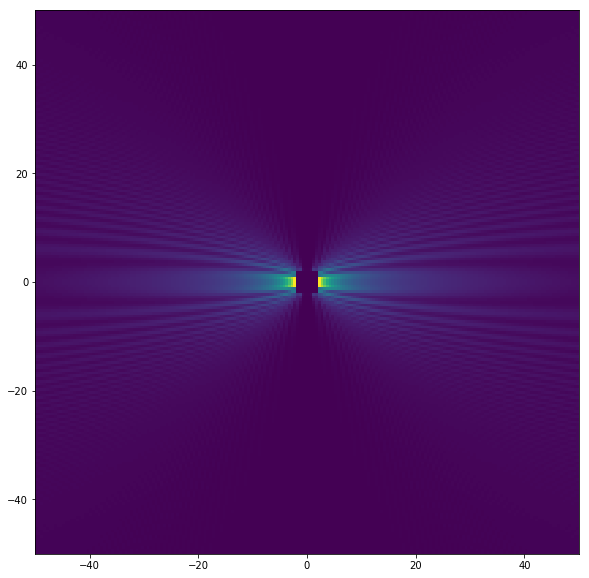

In [10]:
plt.figure(figsize=(10,10))
plt.imshow((far_dip['ex.r'][:]**2+
          far_dip['ex.i'][:]**2+
           far_dip['ey.r'][:]**2+
           far_dip['ex.i'][:]**2+
           far_dip['ey.r'][:]**2+
           far_dip['ex.i'][:]**2),extent=[-h/2,h/2,-h/2,h/2])
plt.show()

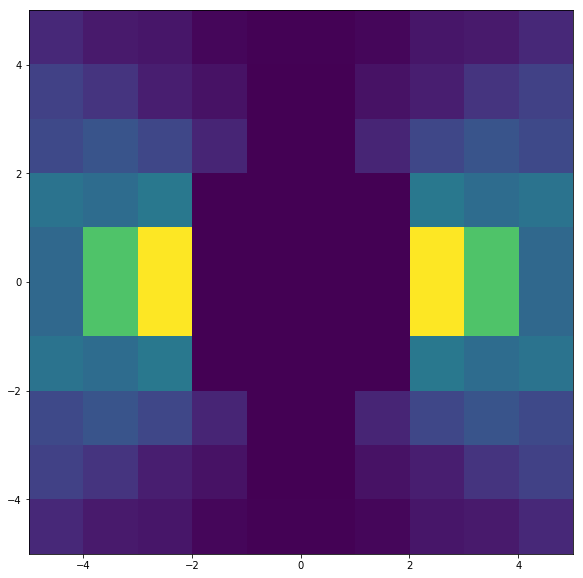

In [39]:
plt.figure(figsize=(10,10))
plt.imshow((far_dip['ex.r'][:]**2+
          far_dip['ex.i'][:]**2+
           far_dip['ey.r'][:]**2+
           far_dip['ex.i'][:]**2+
           far_dip['ey.r'][:]**2+
           far_dip['ex.i'][:]**2),extent=[-h/2,h/2,-h/2,h/2])
plt.show()

In [35]:
far_dip.close()

In [19]:
farf = sim.get_farfield(nearfield, center = mp.Vector3(0, 0),
                     size=mp.Vector3(h,h))

TypeError: get_farfield() got an unexpected keyword argument 'center'

## Hope's attempt

In [377]:
#!/usr/bin/env python

# run this script from terminal:
# source activate pmp
# mpirun -np 2 python dielectric-sim.py

import meep as mp
import h5py
import pickle

duty = pickle.load(open("/Users/juan/Google Drive/Zia Lab/CEM/MEEP/metalensduty.pkl", "rb"))

# simulation run number
i = 3

####################### Helper Functions #####################################
def build_structure(pickle, lens_width, post_height, substrate_thickness, eps_sub, eps_post):
   geometry = []
   
   # add substrate
   geometry.append(mp.Block(size=mp.Vector3(lens_width, substrate_thickness),
                    center=mp.Vector3(0,substrate_thickness/2),
                        material=mp.Medium(epsilon=eps_sub)))
   # add nanofins
   for i in range(len(duty["x_array"])):
       geometry.append(mp.Block(size=mp.Vector3(duty["mask"][i], post_height),
                           center=mp.Vector3(duty["x_array"][i],-post_height/2),
                           material=mp.Medium(epsilon=eps_post)))
   
   return geometry

##############################################################################


# See lab notebook NVs, metalenses, and the like page 18 for the definition of all parameters.

W = 410. # simulation area width
H = 20. # simulation area height
p = 1.0 # PML border width
ww = 400. # horizontal span of substrate
wl = 1.5 # vertical span of posts
b = H/2 # thickness of substrate
e_sub = 1.46**2 # epsilon of substrate
e_post = 1.52**2 # epsilon of nanoposts
resolution = 40 # inverse to feature size ---> 25 nm ~ res = 40
source_wavelength = 0.532 #um
fcen = 1 / source_wavelength
source_width = 2 # determines how quick the source ramps up
output_dt = 0.6 # in Meep units
time_unit_in_fs = 10./3
simulation_time = 30 # in MEEP units
d1 = 1 # height of near field region

In [378]:
cell = mp.Vector3(W, H, 0)
geometry = build_structure(duty, ww, wl, b, e_sub, e_post)

In [379]:
#eventually, add symmetries to this, bc only need to compute one half of cell

pml_layers = [mp.PML(1)]

sources = [mp.Source(src=mp.ContinuousSource(wavelength=source_wavelength,width = source_width),
                    component=mp.Ez,
                    center=mp.Vector3(0,5.0),
                    size=mp.Vector3(ww,0))]
sim = mp.Simulation(cell_size=cell,
                   boundary_layers=pml_layers,
                   geometry=geometry,
                   sources=sources,
                   resolution=resolution)
                   #force_complex_fields=True)

In [381]:
nearfield = sim.add_near2far(
   fcen, 0, 1,
   mp.Near2FarRegion(center=mp.Vector3(0, -2.5), size=mp.Vector3(ww,0), weight=-1.0))
sim.run(until=simulation_time)

-----------
Initializing structure...
Meep progress: 0.1/30.0 = 0.3% done in 4.0s, 1206.6s to go
Meep progress: 0.3875/30.0 = 1.3% done in 8.1s, 617.7s to go
Meep progress: 0.675/30.0 = 2.3% done in 12.2s, 530.4s to go
Meep progress: 0.9625/30.0 = 3.2% done in 16.3s, 490.6s to go
Meep progress: 1.25/30.0 = 4.2% done in 20.4s, 468.1s to go
Meep progress: 1.5375/30.0 = 5.1% done in 24.4s, 452.6s to go
Meep progress: 1.8250000000000002/30.0 = 6.1% done in 28.5s, 439.8s to go
Meep progress: 2.1125000000000003/30.0 = 7.0% done in 32.5s, 429.3s to go
Meep progress: 2.4000000000000004/30.0 = 8.0% done in 36.6s, 421.2s to go
Meep progress: 2.6875/30.0 = 9.0% done in 40.7s, 413.4s to go
Meep progress: 2.975/30.0 = 9.9% done in 44.9s, 407.4s to go
Meep progress: 3.2625/30.0 = 10.9% done in 48.9s, 400.6s to go
Meep progress: 3.5500000000000003/30.0 = 11.8% done in 52.9s, 394.4s to go
Meep progress: 3.8375000000000004/30.0 = 12.8% done in 57.1s, 389.3s to go
Meep progress: 4.1125/30.0 = 13.7% done

In [382]:
!pushover.py "Look look"

In [383]:
eps_data = sim.get_array(center=mp.Vector3(0,0,0), size=cell, component=mp.Dielectric)

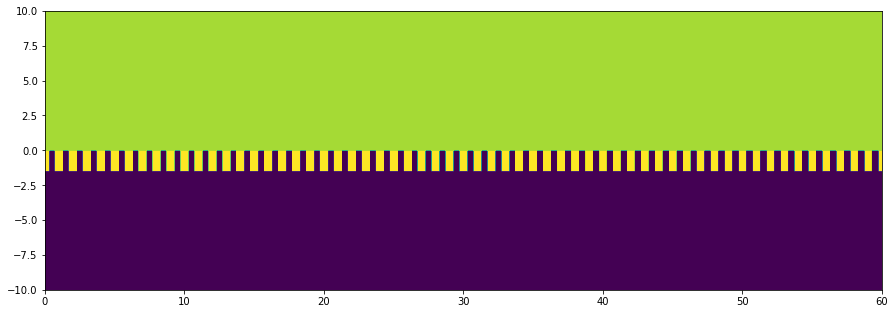

In [384]:
plt.figure(figsize=(15,7))
plt.imshow(np.transpose(eps_data),extent=[-W/2,W/2,-H/2,H/2],origin='lower')
plt.xlim(0,60)
#plt.colorbar()
plt.show()

In [385]:
ez_data = sim.get_array(center=mp.Vector3(0,0,0), size=cell, component=mp.Ez)

In [322]:
inverted_seismic = ListedColormap(sns.diverging_palette(255, 15, s=255/3, l=50,n=100, center="dark").as_hex())

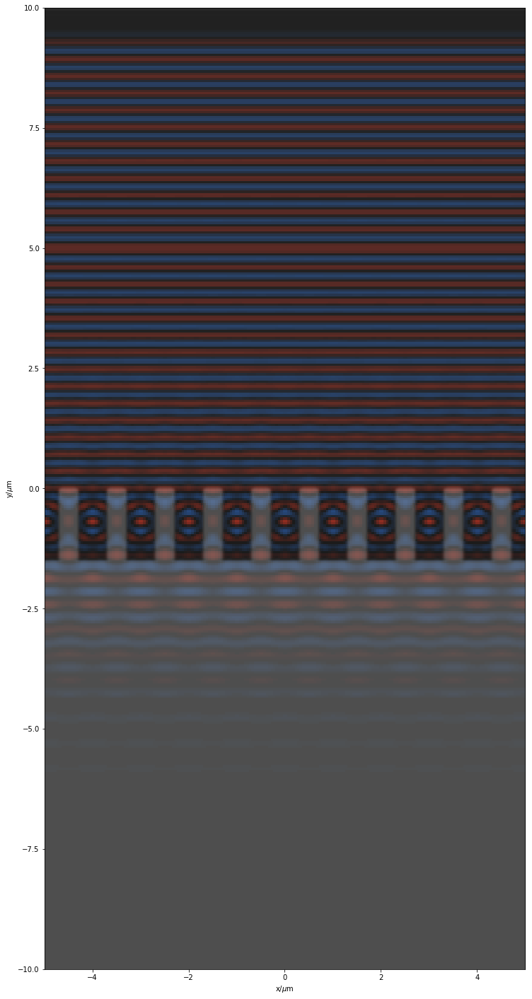

In [323]:
plt.figure(figsize=(12.5,25))
plt.imshow(np.real(np.transpose(ez_data)),extent=[-W/2,W/2,-H/2,H/2],origin='lower',cmap=inverted_seismic)
plt.imshow(np.transpose(eps_data),extent=[-W/2,W/2,-H/2,H/2],origin='lower',alpha=0.2,interpolation='spline36',cmap='binary')
plt.xlim(-5,5)
plt.xlabel('x/$\mu$m')
plt.ylabel('y/$\mu$m')
#plt.colorbar()
plt.show()

In [283]:
num_points = 100
normalizing_max = np.max(np.real(np.transpose(ez_data)))
normalizing_min = np.min(np.real(np.transpose(ez_data)))

for i in range(num_points):
    print(i,end=',')
    plt.figure(figsize=(12.5,25))
    plt.imshow(np.real(np.exp(-1j * 2*np.pi/(num_points+1)*i)*np.transpose(ez_data)),extent=[-W/2,W/2,-H/2,H/2],origin='lower',cmap=inverted_seismic,vmin=normalizing_min,vmax=normalizing_max)
    #plt.imshow(np.transpose(eps_data),extent=[-W/2,W/2,-H/2,H/2],origin='lower',alpha=0.2,interpolation='spline36',cmap='binary')
    plt.xlim(-5,5)
    plt.xlabel('x/$\mu$m')
    plt.ylabel('y/$\mu$m')
    #plt.colorbar()
    plt.tight_layout()
    plt.savefig('metalens-%d.png'%(i+1))
    plt.close()

0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,

In [284]:
for cycle in range(1,10):
    for k in range(1,101):
        os.system('cp metalens-%d.png metalens-%d.png' % (k,k+cycle*100))

In [285]:
! rm meep-metalens.mp4
! ffmpeg -framerate 50 -i metalens-%01d.png -c:v libx264 -profile:v high -vb 20M -pix_fmt yuv420p meep-metalens.mp4

ffmpeg version 4.0.2 Copyright (c) 2000-2018 the FFmpeg developers
  built with Apple LLVM version 9.1.0 (clang-902.0.39.2)
  configuration: --prefix=/usr/local/Cellar/ffmpeg/4.0.2 --enable-shared --enable-pthreads --enable-version3 --enable-hardcoded-tables --enable-avresample --cc=clang --host-cflags= --host-ldflags= --enable-gpl --enable-libmp3lame --enable-libx264 --enable-libxvid --enable-opencl --enable-videotoolbox --disable-lzma
  libavutil      56. 14.100 / 56. 14.100
  libavcodec     58. 18.100 / 58. 18.100
  libavformat    58. 12.100 / 58. 12.100
  libavdevice    58.  3.100 / 58.  3.100
  libavfilter     7. 16.100 /  7. 16.100
  libavresample   4.  0.  0 /  4.  0.  0
  libswscale      5.  1.100 /  5.  1.100
  libswresample   3.  1.100 /  3.  1.100
  libpostproc    55.  1.100 / 55.  1.100
Input #0, image2, from 'metalens-%01d.png':
  Duration: 00:00:20.00, start: 0.000000, bitrate: N/A
    Stream #0:0: Video: png, rgba(pc), 900x1800 [SAR 2834:2834 DAR 1:2], 50 fps, 50 tbr, 50

In [286]:
!open meep-metalens.mp4

In [287]:
!pushover.py "Look look"

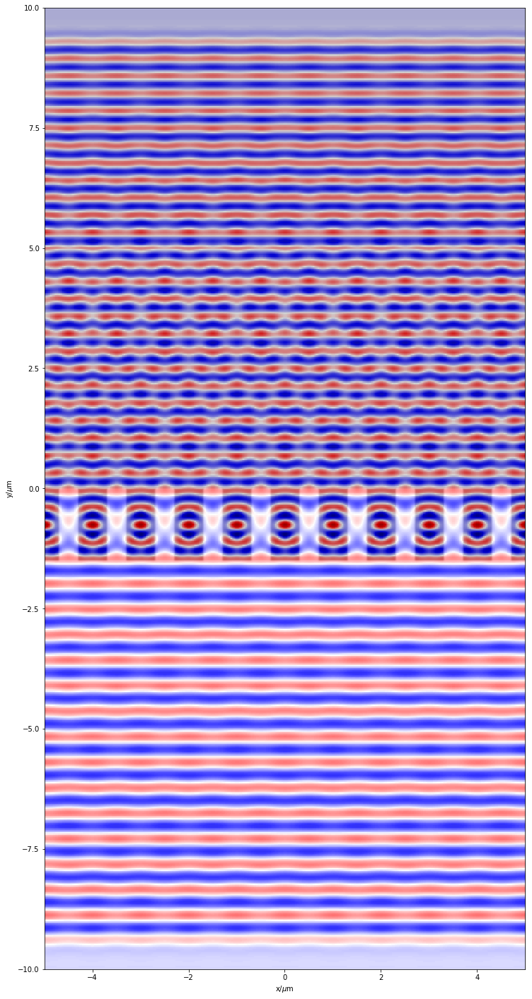

In [386]:
plt.figure(figsize=(25,25))
plt.imshow(np.transpose(ez_data),extent=[-W/2,W/2,-H/2,H/2],origin='lower',cmap='seismic')
plt.imshow(np.transpose(eps_data),extent=[-W/2,W/2,-H/2,H/2],origin='lower',alpha=0.2,interpolation='spline36',cmap='binary')
plt.xlim(-5,5)
plt.xlabel('x/$\mu$m')
plt.ylabel('y/$\mu$m')
#plt.colorbar()
plt.show()

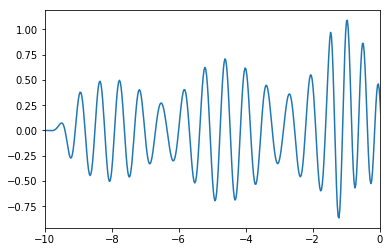

In [387]:
plt.figure()
plt.plot(np.linspace(-10,10,ez_data.shape[1]),ez_data[int(ez_data.shape[1]/2)])
plt.xlim(-10,0)
plt.show()

In [388]:
sim.get_farfield(nearfield, mp.Vector3(0,100))

[0j,
 0j,
 (-0.014845408674612865-0.02091388348176169j),
 (-0.016564722633508232-0.01862429165953805j),
 (-6.4566949876943e-16-3.8082601308553343e-17j),
 0j]

In [393]:
axial_extent_in_um = 100000 
num_farfield_points = 100
faraway = np.array([sum(np.abs(np.array(sim.get_farfield(nearfield, mp.Vector3(0,-y))))[:3]**2) for y in np.linspace(0,-axial_extent_in_um, num_farfield_points)])

In [394]:
def axial_ff(y):
    return sim.get_farfield(nearfield, mp.Vector3(0,-y))[0]
v_axial_ff = np.vectorize(axial_ff)

In [395]:
# plt.figure(figsize=(10,5))
# plt.plot(cylindrical_y*100,cylindrical_farfield_E2[:,100]/max(cylindrical_farfield_E2[:,100]),label='MEEP')
# plt.plot(np.linspace(0,10,farfaraway.shape[0]),farfaraway[:,100]/max(farfaraway[:,100]),label='Lumerical')
# plt.plot([3.7688],[1],'ro')
# plt.plot([2.80],[1],'bo')

# plt.text(2.80,1.02,'2.80',ha='center')
# plt.text(3.77,1.02,'3.77',ha='center')
# plt.xlim(0,10)
# plt.ylim(0,1.1)
# plt.xlabel('y/cm')
# plt.ylabel('$E^2 / AU$')
# plt.legend()
# plt.show()

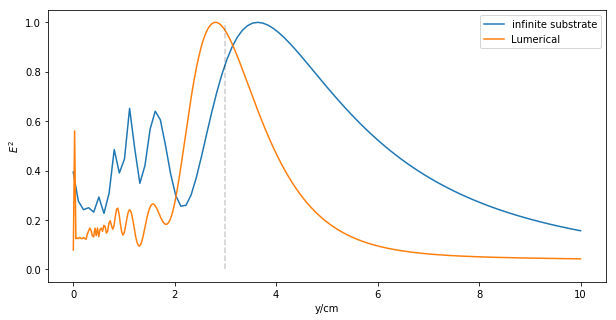

In [397]:
plt.figure(figsize=(10,5))
plt.plot(np.linspace(0,axial_extent_in_um/1e6*100,num_farfield_points),faraway/max(faraway),label='infinite substrate')
#plt.plot(np.linspace(0,10,farfaraway.shape[0]),farfaraway[:,100]/max(farfaraway[:,100]),label='finite substrate')
plt.plot(cylindrical_y*100,cylindrical_farfield_E2[:,100]/max(cylindrical_farfield_E2[:,100]),label='Lumerical')
plt.plot([3,3],[0,1],'k--',alpha=0.2)
plt.legend()
plt.xlabel('y/cm')
plt.ylabel('$E^2$')
plt.show()

0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,

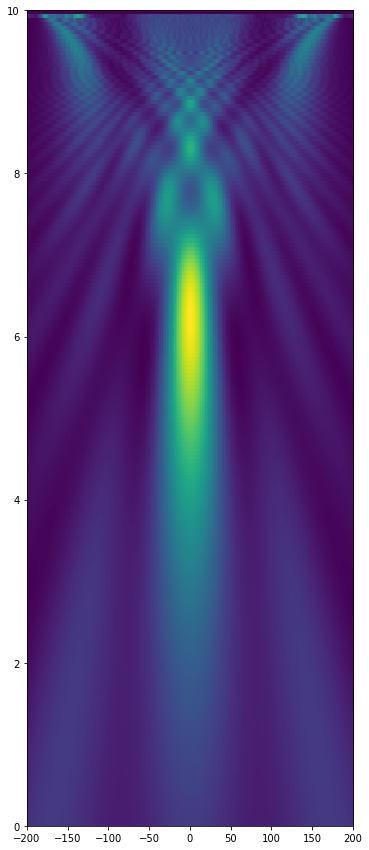

In [40]:
axial_extent_in_um = 100000 
num_farfield_points = 200
lateral_extent_in_um = 400
farfaraway = []
for index,y in enumerate(np.linspace(0,axial_extent_in_um,num_farfield_points)):
    print(index,end=',')
    faraway = np.array([sum(np.abs(np.array(sim.get_farfield(nearfield, mp.Vector3(x,-y))))[:3]**2) for x in np.linspace(-lateral_extent_in_um/2, lateral_extent_in_um/2, num_farfield_points)])
    farfaraway.append(faraway)
plt.figure(figsize=(8,15))
plt.imshow(np.array(farfaraway),extent=[-200,200,0,10],aspect=100)
plt.savefig('farfarfarfield.png',dpi=100)
plt.show()

In [64]:
farfaraway=np.array(farfaraway)

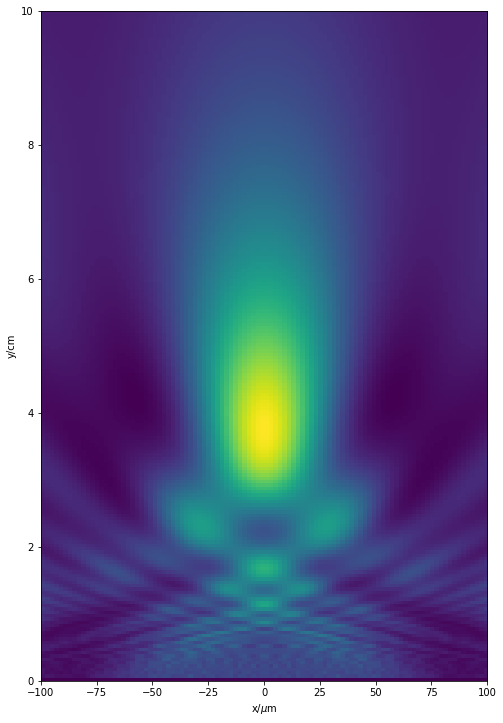

In [74]:
plt.figure(figsize=(8,15))
plt.imshow(np.array(farfaraway),extent=[-200,200,0,10],aspect=30,origin='lower')
plt.xlim(-100,100)
plt.xlabel('x/$\mu$m')
plt.ylabel('y/cm')
plt.show()

In [53]:
cylindrical_farfield = h5py.File('/Users/juan/Google Drive/Zia Lab/CEM/LumericalFDTD/Examples/MetalensDesign - Raw/cylindrical_metalens_farfield.mat','r')

In [54]:
cylindrical_farfield_E2=cylindrical_farfield['E2'][:]

In [57]:
cylindrical_x=cylindrical_farfield['x'][0];
cylindrical_y=cylindrical_farfield['y'][0];

In [58]:
cylindrical_farfield_E2.shape

(400, 200)

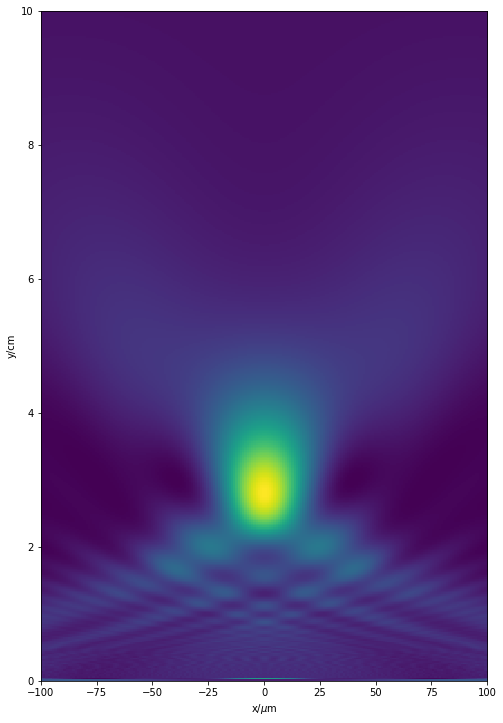

In [75]:
plt.figure(figsize=(8,15))
plt.imshow(cylindrical_farfield_E2,extent=[-100,100,0,10],aspect=30,origin='lower')
plt.xlim(-100,100)
plt.xlabel('x/$\mu$m')
plt.ylabel('y/cm')
plt.show()

In [76]:
np.linspace(0,10,farfaraway.shape[0])[np.argmax(farfaraway[:,100]/max(farfaraway[:,100]))]

3.7688442211055277

In [81]:
(cylindrical_y*100)[np.argmax(cylindrical_farfield_E2[:,100]/max(cylindrical_farfield_E2[:,100]))]

2.8084561403508768

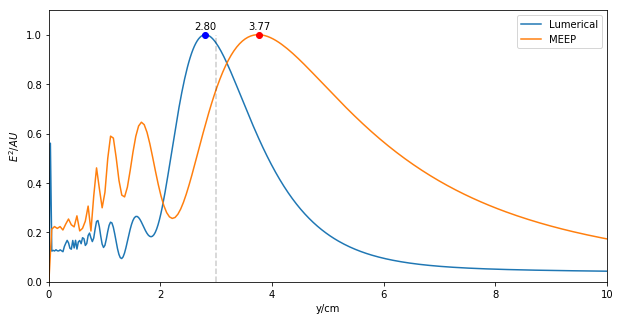

In [175]:
plt.figure(figsize=(10,5))
plt.plot(cylindrical_y*100,cylindrical_farfield_E2[:,100]/max(cylindrical_farfield_E2[:,100]),label='Lumerical')
plt.plot(np.linspace(0,10,farfaraway.shape[0]),farfaraway[:,100]/max(farfaraway[:,100]),label='MEEP')
plt.plot([3.7688],[1],'ro')
plt.plot([2.80],[1],'bo')
plt.plot([3,3],[0,1],'k--',alpha=0.2)
plt.text(2.80,1.02,'2.80',ha='center')
plt.text(3.77,1.02,'3.77',ha='center')
plt.xlim(0,10)
plt.ylim(0,1.1)
plt.xlabel('y/cm')
plt.ylabel('$E^2 / AU$')
plt.legend()
plt.show()

## Other stuff

In [52]:
duty = pickle.load(open("/Users/juan/Google Drive/Zia Lab/CEM/MEEP/metalensduty.pkl", "rb"))

In [53]:
def build_structure(pickle, lens_width, post_height, substrate_thickness, eps_sub, eps_post):
    geometry = []
    infinity = 1e20
    
    # add substrate
    geometry.append(mp.Block(mp.Vector3(lens_width, substrate_thickness, infinity),
                     center=mp.Vector3(0,substrate_thickness/2),
                         material=mp.Medium(epsilon=eps_sub)))
    # add nanofins
    for i in range(len(duty["x_array"])):
        geometry.append(mp.Block(mp.Vector3(duty["mask"][i], post_height, infinity),
                            center=mp.Vector3(duty["x_array"][i],-post_height/2),
                            material=mp.Medium(epsilon=eps_post)))
    
    return geometry

In [56]:
# See lab notebook NVs, metalenses, and the like page 18 for the definition of all parameters.

W = 410. # simulation area width
H = 20. # simulation area height
p = 1.0 # PML border width
ww = 400. # horizontal span of substrate
wl = 1.5 # vertical span of posts
b = 5. # thickness of substrate
e_sub = 1.46**2 # epsilon of substrate
e_post = 1.52**2 # epsilon of nanoposts
resolution = 10 # inverse to feature size ---> 25 nm ~ res = 40
source_wavelength = 0.532 #um
source_width = 4 # determines how quick the source ramps up
output_dt = 0.6 # in Meep units
time_unit_in_fs = 10./3
simulation_time = 20 # in MEEP units


cell = mp.Vector3(W, H, 0)

geometry = build_structure(duty, ww, wl, b, e_sub, e_post)

#eventually, add symmetries to this, bc only need to compute one half of cell

pml_layers = [mp.PML(1)]

sources = [mp.Source(src=mp.GaussianSource(wavelength=source_wavelength, width=source_width),
                     component=mp.Ez,
                     center=mp.Vector3(0,2.5),
                     size=mp.Vector3(ww,0))]

sim = mp.Simulation(cell_size=cell,
                    boundary_layers=pml_layers,
                    geometry=geometry,
                    sources=sources,
                    resolution=resolution)

In [55]:
d1 = 1 # height of near field region
fcen = 1/source_wavelength

nearfield = sim.add_near2far(
    fcen, 0, 1,
    mp.Near2FarRegion(center=mp.Vector3(0, -wl - d1), size=mp.Vector3(ww,0,0), weight=-1.0),
    mp.Near2FarRegion(center=mp.Vector3(-200, -0.5*wl - d1), size=mp.Vector3(0, d1,0), weight=-1.0),
    mp.Near2FarRegion(center=mp.Vector3(200, -0.5*wl - d1), size=mp.Vector3(0, d1,0), weight=1.0))

In [705]:
sim.run(until=simulation_time)

-----------
Initializing structure...
run 0 finished at t = 1.0 (20 timesteps)


In [712]:
 -0.5*wl-d2-0.5*h

-3750.75

In [713]:
ww

400.0

In [714]:
h

4500

In [684]:
d2 = 1500 # distance to farfield region
h = 4500 # height of farfield region

#sim.use_output_directory('/Users/hopemcgovern/Google Drive (hope_mcgovern@brown.edu)/[CURRENT] Fall 2018/Zia Lab/MEEP scripts/')
sim.output_farfields(nearfield, "spectra-{}-{}-{}".format(d1, d2, h), resolution,
                     where=mp.Volume(center = mp.Vector3(0, -0.5*wl-d2-0.5*h)), size=mp.Vector3(ww,h))

In [717]:
sim.get_farfield(nearfield, mp.Vector3(0,-1))

[0j, 0j, 0j, 0j, 0j, 0j]

In [711]:
ff

[0j, 0j, 0j, 0j, 0j, 0j]

In [ ]:
    ff = sim.get_farfield(nearfield, mp.Vector3(r*math.cos(2*math.pi*n/npts),
                                                r*math.sin(2*math.pi*n/npts)))

In [699]:
len(ff)

60

In [700]:
ff

[0j,
 0j,
 0j,
 0j,
 0j,
 0j,
 0j,
 0j,
 0j,
 0j,
 0j,
 0j,
 0j,
 0j,
 0j,
 0j,
 0j,
 0j,
 0j,
 0j,
 0j,
 0j,
 0j,
 0j,
 0j,
 0j,
 0j,
 0j,
 0j,
 0j,
 0j,
 0j,
 0j,
 0j,
 0j,
 0j,
 0j,
 0j,
 0j,
 0j,
 0j,
 0j,
 0j,
 0j,
 0j,
 0j,
 0j,
 0j,
 0j,
 0j,
 0j,
 0j,
 0j,
 0j,
 0j,
 0j,
 0j,
 0j,
 0j,
 0j]

In [686]:
!ls -lh | grep spectra

-rwx------  1 juan  staff   6.9K Nov  1 09:33 spectra-1-1500-4500.h5


In [ ]:
sim.get_farfield(nearfield, resolution,
                     where=mp.Volume(center = mp.Vector3(0, -0.5*wl-d2-0.5*h)), size=mp.Vector3(ww,h))

### Simple dipole

In [845]:
W = 4
pml_width = 1

sim_width = W - 2*pml_width

cell_size = mp.Vector3(W,W)

# A hexagon is defined as a prism with six vertices centered on the origin

geometry = []

pml_layers = [mp.PML(pml_width)]

wavelength = 0.5

src_cmpt = mp.Ex

if src_cmpt == mp.Ex:
    symmetries = [mp.Mirror(mp.Y)]
elif src_cmpt == mp.Ey:
    symmetries = [mp.Mirror(mp.X)]
elif src_cmpt == mp.Ez:
    symmetries = [mp.Mirror(mp.X), mp.Mirror(mp.Y)]

fcen = 1/wavelength

df = 0.4

num_freq = 1

sources = [mp.Source(mp.GaussianSource(fcen, fwidth=df),
                     component=src_cmpt,
                     center=mp.Vector3(0,0),
                     size=mp.Vector3(0,0))]

sim = mp.Simulation(resolution=10,
                    cell_size=cell_size,
                    geometry=geometry,
                    symmetries = symmetries,
                    sources=sources,
                    boundary_layers = pml_layers)

near_field_box_width = 4*wavelength

nearfield = sim.add_near2far(fcen, 0, num_freq,
                             mp.Near2FarRegion(mp.Vector3(0,near_field_box_width/2), size=mp.Vector3(near_field_box_width)),
                            mp.Near2FarRegion(mp.Vector3(near_field_box_width/2,0), size=mp.Vector3(near_field_box_width)),
                            mp.Near2FarRegion(mp.Vector3(0,-near_field_box_width/2), size=mp.Vector3(near_field_box_width),weight=-1),
                            mp.Near2FarRegion(mp.Vector3(-near_field_box_width/2,0), size=mp.Vector3(near_field_box_width),weight=-1))
sim.init_sim()

#eps_data = sim.get_array(center=mp.Vector3(), size=cell_size, component=mp.Dielectric)

sim.run(until_after_sources=mp.stop_when_fields_decayed(10, src_cmpt, mp.Vector3(), 1e-3))


-----------
Initializing structure...
field decay(t = 10.05): 1.2688238034524977 / 1.2688238034524977 = 1.0
field decay(t = 20.1): 3.1366716999554227 / 3.1366716999554227 = 1.0
field decay(t = 30.150000000000002): 0.00016390337605144917 / 3.1366716999554227 = 5.2253914891309314e-05
run 0 finished at t = 30.150000000000002 (603 timesteps)


In [846]:
np.max(np.abs(sim.get_efield()[:,:,-1]))

0.0

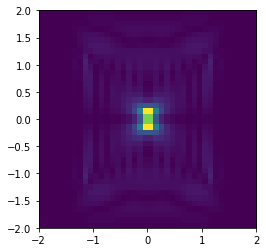

In [847]:
plt.figure()
plt.imshow(np.abs(sim.get_efield()[:,:,1]),extent=[-W/2,W/2,-W/2,W/2])
plt.show()

In [848]:
faraway = np.array([np.array([sum(np.abs(np.array(sim.get_farfield(nearfield, mp.Vector3(x,y))))[:]**2) for x in np.linspace(-100,100,50)]) for y in np.linspace(-100,100,50)]) 

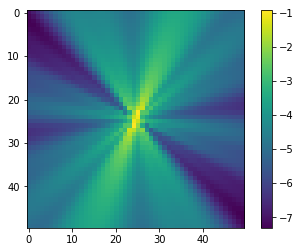

In [849]:
plt.figure()
plt.imshow(np.log(faraway))
plt.colorbar()
plt.show()

### 2D Example from the docs

In [667]:
import meep as mp
import math

resolution = 50

sxy = 4
dpml = 1
cell = mp.Vector3(sxy+2*dpml,sxy+2*dpml,0)
pml_layers = [mp.PML(dpml)]

fcen = 1.0
df = 0.4
src_cmpt = mp.Ex

sources = [mp.Source(src=mp.GaussianSource(fcen,fwidth=df),
                     center=mp.Vector3(),
                     component=src_cmpt)]

if src_cmpt == mp.Ex:
    symmetries = [mp.Mirror(mp.Y)]
elif src_cmpt == mp.Ey:
    symmetries = [mp.Mirror(mp.X)]
elif src_cmpt == mp.Ez:
    symmetries = [mp.Mirror(mp.X), mp.Mirror(mp.Y)]

sim = mp.Simulation(cell_size=cell,
                    resolution=resolution,
                    sources=sources,
                    symmetries=symmetries,
                    boundary_layers=pml_layers)

nearfield = sim.add_near2far(fcen, 0, 1,
                             mp.Near2FarRegion(mp.Vector3(0,0.5*sxy), size=mp.Vector3(sxy)),
                             mp.Near2FarRegion(mp.Vector3(0,-0.5*sxy), size=mp.Vector3(sxy), weight=-1),
                             mp.Near2FarRegion(mp.Vector3(0.5*sxy), size=mp.Vector3(0,sxy)),
                             mp.Near2FarRegion(mp.Vector3(-0.5*sxy), size=mp.Vector3(0,sxy), weight=-1))

sim.run(until_after_sources=mp.stop_when_fields_decayed(50, src_cmpt, mp.Vector3(), 1e-8))

r = 1000/fcen      # 1000 wavelengths out from the source
npts = 100         # number of points in [0,2*pi) range of angles

farfields = []

for n in range(npts):
    ff = sim.get_farfield(nearfield, mp.Vector3(r*math.cos(2*math.pi*n/npts),
                                                r*math.sin(2*math.pi*n/npts)))
    print("farfield:, {}, {}, ".format(n, 2*math.pi*n/npts), end='')
    print(", ".join([str(f).strip('()').replace('j','i') for f in ff]))
    farfields.append(ff)

-----------
Initializing structure...
field decay(t = 50.01): 4938.6532805652805 / 4938.6532805652805 = 1.0
field decay(t = 100.01): 7.375043752817715e-11 / 4938.6532805652805 = 1.493330941420849e-14
run 0 finished at t = 100.01 (10001 timesteps)
farfield:, 0, 0.0, -2.279088263162181e-06-2.1841940512796427e-06i, -5.827586677109586e-19-6.098637220230962e-20i, 0i, 0i, 0i, 5.149960319306146e-19+2.15485181781494e-18i
farfield:, 1, 0.06283185307179587, 5.18111090973438e-05-5.868638518875795e-05i, -0.000859849959915617+0.0008981237627299649i, 0i, 0i, 0i, -0.0008613348767972831+0.0009001050045602637i
farfield:, 2, 0.12566370614359174, 0.00021292242750252526-0.00022787489901289127i, -0.001703663119832468+0.001786629226053658i, 0i, 0i, 0i, -0.0017167721797755665+0.0018012380363978384i
farfield:, 3, 0.18849555921538758, 0.0004774949068795628-0.0005079116745549276i, -0.0025152050527828852+0.0026512799110916057i, 0i, 0i, 0i, -0.0025599126952778853+0.002699695353587596i
farfield:, 4, 0.251327412287

farfield:, 62, 3.895574890451343, 0.006366073855135381-0.006738498778899391i, -0.006781576048955063+0.007173567767419629i, 0i, 0i, 0i, 0.009300650468166766-0.009842865922075053i
farfield:, 63, 3.9584067435231396, 0.007198946845257013-0.007633267617554919i, -0.006762385020608525+0.007166174740192781i, 0i, 0i, 0i, 0.009876144313601155-0.01047078277209975i
farfield:, 64, 4.0212385965949355, 0.008031443631234876-0.008529444468642861i, -0.006646117202366429+0.007054397330020904i, 0i, 0i, 0i, 0.010423847345424458-0.01106952155503162i
farfield:, 65, 4.084070449666731, 0.00886401238686695-0.009418483119825311i, -0.0064418182992117+0.006841282667802027i, 0i, 0i, 0i, 0.0109566160492956-0.011641789965218538i
farfield:, 66, 4.1469023027385274, 0.009685376446321198-0.010275646915785022i, -0.006148021072939958+0.006519624909503057i, 0i, 0i, 0i, 0.011470939828445615-0.012170318374985145i
farfield:, 67, 4.209734155810323, 0.01047055514830436-0.0110683416779043i, -0.005757454295653461+0.006083569399786

In [668]:
%pylab inline

Populating the interactive namespace from numpy and matplotlib


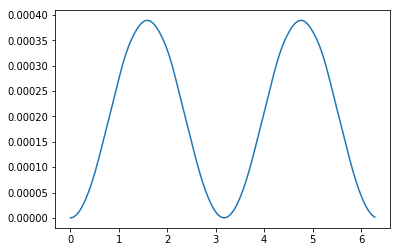

In [669]:
outputpower = [sum(np.abs(np.array(f[:3]))**2) for f in farfields]
angles = np.linspace(0,2*np.pi,len(outputpower))
plt.figure()
plt.plot(angles,outputpower)
plt.show()

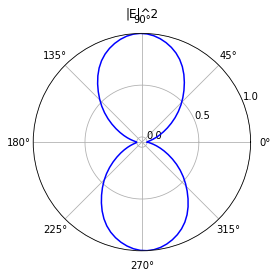

In [670]:
ax = plt.subplot(111, projection='polar')
ax.plot(angles,outputpower / max(outputpower),'b-')
ax.set_rmax(1)
ax.set_rticks([0,0.5,1])
ax.grid(True)
ax.set_rlabel_position(22)
ax.set_title('|E|^2')
plt.show()

## HDF5:

In [333]:
import h5py

In [401]:
threeDnut=h5py.File('/Users/juan/Google Drive/Zia Lab/CEM/MEEP/first3d/first3d-ez.h5')

In [402]:
threeDnut['ez']

<HDF5 dataset "ez": shape (200, 200, 200, 400), type "<f8">

In [403]:
inverted_seismic = ListedColormap(sns.diverging_palette(255, 15, s=255/3, l=50,n=100, center="dark").as_hex())

In [411]:
the_max = [np.max(threeDnut['ez'][106,:,:,i]) for i in range(400)];

In [412]:
the_abs_max = np.max(the_max)

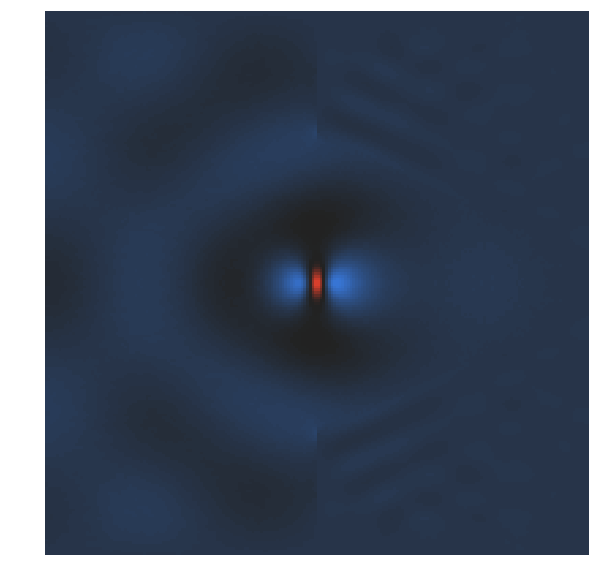

In [413]:
plt.figure(figsize=(10,10))
plt.imshow(threeDnut['ez'][106,:,:,250]/the_abs_max,extent=[-1,1,-1,1],cmap=inverted_seismic)
plt.axis('off')
plt.show()

In [399]:
threeDnut.close()

In [414]:
for i in range(400):
    plt.figure(figsize=(10,10))
    plt.imshow(threeDnut['ez'][106,:,:,i]/the_abs_max,extent=[-1,1,-1,1],cmap=inverted_seismic)
    plt.axis('off')
    plt.tight_layout()
    plt.savefig('/Users/juan/Google Drive/Zia Lab/CEM/MEEP/first3d/nut%d.png'%i)
    plt.close()

In [420]:
1

1

In [421]:
os.chdir('/Users/juan/Google Drive/Zia Lab/CEM/MEEP/first3d/')
!rm 3dnut-freespace.mp4
! ffmpeg -framerate 10 -i nut-%01d.jpg -c:v libx264 -profile:v high -vb 20M -pix_fmt yuv420p 3dnut-freespace.mp4

rm: 3dnut-freespace.mp4: No such file or directory
ffmpeg version 4.0.2 Copyright (c) 2000-2018 the FFmpeg developers
  built with Apple LLVM version 9.1.0 (clang-902.0.39.2)
  configuration: --prefix=/usr/local/Cellar/ffmpeg/4.0.2 --enable-shared --enable-pthreads --enable-version3 --enable-hardcoded-tables --enable-avresample --cc=clang --host-cflags= --host-ldflags= --enable-gpl --enable-libmp3lame --enable-libx264 --enable-libxvid --enable-opencl --enable-videotoolbox --disable-lzma
  libavutil      56. 14.100 / 56. 14.100
  libavcodec     58. 18.100 / 58. 18.100
  libavformat    58. 12.100 / 58. 12.100
  libavdevice    58.  3.100 / 58.  3.100
  libavfilter     7. 16.100 /  7. 16.100
  libavresample   4.  0.  0 /  4.  0.  0
  libswscale      5.  1.100 /  5.  1.100
  libswresample   3.  1.100 /  3.  1.100
  libpostproc    55.  1.100 / 55.  1.100
[mjpeg @ 0x7feb3c002400] EOI missing, emulating
Input #0, image2, from 'nut-%01d.jpg':
  Duration: 00:00:35.30, start: 0.000000, bitrate: N

In [422]:
!open 3dnut-freespace.mp4

In [417]:
!open .

## Visualizing 3d Structures

### Simple Dipole in vaccum

In [424]:
os.chdir('/Volumes/bilbo/simpledipole/')

In [479]:
ez = h5py.File('simple-ez.h5','r')
ey = h5py.File('simple-ey.h5','r')
ex = h5py.File('simple-ex.h5','r')

In [480]:
hz = h5py.File('simple-hz.h5','r')
hy = h5py.File('simple-hy.h5','r')
hx = h5py.File('simple-hx.h5','r')

In [481]:
max_e = max(max([np.max(ex['ex'][:,:,j]) for j in range(50)]),
           max([np.max(ey['ey'][:,:,j]) for j in range(50)]),
           max([np.max(ez['ez'][:,:,j]) for j in range(50)]))

In [ ]:
max_h = max(max([np.max(hx['hx'][:,:,j]) for j in range(50)]),
           max([np.max(hy['hy'][:,:,j]) for j in range(50)]),
           max([np.max(hz['hz'][:,:,j]) for j in range(50)]))

In [ ]:
min_e = min(min([np.max(ex['ex'][:,:,j]) for j in range(50)]),
           min([np.max(ey['ey'][:,:,j]) for j in range(50)]),
           min([np.max(ez['ez'][:,:,j]) for j in range(50)]))

In [482]:
min_h = min(min([np.max(hx['hx'][:,:,j]) for j in range(50)]),
           min([np.max(hy['hy'][:,:,j]) for j in range(50)]),
           min([np.max(hz['hz'][:,:,j]) for j in range(50)]))

In [492]:
ez['ez'].shape

(100, 100, 200)

In [ ]:
max_e

In [493]:
for index in range(0,ez['ez'].shape[-1]):
    print(index,end=', ')
    fig, ax = plt.subplots(ncols=3,nrows=2,figsize=(10,5))
#     ax[0][0].imshow(np.log(ex['ex'][:,:,index]),vmin=min_e,vmax=max_e)
#     ax[0][1].imshow(ey['ey'][:,:,index],vmin=min_e,vmax=max_e)
#     ax[0][2].imshow(ez['ez'][:,:,index],vmin=min_e,vmax=max_e)
#     ax[1][0].imshow(hx['hx'][:,:,index],vmin=min_h,vmax=max_h)
#     ax[1][1].imshow(hy['hy'][:,:,index],vmin=min_h,vmax=max_h)
#     ax[1][2].imshow(hz['hz'][:,:,index],vmin=min_h,vmax=max_h)
    ax[0][0].imshow(np.log(ex['ex'][:,:,index]**2))
    ax[0][1].imshow(np.log(ey['ey'][:,:,index]**2))
    ax[0][2].imshow(np.log(ez['ez'][:,:,index]**2))
    ax[1][0].imshow(np.log(hx['hx'][:,:,index]**2))
    ax[1][1].imshow(np.log(hy['hy'][:,:,index]**2))
    ax[1][2].imshow(np.log(hz['hz'][:,:,index]**2))
    for i in range(2):
        for j in range(3):
            ax[i][j].set_axis_off()
    plt.subplots_adjust(wspace=0.0, hspace=0.0, top=0.95, bottom=0.05, left=0.17, right=0.845)
    plt.savefig('fields-%d'%index)
    plt.close()

0, 1, 

/Users/juan/anaconda3/envs/meep/lib/python3.6/site-packages/ipykernel_launcher.py:10: RuntimeWarning: divide by zero encountered in log
  # Remove the CWD from sys.path while we load stuff.
/Users/juan/anaconda3/envs/meep/lib/python3.6/site-packages/ipykernel_launcher.py:11: RuntimeWarning: divide by zero encountered in log
  # This is added back by InteractiveShellApp.init_path()
/Users/juan/anaconda3/envs/meep/lib/python3.6/site-packages/ipykernel_launcher.py:12: RuntimeWarning: divide by zero encountered in log
  if sys.path[0] == '':
/Users/juan/anaconda3/envs/meep/lib/python3.6/site-packages/ipykernel_launcher.py:13: RuntimeWarning: divide by zero encountered in log
  del sys.path[0]
/Users/juan/anaconda3/envs/meep/lib/python3.6/site-packages/ipykernel_launcher.py:14: RuntimeWarning: divide by zero encountered in log
  
/Users/juan/anaconda3/envs/meep/lib/python3.6/site-packages/ipykernel_launcher.py:15: RuntimeWarning: divide by zero encountered in log
  from ipykernel import ker

2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 

In [496]:
ez.close()
ex.close()
ey.close()
hx.close()
hy.close()
hz.close()

In [499]:
ex={['xy','xz','yz'][i-1]: h5py.File('simple-ex-%d.h5' % i)['ex'][:,:,:] for i in range(1,4)}
ey={['xy','xz','yz'][i-1]: h5py.File('simple-ey-%d.h5' % i)['ey'][:,:,:] for i in range(1,4)}
ez={['xy','xz','yz'][i-1]: h5py.File('simple-ez-%d.h5' % i)['ez'][:,:,:] for i in range(1,4)}

In [502]:
hx={['xy','xz','yz'][i-1]: h5py.File('simple-hx-%d.h5' % i)['hx'][:,:,:] for i in range(1,4)}
hy={['xy','xz','yz'][i-1]: h5py.File('simple-hy-%d.h5' % i)['hy'][:,:,:] for i in range(1,4)}
hz={['xy','xz','yz'][i-1]: h5py.File('simple-hz-%d.h5' % i)['hz'][:,:,:] for i in range(1,4)}

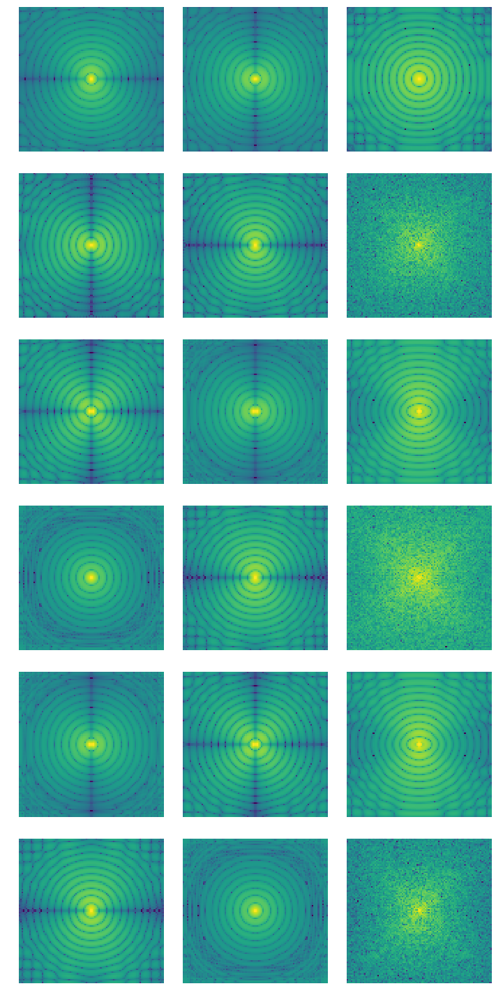

In [529]:
fig, ax = plt.subplots(ncols=3,nrows=6,figsize=(10,5*6-10))
ax[0][0].imshow(np.log(ex['xy'][:,:,100]**2))
ax[0][1].imshow(np.log(ey['xy'][:,:,100]**2))
ax[0][2].imshow(np.log(ez['xy'][:,:,100]**2))
ax[1][0].imshow(np.log(hx['xy'][:,:,100]**2))
ax[1][1].imshow(np.log(hy['xy'][:,:,100]**2))
ax[1][2].imshow(np.log(hz['xy'][:,:,100]**2))
ax[2][0].imshow(np.log(ex['xz'][:,:,100]**2))
ax[2][1].imshow(np.log(ey['xz'][:,:,100]**2))
ax[2][2].imshow(np.log(ez['xz'][:,:,100]**2))
ax[3][0].imshow(np.log(hx['xz'][:,:,100]**2))
ax[3][1].imshow(np.log(hy['xz'][:,:,100]**2))
ax[3][2].imshow(np.log(hz['xz'][:,:,100]**2))
ax[4][0].imshow(np.log(ex['yz'][:,:,100]**2))
ax[4][1].imshow(np.log(ey['yz'][:,:,100]**2))
ax[4][2].imshow(np.log(ez['yz'][:,:,100]**2))
ax[5][0].imshow(np.log(hx['yz'][:,:,100]**2))
ax[5][1].imshow(np.log(hy['yz'][:,:,100]**2))
ax[5][2].imshow(np.log(hz['yz'][:,:,100]**2))
for i in range(6):
    for j in range(3):
        ax[i][j].set_axis_off()
#plt.subplots_adjust(wspace=0.0, hspace=0.0, top=0.05001, bottom=0.05, left=0.01, right=0.12)
plt.tight_layout()
plt.show()

In [548]:
np.vstack([np.vstack([np.hstack([ex['xy'][:,:,1],ey['xy'][:,:,1],ez['xy'][:,:,1]]),
           np.hstack([hx['xy'][:,:,1],hy['xy'][:,:,1],hz['xy'][:,:,1]])]),
          np.vstack([np.hstack([ex['xz'][:,:,1],ey['xz'][:,:,1],ez['xz'][:,:,1]]),
           np.hstack([hx['xz'][:,:,1],hy['xz'][:,:,1],hz['xz'][:,:,1]])]),
          np.vstack([np.hstack([ex['yz'][:,:,1],ey['yz'][:,:,1],ez['yz'][:,:,1]]),
           np.hstack([hx['yz'][:,:,1],hy['yz'][:,:,1],hz['yz'][:,:,1]])])])

(600, 300)

In [530]:
max_e = 0
for index in range(ex['xy'].shape[-1]):
    print(index, end=', ')
    fig, ax = plt.subplots(ncols=3,nrows=6,figsize=(10,5*6-10))
    ax[0][0].imshow(np.log(ex['xy'][:,:,index]**2))
    ax[0][1].imshow(np.log(ey['xy'][:,:,index]**2))
    ax[0][2].imshow(np.log(ez['xy'][:,:,index]**2))
    ax[1][0].imshow(np.log(hx['xy'][:,:,index]**2))
    ax[1][1].imshow(np.log(hy['xy'][:,:,index]**2))
    ax[1][2].imshow(np.log(hz['xy'][:,:,index]**2))
    ax[2][0].imshow(np.log(ex['xz'][:,:,index]**2))
    ax[2][1].imshow(np.log(ey['xz'][:,:,index]**2))
    ax[2][2].imshow(np.log(ez['xz'][:,:,index]**2))
    ax[3][0].imshow(np.log(hx['xz'][:,:,index]**2))
    ax[3][1].imshow(np.log(hy['xz'][:,:,index]**2))
    ax[3][2].imshow(np.log(hz['xz'][:,:,index]**2))
    ax[4][0].imshow(np.log(ex['yz'][:,:,index]**2))
    ax[4][1].imshow(np.log(ey['yz'][:,:,index]**2))
    ax[4][2].imshow(np.log(ez['yz'][:,:,index]**2))
    ax[5][0].imshow(np.log(hx['yz'][:,:,index]**2))
    ax[5][1].imshow(np.log(hy['yz'][:,:,index]**2))
    ax[5][2].imshow(np.log(hz['yz'][:,:,index]**2))
    for i in range(6):
        for j in range(3):
            ax[i][j].set_axis_off()
    plt.savefig('field_slices-%d.png' % index)
    plt.close()

0, 

/Users/juan/anaconda3/envs/meep/lib/python3.6/site-packages/ipykernel_launcher.py:5: RuntimeWarning: divide by zero encountered in log
  """
/Users/juan/anaconda3/envs/meep/lib/python3.6/site-packages/ipykernel_launcher.py:6: RuntimeWarning: divide by zero encountered in log
  
/Users/juan/anaconda3/envs/meep/lib/python3.6/site-packages/ipykernel_launcher.py:7: RuntimeWarning: divide by zero encountered in log
  import sys
/Users/juan/anaconda3/envs/meep/lib/python3.6/site-packages/ipykernel_launcher.py:8: RuntimeWarning: divide by zero encountered in log
  
/Users/juan/anaconda3/envs/meep/lib/python3.6/site-packages/ipykernel_launcher.py:9: RuntimeWarning: divide by zero encountered in log
  if __name__ == '__main__':
/Users/juan/anaconda3/envs/meep/lib/python3.6/site-packages/ipykernel_launcher.py:10: RuntimeWarning: divide by zero encountered in log
  # Remove the CWD from sys.path while we load stuff.
/Users/juan/anaconda3/envs/meep/lib/python3.6/site-packages/ipykernel_launcher.py

1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 

In [557]:
min(np.inf,0)

0

In [560]:
from matplotlib.colors import LogNorm

In [575]:
st != np.nan

array([[ True,  True,  True, ...,  True,  True,  True],
       [ True,  True,  True, ...,  True,  True,  True],
       [ True,  True,  True, ...,  True,  True,  True],
       ...,
       [ True,  True,  True, ...,  True,  True,  True],
       [ True,  True,  True, ...,  True,  True,  True],
       [ True,  True,  True, ...,  True,  True,  True]])

In [578]:
max_e = max(max_e,np.max(st[st != np.nan]))
min_e = min(min_e,np.min(st[st != np.nan]))

In [579]:
max_e

0

In [583]:
np.max()

0.00044819760584237687

In [580]:
min_e

1000

In [622]:
np.vstack([np.vstack([np.hstack([ex['xy'][:,:,1],ey['xy'][:,:,1],ez['xy'][:,:,1]]),
           np.hstack([hx['xy'][:,:,1],hy['xy'][:,:,1],hz['xy'][:,:,1]])]),
          np.vstack([np.hstack([ex['xz'][:,:,1],ey['xz'][:,:,1],ez['xz'][:,:,1]]),
           np.hstack([hx['xz'][:,:,1],hy['xz'][:,:,1],hz['xz'][:,:,1]])]),
          np.vstack([np.hstack([ex['yz'][:,:,1],ey['yz'][:,:,1],ez['yz'][:,:,1]]),
           np.hstack([hx['yz'][:,:,1],hy['yz'][:,:,1],hz['yz'][:,:,1]])])])
max_e = 0.1
min_e = np.inf
for index in range(ex['xy'][:,:,:].shape[-1]):
    print(index, end=', ')
    plt.figure(figsize=(6,12))
    st = (np.vstack([np.vstack([np.hstack([ex['xy'][:,:,index],ey['xy'][:,:,index],ez['xy'][:,:,index]]),
               np.hstack([hx['xy'][:,:,index],hy['xy'][:,:,index],hz['xy'][:,:,index]])]),
              np.vstack([np.hstack([ex['xz'][:,:,index],ey['xz'][:,:,index],ez['xz'][:,:,index]]),
               np.hstack([hx['xz'][:,:,index],hy['xz'][:,:,index],hz['xz'][:,:,index]])]),
              np.vstack([np.hstack([ex['yz'][:,:,index],ey['yz'][:,:,index],ez['yz'][:,:,index]]),
               np.hstack([hx['yz'][:,:,index],hy['yz'][:,:,index],hz['yz'][:,:,index]])])]))**2
    
    
    st[st == 0] = np.nan
    max_e = max(max_e,np.max(st[~np.isnan(st)]))
    min_e = min(min_e,np.min(st[~np.isnan(st)]))
    st = 0.01 + st
    #print(max_e,min_e)
    #print(sum(st==0))
    plt.imshow(st,norm=LogNorm(vmin=0.01, vmax=max_e))
    plt.axis('off')
    plt.tight_layout()
    plt.savefig('field_slices-%d.png' % index)
    plt.close()

0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 

In [623]:
! rm freeslices.mp4
! ffmpeg -framerate 20 -i field_slices-%01d.png -c:v libx264 -profile:v high -vb 20M -pix_fmt yuv420p freeslices.mp4


ffmpeg version 4.0.2 Copyright (c) 2000-2018 the FFmpeg developers
  built with Apple LLVM version 9.1.0 (clang-902.0.39.2)
  configuration: --prefix=/usr/local/Cellar/ffmpeg/4.0.2 --enable-shared --enable-pthreads --enable-version3 --enable-hardcoded-tables --enable-avresample --cc=clang --host-cflags= --host-ldflags= --enable-gpl --enable-libmp3lame --enable-libx264 --enable-libxvid --enable-opencl --enable-videotoolbox --disable-lzma
  libavutil      56. 14.100 / 56. 14.100
  libavcodec     58. 18.100 / 58. 18.100
  libavformat    58. 12.100 / 58. 12.100
  libavdevice    58.  3.100 / 58.  3.100
  libavfilter     7. 16.100 /  7. 16.100
  libavresample   4.  0.  0 /  4.  0.  0
  libswscale      5.  1.100 /  5.  1.100
  libswresample   3.  1.100 /  3.  1.100
  libpostproc    55.  1.100 / 55.  1.100
Input #0, image2, from 'field_slices-%01d.png':
  Duration: 00:00:10.00, start: 0.000000, bitrate: N/A
    Stream #0:0: Video: png, rgba(pc), 432x864 [SAR 2834:2834 DAR 1:2], 20 fps, 20 tbr,

In [625]:
!open freeslices.mp4

In [628]:
poynting = {}
poynting['xy'] = []
for index in range(ex['xy'][:,:,:].shape[-1]):
    jx = ey['xy'][:,:,index] * hz['xy'][:,:,index] - ez['xy'][:,:,index] * hy['xy'][:,:,index]
    jy = -ex['xy'][:,:,index] * hz['xy'][:,:,index] + ez['xy'][:,:,index] * hx['xy'][:,:,index]
    jz = ex['xy'][:,:,index] * hy['xy'][:,:,index] - ey['xy'][:,:,index] * hx['xy'][:,:,index]
    poynting['xy'].append([jx,jy,jz])
poynting['xz'] = []
for index in range(ex['xz'][:,:,:].shape[-1]):
    jx = ey['xz'][:,:,index] * hz['xz'][:,:,index] - ez['xz'][:,:,index] * hy['xz'][:,:,index]
    jy = -ex['xz'][:,:,index] * hz['xz'][:,:,index] + ez['xz'][:,:,index] * hx['xz'][:,:,index]
    jz = ex['xz'][:,:,index] * hy['xz'][:,:,index] - ey['xz'][:,:,index] * hx['xz'][:,:,index]
    poynting['xz'].append([jx,jy,jz])
poynting['yz'] = []
for index in range(ex['yz'][:,:,:].shape[-1]):
    jx = ey['yz'][:,:,index] * hz['yz'][:,:,index] - ez['yz'][:,:,index] * hy['yz'][:,:,index]
    jy = -ex['yz'][:,:,index] * hz['yz'][:,:,index] + ez['yz'][:,:,index] * hx['yz'][:,:,index]
    jz = ex['yz'][:,:,index] * hy['yz'][:,:,index] - ey['yz'][:,:,index] * hx['yz'][:,:,index]
    poynting['yz'].append([jx,jy,jz])

In [631]:
!pwd

/Volumes/bilbo/simpledipole


In [635]:
max_p = 0
min_p = np.inf
for index in range(ex['xy'][:,:,:].shape[-1]):
    print(index, end=', ')
    plt.figure(figsize=(6,6))
    st = np.abs((np.vstack([np.hstack(poynting['xy'][index]),
                    np.hstack(poynting['xz'][index]),
                    np.hstack(poynting['yz'][index])])))
    
    
    st[st == 0] = np.nan
    max_p = max(max_p,np.max(st[~np.isnan(st)]))
    min_p = min(min_p,np.min(st[~np.isnan(st)]))
    st = 0.01 + st
    #print(max_e,min_e)
    #print(sum(st==0))
    plt.imshow(st,norm=LogNorm(vmin=0.001, vmax=max_e))
    plt.axis('off')
    plt.tight_layout()
    plt.savefig('poynting_slices-%d.png' % index)
    plt.close()

0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 

In [636]:
! rm poynting.mp4
! ffmpeg -framerate 20 -i poynting_slices-%01d.png -c:v libx264 -profile:v high -vb 20M -pix_fmt yuv420p poynting.mp4


rm: poynting.mp4: No such file or directory
ffmpeg version 4.0.2 Copyright (c) 2000-2018 the FFmpeg developers
  built with Apple LLVM version 9.1.0 (clang-902.0.39.2)
  configuration: --prefix=/usr/local/Cellar/ffmpeg/4.0.2 --enable-shared --enable-pthreads --enable-version3 --enable-hardcoded-tables --enable-avresample --cc=clang --host-cflags= --host-ldflags= --enable-gpl --enable-libmp3lame --enable-libx264 --enable-libxvid --enable-opencl --enable-videotoolbox --disable-lzma
  libavutil      56. 14.100 / 56. 14.100
  libavcodec     58. 18.100 / 58. 18.100
  libavformat    58. 12.100 / 58. 12.100
  libavdevice    58.  3.100 / 58.  3.100
  libavfilter     7. 16.100 /  7. 16.100
  libavresample   4.  0.  0 /  4.  0.  0
  libswscale      5.  1.100 /  5.  1.100
  libswresample   3.  1.100 /  3.  1.100
  libpostproc    55.  1.100 / 55.  1.100
Input #0, image2, from 'poynting_slices-%01d.png':
  Duration: 00:00:10.00, start: 0.000000, bitrate: N/A
    Stream #0:0: Video: png, rgba(pc), 4

In [637]:
!open poynting.mp4

### Hexagonal Nut

In [331]:
import meep as mp
import numpy as np
import math
import h5py

cell_size = mp.Vector3(2,2,2)

# A hexagon is defined as a prism with six vertices centered on the origin
vertices = [mp.Vector3(-1,0),
            mp.Vector3(-0.5,math.sqrt(3)/2),
            mp.Vector3(0.5,math.sqrt(3)/2),
            mp.Vector3(1,0),
            mp.Vector3(0.5,-math.sqrt(3)/2),
            mp.Vector3(-0.5,-math.sqrt(3)/2)]

geometry = [mp.Prism(vertices, height=1.0, material=mp.Medium(index=3.5)),
            mp.Cone(radius=1.0, radius2=0.1, height=2.0, material=mp.air)]
sources = [mp.Source(mp.ContinuousSource(wavelength=0.532, width=5),
                     component=mp.Ez,
                     center=mp.Vector3(0,0,0),
                     size=mp.Vector3(0,0,0))]

sim = mp.Simulation(resolution=50,
                    cell_size=cell_size,
                    geometry=geometry,
                   sources=sources)

sim.init_sim()

eps_data = sim.get_array(center=mp.Vector3(), size=cell_size, component=mp.Dielectric)

sim.run(mp.to_appended("ez", mp.at_every(0.6, mp.output_efield_z)),
        until=20)

# field = sim.get_array(component=mp.Ez)

# with h5py.File("ez_example.hdf5",'w') as f:
#     dset = f.create_dataset("ez", data=field)

-----------
Initializing structure...


Meep progress: 0.68/20.0 = 3.4% done in 4.0s, 114.3s to go
Meep progress: 1.45/20.0 = 7.2% done in 8.0s, 102.7s to go
Meep progress: 2.22/20.0 = 11.1% done in 12.0s, 96.5s to go
Meep progress: 2.97/20.0 = 14.8% done in 16.1s, 92.3s to go
Meep progress: 3.73/20.0 = 18.6% done in 20.1s, 87.8s to go
Meep progress: 4.5/20.0 = 22.5% done in 24.2s, 83.3s to go
Meep progress: 5.26/20.0 = 26.3% done in 28.2s, 79.0s to go
Meep progress: 6.01/20.0 = 30.0% done in 32.2s, 75.0s to go
Meep progress: 6.7700000000000005/20.0 = 33.9% done in 36.2s, 70.8s to go
Meep progress: 7.53/20.0 = 37.6% done in 40.2s, 66.6s to go


KeyboardInterrupt: 

In [329]:
field = sim.get_array(component=mp.Ez)

In [330]:
with h5py.File("ez_example.hdf5",'w') as f:
    dset = f.create_dataset("ez", data=field)

In [320]:
with h5py.File("test_meep_volume.hdf5",'w') as f:
    dset = f.create_dataset("vol", data=eps_data)

## Modes of a Ring Resonator

In [66]:
n = 3.4                 # index of waveguide
w = 1                   # width of waveguide
r = 1                   # inner radius of ring
pad = 4                 # padding between waveguide and edge of PML
dpml = 2                # thickness of PML
sxy = 2*(r+w+pad+dpml)  # cell size

In [67]:
c1 = mp.Cylinder(radius=r+w, material=mp.Medium(index=n))
c2 = mp.Cylinder(radius=r)

**IMPORTANT**: later object in the geometry take precedence over or rather lie "on top of" earlier objects

In [162]:
fcen = 0.2            # pulse center frequency
df = 0.2               # pulse frequency width
src = mp.Source(mp.GaussianSource(fcen, fwidth=df), mp.Ez, mp.Vector3(r+0.1))
outputdir = 'ring-out'

In [175]:
sim = mp.Simulation(cell_size=mp.Vector3(sxy, sxy),
                    geometry=[c1, c2],
                    sources=[src],
                    resolution=10,                    
                    boundary_layers=[mp.PML(dpml)])
!rm ./ring-out/*.h5
!rm ./ring-out/*.png
sim.use_output_directory(outputdir)
sim.run(mp.at_beginning(mp.output_epsilon),
        mp.after_sources(mp.Harminv(mp.Ez, mp.Vector3(r+0.1), fcen, df)),
        until_after_sources=300)

rm: ./ring-out/*.png: No such file or directory
-----------
Initializing structure...
Meep: using output directory 'ring-out'
Meep progress: 330.3/350.0 = 94.4% done in 4.0s, 0.2s to go
harminv0:, frequency, imag. freq., Q, |amp|, amplitude, error
harminv0:, 0.11786093831441019, -0.0006578342930774846, 89.58254347233282, 0.0003639023491257374, -0.00036362889634280164+1.4104802151965701e-05i, 0.00013185999515353297+0.0i
harminv0:, 0.14714493215320093, -0.00023813144395168747, 308.95737604281686, 0.0028629075736371886, 0.0010052773037705724-0.0026806076396430983i, 1.5052029476244456e-05+0.0i
harminv0:, 0.17525167939725297, -6.373066705942251e-05, 1374.9399424444139, 0.007167832815975161, 0.005440469578171011+0.004666810264706093i, 2.1175832451085493e-06+0.0i
harminv0:, 0.2026690938496322, -1.0585277435847712e-05, 9573.159280798842, 0.007468344855968156, -0.006766380032203462+0.0031610561759425103i, 1.3627027873491183e-06+0.0i
harminv0:, 0.22946486947367634, 8.570998450714257e-06, -13386.

In [192]:
resonant_freqs = [float(x.split(',')[1]) for x in '''Meep: using output directory 'ring-out'
Meep progress: 330.3/350.0 = 94.4% done in 4.0s, 0.2s to go
harminv0:, frequency, imag. freq., Q, |amp|, amplitude, error
harminv0:, 0.11786093831441019, -0.0006578342930774846, 89.58254347233282, 0.0003639023491257374, -0.00036362889634280164+1.4104802151965701e-05i, 0.00013185999515353297+0.0i
harminv0:, 0.14714493215320093, -0.00023813144395168747, 308.95737604281686, 0.0028629075736371886, 0.0010052773037705724-0.0026806076396430983i, 1.5052029476244456e-05+0.0i
harminv0:, 0.17525167939725297, -6.373066705942251e-05, 1374.9399424444139, 0.007167832815975161, 0.005440469578171011+0.004666810264706093i, 2.1175832451085493e-06+0.0i
harminv0:, 0.2026690938496322, -1.0585277435847712e-05, 9573.159280798842, 0.007468344855968156, -0.006766380032203462+0.0031610561759425103i, 1.3627027873491183e-06+0.0i
harminv0:, 0.22946486947367634, 8.570998450714257e-06, -13386.122444961711, 0.0035638114127258423, 0.00023478726775934524-0.0035560689988206173i, 9.561190275819298e-07+0.0i
harminv0:, 0.23557839298058922, -0.0023180955352873505, 50.81291719743272, 0.04293642972264996, -0.03349981309430858-0.026857019938452784i, 1.6286761157154966e-06+0.0i
harminv0:, 0.25590627867820587, -0.00010588502336055754, 1208.4158389746913, 0.0008801426358790263, 0.0007175927163250831+0.0005096192235083652i, 1.3714076447547758e-05+0.0i
harminv0:, 0.26205554350792787, -0.0009426051029454227, 139.0060072288305, 0.01455789622894345, 0.013689119683558655-0.004953821242424166i, 3.832844304090816e-06+0.0i
harminv0:, 0.28127175672786814, 0.0019133066619312438, -73.50409694490884, 1.548185538517332e-05, -9.201306007386426e-06+1.2450855951534197e-05i, 0.0002401172715909698+0.0i
harminv0:, 0.28885391929081605, -0.00034394431252279556, 419.91378949124464, 0.002012195946889243, -8.523254446902333e-05+0.002010389997498205i, 5.303575898933588e-06+0.0i
run 0 finished at t = 350.0 (7000 timesteps)'''.split('\n') if ('harminv0' in x and 'frequency' not in x)]

In [152]:
!rm ./ring-out/*.h5
!rm ./ring-out/*.png

In [296]:
resonant_freqs

[0.11786093831441019,
 0.14714493215320093,
 0.17525167939725297,
 0.2026690938496322,
 0.22946486947367634,
 0.23557839298058922,
 0.25590627867820587,
 0.26205554350792787,
 0.28127175672786814,
 0.28885391929081605]

In [295]:
for index, f in enumerate(resonant_freqs):
    print(index,fcen)
    fcen = f
    df=0.01
    src = mp.Source(mp.GaussianSource(fcen, fwidth=df), mp.Ez, mp.Vector3(r+0.1))
    sim = mp.Simulation(cell_size=mp.Vector3(sxy, sxy),
                        geometry=[c1, c2],
                        sources=[src],
                        resolution=5,                    
                        boundary_layers=[mp.PML(dpml)])
    sim.use_output_directory(outputdir)
    sim.run(mp.at_beginning(mp.output_epsilon),
            mp.after_sources(mp.Harminv(mp.Ez, mp.Vector3(r+0.1), fcen, df)),
            until_after_sources=500)
    sim.run(mp.to_appended(str(index),mp.at_every(1/fcen/20, mp.output_efield_z)),
             until=2/fcen)
#     sim.run(mp.at_every(1/fcen/20, mp.output_efield_z),
#             until=1/fcen)
#     os.system('h5topng -RZc dkbluered -C ./ring-out/eps-000000.00.h5 ./ring-out/%d*.h5' % index)
#     os.system('convert ./ring-out/ez-*.png ./ring-out/ring-%d.gif' % index)
#     !rm ./ring-out/*.h5 yyy
#     !rm ./ring-out/*.png

0 0.28885391929081605
-----------
Initializing structure...
Meep: using output directory 'ring-out'
harminv0:, frequency, imag. freq., Q, |amp|, amplitude, error
harminv0:, 0.11770818331008852, -0.0007467313517222799, 78.81561624445217, 0.043877614094959806, -0.031429797998267776+0.030617198050349067i, 2.8432190955297747e-10+0.0i
run 0 finished at t = 1500.0 (15000 timesteps)
run 1 finished at t = 1517.0 (15170 timesteps)
1 0.11786093831441019
-----------
Initializing structure...
Meep: using output directory 'ring-out'
harminv0:, frequency, imag. freq., Q, |amp|, amplitude, error
harminv0:, 0.14642838286578966, -0.00020469293404889614, 357.6781571532203, 0.15148782885215914, -0.008470691781937665+0.1512508170922606i, 3.191402581741901e-11+0.0i
run 0 finished at t = 1500.0 (15000 timesteps)
run 1 finished at t = 1513.6000000000001 (15136 timesteps)
2 0.14714493215320093
-----------
Initializing structure...
Meep: using output directory 'ring-out'
harminv0:, frequency, imag. freq., Q, |

In [211]:
!say "Done"

In [212]:
filepath = '/Users/juan/Google Drive/Zia Lab/CEM/MEEP/ring-out/0.h5'
arrays = {}
f = h5py.File(filepath)
for k, v in f.items():
    print(k)
    arrays[k] = np.array(v)
f.close()

ez


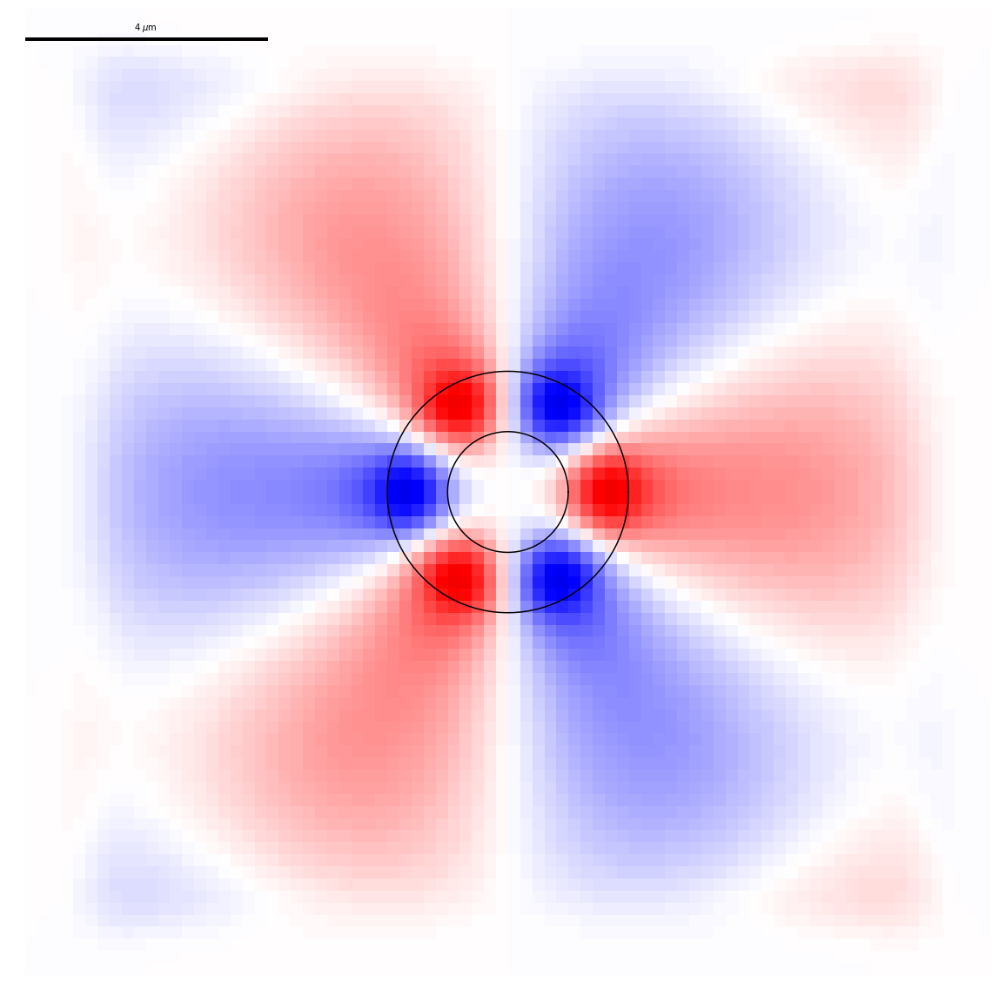

In [230]:
W = sxy
H = W
angles = np.linspace(0,2*np.pi,100);
global_max = np.max(arrays['ez'])
plt.figure(figsize=(sxy,sxy))
plt.imshow(arrays['ez'][:,:,10].transpose()/global_max,cmap='seismic',vmin=-1,vmax=1,extent=[-sxy/2,sxy/2,-sxy/2,sxy/2])
plt.plot([-W/2,-W/2+4],[H/2-0.5,H/2-0.5],'k',lw=4)
plt.plot(r*np.cos(angles),r*np.sin(angles),'k')
plt.plot((r+w)*np.cos(angles),(r+w)*np.sin(angles),'k')
plt.text(-W/2+2,H/2-0.4,'4 $\mu$m',ha='center',va='bottom')
plt.axis('off')
plt.tight_layout()
plt.show()
#!open example.png

43

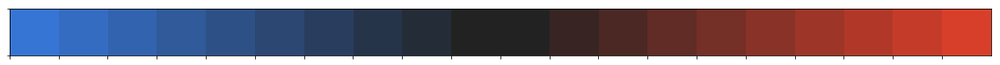

In [279]:
sns.palplot(sns.diverging_palette(255, 15, s=255/3, l=50,n=20, center="dark"))

In [267]:
inverted_seismic = ListedColormap(sns.diverging_palette(255, 15, s=255/3, l=50,n=100, center="dark").as_hex())

In [294]:

time_unit_in_fs = 10./3;

for j in range(10):
    print(j)
    filepath = '/Users/juan/Google Drive/Zia Lab/CEM/MEEP/ring-out/%d.h5' % j
    arrays = {}
    f = h5py.File(filepath)
    for k, v in f.items():
        print(k)
        arrays[k] = np.array(v)
    f.close()
    global_max = np.max(arrays['ez'])
    for i in range(arrays['ez'].shape[-1]):
        #print(i)
        plt.figure(figsize=(sxy/2,sxy/2))
        plt.imshow(arrays['ez'][:,:,i].transpose()/global_max,cmap=inverted_seismic,vmin=-1,vmax=1,extent=[-sxy/2,sxy/2,-sxy/2,sxy/2])
        plt.plot([-W/2+1,-W/2+5],[H/2-0.7,H/2-0.7],'w',lw=4)
        plt.plot(r*np.cos(angles),r*np.sin(angles),'w')
        plt.plot((r+w)*np.cos(angles),(r+w)*np.sin(angles),'w')
        plt.text(-W/2+2+1,H/2-0.5,'4 $\mu$m',color='white',ha='center',va='bottom')
        plt.text(-W/2+3,H/2-1.5,'%.1f fs' % (i*1/fcen/20*time_unit_in_fs),color='white',ha='center',va='bottom')
        plt.axis('off')
        plt.tight_layout()
        plt.savefig('./ring-out/ring-%d.png' % i)
        plt.close()
    os.system('ffmpeg -framerate 20 -i ./ring-out/ring-%%01d.png -c:v libx264 -profile:v high -vb 20M -pix_fmt yuv420p ./ring-out/ring-%d.mp4' % j)
    !rm ./ring-out/*.png

0
ez
1
ez
2
ez
3
ez
4
ez
5
ez
6
ez
7
ez
8
ez
9
ez


In [291]:
# ! say "Done"
# ! open longbend3p32um.mp4

0

## Benchmarks

In [63]:
testresults = {}
testresults['zialab-8'] = open('/Volumes/bilbo/meep/python/tests/testresults.txt','r').read()
testresults['benjamin'] = open('/Users/juan/Downloads/meep/python/tests/testresults.txt','r').read()
results = {}
for line in (re.sub('s\n','\n',re.sub('\n.*in ','\n',testresults['zialab-8'])).split('\n')):
    if 'test' in line:
        testname = line.split('.py')[0]
        results[testname] = []
    else:
        try:
            results[testname].append(float(line))
        except:
            pass
testresults['zialab-8'] = results
results = {}
for line in (re.sub('s\n','\n',re.sub('\n.*in ','\n',testresults['benjamin'])).split('\n')):
    if 'test' in line:
        testname = line.split('.py')[0]
        results[testname] = []
    else:
        try:
            results[testname].append(float(line))
        except:
            pass
testresults['benjamin'] = results

In [64]:
import pandas as pd

In [65]:
final_table = []
for test in testresults['zialab-8']:
    final_table.append([test,sum(testresults['zialab-8'][test]),sum(testresults['benjamin'][test])])
final_table = np.array(final_table)
pd.DataFrame(final_table,columns=['test','zialab-8','benjamin']).to_csv('/Users/juan/Google Drive/Zia Lab/CEM/MEEP/benchmark.csv')

## Fields in a Waveguide

### A Straight Waveguide

In [342]:
cell = mp.Vector3(16, 8, 0)

geometry = [mp.Block(mp.Vector3(1e20, 1, 1e20),
                     center=mp.Vector3(0, 0),
                     material=mp.Medium(epsilon=12))]

sources = [mp.Source(mp.ContinuousSource(frequency=0.15),
                     component=mp.Ez,
                     center=mp.Vector3(-7,0))]

pml_layers = [mp.PML(1.0)]

resolution = 10 # this means 10 pixels per um

sim = mp.Simulation(cell_size=cell,
                    boundary_layers=pml_layers,
                    geometry=geometry,
                    sources=sources,
                    resolution=resolution)

In [344]:
sim.run(until=200)

run 1 finished at t = 220.0 (4400 timesteps)


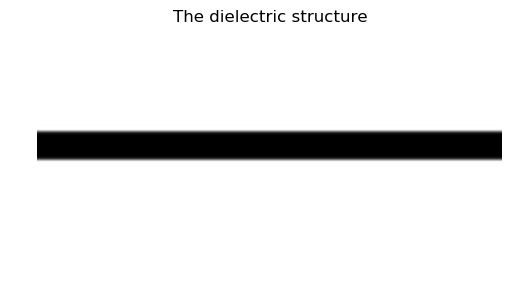

In [345]:
eps_data = sim.get_array(center=mp.Vector3(), size=cell, component=mp.Dielectric)
plt.figure(dpi=100)
plt.imshow(eps_data.transpose(), interpolation='spline36', cmap='binary')
plt.axis('off')
plt.title('The dielectric structure')
plt.show()

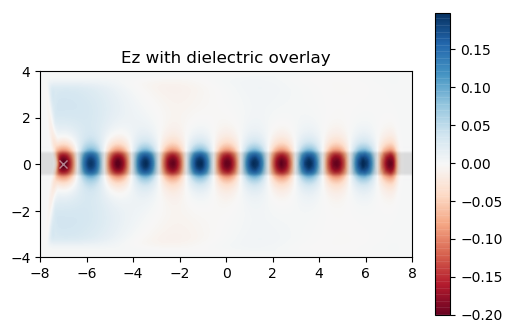

In [346]:
ez_data = sim.get_array(center=mp.Vector3(0,0,0), size=cell, component=mp.Ez)
plt.figure(dpi=100)
plt.imshow(eps_data.transpose(), interpolation='spline36', cmap='binary',extent=[-8,8,-4,4])
plt.imshow(ez_data.transpose(), interpolation='spline36', cmap='RdBu', alpha=0.9,extent=[-8,8,-4,4])
plt.plot([-7],[0],'xw',alpha=0.5)
plt.colorbar()
#plt.axis('off')
plt.title('Ez with dielectric overlay')
plt.show()

### A 90-degree bend

In [347]:
import meep as mp
cell = mp.Vector3(16, 16, 0)
geometry = [mp.Block(mp.Vector3(12, 1, 1e20),
                     center=mp.Vector3(-2.5, -3.5),
                         material=mp.Medium(epsilon=12)),
            mp.Block(mp.Vector3(1, 12, 1e20),
                     center=mp.Vector3(3.5, 2),
                     material=mp.Medium(epsilon=12))]
pml_layers = [mp.PML(1.0)]
resolution = 20
sources = [mp.Source(mp.ContinuousSource(wavelength=2*(11**0.5), width=20),
                     component=mp.Ez,
                     center=mp.Vector3(-7,-3.5),
                     size=mp.Vector3(0,1))]
sim = mp.Simulation(cell_size=cell,
                    boundary_layers=pml_layers,
                    geometry=geometry,
                    sources=sources,
                    resolution=resolution)

sim.run(mp.at_beginning(mp.output_epsilon),
        mp.to_appended("ez", mp.at_every(0.6, mp.output_efield_z)),
        until=200)

-----------
Initializing structure...
Meep progress: 37.35/200.0 = 18.7% done in 4.0s, 17.4s to go
Meep progress: 76.2/200.0 = 38.1% done in 8.0s, 13.0s to go
Meep progress: 115.05000000000001/200.0 = 57.5% done in 12.0s, 8.9s to go
Meep progress: 153.275/200.0 = 76.6% done in 16.0s, 4.9s to go
Meep progress: 191.4/200.0 = 95.7% done in 20.0s, 0.9s to go
run 0 finished at t = 200.0 (8000 timesteps)


In [122]:
! h5topng -t 0:329 -R -Zc dkbluered -a yarg -A eps-000000.00.h5 ez.h5
! convert ez.t*.png ez.gif
! open ez.gif

In [380]:
filepath = '/Users/juan/Google Drive/Zia Lab/CEM/LumericalFDTD/Examples/MetalensDesign - Raw/target_profile.mat'
arrays = {}
f = h5py.File(filepath)
for k, v in f.items():
    print(k)
    arrays[k] = np.array(v)
f.close()

Itarget
a
duty_cycle_mask
x_mask


In [ ]:
filepath = '/Users/juan/Google Drive/Zia Lab/CEM/MEEP/ez.h5'
arrays = {}
f = h5py.File(filepath)
for k, v in f.items():
    print(k)
    arrays[k] = np.array(v)
f.close()

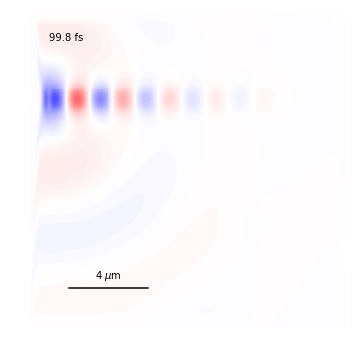

In [351]:
plt.figure(figsize=(5,5))
plt.imshow(arrays['ez'][:,:,100].transpose()/global_max,cmap='seismic',vmin=-1,vmax=1,extent=[-8,8,-8,8])
#plt.colorbar()
#plt.xlabel('x/$\mu$m')
plt.plot([-6,-2],[-6,-6],'k')
plt.text(-4,-5.5,'4 $\mu$m',ha='center')
plt.text(-7,6.5,'%.1f fs' % (i*0.6*1/3),ha='left')
plt.axis('off')
plt.tight_layout()
#plt.savefig('example.png')
plt.show()
#!open example.png

In [352]:
global_max = np.max(arrays['ez'])
!rm *.png
for i in range(333):
    print(i,end=', ')
    plt.figure(figsize=(5,5))
    plt.imshow(arrays['ez'][:,:,i].transpose()/global_max,cmap='seismic',vmin=-1,vmax=1,extent=[-8,8,-8,8])
    #plt.colorbar()
    plt.plot([-6,-2],[-6,-6],'k')
    plt.text(-4,-5.5,'4 $\mu$m',ha='center')
    plt.text(-7,6.5,'%.0f fs' % (i*0.6*10/3),ha='left')
    plt.axis('off')
    plt.savefig('bend-%d.png' % i,dpi=150)
    plt.close()

0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 

In [146]:
#! convert bend-*.png bend.gif

In [361]:
the_abs_max

0.27829825697975974

In [353]:
! rm bend.mp4
! ffmpeg -framerate 20 -i bend-%01d.png -c:v libx264 -profile:v high -vb 20M -pix_fmt yuv420p bend.mp4
! say "Done"
! open bend.mp4

ffmpeg version 4.0.2 Copyright (c) 2000-2018 the FFmpeg developers
  built with Apple LLVM version 9.1.0 (clang-902.0.39.2)
  configuration: --prefix=/usr/local/Cellar/ffmpeg/4.0.2 --enable-shared --enable-pthreads --enable-version3 --enable-hardcoded-tables --enable-avresample --cc=clang --host-cflags= --host-ldflags= --enable-gpl --enable-libmp3lame --enable-libx264 --enable-libxvid --enable-opencl --enable-videotoolbox --disable-lzma
  libavutil      56. 14.100 / 56. 14.100
  libavcodec     58. 18.100 / 58. 18.100
  libavformat    58. 12.100 / 58. 12.100
  libavdevice    58.  3.100 / 58.  3.100
  libavfilter     7. 16.100 /  7. 16.100
  libavresample   4.  0.  0 /  4.  0.  0
  libswscale      5.  1.100 /  5.  1.100
  libswresample   3.  1.100 /  3.  1.100
  libpostproc    55.  1.100 / 55.  1.100
Input #0, image2, from 'bend-%01d.png':
  Duration: 00:00:16.65, start: 0.000000, bitrate: N/A
    Stream #0:0: Video: png, rgba(pc), 750x750 [SAR 5905:5905 DAR 1:1], 20 fps, 20 tbr, 20 tbn,

In [150]:
! open bend.mp4

### A 90-degree bend - parametric model

In [317]:
# See lab notebook NVs, metalenses, and the like page 18 for the definition of all parameters.

W = 16.; # simulation area width
H = 30.; # simulation area height
p = 1.0; # PML border width
ww = 12.; # horizontal span of waveguide
wl = 25.; # vertical span of waveguide
b = 1.; # cross section of waveguide
e = 12.; # epsilon of waveguide
resolution = 10;
source_wavelength = 2*(11**0.5);
source_wavelength =3.32;
source_width = 15; # determines how quick the source ramps up
output_dt = 0.6; # in Meep units
time_unit_in_fs = 10./3;
simulation_time = 200; # in MEEP units


cell = mp.Vector3(W, H, 0)
geometry = [mp.Block(mp.Vector3(ww, b, 1e20),
                     center=mp.Vector3(-W/2 + ww/2, H/2 - wl),
                         material=mp.Medium(epsilon=e)),
            mp.Block(mp.Vector3(b, wl, 1e20),
                     center=mp.Vector3(-W/2+ww, H/2 - wl/2-b/2),
                     material=mp.Medium(epsilon=e))]
pml_layers = [mp.PML(b)]

sources = [mp.Source(mp.ContinuousSource(wavelength=source_wavelength, width=source_width),
                     component=mp.Ez,
                     center=mp.Vector3(-W/2+1,H/2 - wl),
                     size=mp.Vector3(0,b))]
sim = mp.Simulation(cell_size=cell,
                    boundary_layers=pml_layers,
                    geometry=geometry,
                    sources=sources,
                    resolution=resolution)
sim.use_output_directory('long-3p32um-out')
sim.run(mp.at_beginning(mp.output_epsilon),
        mp.to_appended("long-3p32um-ez", mp.at_every(output_dt, mp.output_efield_z)),
        until=simulation_time)

-----------
Initializing structure...
Meep: using output directory 'long-3p32um-out'
Meep progress: 111.85000000000001/200.0 = 55.9% done in 4.0s, 3.2s to go
run 0 finished at t = 200.0 (4000 timesteps)


In [318]:
# ! h5topng -t 0:329 -R -Zc dkbluered -a yarg -A eps-000000.00.h5 ez.h5
# ! convert ez.t*.png ez.gif
# ! open ez.gif

In [319]:
filepath = '/Users/juan/Google Drive/Zia Lab/CEM/MEEP/long-3p32um-out/long-3p32um-ez.h5'
arrays = {}
f = h5py.File(filepath)
for k, v in f.items():
    print(k)
    arrays[k] = np.array(v)
f.close()

ez


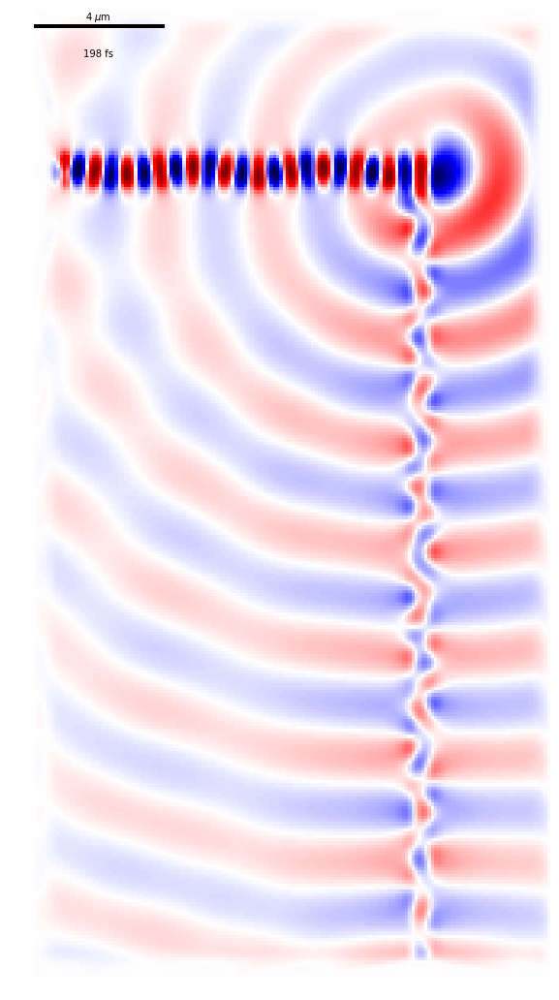

In [320]:
plt.figure(figsize=(W/2,H/2))
plt.imshow(arrays['ez'][:,:,300].transpose()/global_max,cmap='seismic',vmin=-1,vmax=1,extent=[-W/2,W/2,-H/2,H/2])
#plt.colorbar()
#plt.xlabel('x/$\mu$m')
plt.plot([-W/2,-W/2+4],[H/2-0.5,H/2-0.5],'k',lw=4)
plt.text(-W/2+2,H/2-0.4,'4 $\mu$m',ha='center',va='bottom')
plt.text(-W/2+2,H/2-1.5,'%.0f fs' % (i*output_dt*time_unit_in_fs),ha='center',va='bottom')
plt.axis('off')
plt.tight_layout()
#plt.savefig('example.png')
plt.show()
#!open example.png

In [321]:
global_max = np.max(arrays['ez'])
!rm *.png
for i in range(333):
    print(i,end=', ')
    plt.figure(figsize=(W/2,H/2))
    plt.imshow(arrays['ez'][:,:,i].transpose()/global_max,cmap='seismic',vmin=-1,vmax=1,extent=[-W/2,W/2,-H/2,H/2])
    #plt.colorbar()
    plt.plot([-W/2,-W/2+4],[H/2-0.5,H/2-0.5],'k',lw=4)
    plt.text(-W/2+2,H/2-0.4,'4 $\mu$m',ha='center',va='bottom')
    plt.text(-W/2+2,H/2-1.5,'%.0f fs' % (i*output_dt*time_unit_in_fs),ha='center',va='bottom')
    plt.axis('off')
    plt.tight_layout()
    plt.savefig('longbend-%d.png' % i,dpi=150)
    plt.close()

0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 

In [322]:
! rm longbend3p32um.mp4
! ffmpeg -framerate 20 -i longbend-%01d.png -c:v libx264 -profile:v high -vb 20M -pix_fmt yuv420p longbend3p32um.mp4
! say "Done"
! open longbend3p32um.mp4

rm: longbend3p32um.mp4: No such file or directory
ffmpeg version 4.0.2 Copyright (c) 2000-2018 the FFmpeg developers
  built with Apple LLVM version 9.1.0 (clang-902.0.39.2)
  configuration: --prefix=/usr/local/Cellar/ffmpeg/4.0.2 --enable-shared --enable-pthreads --enable-version3 --enable-hardcoded-tables --enable-avresample --cc=clang --host-cflags= --host-ldflags= --enable-gpl --enable-libmp3lame --enable-libx264 --enable-libxvid --enable-opencl --enable-videotoolbox --disable-lzma
  libavutil      56. 14.100 / 56. 14.100
  libavcodec     58. 18.100 / 58. 18.100
  libavformat    58. 12.100 / 58. 12.100
  libavdevice    58.  3.100 / 58.  3.100
  libavfilter     7. 16.100 /  7. 16.100
  libavresample   4.  0.  0 /  4.  0.  0
  libswscale      5.  1.100 /  5.  1.100
  libswresample   3.  1.100 /  3.  1.100
  libpostproc    55.  1.100 / 55.  1.100
Input #0, image2, from 'longbend-%01d.png':
  Duration: 00:00:16.65, start: 0.000000, bitrate: N/A
    Stream #0:0: Video: png, rgba(pc), 12

In [323]:
! pushover.py "Done"

### Transmittance Spectrum of a Waveguide Bend

In [324]:
resolution = 20 # pixels/um

sx = 16  # size of cell in X direction
sy = 32  # size of cell in Y direction
cell = mp.Vector3(sx,sy,0)

dpml = 1.0 # width of the PML
pml_layers = [mp.PML(dpml)]

pad = 4  # padding distance between waveguide and cell edge
w = 1    # width of waveguide

wvg_xcen =  0.5*(sx-w-2*pad)  # x center of horiz. wvg
wvg_ycen = -0.5*(sy-w-2*pad)  # y center of vert. wvg

geometry = [mp.Block(size=mp.Vector3(mp.inf,w,mp.inf),
                     center=mp.Vector3(0,wvg_ycen,0),
                     material=mp.Medium(epsilon=12))] # this sets up a straight waveguide

fcen = 0.25  # pulse center frequency
df = 0.4  # pulse width (in frequency)

sources = [mp.Source(mp.GaussianSource(fcen, fwidth=df), component=mp.Ez,
                     center=mp.Vector3(-0.5*sx+1,wvg_ycen,0), size=mp.Vector3(0,w,0))]

In [325]:
sim = mp.Simulation(cell_size=cell,
                    boundary_layers=pml_layers,
                    geometry=geometry,
                    sources=sources,
                    resolution=resolution)

nfreq = 100  # number of frequencies at which to compute flux

# reflected flux
refl_fr = mp.FluxRegion(center=mp.Vector3(-0.5*sx+dpml+0.5,wvg_ycen,0), size=mp.Vector3(0,2*w,0))                            
refl = sim.add_flux(fcen, df, nfreq, refl_fr)

# transmitted flux
tran_fr = mp.FluxRegion(center=mp.Vector3(0.5*sx-dpml,wvg_ycen,0), size=mp.Vector3(0,2*w,0))
tran = sim.add_flux(fcen, df, nfreq, tran_fr)

In [326]:
pt = mp.Vector3(0.5*sx-dpml-0.5,wvg_ycen)

sim.run(until_after_sources=mp.stop_when_fields_decayed(50,mp.Ez,pt,1e-3))

# for normalization run, save flux fields data for reflection plane
straight_refl_data = sim.get_flux_data(refl)

-----------
Initializing structure...
field decay(t = 50.025000000000006): 1.904268396801528e-07 / 1.904268396801528e-07 = 1.0
field decay(t = 100.05000000000001): 0.03141826598992077 / 0.03141826598992077 = 1.0
field decay(t = 150.07500000000002): 2.6825465375123995e-08 / 0.03141826598992077 = 8.538175016956639e-07
run 0 finished at t = 150.07500000000002 (6003 timesteps)


In [327]:
# save incident power for transmission plane
straight_tran_flux = mp.get_fluxes(tran)

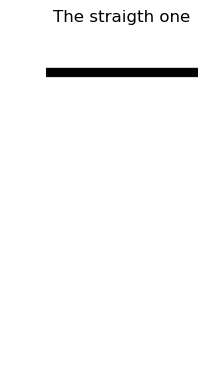

In [328]:
eps_data = sim.get_array(center=mp.Vector3(), size=cell, component=mp.Dielectric)
plt.figure(dpi=100)
plt.imshow(eps_data.transpose(), interpolation='spline36', cmap='binary')
plt.axis('off')
plt.title('The straigth one')
plt.show()

In [331]:
sim.reset_meep()

geometry = [mp.Block(mp.Vector3(sx-pad,w,mp.inf), center=mp.Vector3(-0.5*pad,wvg_ycen), material=mp.Medium(epsilon=12)),
            mp.Block(mp.Vector3(w,sy-pad,mp.inf), center=mp.Vector3(wvg_xcen,0.5*pad), material=mp.Medium(epsilon=12))]

sim = mp.Simulation(cell_size=cell,
                    boundary_layers=pml_layers,
                    geometry=geometry,
                    sources=sources,
                    resolution=resolution)

# reflected flux
refl = sim.add_flux(fcen, df, nfreq, refl_fr)

tran_fr = mp.FluxRegion(center=mp.Vector3(wvg_xcen,0.5*sy-dpml-0.5,0), size=mp.Vector3(2*w,0,0))
tran = sim.add_flux(fcen, df, nfreq, tran_fr)

# for normal run, load negated fields to subtract incident from refl. fields
sim.load_minus_flux_data(refl, straight_refl_data)

pt = mp.Vector3(wvg_xcen,0.5*sy-dpml-0.5)

sim.run(mp.to_appended("transmittance-spectrum-ez", mp.at_every(output_dt, mp.output_efield_z)),
        until_after_sources=mp.stop_when_fields_decayed(50, mp.Ez, pt, 1e-3))

bend_refl_flux = mp.get_fluxes(refl)
bend_tran_flux = mp.get_fluxes(tran)

flux_freqs = mp.get_flux_freqs(refl)

-----------
Initializing structure...
field decay(t = 50.025000000000006): 6.797999865369195e-07 / 6.797999865369195e-07 = 1.0
field decay(t = 100.05000000000001): 3.7511095157030906e-06 / 3.7511095157030906e-06 = 1.0
field decay(t = 150.07500000000002): 0.0003529337817292463 / 0.0003529337817292463 = 1.0
field decay(t = 200.10000000000002): 0.0004331755261059685 / 0.0004331755261059685 = 1.0
field decay(t = 250.125): 2.668071049938396e-06 / 0.0004331755261059685 = 0.006159330084788079
field decay(t = 300.15000000000003): 3.155810562583792e-13 / 0.0004331755261059685 = 7.285292848727978e-10
run 0 finished at t = 300.15000000000003 (12006 timesteps)


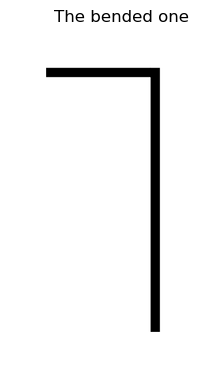

In [332]:
eps_data = sim.get_array(center=mp.Vector3(), size=cell, component=mp.Dielectric)
plt.figure(dpi=100)
plt.imshow(eps_data.transpose(), interpolation='spline36', cmap='binary')
plt.axis('off')
plt.title('The bended one')
plt.show()

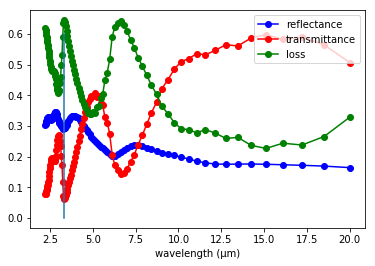

In [333]:
wl = [] # wavelengths
Rs = [] # reflectance
Ts = [] # transmittance

for i in range(nfreq):
    wl = np.append(wl, 1/flux_freqs[i])
    Rs = np.append(Rs,-bend_refl_flux[i]/straight_tran_flux[i])
    Ts = np.append(Ts,bend_tran_flux[i]/straight_tran_flux[i])  
    
wl = np.array(wl) # wavelengths
Rs = np.array(Rs) # reflectance
Ts = np.array(Ts) # transmittance

plt.plot(wl,Rs,'bo-',label='reflectance')
plt.plot(wl,Ts,'ro-',label='transmittance')
plt.plot(wl,1-Rs-Ts,'go-',label='loss')
#plt.axis([5.0, 10.0, 0, 1])
plt.xlabel("wavelength (μm)")
plt.legend(loc="upper right")
plt.plot([3.32,3.32],[0,0.6])
plt.show()

In [315]:
wl[wl>2.5][argmin(Ts[wl>2.5])]

3.327731092436975

In [334]:
filepath = '/Users/juan/Google Drive/Zia Lab/CEM/MEEP/transmittance-spectrum-ez.h5'
arrays = {}
f = h5py.File(filepath)
for k, v in f.items():
    print(k)
    arrays[k] = np.array(v)
f.close()

ez


In [335]:
!%pushdhover.py "Done Loading"

In [337]:
np.shape(arrays['ez'])

(320, 640, 500)

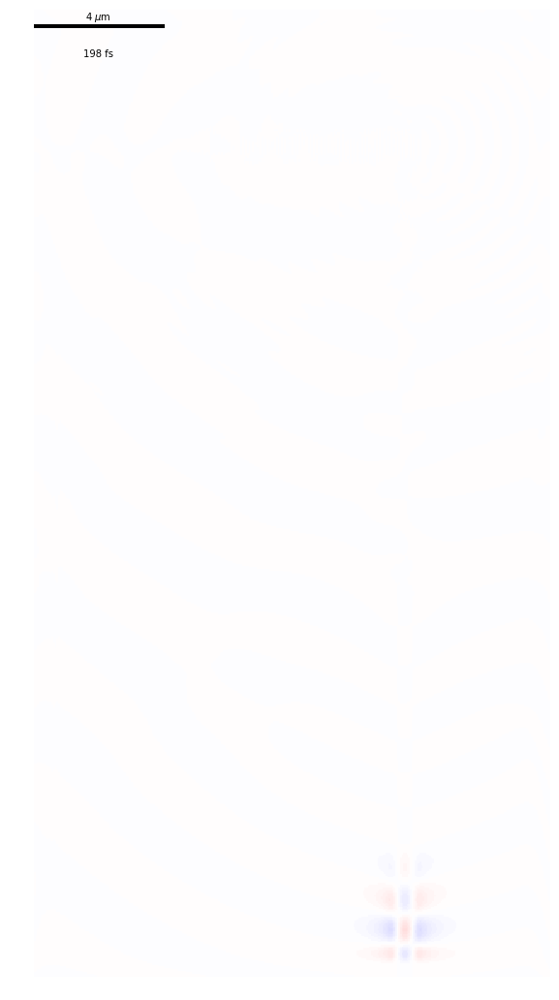

In [339]:
plt.figure(figsize=(W/2,H/2))
plt.imshow(arrays['ez'][:,:,300].transpose()/global_max,cmap='seismic',vmin=-1,vmax=1,extent=[-W/2,W/2,-H/2,H/2])
#plt.colorbar()
#plt.xlabel('x/$\mu$m')
plt.plot([-W/2,-W/2+4],[H/2-0.5,H/2-0.5],'k',lw=4)
plt.text(-W/2+2,H/2-0.4,'4 $\mu$m',ha='center',va='bottom')
plt.text(-W/2+2,H/2-1.5,'%.0f fs' % (i*output_dt*time_unit_in_fs),ha='center',va='bottom')
plt.axis('off')
plt.tight_layout()
#plt.savefig('example.png')
plt.show()
#!open example.png

In [340]:
global_max = np.max(arrays['ez'])
!rm *.png
for i in range(500):
    print(i,end=', ')
    plt.figure(figsize=(W/2,H/2))
    plt.imshow(arrays['ez'][:,:,i].transpose()/global_max,cmap='seismic',vmin=-1,vmax=1,extent=[-W/2,W/2,-H/2,H/2])
    #plt.colorbar()
    plt.plot([-W/2,-W/2+4],[H/2-0.5,H/2-0.5],'k',lw=4)
    plt.text(-W/2+2,H/2-0.4,'4 $\mu$m',ha='center',va='bottom')
    plt.text(-W/2+2,H/2-1.5,'%.0f fs' % (i*output_dt*time_unit_in_fs),ha='center',va='bottom')
    plt.axis('off')
    plt.tight_layout()
    plt.savefig('longbend-%d.png' % i,dpi=150)
    plt.close()

0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 

In [341]:
! rm gaussianpulse.mp4
! ffmpeg -framerate 20 -i longbend-%01d.png -c:v libx264 -profile:v high -vb 20M -pix_fmt yuv420p gaussianpulse.mp4
! say "Done"
! open gaussianpulse.mp4
! pushover.py "Done, please come back!"

rm: gaussianpulse.mp4: No such file or directory
ffmpeg version 4.0.2 Copyright (c) 2000-2018 the FFmpeg developers
  built with Apple LLVM version 9.1.0 (clang-902.0.39.2)
  configuration: --prefix=/usr/local/Cellar/ffmpeg/4.0.2 --enable-shared --enable-pthreads --enable-version3 --enable-hardcoded-tables --enable-avresample --cc=clang --host-cflags= --host-ldflags= --enable-gpl --enable-libmp3lame --enable-libx264 --enable-libxvid --enable-opencl --enable-videotoolbox --disable-lzma
  libavutil      56. 14.100 / 56. 14.100
  libavcodec     58. 18.100 / 58. 18.100
  libavformat    58. 12.100 / 58. 12.100
  libavdevice    58.  3.100 / 58.  3.100
  libavfilter     7. 16.100 /  7. 16.100
  libavresample   4.  0.  0 /  4.  0.  0
  libswscale      5.  1.100 /  5.  1.100
  libswresample   3.  1.100 /  3.  1.100
  libpostproc    55.  1.100 / 55.  1.100
Input #0, image2, from 'longbend-%01d.png':
  Duration: 00:00:25.00, start: 0.000000, bitrate: N/A
    Stream #0:0: Video: png, rgba(pc), 120

## Angular Reflectance Spectrum of a Planar Interface

In [371]:
import meep as mp
import argparse
import math

In [377]:
import meep as mp
import argparse
import math

def fresnel_reflection(resolution,theta):

    dpml = 1.0              # PML thickness
    sz = 10                 # size of computational cell (without PMLs)
    sz = 10 + 2*dpml
    cell_size = mp.Vector3(0,0,sz) # A 1d cell must be used since a higher-dimensional cell will introduce artificial modes due to band folding ...
    pml_layers = [mp.PML(dpml)]

    wvl_min = 0.4           # min wavelength
    wvl_max = 0.8           # max wavelength
    fmin = 1/wvl_max        # min frequency
    fmax = 1/wvl_min        # max frequency
    fcen = 0.5*(fmin+fmax)  # center frequency
    df = fmax-fmin          # frequency width
    nfreq = 50              # number of frequency bins

    # rotation angle (in degrees) of source: CCW around Y axis, 0 degrees along +Z axis
    theta_r = math.radians(theta)

    # plane of incidence is xz
    k = mp.Vector3(math.sin(theta_r),0,math.cos(theta_r)).scale(fmin)

    # if normal incidence, force number of dimensions to be 1
    if theta_r == 0:
        dimensions = 1
    else:
        dimensions = 3

    sources = [mp.Source(mp.GaussianSource(fcen,fwidth=df), component=mp.Ex, center=mp.Vector3(0,0,-0.5*sz+dpml))]

    sim = mp.Simulation(cell_size=cell_size,
                        boundary_layers=pml_layers,
                        sources=sources,
                        k_point=k,
                        dimensions=dimensions,
                        resolution=resolution)

    refl_fr = mp.FluxRegion(center=mp.Vector3(0,0,-0.25*sz))
    refl = sim.add_flux(fcen, df, nfreq, refl_fr)

    sim.run(until_after_sources=mp.stop_when_fields_decayed(50, mp.Ex, mp.Vector3(0,0,-0.5*sz+dpml), 1e-9))

    empty_flux = mp.get_fluxes(refl)
    empty_data = sim.get_flux_data(refl)
    sim.reset_meep()

    # add a block with n=3.5 for the air-dielectric interface
    geometry = [mp.Block(mp.Vector3(mp.inf,mp.inf,0.5*sz), center=mp.Vector3(0,0,0.25*sz), material=mp.Medium(index=3.5))]

    sim = mp.Simulation(cell_size=cell_size,
                        geometry=geometry,
                        boundary_layers=pml_layers,
                        sources=sources,
                        k_point=k,
                        dimensions=dimensions,
                        resolution=resolution)

    refl = sim.add_flux(fcen, df, nfreq, refl_fr)
    sim.load_minus_flux_data(refl, empty_data)

    sim.run(until_after_sources=mp.stop_when_fields_decayed(50, mp.Ex, mp.Vector3(0,0,-0.5*sz+dpml), 1e-9))

    refl_flux = mp.get_fluxes(refl)
    freqs = mp.get_flux_freqs(refl)

    for i in range(nfreq):
        print("refl:, {}, {}, {}, {}".format(k.x,1/freqs[i],math.degrees(math.asin(k.x/freqs[i])),-refl_flux[i]/empty_flux[i]))

# if __name__ == '__main__':
#     parser = argparse.ArgumentParser()
#     parser.add_argument('-res', type=int, default=200, help='resolution (default: 200 pixels/um)')
#     parser.add_argument('-theta', type=float, default=0, help='angle of incident planewave (default: 0 degrees)')
#     args = parser.parse_args()
#     main(args)

In [378]:
fresnel_reflection(res=200,theta=10)

-----------
Initializing structure...
Meep: using complex fields.
field decay(t = 50.0025): 0.24680346547139523 / 0.24680346547139523 = 1.0
field decay(t = 100.0025): 1.0108276814497774e-13 / 0.24680346547139523 = 4.095678638543807e-13
run 0 finished at t = 100.0025 (40001 timesteps)
-----------
Initializing structure...
Meep: using complex fields.
field decay(t = 50.0025): 0.2468034654557062 / 0.2468034654557062 = 1.0
field decay(t = 100.0025): 5.474718295546227e-13 / 0.2468034654557062 = 2.218250171421833e-12
run 0 finished at t = 100.0025 (40001 timesteps)
refl:, 0.2170602220836629, 0.8, 10.0, 0.3024039726449619
refl:, 0.2170602220836629, 0.784, 9.798006528153513, 0.3025865782488689
refl:, 0.2170602220836629, 0.7686274509803922, 9.604050171837292, 0.3027558215329863
refl:, 0.2170602220836629, 0.7538461538461539, 9.417658416993296, 0.3029123186299432
refl:, 0.2170602220836629, 0.739622641509434, 9.238395240840497, 0.30305718103286494
refl:, 0.2170602220836629, 0.7259259259259259, 9.0

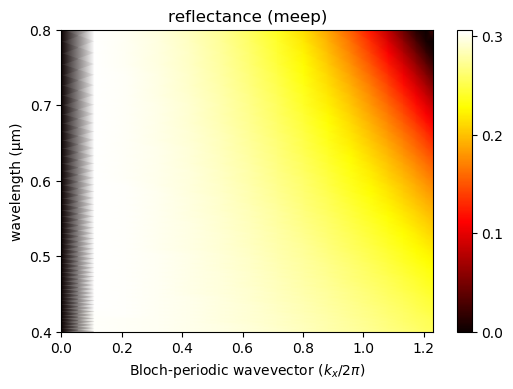

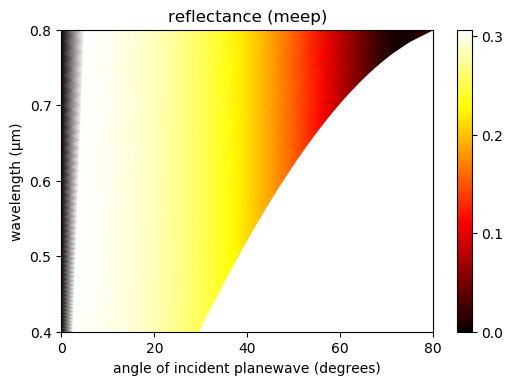

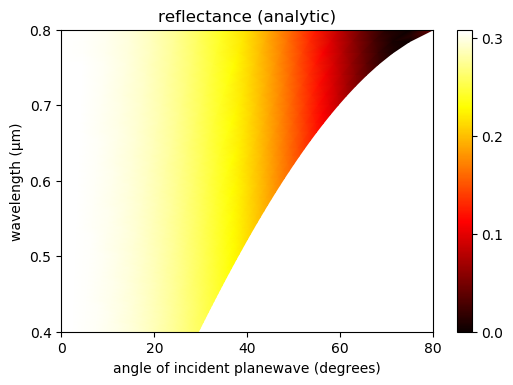

In [370]:
import math
import numpy.matlib

theta_in = np.arange(0,85,5)
kxs = np.empty((50,theta_in.size))
thetas = np.empty((50,theta_in.size))
Rmeep = np.empty((50,theta_in.size))

for j in range(1,theta_in.size):
    f = np.genfromtxt("flux_t{}.dat".format(theta_in[j]), delimiter=",")
    #print(np.shape(f))
    kxs[:,j] = f[:,0]
    thetas[:,j] = f[:,2]
    Rmeep[:,j] = f[:,3]

wvl = f[:,1]
# create a 2d matrix for the wavelength by repeating the column vector for each angle
wvls = np.matlib.repmat(np.reshape(wvl, (wvl.size,1)),1,theta_in.size)

plt.figure(dpi=100)
plt.pcolormesh(kxs, wvls, Rmeep, cmap='hot', shading='gouraud', vmin=0, vmax=Rmeep.max())
plt.axis([kxs[0,0], kxs[0,-1], wvl[-1], wvl[0]])
plt.yticks([t for t in np.arange(0.4,0.9,0.1)])
plt.xlabel("Bloch-periodic wavevector ($k_x/2π$)")
plt.ylabel("wavelength (μm)")
plt.title("reflectance (meep)")
cbar = plt.colorbar()
cbar.set_ticks([t for t in np.arange(0,0.4,0.1)])
cbar.set_ticklabels(["{:.1f}".format(t) for t in np.arange(0,0.4,0.1)])
plt.show()

plt.figure(dpi=100)
plt.pcolormesh(thetas, wvls, Rmeep, cmap='hot', shading='gouraud', vmin=0, vmax=Rmeep.max())
plt.axis([thetas.min(), thetas.max(), wvl[-1], wvl[0]])
plt.xticks([t for t in range(0,100,20)])
plt.yticks([t for t in np.arange(0.4,0.9,0.1)])
plt.xlabel("angle of incident planewave (degrees)")
plt.ylabel("wavelength (μm)")
plt.title("reflectance (meep)")
cbar = plt.colorbar()
cbar.set_ticks([t for t in np.arange(0,0.4,0.1)])
cbar.set_ticklabels(["{:.1f}".format(t) for t in np.arange(0,0.4,0.1)])
plt.show()

n1=1
n2=3.5

# compute angle of refracted planewave in medium n2
# for incident planewave in medium n1 at angle theta_in
theta_out = lambda theta_in: math.asin(n1*math.sin(theta_in)/n2)

# compute Fresnel reflectance for P-polarization in medium n2
# for incident planewave in medium n1 at angle theta_in
Rfresnel = lambda theta_in: math.fabs((n1*math.cos(theta_out(theta_in))-n2*math.cos(theta_in))/(n1*math.cos(theta_out(theta_in))+n2*math.cos(theta_in)))**2

Ranalytic = np.empty((50, theta_in.size))
for m in range(wvl.size):
    for n in range(theta_in.size):
        Ranalytic[m,n] = Rfresnel(math.radians(thetas[m,n]))

plt.figure(dpi=100)
plt.pcolormesh(thetas, wvls, Ranalytic, cmap='hot', shading='gouraud', vmin=0, vmax=Ranalytic.max())
plt.axis([thetas.min(), thetas.max(), wvl[-1], wvl[0]])
plt.xticks([t for t in range(0,100,20)])
plt.yticks([t for t in np.arange(0.4,0.9,0.1)])
plt.xlabel("angle of incident planewave (degrees)")
plt.ylabel("wavelength (μm)")
plt.title("reflectance (analytic)")
cbar = plt.colorbar()
cbar.set_ticks([t for t in np.arange(0,0.4,0.1)])
cbar.set_ticklabels(["{:.1f}".format(t) for t in np.arange(0,0.4,0.1)])
plt.show()

In [379]:
# This example creates an approximate Ez-polarized planewave in vacuum
# propagating at a 45-degree angle, by using a couple of current sources
# with amplitude exp(ikx) corresponding to the desired planewave.
from __future__ import division

import cmath
import math
import meep as mp


s = 11  # the size of the computational cell, not including PML
dpml = 1  # thickness of PML layers

sxy = s + 2 * dpml  # cell size, including PML
cell = mp.Vector3(sxy, sxy, 0)

pml_layers = [mp.PML(dpml)]
resolution = 10


# pw-amp is a function that returns the amplitude exp(ik(x+x0)) at a
# given point x.  (We need the x0 because current amplitude functions
# in Meep are defined relative to the center of the current source,
# whereas we want a fixed origin.)  Actually, it is a function of k
# and x0 that returns a function of x ...
def pw_amp(k, x0):
    def _pw_amp(x):
        return cmath.exp(1j * k.dot(x + x0))
    return _pw_amp

fcen = 0.8  # pulse center frequency
df = 0.02  # turn-on bandwidth
kdir = mp.Vector3(1, 1)  # direction of k (length is irrelevant)
n = 1 # refractive index of material containing the source
k = kdir.unit().scale(2 * math.pi * fcen * n)  # k with correct length

sources = [
    mp.Source(
        mp.ContinuousSource(fcen, fwidth=df),
        component=mp.Ez,
        center=mp.Vector3(-0.5 * s, 0),
        size=mp.Vector3(0, s),
        amp_func=pw_amp(k, mp.Vector3(x=-0.5 * s))
    ),
    mp.Source(
        mp.ContinuousSource(fcen, fwidth=df),
        component=mp.Ez,
        center=mp.Vector3(0, -0.5 * s),
        size=mp.Vector3(s, 0),
        amp_func=pw_amp(k, mp.Vector3(y=-0.5 * s))
    )
]

sim = mp.Simulation(
    cell_size=cell,
    sources=sources,
    boundary_layers=pml_layers,
    resolution=resolution
)

t = 400  # run time
sim.run(mp.at_end(mp.output_efield_z), until=t)

-----------
Initializing structure...
run 0 finished at t = 400.0 (8000 timesteps)
